### Decision Analytics Final Project
# PRT Bus Scheduling
### Annie Xie, Marisa Yang, Yuxuan Liu
### Data Cleaning

In [1]:
import pandas as pd
import geopandas as gpd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import gurobipy as gp

#!pip install census 
#!pip install us
from census import Census
from us import states
from shapely.geometry import Point, Polygon
from pyproj import CRS

In [2]:
df = pd.read_csv('wprdc_stop_data.csv')
schedule = pd.read_csv('schedule_daily_agg.csv', low_memory = False)

In [3]:
# focus on inbound stops and weekday
df = df[(df.datekey == 202104)&
        ((df.direction == "Inbound") | (df.direction == 'Both')) &
        (df.serviceday == "Weekday")]

In [4]:
df.head(5)

,clever_id,stop_id,stop_name,direction,routes_ser,latitude,longitude,mode,shelter,stop_type,datekey,time_period,route_name,serviceday,total_ons,total_offs,days,avg_ons,avg_offs
14,7858,E02110,5TH ST AT CAVIT AVE,Inbound,"69, P69",40.3858,-79.7600,Bus,No Shelter,Bus Stop,202104,Pandemic,69,Weekday,36.0,2.0,22,1.636364,0.090909
15,7858,E02110,5TH ST AT CAVIT AVE,Inbound,"69, P69",40.3858,-79.7600,Bus,No Shelter,Bus Stop,202104,Pandemic,P69,Weekday,6.0,0.0,22,0.272727,0.000000
30,20792,E02430,7TH ST AT PROSPECT AVE,Inbound,"69, P69",40.3864,-79.7525,Bus,No Shelter,Bus Stop,202104,Pandemic,69,Weekday,0.0,0.0,22,0.000000,0.000000
31,20792,E02430,7TH ST AT PROSPECT AVE,Inbound,"69, P69",40.3864,-79.7525,Bus,No Shelter,Bus Stop,202104,Pandemic,P69,Weekday,0.0,0.0,22,0.000000,0.000000
46,20790,E20030,FOREST AVE AT 6TH ST,Inbound,"69, P69",40.3868,-79.7576,Bus,No Shelter,Bus Stop,202104,Pandemic,69,Weekday,12.0,2.0,22,0.545455,0.090909


In [5]:
df = df.dropna()

In [6]:
route_set = df.route_name.unique()
stopid_set = df.stop_id.unique()
route_stopid_rider = pd.DataFrame(index = list(route_set), columns = list(stopid_set))#R_ij

In [7]:
stop_routes_dict = {}
for index, row in df.iterrows():
    stop_id = row['stop_id']
    routes_ser = set(route.strip() for route in row['routes_ser'].split(','))   # Split the string into a set of routes
    stop_routes_dict[stop_id] = routes_ser

In [8]:
route_stopid = dict.fromkeys(route_set, "") #j_i
route_stopcount = dict.fromkeys(route_set, 0) #J_i

In [9]:
# get R_ij for each route and each stop on this route
for i in range(len(df)):
    stop_id = df.iloc[i, df.columns.get_loc("stop_id")]
    route_name = str(df.iloc[i, df.columns.get_loc("route_name")])
    route_stopid[route_name] += stop_id + ','
    route_stopcount[route_name] += 1
    direction = str(df.iloc[i, df.columns.get_loc("direction")])
    if direction == 'Both':
        route_stopid_rider.loc[route_name, stop_id] = df.iloc[i, df.columns.get_loc("avg_ons")]/2
    else:
        route_stopid_rider.loc[route_name, stop_id] = df.iloc[i, df.columns.get_loc("avg_ons")]

In [10]:
route_stopid_rider.head()

,E02110,E02430,E20030,E20050,E70825,E70826,E70827,E70828,E70829,N01830,...,E39160,E39190,E39200,E45030,E53240,E53290,E53300,E56995,E70960,E70980
69,1.636364,0.0,0.545455,0.136364,4.659091,2.863636,0.045455,0.045455,0.0,NaN,...,0.954546,1.909091,0.454545,1.0,0.704546,1.909091,3.204546,0.227273,1.409091,1.75
P69,0.272727,0.0,0.0,0.090909,1.0,0.545455,0.0,0.0,0.0,NaN,...,0.181818,0.681818,0.227273,0.090909,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.318182,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
44,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
route_info = pd.DataFrame(index = list(route_set), columns = ['stopid', 'stopcount']).reset_index()

In [12]:
for i in range(len(route_info)):
    route_info.iloc[i, 1] = route_stopid[route_info.iloc[i, 0]]
    route_info.iloc[i, 2] = route_stopcount[route_info.iloc[i, 0]]

In [13]:
route_info.columns = ['RouteCode', 'Stopids','Stopcount']

In [14]:
filtered_schedule = schedule[schedule["Date"] == "2021-03-19"].copy()
filtered_schedule.loc[:, "per_trip_time"] = filtered_schedule["Trip_Mins"] / filtered_schedule["Trip.Count"]

In [15]:
filtered_schedule.head()

,PickID,Date,DayType,Route,Service.Context,Trp.Dist.,Trip.Count,Trip_Mins,Schedule_Join,RouteCode,per_trip_time
139359,2011,2021-03-19,Weekday,001,Base,1692.062,69,5859.66,Base_Weekday,1,84.922609
139360,2011,2021-03-19,Weekday,002,Base,985.120,53,3453.30,Base_Weekday,2,65.156604
139361,2011,2021-03-19,Weekday,004,Base,301.680,40,1287.90,Base_Weekday,4,32.197500
139362,2011,2021-03-19,Weekday,006,Base,309.104,63,1999.14,Base_Weekday,6,31.732381
139363,2011,2021-03-19,Weekday,007,Base,67.374,12,315.96,Base_Weekday,7,26.330000


In [16]:
# remove the metro
filtered_schedule = filtered_schedule[~filtered_schedule['RouteCode'].isin(['RED','BLUE','SLVR'])]

In [17]:
# remove a duplicate
filtered_schedule = filtered_schedule[~filtered_schedule.duplicated(subset = ["RouteCode"], keep = "first")]

In [18]:
filtered_schedule = filtered_schedule.reset_index()

In [19]:
merged_route_info = route_info.merge(filtered_schedule, on = 'RouteCode')

In [20]:
# merge route info, which contains routecode, trip count, stop count, 
# average trip time, and each stop id (will be used in data viz)
merged_route_info.head()

,RouteCode,Stopids,Stopcount,index,PickID,Date,DayType,Route,Service.Context,Trp.Dist.,Trip.Count,Trip_Mins,Schedule_Join,per_trip_time
0,69,"E02110,E02430,E20030,E20050,E70825,E70826,E708...",149,139393,2011,2021-03-19,Weekday,069,Base,936.617,51,3961.92,Base_Weekday,77.684706
1,P69,"E02110,E02430,E20030,E20050,E70825,E70826,E708...",85,139446,2011,2021-03-19,Weekday,P69,Base,151.992,12,529.08,Base_Weekday,44.090000
2,1,"N01830,N01935,N03995,N27620,N20770,N20930,N210...",121,139359,2011,2021-03-19,Weekday,001,Base,1692.062,69,5859.66,Base_Weekday,84.922609
3,14,"N05685,N33490,N33540,N33560,N33580,N33595,N336...",70,139368,2011,2021-03-19,Weekday,014,Base,1098.834,66,3106.86,Base_Weekday,47.073636
4,44,"S45000,S70437,S70441,S70489,S70490,S70491,S704...",80,139426,2011,2021-03-19,Weekday,44,Base,766.359,66,3460.20,Base_Weekday,52.427273


#### Calculate $R_{i,j_i,t_i}$
Each route will have a dataframe stored in a dictionary route_df_collection. Each dataframe will have the columns as the stops of each route and the index as the number of trips each route was scheduled. 

We assume that buses are dispatched at regular intervals, divided into five daily periods. The number of riders in these five periods (\#1, \#2, \#3, \#4, \#5) are proportioned as 1, 3, 2, 3, and 1, respectively, to reflect morning and evening rush hours. Say that throughout the day there are 20 rides for 61C. Then in each period, there will be 20 * 1/5 = 4 rides. And we have estimated there will be 40 riders that go on 61C at stop $j$. Then in period \#1, there will be 40 * 1 / (1+3+2+3+1) = 4 riders, which means about 1 rider per ride. In period \#2, there will be 40 * 3/10 = 12 riders, which 
means about 3 riders per ride.

$$R_{i,j_i,t_i} = \frac{R_{i,j_i} * p}{T_i/5}, where$$

\begin{align*}
    p & = 1/10 \text{, if }  \frac{t_i}{T_i} < 0.2 \text{ or } > 0.8\\
 & = 2/10 \text{, if } 0.4 <  \frac{t_i}{T_i} < 0.6\\
 & = 3/10 \text{, for other } \frac{t_i}{T_i}
\end{align*}

In [21]:
def create_route_df(i, merged_route_info, route_stopid_rider):
    routecode = merged_route_info.loc[i, "RouteCode"]
    tripcount = merged_route_info.loc[i, "Trip.Count"] // 2
    R_ij = route_stopid_rider.loc[routecode].dropna()
    route_df = pd.DataFrame(index = np.arange(0, tripcount), columns = R_ij.index)
    for t in range(tripcount):
        ratio = t / tripcount

        if ratio < 0.2 or ratio > 0.8:
            p = 1/10
        elif 0.4 <= ratio <= 0.6:
            p = 2/10
        else:
            p = 3/10
        
        R_ijt = R_ij * p / (tripcount/5)
        route_df.iloc[t,] = R_ijt
    return route_df

In [22]:
route_df_collection = {}

In [23]:
for i in range(len(merged_route_info)):
    routecode = merged_route_info.loc[i, "RouteCode"]
    route_df_collection[routecode] = create_route_df(i, merged_route_info, route_stopid_rider)

### Optimization Formulation
#### Objective Function
Notice $C$ is a constant that stands for operating cost per minute.
$$\text{Maximize}\sum_{i=1}^{I}\sum_{j_i=1}^{J_i}\sum_{t_i=1}^{T_i}R_{i,j_i,t_i}X_{i,j_i,t_i}*price - \sum_{i=1}^{I}\sum_{t_i=1}^{T_i}(\frac{\sum_{j_i=1}^{J_i}X_{i,j_i,t_i}}{J_i})*C*Time_i $$

In [24]:
params = {
"WLSACCESSID": '902b5959-51a7-4529-a2a2-3dc4c8a5052a',
"WLSSECRET": 'dbd9c5cd-8b98-4ab7-a9c4-bbcc6814ee78',
"LICENSEID": 2411593,
}
env = gp.Env(params=params)

Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2411593
Academic license 2411593 - for non-commercial use only - registered to fu___@andrew.cmu.edu


We have three-dimensional decision variables. $X_{i,j_i,t_i}$ is a binary variable that will be set to 1 if route $i$ stops at stop $j_i$ and on the $t_i$th trip. Note that the values of $j_i$ and $t_i$ depend on route $i$, so we need to generate dependencies.

In [25]:
# generate the indices
R = route_df_collection
routes = list(merged_route_info['RouteCode'])
stops = {}
trips = {}
Time = {}
for i in range(len(routes)):
    route = routes[i]
    stops[route] = int(merged_route_info[merged_route_info['RouteCode'] == route].loc[:,'Stopcount'])
    trips[route] = int(merged_route_info[merged_route_info['RouteCode'] == route].loc[:,'Trip.Count'])//2
    Time[route] = float(merged_route_info[merged_route_info['RouteCode'] == route].loc[:,'per_trip_time'])

#### Constraints
Each stop must be passed by at least one route, i.e., for each stop $j$, $\sum_{i}\sum_{t_i=1}^{T_i}X_{i,j,t_i} > 0$

Stops located in relatively poor census blocks must be passed at least 10 times per day, i.e., for certain stops,
$\sum_{i}\sum_{t_i=1}^{T_i}X_{i,j,t_i} >= 10$. To implement this set of constraints, we need to first get the census-tract-level poverty and minority rates from American Community Survey (ACS). We called the Census API, accessed the relevant variables in the Allegheny County in 2021, and merged the information with the bus stop locations based on the coordinates.

In [26]:
c = Census("f6f2b37e3cd103ee4b0b6607377b22e364f16b21")

In [27]:
al_census = c.acs5.state_county_tract(fields = ('NAME',
                                                'B01001_001E', # population
                                                'B17001_002E', # poverty 
                                                'B01001A_001E'), # white population
                                      state_fips = states.PA.fips,
                                      county_fips = "003",
                                      tract = "*",
                                      year = 2021)
al_df = pd.DataFrame(al_census)
al_df.head()

,NAME,B01001_001E,B17001_002E,B01001A_001E,state,county,tract
0,"Census Tract 103.01, Allegheny County, Pennsyl...",2526.0,0.0,975.0,42,003,010301
1,"Census Tract 103.02, Allegheny County, Pennsyl...",4180.0,333.0,3162.0,42,003,010302
2,"Census Tract 201, Allegheny County, Pennsylvania",4621.0,328.0,3282.0,42,003,020100
3,"Census Tract 203, Allegheny County, Pennsylvania",1383.0,127.0,1192.0,42,003,020300
4,"Census Tract 305, Allegheny County, Pennsylvania",2815.0,937.0,891.0,42,003,030500


In [28]:
al_df['poverty_rate'] = al_df['B17001_002E']/al_df['B01001_001E']
al_df['minority_rate'] = 1 - al_df['B01001A_001E']/al_df['B01001_001E']

In [29]:
cols = list(al_df.columns)
cols[-3] = 'TRACTCE20'
al_df.columns = cols

In [30]:
#block = gpd.read_file("tl_2020_42003_tabblock20/tl_2020_42003_tabblock20.shp")
tract = gpd.read_file("tl_2020_42003_tract20/tl_2020_42003_tract20.shp")

In [31]:
merged_tract = tract.merge(al_df, on = "TRACTCE20")

In [32]:
merged_tract[['poverty_rate', 'minority_rate']].mean()

poverty_rate     0.126905
minority_rate    0.241585
dtype: float64

In [33]:
# create a dataframe with only the stop ids and their coordinates
stop_df = df[['stop_id', 'longitude', 'latitude']].reset_index(drop = True)
stop_df = stop_df.drop_duplicates().reset_index(drop = True)

In [34]:
# create a GeoDataFrame with the coordinates
geometry=[Point(xy) for xy in zip(stop_df["longitude"], stop_df["latitude"])]
crs= CRS('epsg:4326')
stop_map = gpd.GeoDataFrame(stop_df,crs=crs, geometry=geometry)

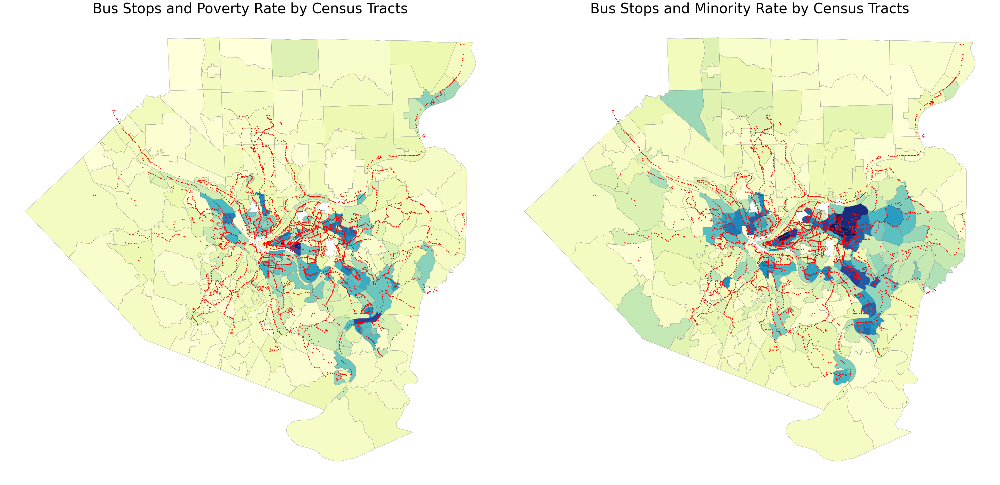

In [246]:
# plot the bus stops with census tract info
fig, ax = plt.subplots(1, 2, figsize = (40, 20))

merged_tract.plot(ax = ax[0], column = "poverty_rate", cmap = "YlGnBu", edgecolor = "grey", linewidth = 0.5)#, edgecolor = "black")
merged_tract.plot(ax = ax[1], column = "minority_rate", cmap = "YlGnBu", edgecolor = "grey", linewidth = 0.5)#, edgecolor = "black")

stop_map.plot(ax = ax[0], color = "red", markersize = 5)
stop_map.plot(ax = ax[1], color = "red", markersize = 5)
ax[0].set_title("Bus Stops and Poverty Rate by Census Tracts", fontsize = 40)
ax[1].set_title("Bus Stops and Minority Rate by Census Tracts", fontsize = 40)
ax[0].set_axis_off()
ax[1].set_axis_off()
fig.tight_layout()
#fig.suptitle("Poverty Rate and Minority Rate by Census Tracts", fontsize = 40)


In [36]:
stop_map['poverty_rate'] = 0
stop_map['minority_rate'] = 0

In [37]:
# merge the stop locations and the census tract info of this stop
for i in range(len(stop_map)):
    stop_coords = stop_map.loc[i, 'geometry']
    for j in range(len(merged_tract)):
        if merged_tract.loc[j, 'geometry'].contains(stop_coords):
            stop_map.loc[i, 'poverty_rate'] = merged_tract.loc[j, 'poverty_rate']
            stop_map.loc[i, 'minority_rate'] = merged_tract.loc[j, 'minority_rate']
            break

In [38]:
stop_map.sample(5)

,stop_id,longitude,latitude,geometry,poverty_rate,minority_rate
3489,S20112,-79.9206,40.4043,POINT (-79.92060 40.40430),0.141840,0.235487
1665,S14670,-79.9991,40.4040,POINT (-79.99910 40.40400),0.340775,0.611293
2810,S00750,-79.9432,40.4070,POINT (-79.94320 40.40700),0.386567,0.560075
3074,W20442,-80.1720,40.4534,POINT (-80.17200 40.45340),0.049712,0.153117
1168,N70173,-79.8909,40.4970,POINT (-79.89090 40.49700),0.031714,0.126656


In [39]:
stop_map[['poverty_rate', 'minority_rate']].mean()

poverty_rate     0.163101
minority_rate    0.317807
dtype: float64

### Model to optimize scheduling

In [239]:
# Create the model within the Gurobi environment
model = gp.Model('Bus_Scheduling', env=env)

# Set constants
ticket_price = 2.75
avg_cost = 1
pov_threshold = 0.1
min_threshold = 0.2
min_passes = 10

# Set DVs
X = {}
for i in range(len(routes)):
    for j in range(stops[routes[i]]):
        for t in range(trips[routes[i]]):
            X[i, j, t] = model.addVar(name=f"route_{i}_stop_{j}_trip_{t}", vtype=gp.GRB.BINARY)
        

In [240]:
# Set the objective function
objective = (
    sum(
        R[routes[i]].iloc[t, j] * X[i, j, t] * ticket_price
        for i in range(len(routes))
        for j in range(stops[routes[i]])
        for t in range(trips[routes[i]])
    )
    - sum(
        (
            sum(X[i, j, t] for j in range(stops[routes[i]]))
            / stops[routes[i]]
            * avg_cost
            * Time[routes[i]]
        )
        for i in range(len(routes))
        for t in range(trips[routes[i]])
    )
)

model.setObjective(objective, gp.GRB.MAXIMIZE)

In [241]:
# Add 3 types of constraints
# model.remove(model.getConstrs())
# Type 1: each stop must be passed at least once
for stop_id, routes_set in stop_routes_dict.items():
    total_count = 0
    flag1 = 0
    for route in routes_set:
        if route in routes:
            i = routes.index(route)
            # make sure the stop is passed by the route
            if stop_id in R[route].columns:
                flag1 = 1
                j = R[route].columns.get_loc(stop_id)
                for t in range(trips[route]):
                    total_count += X[i,j,t]
    if flag1 == 1:
        model.addConstr(total_count >= 1, name = f"must_pass_constraint_{stop_id}")

# Type 2: each stop must be passed at least 10 times if local poverty rate is higher than 9%
#         if the scheduled stops < 10, then they all should be passed
    if (stop_map[stop_map.stop_id == stop_id].poverty_rate).all() > pov_threshold:
        total_count_pov = 0
        max_count_pov = 0
        flag2 = 0
        for route in routes_set:
            if route in routes:
                i = routes.index(route)
                if stop_id in R[route].columns:
                    flag2 = 1
                    j = R[route].columns.get_loc(stop_id)
                    for t in range(trips[route]):
                        total_count_pov += X[i,j,t]
                        max_count_pov += 1
        if flag2 == 1:
            model.addConstr(total_count_pov >= min(max_count_pov, min_passes), name=f"pov_constraint_{stop_id}")
        
# Type 3: each stop must be passed at least 10 times if local minority rate is higher than 20%
    if (stop_map[stop_map.stop_id == stop_id].minority_rate).all() > min_threshold:
        total_count_min = 0
        max_count_min = 0
        flag3 = 0
        for route in routes_set:
            if route in routes:
                i = routes.index(route)
                if stop_id in R[route].columns:
                    flag = 3
                    j = R[route].columns.get_loc(stop_id)
                    for t in range(trips[route]):
                        total_count_min += X[i,j,t]
                        max_count_min += 1
        if flag3 == 1:
            model.addConstr(total_count_min >= min(max_count_min, min_passes), name=f"minority_constraint_{stop_id}")

#### Optimization

In [242]:
# Optimize the model
model.optimize()

Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[x86] - Darwin 18.7.0 18G103)

CPU model: Intel(R) Core(TM) i5-5257U CPU @ 2.70GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Academic license 2411593 - for non-commercial use only - registered to fu___@andrew.cmu.edu
Optimize a model with 7621 rows, 226783 columns and 445233 nonzeros
Model fingerprint: 0x4816c817
Variable types: 0 continuous, 226783 integer (226783 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e-04, 1e+01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+01]
Found heuristic solution: objective 10721.481517
Presolve removed 2649 rows and 200243 columns
Presolve time: 0.16s
Presolved: 4972 rows, 26540 columns, 51593 nonzeros
Found heuristic solution: objective 11270.100529
Variable types: 0 continuous, 26540 integer (3372 binary)
Found heuristic solution: objective 13299.126674

Root relaxation: interrupted, 0 iterations, 0.00 

#### Results
Gather summary results for each route.

In [243]:
# gather the optimal solutions for each route
stopcount = 0
cnt = 0
# the policy for each route will be stored the dictionary below
route_result_collection = {}
for i in range(len(routes)):
    route = routes[i]
    temp_res = np.zeros((stops[route], trips[route]))
    for j in range(stops[routes[i]]):
        for t in range(trips[routes[i]]):
            cnt += 1
            temp_res[j, t] = int(X[i, j, t].x)
            if int(X[i,j,t].x) == 1:
                stopcount += 1
            print(f"x_route#{routes[i]}_stop#{j}_trip#{t} = {X[i, j, t].x}")
    route_result_collection[route] = temp_res

x_route#69_stop#0_trip#0 = 0.0
x_route#69_stop#0_trip#1 = 0.0
x_route#69_stop#0_trip#2 = 0.0
x_route#69_stop#0_trip#3 = 0.0
x_route#69_stop#0_trip#4 = -0.0
x_route#69_stop#0_trip#5 = 0.0
x_route#69_stop#0_trip#6 = 0.0
x_route#69_stop#0_trip#7 = 0.0
x_route#69_stop#0_trip#8 = 0.0
x_route#69_stop#0_trip#9 = -0.0
x_route#69_stop#0_trip#10 = 0.0
x_route#69_stop#0_trip#11 = 0.0
x_route#69_stop#0_trip#12 = 0.0
x_route#69_stop#0_trip#13 = 0.0
x_route#69_stop#0_trip#14 = 0.0
x_route#69_stop#0_trip#15 = -0.0
x_route#69_stop#0_trip#16 = 0.0
x_route#69_stop#0_trip#17 = 0.0
x_route#69_stop#0_trip#18 = 0.0
x_route#69_stop#0_trip#19 = 0.0
x_route#69_stop#0_trip#20 = 1.0
x_route#69_stop#0_trip#21 = 0.0
x_route#69_stop#0_trip#22 = 0.0
x_route#69_stop#0_trip#23 = 0.0
x_route#69_stop#0_trip#24 = 0.0
x_route#69_stop#1_trip#0 = 0.0
x_route#69_stop#1_trip#1 = 0.0
x_route#69_stop#1_trip#2 = -0.0
x_route#69_stop#1_trip#3 = 0.0
x_route#69_stop#1_trip#4 = -0.0
x_route#69_stop#1_trip#5 = 0.0
x_route#69_stop#1_t

x_route#69_stop#14_trip#8 = 1.0
x_route#69_stop#14_trip#9 = 1.0
x_route#69_stop#14_trip#10 = 0.0
x_route#69_stop#14_trip#11 = 0.0
x_route#69_stop#14_trip#12 = 0.0
x_route#69_stop#14_trip#13 = 0.0
x_route#69_stop#14_trip#14 = 0.0
x_route#69_stop#14_trip#15 = -0.0
x_route#69_stop#14_trip#16 = 1.0
x_route#69_stop#14_trip#17 = 1.0
x_route#69_stop#14_trip#18 = 1.0
x_route#69_stop#14_trip#19 = 1.0
x_route#69_stop#14_trip#20 = 1.0
x_route#69_stop#14_trip#21 = 0.0
x_route#69_stop#14_trip#22 = 0.0
x_route#69_stop#14_trip#23 = 0.0
x_route#69_stop#14_trip#24 = 0.0
x_route#69_stop#15_trip#0 = 0.0
x_route#69_stop#15_trip#1 = 0.0
x_route#69_stop#15_trip#2 = 0.0
x_route#69_stop#15_trip#3 = 0.0
x_route#69_stop#15_trip#4 = 0.0
x_route#69_stop#15_trip#5 = 1.0
x_route#69_stop#15_trip#6 = 1.0
x_route#69_stop#15_trip#7 = 1.0
x_route#69_stop#15_trip#8 = 1.0
x_route#69_stop#15_trip#9 = 1.0
x_route#69_stop#15_trip#10 = 1.0
x_route#69_stop#15_trip#11 = 1.0
x_route#69_stop#15_trip#12 = 1.0
x_route#69_stop#15_tr

x_route#69_stop#56_trip#2 = 0.0
x_route#69_stop#56_trip#3 = 0.0
x_route#69_stop#56_trip#4 = 0.0
x_route#69_stop#56_trip#5 = 0.0
x_route#69_stop#56_trip#6 = 0.0
x_route#69_stop#56_trip#7 = 0.0
x_route#69_stop#56_trip#8 = 0.0
x_route#69_stop#56_trip#9 = 0.0
x_route#69_stop#56_trip#10 = 0.0
x_route#69_stop#56_trip#11 = 0.0
x_route#69_stop#56_trip#12 = 0.0
x_route#69_stop#56_trip#13 = 0.0
x_route#69_stop#56_trip#14 = 0.0
x_route#69_stop#56_trip#15 = 0.0
x_route#69_stop#56_trip#16 = 0.0
x_route#69_stop#56_trip#17 = 0.0
x_route#69_stop#56_trip#18 = 0.0
x_route#69_stop#56_trip#19 = 0.0
x_route#69_stop#56_trip#20 = 0.0
x_route#69_stop#56_trip#21 = 0.0
x_route#69_stop#56_trip#22 = 0.0
x_route#69_stop#56_trip#23 = 0.0
x_route#69_stop#56_trip#24 = -0.0
x_route#69_stop#57_trip#0 = 0.0
x_route#69_stop#57_trip#1 = 0.0
x_route#69_stop#57_trip#2 = 0.0
x_route#69_stop#57_trip#3 = 0.0
x_route#69_stop#57_trip#4 = 0.0
x_route#69_stop#57_trip#5 = 0.0
x_route#69_stop#57_trip#6 = 0.0
x_route#69_stop#57_trip#

x_route#69_stop#71_trip#8 = 1.0
x_route#69_stop#71_trip#9 = 1.0
x_route#69_stop#71_trip#10 = 1.0
x_route#69_stop#71_trip#11 = 1.0
x_route#69_stop#71_trip#12 = 1.0
x_route#69_stop#71_trip#13 = 1.0
x_route#69_stop#71_trip#14 = 1.0
x_route#69_stop#71_trip#15 = 1.0
x_route#69_stop#71_trip#16 = 1.0
x_route#69_stop#71_trip#17 = 1.0
x_route#69_stop#71_trip#18 = 1.0
x_route#69_stop#71_trip#19 = 1.0
x_route#69_stop#71_trip#20 = 1.0
x_route#69_stop#71_trip#21 = 0.0
x_route#69_stop#71_trip#22 = 0.0
x_route#69_stop#71_trip#23 = 0.0
x_route#69_stop#71_trip#24 = 0.0
x_route#69_stop#72_trip#0 = 0.0
x_route#69_stop#72_trip#1 = 0.0
x_route#69_stop#72_trip#2 = 0.0
x_route#69_stop#72_trip#3 = 0.0
x_route#69_stop#72_trip#4 = -0.0
x_route#69_stop#72_trip#5 = 1.0
x_route#69_stop#72_trip#6 = 1.0
x_route#69_stop#72_trip#7 = 1.0
x_route#69_stop#72_trip#8 = 1.0
x_route#69_stop#72_trip#9 = 1.0
x_route#69_stop#72_trip#10 = 0.0
x_route#69_stop#72_trip#11 = 0.0
x_route#69_stop#72_trip#12 = 0.0
x_route#69_stop#72_tr

x_route#69_stop#85_trip#7 = 0.0
x_route#69_stop#85_trip#8 = 0.0
x_route#69_stop#85_trip#9 = -0.0
x_route#69_stop#85_trip#10 = 0.0
x_route#69_stop#85_trip#11 = -0.0
x_route#69_stop#85_trip#12 = 0.0
x_route#69_stop#85_trip#13 = 0.0
x_route#69_stop#85_trip#14 = 0.0
x_route#69_stop#85_trip#15 = 0.0
x_route#69_stop#85_trip#16 = 0.0
x_route#69_stop#85_trip#17 = 0.0
x_route#69_stop#85_trip#18 = 0.0
x_route#69_stop#85_trip#19 = 0.0
x_route#69_stop#85_trip#20 = 0.0
x_route#69_stop#85_trip#21 = -0.0
x_route#69_stop#85_trip#22 = 0.0
x_route#69_stop#85_trip#23 = 0.0
x_route#69_stop#85_trip#24 = 0.0
x_route#69_stop#86_trip#0 = -0.0
x_route#69_stop#86_trip#1 = 0.0
x_route#69_stop#86_trip#2 = 0.0
x_route#69_stop#86_trip#3 = 0.0
x_route#69_stop#86_trip#4 = 0.0
x_route#69_stop#86_trip#5 = 1.0
x_route#69_stop#86_trip#6 = 1.0
x_route#69_stop#86_trip#7 = 1.0
x_route#69_stop#86_trip#8 = 1.0
x_route#69_stop#86_trip#9 = 1.0
x_route#69_stop#86_trip#10 = 0.0
x_route#69_stop#86_trip#11 = -0.0
x_route#69_stop#86

x_route#69_stop#115_trip#15 = 0.0
x_route#69_stop#115_trip#16 = -0.0
x_route#69_stop#115_trip#17 = 0.0
x_route#69_stop#115_trip#18 = 0.0
x_route#69_stop#115_trip#19 = 0.0
x_route#69_stop#115_trip#20 = 0.0
x_route#69_stop#115_trip#21 = -0.0
x_route#69_stop#115_trip#22 = 0.0
x_route#69_stop#115_trip#23 = 0.0
x_route#69_stop#115_trip#24 = 0.0
x_route#69_stop#116_trip#0 = 0.0
x_route#69_stop#116_trip#1 = 0.0
x_route#69_stop#116_trip#2 = 0.0
x_route#69_stop#116_trip#3 = 0.0
x_route#69_stop#116_trip#4 = -0.0
x_route#69_stop#116_trip#5 = 1.0
x_route#69_stop#116_trip#6 = 1.0
x_route#69_stop#116_trip#7 = 1.0
x_route#69_stop#116_trip#8 = 1.0
x_route#69_stop#116_trip#9 = 1.0
x_route#69_stop#116_trip#10 = 0.0
x_route#69_stop#116_trip#11 = 0.0
x_route#69_stop#116_trip#12 = 0.0
x_route#69_stop#116_trip#13 = 0.0
x_route#69_stop#116_trip#14 = 0.0
x_route#69_stop#116_trip#15 = -0.0
x_route#69_stop#116_trip#16 = 0.0
x_route#69_stop#116_trip#17 = 0.0
x_route#69_stop#116_trip#18 = 0.0
x_route#69_stop#116_

x_route#69_stop#128_trip#2 = 0.0
x_route#69_stop#128_trip#3 = 0.0
x_route#69_stop#128_trip#4 = 0.0
x_route#69_stop#128_trip#5 = 0.0
x_route#69_stop#128_trip#6 = 0.0
x_route#69_stop#128_trip#7 = 0.0
x_route#69_stop#128_trip#8 = 0.0
x_route#69_stop#128_trip#9 = 0.0
x_route#69_stop#128_trip#10 = -0.0
x_route#69_stop#128_trip#11 = 0.0
x_route#69_stop#128_trip#12 = 0.0
x_route#69_stop#128_trip#13 = 0.0
x_route#69_stop#128_trip#14 = 0.0
x_route#69_stop#128_trip#15 = 0.0
x_route#69_stop#128_trip#16 = -0.0
x_route#69_stop#128_trip#17 = 0.0
x_route#69_stop#128_trip#18 = 0.0
x_route#69_stop#128_trip#19 = 0.0
x_route#69_stop#128_trip#20 = 0.0
x_route#69_stop#128_trip#21 = 0.0
x_route#69_stop#128_trip#22 = 0.0
x_route#69_stop#128_trip#23 = 0.0
x_route#69_stop#128_trip#24 = 0.0
x_route#69_stop#129_trip#0 = 0.0
x_route#69_stop#129_trip#1 = 0.0
x_route#69_stop#129_trip#2 = 0.0
x_route#69_stop#129_trip#3 = 0.0
x_route#69_stop#129_trip#4 = 0.0
x_route#69_stop#129_trip#5 = 0.0
x_route#69_stop#129_trip#6

x_route#69_stop#140_trip#16 = 1.0
x_route#69_stop#140_trip#17 = 1.0
x_route#69_stop#140_trip#18 = 1.0
x_route#69_stop#140_trip#19 = 1.0
x_route#69_stop#140_trip#20 = 1.0
x_route#69_stop#140_trip#21 = 0.0
x_route#69_stop#140_trip#22 = 0.0
x_route#69_stop#140_trip#23 = 0.0
x_route#69_stop#140_trip#24 = 0.0
x_route#69_stop#141_trip#0 = 0.0
x_route#69_stop#141_trip#1 = 0.0
x_route#69_stop#141_trip#2 = 0.0
x_route#69_stop#141_trip#3 = 0.0
x_route#69_stop#141_trip#4 = -0.0
x_route#69_stop#141_trip#5 = 0.0
x_route#69_stop#141_trip#6 = 0.0
x_route#69_stop#141_trip#7 = 0.0
x_route#69_stop#141_trip#8 = 1.0
x_route#69_stop#141_trip#9 = 1.0
x_route#69_stop#141_trip#10 = 0.0
x_route#69_stop#141_trip#11 = 0.0
x_route#69_stop#141_trip#12 = 0.0
x_route#69_stop#141_trip#13 = 0.0
x_route#69_stop#141_trip#14 = 0.0
x_route#69_stop#141_trip#15 = -0.0
x_route#69_stop#141_trip#16 = 1.0
x_route#69_stop#141_trip#17 = 1.0
x_route#69_stop#141_trip#18 = 1.0
x_route#69_stop#141_trip#19 = 1.0
x_route#69_stop#141_tr

x_route#P69_stop#12_trip#5 = 0.0
x_route#P69_stop#13_trip#0 = 0.0
x_route#P69_stop#13_trip#1 = 0.0
x_route#P69_stop#13_trip#2 = -0.0
x_route#P69_stop#13_trip#3 = 0.0
x_route#P69_stop#13_trip#4 = 0.0
x_route#P69_stop#13_trip#5 = -0.0
x_route#P69_stop#14_trip#0 = 0.0
x_route#P69_stop#14_trip#1 = 0.0
x_route#P69_stop#14_trip#2 = 0.0
x_route#P69_stop#14_trip#3 = 0.0
x_route#P69_stop#14_trip#4 = 0.0
x_route#P69_stop#14_trip#5 = -0.0
x_route#P69_stop#15_trip#0 = 0.0
x_route#P69_stop#15_trip#1 = 0.0
x_route#P69_stop#15_trip#2 = 1.0
x_route#P69_stop#15_trip#3 = 1.0
x_route#P69_stop#15_trip#4 = 1.0
x_route#P69_stop#15_trip#5 = 0.0
x_route#P69_stop#16_trip#0 = -0.0
x_route#P69_stop#16_trip#1 = 0.0
x_route#P69_stop#16_trip#2 = 0.0
x_route#P69_stop#16_trip#3 = 0.0
x_route#P69_stop#16_trip#4 = 0.0
x_route#P69_stop#16_trip#5 = 0.0
x_route#P69_stop#17_trip#0 = 0.0
x_route#P69_stop#17_trip#1 = 0.0
x_route#P69_stop#17_trip#2 = 0.0
x_route#P69_stop#17_trip#3 = 0.0
x_route#P69_stop#17_trip#4 = 0.0
x_rout

x_route#1_stop#13_trip#5 = 0.0
x_route#1_stop#13_trip#6 = -0.0
x_route#1_stop#13_trip#7 = 1.0
x_route#1_stop#13_trip#8 = 1.0
x_route#1_stop#13_trip#9 = 1.0
x_route#1_stop#13_trip#10 = 1.0
x_route#1_stop#13_trip#11 = 1.0
x_route#1_stop#13_trip#12 = 1.0
x_route#1_stop#13_trip#13 = 1.0
x_route#1_stop#13_trip#14 = 0.0
x_route#1_stop#13_trip#15 = 0.0
x_route#1_stop#13_trip#16 = 0.0
x_route#1_stop#13_trip#17 = 0.0
x_route#1_stop#13_trip#18 = 0.0
x_route#1_stop#13_trip#19 = 0.0
x_route#1_stop#13_trip#20 = -0.0
x_route#1_stop#13_trip#21 = 0.0
x_route#1_stop#13_trip#22 = 0.0
x_route#1_stop#13_trip#23 = 0.0
x_route#1_stop#13_trip#24 = 0.0
x_route#1_stop#13_trip#25 = 1.0
x_route#1_stop#13_trip#26 = 1.0
x_route#1_stop#13_trip#27 = 1.0
x_route#1_stop#13_trip#28 = 0.0
x_route#1_stop#13_trip#29 = 0.0
x_route#1_stop#13_trip#30 = 0.0
x_route#1_stop#13_trip#31 = 0.0
x_route#1_stop#13_trip#32 = 0.0
x_route#1_stop#13_trip#33 = 0.0
x_route#1_stop#14_trip#0 = 0.0
x_route#1_stop#14_trip#1 = 0.0
x_route#1_sto

x_route#1_stop#21_trip#23 = 0.0
x_route#1_stop#21_trip#24 = 0.0
x_route#1_stop#21_trip#25 = 0.0
x_route#1_stop#21_trip#26 = 0.0
x_route#1_stop#21_trip#27 = 0.0
x_route#1_stop#21_trip#28 = 0.0
x_route#1_stop#21_trip#29 = 0.0
x_route#1_stop#21_trip#30 = 0.0
x_route#1_stop#21_trip#31 = 0.0
x_route#1_stop#21_trip#32 = 0.0
x_route#1_stop#21_trip#33 = -0.0
x_route#1_stop#22_trip#0 = 0.0
x_route#1_stop#22_trip#1 = -0.0
x_route#1_stop#22_trip#2 = 0.0
x_route#1_stop#22_trip#3 = 0.0
x_route#1_stop#22_trip#4 = 0.0
x_route#1_stop#22_trip#5 = 0.0
x_route#1_stop#22_trip#6 = 0.0
x_route#1_stop#22_trip#7 = 0.0
x_route#1_stop#22_trip#8 = 0.0
x_route#1_stop#22_trip#9 = -0.0
x_route#1_stop#22_trip#10 = 0.0
x_route#1_stop#22_trip#11 = 0.0
x_route#1_stop#22_trip#12 = 0.0
x_route#1_stop#22_trip#13 = 0.0
x_route#1_stop#22_trip#14 = -0.0
x_route#1_stop#22_trip#15 = 0.0
x_route#1_stop#22_trip#16 = 0.0
x_route#1_stop#22_trip#17 = 0.0
x_route#1_stop#22_trip#18 = 0.0
x_route#1_stop#22_trip#19 = 0.0
x_route#1_stop

x_route#1_stop#34_trip#11 = -0.0
x_route#1_stop#34_trip#12 = 0.0
x_route#1_stop#34_trip#13 = 0.0
x_route#1_stop#34_trip#14 = 0.0
x_route#1_stop#34_trip#15 = -0.0
x_route#1_stop#34_trip#16 = 0.0
x_route#1_stop#34_trip#17 = 0.0
x_route#1_stop#34_trip#18 = 0.0
x_route#1_stop#34_trip#19 = 0.0
x_route#1_stop#34_trip#20 = 0.0
x_route#1_stop#34_trip#21 = 0.0
x_route#1_stop#34_trip#22 = 0.0
x_route#1_stop#34_trip#23 = -0.0
x_route#1_stop#34_trip#24 = 0.0
x_route#1_stop#34_trip#25 = 0.0
x_route#1_stop#34_trip#26 = 0.0
x_route#1_stop#34_trip#27 = 0.0
x_route#1_stop#34_trip#28 = 0.0
x_route#1_stop#34_trip#29 = 0.0
x_route#1_stop#34_trip#30 = 0.0
x_route#1_stop#34_trip#31 = 0.0
x_route#1_stop#34_trip#32 = 0.0
x_route#1_stop#34_trip#33 = 0.0
x_route#1_stop#35_trip#0 = -0.0
x_route#1_stop#35_trip#1 = 0.0
x_route#1_stop#35_trip#2 = 0.0
x_route#1_stop#35_trip#3 = 0.0
x_route#1_stop#35_trip#4 = -0.0
x_route#1_stop#35_trip#5 = 0.0
x_route#1_stop#35_trip#6 = 0.0
x_route#1_stop#35_trip#7 = 1.0
x_route#1_s

x_route#1_stop#42_trip#12 = 1.0
x_route#1_stop#42_trip#13 = 1.0
x_route#1_stop#42_trip#14 = 1.0
x_route#1_stop#42_trip#15 = 1.0
x_route#1_stop#42_trip#16 = 1.0
x_route#1_stop#42_trip#17 = 1.0
x_route#1_stop#42_trip#18 = 1.0
x_route#1_stop#42_trip#19 = 1.0
x_route#1_stop#42_trip#20 = 1.0
x_route#1_stop#42_trip#21 = 1.0
x_route#1_stop#42_trip#22 = 1.0
x_route#1_stop#42_trip#23 = 1.0
x_route#1_stop#42_trip#24 = 1.0
x_route#1_stop#42_trip#25 = 1.0
x_route#1_stop#42_trip#26 = 1.0
x_route#1_stop#42_trip#27 = 1.0
x_route#1_stop#42_trip#28 = 0.0
x_route#1_stop#42_trip#29 = 0.0
x_route#1_stop#42_trip#30 = 0.0
x_route#1_stop#42_trip#31 = 0.0
x_route#1_stop#42_trip#32 = 0.0
x_route#1_stop#42_trip#33 = 0.0
x_route#1_stop#43_trip#0 = 0.0
x_route#1_stop#43_trip#1 = 0.0
x_route#1_stop#43_trip#2 = 0.0
x_route#1_stop#43_trip#3 = 0.0
x_route#1_stop#43_trip#4 = 0.0
x_route#1_stop#43_trip#5 = 0.0
x_route#1_stop#43_trip#6 = -0.0
x_route#1_stop#43_trip#7 = 0.0
x_route#1_stop#43_trip#8 = 0.0
x_route#1_stop#4

x_route#1_stop#69_trip#20 = 1.0
x_route#1_stop#69_trip#21 = 1.0
x_route#1_stop#69_trip#22 = 1.0
x_route#1_stop#69_trip#23 = 1.0
x_route#1_stop#69_trip#24 = 1.0
x_route#1_stop#69_trip#25 = 1.0
x_route#1_stop#69_trip#26 = 1.0
x_route#1_stop#69_trip#27 = 1.0
x_route#1_stop#69_trip#28 = 0.0
x_route#1_stop#69_trip#29 = 0.0
x_route#1_stop#69_trip#30 = 0.0
x_route#1_stop#69_trip#31 = 0.0
x_route#1_stop#69_trip#32 = 0.0
x_route#1_stop#69_trip#33 = 0.0
x_route#1_stop#70_trip#0 = 0.0
x_route#1_stop#70_trip#1 = 0.0
x_route#1_stop#70_trip#2 = 0.0
x_route#1_stop#70_trip#3 = 0.0
x_route#1_stop#70_trip#4 = 0.0
x_route#1_stop#70_trip#5 = 0.0
x_route#1_stop#70_trip#6 = -0.0
x_route#1_stop#70_trip#7 = 0.0
x_route#1_stop#70_trip#8 = 0.0
x_route#1_stop#70_trip#9 = 0.0
x_route#1_stop#70_trip#10 = 0.0
x_route#1_stop#70_trip#11 = 0.0
x_route#1_stop#70_trip#12 = 0.0
x_route#1_stop#70_trip#13 = 0.0
x_route#1_stop#70_trip#14 = 0.0
x_route#1_stop#70_trip#15 = 0.0
x_route#1_stop#70_trip#16 = 0.0
x_route#1_stop#70

x_route#1_stop#78_trip#28 = 0.0
x_route#1_stop#78_trip#29 = 0.0
x_route#1_stop#78_trip#30 = 0.0
x_route#1_stop#78_trip#31 = 0.0
x_route#1_stop#78_trip#32 = 0.0
x_route#1_stop#78_trip#33 = 0.0
x_route#1_stop#79_trip#0 = 0.0
x_route#1_stop#79_trip#1 = 0.0
x_route#1_stop#79_trip#2 = 0.0
x_route#1_stop#79_trip#3 = 0.0
x_route#1_stop#79_trip#4 = 0.0
x_route#1_stop#79_trip#5 = 0.0
x_route#1_stop#79_trip#6 = 0.0
x_route#1_stop#79_trip#7 = 0.0
x_route#1_stop#79_trip#8 = 0.0
x_route#1_stop#79_trip#9 = 0.0
x_route#1_stop#79_trip#10 = 0.0
x_route#1_stop#79_trip#11 = 0.0
x_route#1_stop#79_trip#12 = 0.0
x_route#1_stop#79_trip#13 = 0.0
x_route#1_stop#79_trip#14 = 0.0
x_route#1_stop#79_trip#15 = 0.0
x_route#1_stop#79_trip#16 = 0.0
x_route#1_stop#79_trip#17 = 0.0
x_route#1_stop#79_trip#18 = 0.0
x_route#1_stop#79_trip#19 = 0.0
x_route#1_stop#79_trip#20 = 0.0
x_route#1_stop#79_trip#21 = 0.0
x_route#1_stop#79_trip#22 = 0.0
x_route#1_stop#79_trip#23 = 0.0
x_route#1_stop#79_trip#24 = 0.0
x_route#1_stop#79_

x_route#1_stop#90_trip#17 = 0.0
x_route#1_stop#90_trip#18 = 0.0
x_route#1_stop#90_trip#19 = 0.0
x_route#1_stop#90_trip#20 = -0.0
x_route#1_stop#90_trip#21 = 0.0
x_route#1_stop#90_trip#22 = 0.0
x_route#1_stop#90_trip#23 = 0.0
x_route#1_stop#90_trip#24 = 0.0
x_route#1_stop#90_trip#25 = 0.0
x_route#1_stop#90_trip#26 = 0.0
x_route#1_stop#90_trip#27 = 0.0
x_route#1_stop#90_trip#28 = 0.0
x_route#1_stop#90_trip#29 = 0.0
x_route#1_stop#90_trip#30 = 0.0
x_route#1_stop#90_trip#31 = 0.0
x_route#1_stop#90_trip#32 = 0.0
x_route#1_stop#90_trip#33 = 0.0
x_route#1_stop#91_trip#0 = 0.0
x_route#1_stop#91_trip#1 = 0.0
x_route#1_stop#91_trip#2 = 0.0
x_route#1_stop#91_trip#3 = 0.0
x_route#1_stop#91_trip#4 = 0.0
x_route#1_stop#91_trip#5 = 0.0
x_route#1_stop#91_trip#6 = 0.0
x_route#1_stop#91_trip#7 = 1.0
x_route#1_stop#91_trip#8 = 1.0
x_route#1_stop#91_trip#9 = 1.0
x_route#1_stop#91_trip#10 = 1.0
x_route#1_stop#91_trip#11 = 1.0
x_route#1_stop#91_trip#12 = 1.0
x_route#1_stop#91_trip#13 = 1.0
x_route#1_stop#91

x_route#1_stop#100_trip#15 = 0.0
x_route#1_stop#100_trip#16 = 0.0
x_route#1_stop#100_trip#17 = 0.0
x_route#1_stop#100_trip#18 = 0.0
x_route#1_stop#100_trip#19 = -0.0
x_route#1_stop#100_trip#20 = 0.0
x_route#1_stop#100_trip#21 = 1.0
x_route#1_stop#100_trip#22 = 1.0
x_route#1_stop#100_trip#23 = 1.0
x_route#1_stop#100_trip#24 = 1.0
x_route#1_stop#100_trip#25 = 1.0
x_route#1_stop#100_trip#26 = 1.0
x_route#1_stop#100_trip#27 = 1.0
x_route#1_stop#100_trip#28 = 0.0
x_route#1_stop#100_trip#29 = 0.0
x_route#1_stop#100_trip#30 = 0.0
x_route#1_stop#100_trip#31 = 0.0
x_route#1_stop#100_trip#32 = 0.0
x_route#1_stop#100_trip#33 = -0.0
x_route#1_stop#101_trip#0 = 0.0
x_route#1_stop#101_trip#1 = 0.0
x_route#1_stop#101_trip#2 = 0.0
x_route#1_stop#101_trip#3 = 0.0
x_route#1_stop#101_trip#4 = 0.0
x_route#1_stop#101_trip#5 = 0.0
x_route#1_stop#101_trip#6 = -0.0
x_route#1_stop#101_trip#7 = 0.0
x_route#1_stop#101_trip#8 = 1.0
x_route#1_stop#101_trip#9 = 1.0
x_route#1_stop#101_trip#10 = 1.0
x_route#1_stop#10

x_route#14_stop#9_trip#2 = 0.0
x_route#14_stop#9_trip#3 = 0.0
x_route#14_stop#9_trip#4 = 0.0
x_route#14_stop#9_trip#5 = 0.0
x_route#14_stop#9_trip#6 = 0.0
x_route#14_stop#9_trip#7 = 1.0
x_route#14_stop#9_trip#8 = 1.0
x_route#14_stop#9_trip#9 = 1.0
x_route#14_stop#9_trip#10 = 1.0
x_route#14_stop#9_trip#11 = 1.0
x_route#14_stop#9_trip#12 = 1.0
x_route#14_stop#9_trip#13 = 1.0
x_route#14_stop#9_trip#14 = 1.0
x_route#14_stop#9_trip#15 = 1.0
x_route#14_stop#9_trip#16 = 1.0
x_route#14_stop#9_trip#17 = 1.0
x_route#14_stop#9_trip#18 = 1.0
x_route#14_stop#9_trip#19 = 1.0
x_route#14_stop#9_trip#20 = 1.0
x_route#14_stop#9_trip#21 = 1.0
x_route#14_stop#9_trip#22 = 1.0
x_route#14_stop#9_trip#23 = 1.0
x_route#14_stop#9_trip#24 = 1.0
x_route#14_stop#9_trip#25 = 1.0
x_route#14_stop#9_trip#26 = 1.0
x_route#14_stop#9_trip#27 = 0.0
x_route#14_stop#9_trip#28 = 0.0
x_route#14_stop#9_trip#29 = 0.0
x_route#14_stop#9_trip#30 = 0.0
x_route#14_stop#9_trip#31 = 0.0
x_route#14_stop#9_trip#32 = 0.0
x_route#14_stop#

x_route#14_stop#18_trip#19 = 0.0
x_route#14_stop#18_trip#20 = 0.0
x_route#14_stop#18_trip#21 = 1.0
x_route#14_stop#18_trip#22 = 1.0
x_route#14_stop#18_trip#23 = 1.0
x_route#14_stop#18_trip#24 = 1.0
x_route#14_stop#18_trip#25 = 1.0
x_route#14_stop#18_trip#26 = 1.0
x_route#14_stop#18_trip#27 = 0.0
x_route#14_stop#18_trip#28 = 0.0
x_route#14_stop#18_trip#29 = 0.0
x_route#14_stop#18_trip#30 = 0.0
x_route#14_stop#18_trip#31 = 0.0
x_route#14_stop#18_trip#32 = 0.0
x_route#14_stop#19_trip#0 = 0.0
x_route#14_stop#19_trip#1 = 0.0
x_route#14_stop#19_trip#2 = 0.0
x_route#14_stop#19_trip#3 = 0.0
x_route#14_stop#19_trip#4 = -0.0
x_route#14_stop#19_trip#5 = 0.0
x_route#14_stop#19_trip#6 = -0.0
x_route#14_stop#19_trip#7 = 0.0
x_route#14_stop#19_trip#8 = 0.0
x_route#14_stop#19_trip#9 = 0.0
x_route#14_stop#19_trip#10 = 0.0
x_route#14_stop#19_trip#11 = 1.0
x_route#14_stop#19_trip#12 = 1.0
x_route#14_stop#19_trip#13 = 1.0
x_route#14_stop#19_trip#14 = 0.0
x_route#14_stop#19_trip#15 = 0.0
x_route#14_stop#19

x_route#14_stop#27_trip#6 = -0.0
x_route#14_stop#27_trip#7 = 0.0
x_route#14_stop#27_trip#8 = -0.0
x_route#14_stop#27_trip#9 = 0.0
x_route#14_stop#27_trip#10 = 0.0
x_route#14_stop#27_trip#11 = 1.0
x_route#14_stop#27_trip#12 = 1.0
x_route#14_stop#27_trip#13 = 1.0
x_route#14_stop#27_trip#14 = 0.0
x_route#14_stop#27_trip#15 = 0.0
x_route#14_stop#27_trip#16 = 0.0
x_route#14_stop#27_trip#17 = 0.0
x_route#14_stop#27_trip#18 = 0.0
x_route#14_stop#27_trip#19 = -0.0
x_route#14_stop#27_trip#20 = 1.0
x_route#14_stop#27_trip#21 = 1.0
x_route#14_stop#27_trip#22 = 1.0
x_route#14_stop#27_trip#23 = 1.0
x_route#14_stop#27_trip#24 = 1.0
x_route#14_stop#27_trip#25 = 1.0
x_route#14_stop#27_trip#26 = 1.0
x_route#14_stop#27_trip#27 = 0.0
x_route#14_stop#27_trip#28 = 0.0
x_route#14_stop#27_trip#29 = 0.0
x_route#14_stop#27_trip#30 = 0.0
x_route#14_stop#27_trip#31 = 0.0
x_route#14_stop#27_trip#32 = 0.0
x_route#14_stop#28_trip#0 = 0.0
x_route#14_stop#28_trip#1 = 0.0
x_route#14_stop#28_trip#2 = 0.0
x_route#14_sto

x_route#14_stop#35_trip#16 = 0.0
x_route#14_stop#35_trip#17 = 0.0
x_route#14_stop#35_trip#18 = 0.0
x_route#14_stop#35_trip#19 = -0.0
x_route#14_stop#35_trip#20 = 0.0
x_route#14_stop#35_trip#21 = 0.0
x_route#14_stop#35_trip#22 = 0.0
x_route#14_stop#35_trip#23 = 0.0
x_route#14_stop#35_trip#24 = 1.0
x_route#14_stop#35_trip#25 = 1.0
x_route#14_stop#35_trip#26 = 1.0
x_route#14_stop#35_trip#27 = 0.0
x_route#14_stop#35_trip#28 = 0.0
x_route#14_stop#35_trip#29 = 0.0
x_route#14_stop#35_trip#30 = 0.0
x_route#14_stop#35_trip#31 = 0.0
x_route#14_stop#35_trip#32 = 0.0
x_route#14_stop#36_trip#0 = 0.0
x_route#14_stop#36_trip#1 = 0.0
x_route#14_stop#36_trip#2 = 0.0
x_route#14_stop#36_trip#3 = 0.0
x_route#14_stop#36_trip#4 = 0.0
x_route#14_stop#36_trip#5 = 0.0
x_route#14_stop#36_trip#6 = -0.0
x_route#14_stop#36_trip#7 = 1.0
x_route#14_stop#36_trip#8 = 1.0
x_route#14_stop#36_trip#9 = 1.0
x_route#14_stop#36_trip#10 = 1.0
x_route#14_stop#36_trip#11 = 1.0
x_route#14_stop#36_trip#12 = 1.0
x_route#14_stop#36

x_route#14_stop#57_trip#7 = 0.0
x_route#14_stop#57_trip#8 = 0.0
x_route#14_stop#57_trip#9 = 0.0
x_route#14_stop#57_trip#10 = 0.0
x_route#14_stop#57_trip#11 = 0.0
x_route#14_stop#57_trip#12 = 0.0
x_route#14_stop#57_trip#13 = 0.0
x_route#14_stop#57_trip#14 = -0.0
x_route#14_stop#57_trip#15 = 0.0
x_route#14_stop#57_trip#16 = 0.0
x_route#14_stop#57_trip#17 = 0.0
x_route#14_stop#57_trip#18 = 0.0
x_route#14_stop#57_trip#19 = 0.0
x_route#14_stop#57_trip#20 = -0.0
x_route#14_stop#57_trip#21 = 0.0
x_route#14_stop#57_trip#22 = 0.0
x_route#14_stop#57_trip#23 = 0.0
x_route#14_stop#57_trip#24 = 0.0
x_route#14_stop#57_trip#25 = 0.0
x_route#14_stop#57_trip#26 = 0.0
x_route#14_stop#57_trip#27 = 0.0
x_route#14_stop#57_trip#28 = 0.0
x_route#14_stop#57_trip#29 = 0.0
x_route#14_stop#57_trip#30 = 0.0
x_route#14_stop#57_trip#31 = 0.0
x_route#14_stop#57_trip#32 = 0.0
x_route#14_stop#58_trip#0 = 0.0
x_route#14_stop#58_trip#1 = 0.0
x_route#14_stop#58_trip#2 = 0.0
x_route#14_stop#58_trip#3 = 0.0
x_route#14_stop

x_route#14_stop#66_trip#21 = 1.0
x_route#14_stop#66_trip#22 = 1.0
x_route#14_stop#66_trip#23 = 0.0
x_route#14_stop#66_trip#24 = 0.0
x_route#14_stop#66_trip#25 = 0.0
x_route#14_stop#66_trip#26 = 0.0
x_route#14_stop#66_trip#27 = 0.0
x_route#14_stop#66_trip#28 = 0.0
x_route#14_stop#66_trip#29 = 0.0
x_route#14_stop#66_trip#30 = 0.0
x_route#14_stop#66_trip#31 = 0.0
x_route#14_stop#66_trip#32 = 0.0
x_route#14_stop#67_trip#0 = 0.0
x_route#14_stop#67_trip#1 = 0.0
x_route#14_stop#67_trip#2 = -0.0
x_route#14_stop#67_trip#3 = 0.0
x_route#14_stop#67_trip#4 = 0.0
x_route#14_stop#67_trip#5 = 0.0
x_route#14_stop#67_trip#6 = 0.0
x_route#14_stop#67_trip#7 = 0.0
x_route#14_stop#67_trip#8 = 0.0
x_route#14_stop#67_trip#9 = 0.0
x_route#14_stop#67_trip#10 = 0.0
x_route#14_stop#67_trip#11 = 1.0
x_route#14_stop#67_trip#12 = 1.0
x_route#14_stop#67_trip#13 = 1.0
x_route#14_stop#67_trip#14 = 0.0
x_route#14_stop#67_trip#15 = 0.0
x_route#14_stop#67_trip#16 = 0.0
x_route#14_stop#67_trip#17 = 0.0
x_route#14_stop#67_

x_route#44_stop#8_trip#19 = -0.0
x_route#44_stop#8_trip#20 = 1.0
x_route#44_stop#8_trip#21 = 1.0
x_route#44_stop#8_trip#22 = 1.0
x_route#44_stop#8_trip#23 = 1.0
x_route#44_stop#8_trip#24 = 1.0
x_route#44_stop#8_trip#25 = 1.0
x_route#44_stop#8_trip#26 = 1.0
x_route#44_stop#8_trip#27 = 0.0
x_route#44_stop#8_trip#28 = 0.0
x_route#44_stop#8_trip#29 = 0.0
x_route#44_stop#8_trip#30 = 0.0
x_route#44_stop#8_trip#31 = 0.0
x_route#44_stop#8_trip#32 = 0.0
x_route#44_stop#9_trip#0 = 0.0
x_route#44_stop#9_trip#1 = 0.0
x_route#44_stop#9_trip#2 = 0.0
x_route#44_stop#9_trip#3 = 0.0
x_route#44_stop#9_trip#4 = 0.0
x_route#44_stop#9_trip#5 = 0.0
x_route#44_stop#9_trip#6 = -0.0
x_route#44_stop#9_trip#7 = 1.0
x_route#44_stop#9_trip#8 = 1.0
x_route#44_stop#9_trip#9 = 1.0
x_route#44_stop#9_trip#10 = 1.0
x_route#44_stop#9_trip#11 = 1.0
x_route#44_stop#9_trip#12 = 1.0
x_route#44_stop#9_trip#13 = 1.0
x_route#44_stop#9_trip#14 = 0.0
x_route#44_stop#9_trip#15 = 0.0
x_route#44_stop#9_trip#16 = 0.0
x_route#44_stop#

x_route#44_stop#30_trip#3 = 0.0
x_route#44_stop#30_trip#4 = 0.0
x_route#44_stop#30_trip#5 = 0.0
x_route#44_stop#30_trip#6 = 0.0
x_route#44_stop#30_trip#7 = 0.0
x_route#44_stop#30_trip#8 = 0.0
x_route#44_stop#30_trip#9 = 0.0
x_route#44_stop#30_trip#10 = 0.0
x_route#44_stop#30_trip#11 = 0.0
x_route#44_stop#30_trip#12 = 0.0
x_route#44_stop#30_trip#13 = 0.0
x_route#44_stop#30_trip#14 = 0.0
x_route#44_stop#30_trip#15 = 0.0
x_route#44_stop#30_trip#16 = 0.0
x_route#44_stop#30_trip#17 = 0.0
x_route#44_stop#30_trip#18 = 0.0
x_route#44_stop#30_trip#19 = -0.0
x_route#44_stop#30_trip#20 = 0.0
x_route#44_stop#30_trip#21 = 0.0
x_route#44_stop#30_trip#22 = 0.0
x_route#44_stop#30_trip#23 = 0.0
x_route#44_stop#30_trip#24 = 0.0
x_route#44_stop#30_trip#25 = 0.0
x_route#44_stop#30_trip#26 = -0.0
x_route#44_stop#30_trip#27 = 0.0
x_route#44_stop#30_trip#28 = 0.0
x_route#44_stop#30_trip#29 = 0.0
x_route#44_stop#30_trip#30 = 0.0
x_route#44_stop#30_trip#31 = 0.0
x_route#44_stop#30_trip#32 = 0.0
x_route#44_stop

x_route#44_stop#38_trip#21 = 1.0
x_route#44_stop#38_trip#22 = 1.0
x_route#44_stop#38_trip#23 = 1.0
x_route#44_stop#38_trip#24 = 1.0
x_route#44_stop#38_trip#25 = 1.0
x_route#44_stop#38_trip#26 = 1.0
x_route#44_stop#38_trip#27 = 0.0
x_route#44_stop#38_trip#28 = 0.0
x_route#44_stop#38_trip#29 = 0.0
x_route#44_stop#38_trip#30 = 0.0
x_route#44_stop#38_trip#31 = 0.0
x_route#44_stop#38_trip#32 = 0.0
x_route#44_stop#39_trip#0 = 1.0
x_route#44_stop#39_trip#1 = 1.0
x_route#44_stop#39_trip#2 = 1.0
x_route#44_stop#39_trip#3 = 0.0
x_route#44_stop#39_trip#4 = 0.0
x_route#44_stop#39_trip#5 = 0.0
x_route#44_stop#39_trip#6 = 0.0
x_route#44_stop#39_trip#7 = 0.0
x_route#44_stop#39_trip#8 = 0.0
x_route#44_stop#39_trip#9 = 0.0
x_route#44_stop#39_trip#10 = 0.0
x_route#44_stop#39_trip#11 = 0.0
x_route#44_stop#39_trip#12 = 0.0
x_route#44_stop#39_trip#13 = 0.0
x_route#44_stop#39_trip#14 = 0.0
x_route#44_stop#39_trip#15 = 0.0
x_route#44_stop#39_trip#16 = 0.0
x_route#44_stop#39_trip#17 = 0.0
x_route#44_stop#39_t

x_route#44_stop#51_trip#9 = 0.0
x_route#44_stop#51_trip#10 = 0.0
x_route#44_stop#51_trip#11 = 1.0
x_route#44_stop#51_trip#12 = 1.0
x_route#44_stop#51_trip#13 = 1.0
x_route#44_stop#51_trip#14 = 0.0
x_route#44_stop#51_trip#15 = 0.0
x_route#44_stop#51_trip#16 = 0.0
x_route#44_stop#51_trip#17 = 0.0
x_route#44_stop#51_trip#18 = 0.0
x_route#44_stop#51_trip#19 = -0.0
x_route#44_stop#51_trip#20 = 1.0
x_route#44_stop#51_trip#21 = 1.0
x_route#44_stop#51_trip#22 = 1.0
x_route#44_stop#51_trip#23 = 1.0
x_route#44_stop#51_trip#24 = 1.0
x_route#44_stop#51_trip#25 = 1.0
x_route#44_stop#51_trip#26 = 1.0
x_route#44_stop#51_trip#27 = 0.0
x_route#44_stop#51_trip#28 = 0.0
x_route#44_stop#51_trip#29 = -0.0
x_route#44_stop#51_trip#30 = 0.0
x_route#44_stop#51_trip#31 = 0.0
x_route#44_stop#51_trip#32 = 0.0
x_route#44_stop#52_trip#0 = 0.0
x_route#44_stop#52_trip#1 = 0.0
x_route#44_stop#52_trip#2 = 0.0
x_route#44_stop#52_trip#3 = 0.0
x_route#44_stop#52_trip#4 = 0.0
x_route#44_stop#52_trip#5 = -0.0
x_route#44_sto

x_route#44_stop#62_trip#16 = 0.0
x_route#44_stop#62_trip#17 = 0.0
x_route#44_stop#62_trip#18 = 0.0
x_route#44_stop#62_trip#19 = 0.0
x_route#44_stop#62_trip#20 = -0.0
x_route#44_stop#62_trip#21 = 0.0
x_route#44_stop#62_trip#22 = 0.0
x_route#44_stop#62_trip#23 = 0.0
x_route#44_stop#62_trip#24 = 0.0
x_route#44_stop#62_trip#25 = 0.0
x_route#44_stop#62_trip#26 = 0.0
x_route#44_stop#62_trip#27 = -0.0
x_route#44_stop#62_trip#28 = 0.0
x_route#44_stop#62_trip#29 = 0.0
x_route#44_stop#62_trip#30 = 0.0
x_route#44_stop#62_trip#31 = 0.0
x_route#44_stop#62_trip#32 = 0.0
x_route#44_stop#63_trip#0 = 0.0
x_route#44_stop#63_trip#1 = 0.0
x_route#44_stop#63_trip#2 = 0.0
x_route#44_stop#63_trip#3 = 0.0
x_route#44_stop#63_trip#4 = 0.0
x_route#44_stop#63_trip#5 = 0.0
x_route#44_stop#63_trip#6 = 0.0
x_route#44_stop#63_trip#7 = 0.0
x_route#44_stop#63_trip#8 = 0.0
x_route#44_stop#63_trip#9 = 0.0
x_route#44_stop#63_trip#10 = 0.0
x_route#44_stop#63_trip#11 = 0.0
x_route#44_stop#63_trip#12 = 0.0
x_route#44_stop#63

x_route#7_stop#10_trip#0 = 1.0
x_route#7_stop#10_trip#1 = 1.0
x_route#7_stop#10_trip#2 = 1.0
x_route#7_stop#10_trip#3 = 1.0
x_route#7_stop#10_trip#4 = 1.0
x_route#7_stop#10_trip#5 = 1.0
x_route#7_stop#11_trip#0 = 1.0
x_route#7_stop#11_trip#1 = 1.0
x_route#7_stop#11_trip#2 = 1.0
x_route#7_stop#11_trip#3 = 1.0
x_route#7_stop#11_trip#4 = 1.0
x_route#7_stop#11_trip#5 = 1.0
x_route#7_stop#12_trip#0 = 1.0
x_route#7_stop#12_trip#1 = 1.0
x_route#7_stop#12_trip#2 = 1.0
x_route#7_stop#12_trip#3 = 1.0
x_route#7_stop#12_trip#4 = 1.0
x_route#7_stop#12_trip#5 = 1.0
x_route#7_stop#13_trip#0 = 1.0
x_route#7_stop#13_trip#1 = 1.0
x_route#7_stop#13_trip#2 = 1.0
x_route#7_stop#13_trip#3 = 1.0
x_route#7_stop#13_trip#4 = 1.0
x_route#7_stop#13_trip#5 = 1.0
x_route#7_stop#14_trip#0 = 1.0
x_route#7_stop#14_trip#1 = 1.0
x_route#7_stop#14_trip#2 = 1.0
x_route#7_stop#14_trip#3 = 1.0
x_route#7_stop#14_trip#4 = 1.0
x_route#7_stop#14_trip#5 = 1.0
x_route#7_stop#15_trip#0 = 1.0
x_route#7_stop#15_trip#1 = 1.0
x_route#

x_route#29_stop#5_trip#5 = 1.0
x_route#29_stop#5_trip#6 = 1.0
x_route#29_stop#5_trip#7 = 1.0
x_route#29_stop#5_trip#8 = 1.0
x_route#29_stop#5_trip#9 = 0.0
x_route#29_stop#5_trip#10 = 0.0
x_route#29_stop#5_trip#11 = 0.0
x_route#29_stop#5_trip#12 = 1.0
x_route#29_stop#5_trip#13 = 1.0
x_route#29_stop#5_trip#14 = 1.0
x_route#29_stop#5_trip#15 = 1.0
x_route#29_stop#5_trip#16 = 1.0
x_route#29_stop#5_trip#17 = 1.0
x_route#29_stop#5_trip#18 = 0.0
x_route#29_stop#5_trip#19 = 0.0
x_route#29_stop#5_trip#20 = 0.0
x_route#29_stop#5_trip#21 = 0.0
x_route#29_stop#6_trip#0 = 0.0
x_route#29_stop#6_trip#1 = 0.0
x_route#29_stop#6_trip#2 = 0.0
x_route#29_stop#6_trip#3 = 0.0
x_route#29_stop#6_trip#4 = 0.0
x_route#29_stop#6_trip#5 = 1.0
x_route#29_stop#6_trip#6 = 1.0
x_route#29_stop#6_trip#7 = 1.0
x_route#29_stop#6_trip#8 = 1.0
x_route#29_stop#6_trip#9 = 0.0
x_route#29_stop#6_trip#10 = 0.0
x_route#29_stop#6_trip#11 = 0.0
x_route#29_stop#6_trip#12 = 1.0
x_route#29_stop#6_trip#13 = 1.0
x_route#29_stop#6_trip#

x_route#29_stop#24_trip#6 = 0.0
x_route#29_stop#24_trip#7 = 0.0
x_route#29_stop#24_trip#8 = 0.0
x_route#29_stop#24_trip#9 = 0.0
x_route#29_stop#24_trip#10 = 1.0
x_route#29_stop#24_trip#11 = 1.0
x_route#29_stop#24_trip#12 = 1.0
x_route#29_stop#24_trip#13 = 1.0
x_route#29_stop#24_trip#14 = 0.0
x_route#29_stop#24_trip#15 = 0.0
x_route#29_stop#24_trip#16 = 1.0
x_route#29_stop#24_trip#17 = 1.0
x_route#29_stop#24_trip#18 = 1.0
x_route#29_stop#24_trip#19 = 1.0
x_route#29_stop#24_trip#20 = 1.0
x_route#29_stop#24_trip#21 = 1.0
x_route#29_stop#25_trip#0 = 0.0
x_route#29_stop#25_trip#1 = -0.0
x_route#29_stop#25_trip#2 = 0.0
x_route#29_stop#25_trip#3 = 0.0
x_route#29_stop#25_trip#4 = 0.0
x_route#29_stop#25_trip#5 = 1.0
x_route#29_stop#25_trip#6 = 1.0
x_route#29_stop#25_trip#7 = 1.0
x_route#29_stop#25_trip#8 = 1.0
x_route#29_stop#25_trip#9 = 0.0
x_route#29_stop#25_trip#10 = 0.0
x_route#29_stop#25_trip#11 = 0.0
x_route#29_stop#25_trip#12 = 1.0
x_route#29_stop#25_trip#13 = 1.0
x_route#29_stop#25_trip

x_route#29_stop#55_trip#4 = 0.0
x_route#29_stop#55_trip#5 = 0.0
x_route#29_stop#55_trip#6 = 0.0
x_route#29_stop#55_trip#7 = 0.0
x_route#29_stop#55_trip#8 = 0.0
x_route#29_stop#55_trip#9 = 0.0
x_route#29_stop#55_trip#10 = 0.0
x_route#29_stop#55_trip#11 = 0.0
x_route#29_stop#55_trip#12 = 0.0
x_route#29_stop#55_trip#13 = -0.0
x_route#29_stop#55_trip#14 = 0.0
x_route#29_stop#55_trip#15 = 0.0
x_route#29_stop#55_trip#16 = 0.0
x_route#29_stop#55_trip#17 = -0.0
x_route#29_stop#55_trip#18 = 0.0
x_route#29_stop#55_trip#19 = 0.0
x_route#29_stop#55_trip#20 = 0.0
x_route#29_stop#55_trip#21 = -0.0
x_route#29_stop#56_trip#0 = 0.0
x_route#29_stop#56_trip#1 = 0.0
x_route#29_stop#56_trip#2 = 0.0
x_route#29_stop#56_trip#3 = 0.0
x_route#29_stop#56_trip#4 = -0.0
x_route#29_stop#56_trip#5 = 0.0
x_route#29_stop#56_trip#6 = 0.0
x_route#29_stop#56_trip#7 = 0.0
x_route#29_stop#56_trip#8 = -0.0
x_route#29_stop#56_trip#9 = 0.0
x_route#29_stop#56_trip#10 = 0.0
x_route#29_stop#56_trip#11 = 0.0
x_route#29_stop#56_tr

x_route#4_stop#6_trip#4 = 0.0
x_route#4_stop#6_trip#5 = 0.0
x_route#4_stop#6_trip#6 = 0.0
x_route#4_stop#6_trip#7 = -0.0
x_route#4_stop#6_trip#8 = 0.0
x_route#4_stop#6_trip#9 = 0.0
x_route#4_stop#6_trip#10 = 0.0
x_route#4_stop#6_trip#11 = 0.0
x_route#4_stop#6_trip#12 = -0.0
x_route#4_stop#6_trip#13 = 0.0
x_route#4_stop#6_trip#14 = 0.0
x_route#4_stop#6_trip#15 = 0.0
x_route#4_stop#6_trip#16 = 0.0
x_route#4_stop#6_trip#17 = 0.0
x_route#4_stop#6_trip#18 = 0.0
x_route#4_stop#6_trip#19 = 0.0
x_route#4_stop#7_trip#0 = 0.0
x_route#4_stop#7_trip#1 = 0.0
x_route#4_stop#7_trip#2 = 0.0
x_route#4_stop#7_trip#3 = -0.0
x_route#4_stop#7_trip#4 = 0.0
x_route#4_stop#7_trip#5 = 0.0
x_route#4_stop#7_trip#6 = 0.0
x_route#4_stop#7_trip#7 = 0.0
x_route#4_stop#7_trip#8 = 0.0
x_route#4_stop#7_trip#9 = 0.0
x_route#4_stop#7_trip#10 = 0.0
x_route#4_stop#7_trip#11 = 0.0
x_route#4_stop#7_trip#12 = -0.0
x_route#4_stop#7_trip#13 = 0.0
x_route#4_stop#7_trip#14 = 0.0
x_route#4_stop#7_trip#15 = 0.0
x_route#4_stop#7_tri

x_route#4_stop#28_trip#6 = 0.0
x_route#4_stop#28_trip#7 = 0.0
x_route#4_stop#28_trip#8 = 0.0
x_route#4_stop#28_trip#9 = 0.0
x_route#4_stop#28_trip#10 = 1.0
x_route#4_stop#28_trip#11 = 1.0
x_route#4_stop#28_trip#12 = 1.0
x_route#4_stop#28_trip#13 = 1.0
x_route#4_stop#28_trip#14 = 1.0
x_route#4_stop#28_trip#15 = 1.0
x_route#4_stop#28_trip#16 = 1.0
x_route#4_stop#28_trip#17 = 0.0
x_route#4_stop#28_trip#18 = 0.0
x_route#4_stop#28_trip#19 = -0.0
x_route#4_stop#29_trip#0 = 0.0
x_route#4_stop#29_trip#1 = 0.0
x_route#4_stop#29_trip#2 = 0.0
x_route#4_stop#29_trip#3 = 0.0
x_route#4_stop#29_trip#4 = 1.0
x_route#4_stop#29_trip#5 = 1.0
x_route#4_stop#29_trip#6 = 1.0
x_route#4_stop#29_trip#7 = 1.0
x_route#4_stop#29_trip#8 = 0.0
x_route#4_stop#29_trip#9 = 0.0
x_route#4_stop#29_trip#10 = 0.0
x_route#4_stop#29_trip#11 = 1.0
x_route#4_stop#29_trip#12 = 1.0
x_route#4_stop#29_trip#13 = 1.0
x_route#4_stop#29_trip#14 = 1.0
x_route#4_stop#29_trip#15 = 1.0
x_route#4_stop#29_trip#16 = 1.0
x_route#4_stop#29_tri

x_route#4_stop#50_trip#0 = 1.0
x_route#4_stop#50_trip#1 = 1.0
x_route#4_stop#50_trip#2 = 1.0
x_route#4_stop#50_trip#3 = 1.0
x_route#4_stop#50_trip#4 = 0.0
x_route#4_stop#50_trip#5 = 0.0
x_route#4_stop#50_trip#6 = 1.0
x_route#4_stop#50_trip#7 = 1.0
x_route#4_stop#50_trip#8 = 0.0
x_route#4_stop#50_trip#9 = 0.0
x_route#4_stop#50_trip#10 = 0.0
x_route#4_stop#50_trip#11 = 0.0
x_route#4_stop#50_trip#12 = 0.0
x_route#4_stop#50_trip#13 = 0.0
x_route#4_stop#50_trip#14 = 0.0
x_route#4_stop#50_trip#15 = 0.0
x_route#4_stop#50_trip#16 = 1.0
x_route#4_stop#50_trip#17 = 1.0
x_route#4_stop#50_trip#18 = 1.0
x_route#4_stop#50_trip#19 = 1.0
x_route#4_stop#51_trip#0 = 0.0
x_route#4_stop#51_trip#1 = 0.0
x_route#4_stop#51_trip#2 = 0.0
x_route#4_stop#51_trip#3 = 0.0
x_route#4_stop#51_trip#4 = 1.0
x_route#4_stop#51_trip#5 = 1.0
x_route#4_stop#51_trip#6 = 1.0
x_route#4_stop#51_trip#7 = 1.0
x_route#4_stop#51_trip#8 = 0.0
x_route#4_stop#51_trip#9 = 0.0
x_route#4_stop#51_trip#10 = 0.0
x_route#4_stop#51_trip#11 = 

x_route#41_stop#20_trip#10 = 1.0
x_route#41_stop#20_trip#11 = 1.0
x_route#41_stop#20_trip#12 = 1.0
x_route#41_stop#20_trip#13 = 0.0
x_route#41_stop#20_trip#14 = 0.0
x_route#41_stop#20_trip#15 = 0.0
x_route#41_stop#20_trip#16 = 0.0
x_route#41_stop#20_trip#17 = 0.0
x_route#41_stop#20_trip#18 = -0.0
x_route#41_stop#20_trip#19 = 0.0
x_route#41_stop#20_trip#20 = 0.0
x_route#41_stop#20_trip#21 = 1.0
x_route#41_stop#20_trip#22 = 1.0
x_route#41_stop#20_trip#23 = 1.0
x_route#41_stop#20_trip#24 = 1.0
x_route#41_stop#20_trip#25 = 0.0
x_route#41_stop#20_trip#26 = 0.0
x_route#41_stop#20_trip#27 = 0.0
x_route#41_stop#20_trip#28 = 0.0
x_route#41_stop#20_trip#29 = 0.0
x_route#41_stop#20_trip#30 = 0.0
x_route#41_stop#21_trip#0 = 0.0
x_route#41_stop#21_trip#1 = 0.0
x_route#41_stop#21_trip#2 = 0.0
x_route#41_stop#21_trip#3 = 0.0
x_route#41_stop#21_trip#4 = 0.0
x_route#41_stop#21_trip#5 = 0.0
x_route#41_stop#21_trip#6 = 0.0
x_route#41_stop#21_trip#7 = 1.0
x_route#41_stop#21_trip#8 = 1.0
x_route#41_stop#21

x_route#41_stop#31_trip#11 = 0.0
x_route#41_stop#31_trip#12 = 0.0
x_route#41_stop#31_trip#13 = 0.0
x_route#41_stop#31_trip#14 = 0.0
x_route#41_stop#31_trip#15 = 0.0
x_route#41_stop#31_trip#16 = 0.0
x_route#41_stop#31_trip#17 = 0.0
x_route#41_stop#31_trip#18 = 0.0
x_route#41_stop#31_trip#19 = 0.0
x_route#41_stop#31_trip#20 = 0.0
x_route#41_stop#31_trip#21 = 1.0
x_route#41_stop#31_trip#22 = 1.0
x_route#41_stop#31_trip#23 = 1.0
x_route#41_stop#31_trip#24 = 1.0
x_route#41_stop#31_trip#25 = 1.0
x_route#41_stop#31_trip#26 = 1.0
x_route#41_stop#31_trip#27 = 1.0
x_route#41_stop#31_trip#28 = 1.0
x_route#41_stop#31_trip#29 = 1.0
x_route#41_stop#31_trip#30 = 1.0
x_route#41_stop#32_trip#0 = 0.0
x_route#41_stop#32_trip#1 = 0.0
x_route#41_stop#32_trip#2 = 0.0
x_route#41_stop#32_trip#3 = 0.0
x_route#41_stop#32_trip#4 = 0.0
x_route#41_stop#32_trip#5 = 0.0
x_route#41_stop#32_trip#6 = -0.0
x_route#41_stop#32_trip#7 = 0.0
x_route#41_stop#32_trip#8 = 0.0
x_route#41_stop#32_trip#9 = 0.0
x_route#41_stop#32_

x_route#41_stop#42_trip#7 = 0.0
x_route#41_stop#42_trip#8 = 0.0
x_route#41_stop#42_trip#9 = 0.0
x_route#41_stop#42_trip#10 = 0.0
x_route#41_stop#42_trip#11 = 0.0
x_route#41_stop#42_trip#12 = 0.0
x_route#41_stop#42_trip#13 = 0.0
x_route#41_stop#42_trip#14 = 0.0
x_route#41_stop#42_trip#15 = 0.0
x_route#41_stop#42_trip#16 = 0.0
x_route#41_stop#42_trip#17 = 0.0
x_route#41_stop#42_trip#18 = 0.0
x_route#41_stop#42_trip#19 = 0.0
x_route#41_stop#42_trip#20 = 0.0
x_route#41_stop#42_trip#21 = 0.0
x_route#41_stop#42_trip#22 = 0.0
x_route#41_stop#42_trip#23 = 0.0
x_route#41_stop#42_trip#24 = 0.0
x_route#41_stop#42_trip#25 = 0.0
x_route#41_stop#42_trip#26 = 0.0
x_route#41_stop#42_trip#27 = 0.0
x_route#41_stop#42_trip#28 = 0.0
x_route#41_stop#42_trip#29 = 0.0
x_route#41_stop#42_trip#30 = 0.0
x_route#41_stop#43_trip#0 = 1.0
x_route#41_stop#43_trip#1 = 1.0
x_route#41_stop#43_trip#2 = 1.0
x_route#41_stop#43_trip#3 = 1.0
x_route#41_stop#43_trip#4 = 1.0
x_route#41_stop#43_trip#5 = 1.0
x_route#41_stop#43_

x_route#41_stop#53_trip#23 = 1.0
x_route#41_stop#53_trip#24 = 1.0
x_route#41_stop#53_trip#25 = 0.0
x_route#41_stop#53_trip#26 = 0.0
x_route#41_stop#53_trip#27 = 0.0
x_route#41_stop#53_trip#28 = 0.0
x_route#41_stop#53_trip#29 = 0.0
x_route#41_stop#53_trip#30 = 0.0
x_route#41_stop#54_trip#0 = 0.0
x_route#41_stop#54_trip#1 = 0.0
x_route#41_stop#54_trip#2 = 0.0
x_route#41_stop#54_trip#3 = 0.0
x_route#41_stop#54_trip#4 = 0.0
x_route#41_stop#54_trip#5 = 0.0
x_route#41_stop#54_trip#6 = 0.0
x_route#41_stop#54_trip#7 = 1.0
x_route#41_stop#54_trip#8 = 1.0
x_route#41_stop#54_trip#9 = 1.0
x_route#41_stop#54_trip#10 = 1.0
x_route#41_stop#54_trip#11 = 0.0
x_route#41_stop#54_trip#12 = 0.0
x_route#41_stop#54_trip#13 = 0.0
x_route#41_stop#54_trip#14 = 0.0
x_route#41_stop#54_trip#15 = 0.0
x_route#41_stop#54_trip#16 = 0.0
x_route#41_stop#54_trip#17 = 0.0
x_route#41_stop#54_trip#18 = -0.0
x_route#41_stop#54_trip#19 = 1.0
x_route#41_stop#54_trip#20 = 1.0
x_route#41_stop#54_trip#21 = 1.0
x_route#41_stop#54_

x_route#75_stop#0_trip#1 = 0.0
x_route#75_stop#0_trip#2 = 0.0
x_route#75_stop#0_trip#3 = 0.0
x_route#75_stop#0_trip#4 = 0.0
x_route#75_stop#0_trip#5 = 0.0
x_route#75_stop#0_trip#6 = 0.0
x_route#75_stop#0_trip#7 = 0.0
x_route#75_stop#0_trip#8 = 0.0
x_route#75_stop#0_trip#9 = 0.0
x_route#75_stop#0_trip#10 = -0.0
x_route#75_stop#0_trip#11 = 0.0
x_route#75_stop#0_trip#12 = 0.0
x_route#75_stop#0_trip#13 = 0.0
x_route#75_stop#0_trip#14 = 0.0
x_route#75_stop#0_trip#15 = 0.0
x_route#75_stop#0_trip#16 = 0.0
x_route#75_stop#0_trip#17 = 0.0
x_route#75_stop#0_trip#18 = 0.0
x_route#75_stop#0_trip#19 = -0.0
x_route#75_stop#0_trip#20 = 0.0
x_route#75_stop#0_trip#21 = 0.0
x_route#75_stop#0_trip#22 = 0.0
x_route#75_stop#0_trip#23 = 0.0
x_route#75_stop#0_trip#24 = 0.0
x_route#75_stop#0_trip#25 = 0.0
x_route#75_stop#0_trip#26 = 0.0
x_route#75_stop#0_trip#27 = 0.0
x_route#75_stop#0_trip#28 = 0.0
x_route#75_stop#0_trip#29 = 0.0
x_route#75_stop#0_trip#30 = 0.0
x_route#75_stop#0_trip#31 = 0.0
x_route#75_stop

x_route#75_stop#6_trip#22 = 0.0
x_route#75_stop#6_trip#23 = 0.0
x_route#75_stop#6_trip#24 = 0.0
x_route#75_stop#6_trip#25 = 0.0
x_route#75_stop#6_trip#26 = 0.0
x_route#75_stop#6_trip#27 = 0.0
x_route#75_stop#6_trip#28 = 0.0
x_route#75_stop#6_trip#29 = 0.0
x_route#75_stop#6_trip#30 = 0.0
x_route#75_stop#6_trip#31 = 0.0
x_route#75_stop#6_trip#32 = 0.0
x_route#75_stop#6_trip#33 = 0.0
x_route#75_stop#6_trip#34 = 0.0
x_route#75_stop#6_trip#35 = 0.0
x_route#75_stop#6_trip#36 = 0.0
x_route#75_stop#6_trip#37 = 0.0
x_route#75_stop#6_trip#38 = -0.0
x_route#75_stop#6_trip#39 = 0.0
x_route#75_stop#6_trip#40 = 0.0
x_route#75_stop#6_trip#41 = 0.0
x_route#75_stop#6_trip#42 = 0.0
x_route#75_stop#6_trip#43 = 0.0
x_route#75_stop#6_trip#44 = 0.0
x_route#75_stop#6_trip#45 = 0.0
x_route#75_stop#6_trip#46 = 0.0
x_route#75_stop#7_trip#0 = 0.0
x_route#75_stop#7_trip#1 = 0.0
x_route#75_stop#7_trip#2 = 0.0
x_route#75_stop#7_trip#3 = 0.0
x_route#75_stop#7_trip#4 = 0.0
x_route#75_stop#7_trip#5 = 0.0
x_route#75_st

x_route#75_stop#12_trip#31 = 0.0
x_route#75_stop#12_trip#32 = 0.0
x_route#75_stop#12_trip#33 = 0.0
x_route#75_stop#12_trip#34 = 0.0
x_route#75_stop#12_trip#35 = 0.0
x_route#75_stop#12_trip#36 = 0.0
x_route#75_stop#12_trip#37 = 1.0
x_route#75_stop#12_trip#38 = 0.0
x_route#75_stop#12_trip#39 = 0.0
x_route#75_stop#12_trip#40 = 0.0
x_route#75_stop#12_trip#41 = 0.0
x_route#75_stop#12_trip#42 = 0.0
x_route#75_stop#12_trip#43 = 0.0
x_route#75_stop#12_trip#44 = 0.0
x_route#75_stop#12_trip#45 = 0.0
x_route#75_stop#12_trip#46 = -0.0
x_route#75_stop#13_trip#0 = 0.0
x_route#75_stop#13_trip#1 = 0.0
x_route#75_stop#13_trip#2 = 0.0
x_route#75_stop#13_trip#3 = 0.0
x_route#75_stop#13_trip#4 = 0.0
x_route#75_stop#13_trip#5 = 0.0
x_route#75_stop#13_trip#6 = 0.0
x_route#75_stop#13_trip#7 = 0.0
x_route#75_stop#13_trip#8 = 0.0
x_route#75_stop#13_trip#9 = 0.0
x_route#75_stop#13_trip#10 = 0.0
x_route#75_stop#13_trip#11 = 0.0
x_route#75_stop#13_trip#12 = 0.0
x_route#75_stop#13_trip#13 = 0.0
x_route#75_stop#13_

x_route#75_stop#18_trip#12 = 0.0
x_route#75_stop#18_trip#13 = 0.0
x_route#75_stop#18_trip#14 = 0.0
x_route#75_stop#18_trip#15 = 0.0
x_route#75_stop#18_trip#16 = 0.0
x_route#75_stop#18_trip#17 = 0.0
x_route#75_stop#18_trip#18 = 0.0
x_route#75_stop#18_trip#19 = -0.0
x_route#75_stop#18_trip#20 = 0.0
x_route#75_stop#18_trip#21 = 0.0
x_route#75_stop#18_trip#22 = 0.0
x_route#75_stop#18_trip#23 = 0.0
x_route#75_stop#18_trip#24 = 0.0
x_route#75_stop#18_trip#25 = 0.0
x_route#75_stop#18_trip#26 = 0.0
x_route#75_stop#18_trip#27 = 0.0
x_route#75_stop#18_trip#28 = 0.0
x_route#75_stop#18_trip#29 = -0.0
x_route#75_stop#18_trip#30 = 0.0
x_route#75_stop#18_trip#31 = 0.0
x_route#75_stop#18_trip#32 = 0.0
x_route#75_stop#18_trip#33 = 0.0
x_route#75_stop#18_trip#34 = 0.0
x_route#75_stop#18_trip#35 = 0.0
x_route#75_stop#18_trip#36 = 0.0
x_route#75_stop#18_trip#37 = 0.0
x_route#75_stop#18_trip#38 = -0.0
x_route#75_stop#18_trip#39 = 0.0
x_route#75_stop#18_trip#40 = 0.0
x_route#75_stop#18_trip#41 = 0.0
x_route

x_route#75_stop#23_trip#29 = 1.0
x_route#75_stop#23_trip#30 = 1.0
x_route#75_stop#23_trip#31 = 1.0
x_route#75_stop#23_trip#32 = 1.0
x_route#75_stop#23_trip#33 = 1.0
x_route#75_stop#23_trip#34 = 1.0
x_route#75_stop#23_trip#35 = 1.0
x_route#75_stop#23_trip#36 = 1.0
x_route#75_stop#23_trip#37 = 1.0
x_route#75_stop#23_trip#38 = 1.0
x_route#75_stop#23_trip#39 = 1.0
x_route#75_stop#23_trip#40 = 1.0
x_route#75_stop#23_trip#41 = 1.0
x_route#75_stop#23_trip#42 = 1.0
x_route#75_stop#23_trip#43 = 1.0
x_route#75_stop#23_trip#44 = 1.0
x_route#75_stop#23_trip#45 = 1.0
x_route#75_stop#23_trip#46 = 1.0
x_route#75_stop#24_trip#0 = 1.0
x_route#75_stop#24_trip#1 = 1.0
x_route#75_stop#24_trip#2 = 1.0
x_route#75_stop#24_trip#3 = 1.0
x_route#75_stop#24_trip#4 = 1.0
x_route#75_stop#24_trip#5 = 1.0
x_route#75_stop#24_trip#6 = 1.0
x_route#75_stop#24_trip#7 = 1.0
x_route#75_stop#24_trip#8 = 1.0
x_route#75_stop#24_trip#9 = 1.0
x_route#75_stop#24_trip#10 = 1.0
x_route#75_stop#24_trip#11 = 1.0
x_route#75_stop#24_t

x_route#75_stop#38_trip#11 = 0.0
x_route#75_stop#38_trip#12 = 0.0
x_route#75_stop#38_trip#13 = 0.0
x_route#75_stop#38_trip#14 = 0.0
x_route#75_stop#38_trip#15 = 0.0
x_route#75_stop#38_trip#16 = 0.0
x_route#75_stop#38_trip#17 = 0.0
x_route#75_stop#38_trip#18 = 0.0
x_route#75_stop#38_trip#19 = 0.0
x_route#75_stop#38_trip#20 = 0.0
x_route#75_stop#38_trip#21 = 0.0
x_route#75_stop#38_trip#22 = 0.0
x_route#75_stop#38_trip#23 = 0.0
x_route#75_stop#38_trip#24 = 0.0
x_route#75_stop#38_trip#25 = 0.0
x_route#75_stop#38_trip#26 = 0.0
x_route#75_stop#38_trip#27 = 0.0
x_route#75_stop#38_trip#28 = -0.0
x_route#75_stop#38_trip#29 = 0.0
x_route#75_stop#38_trip#30 = 0.0
x_route#75_stop#38_trip#31 = 0.0
x_route#75_stop#38_trip#32 = 0.0
x_route#75_stop#38_trip#33 = 0.0
x_route#75_stop#38_trip#34 = 0.0
x_route#75_stop#38_trip#35 = 0.0
x_route#75_stop#38_trip#36 = 0.0
x_route#75_stop#38_trip#37 = -0.0
x_route#75_stop#38_trip#38 = 0.0
x_route#75_stop#38_trip#39 = 0.0
x_route#75_stop#38_trip#40 = 0.0
x_route#

x_route#75_stop#43_trip#26 = 0.0
x_route#75_stop#43_trip#27 = 0.0
x_route#75_stop#43_trip#28 = 0.0
x_route#75_stop#43_trip#29 = 0.0
x_route#75_stop#43_trip#30 = 0.0
x_route#75_stop#43_trip#31 = 0.0
x_route#75_stop#43_trip#32 = 0.0
x_route#75_stop#43_trip#33 = 0.0
x_route#75_stop#43_trip#34 = 0.0
x_route#75_stop#43_trip#35 = 0.0
x_route#75_stop#43_trip#36 = 0.0
x_route#75_stop#43_trip#37 = 0.0
x_route#75_stop#43_trip#38 = 0.0
x_route#75_stop#43_trip#39 = 0.0
x_route#75_stop#43_trip#40 = 0.0
x_route#75_stop#43_trip#41 = 0.0
x_route#75_stop#43_trip#42 = 0.0
x_route#75_stop#43_trip#43 = 0.0
x_route#75_stop#43_trip#44 = 0.0
x_route#75_stop#43_trip#45 = 0.0
x_route#75_stop#43_trip#46 = 0.0
x_route#75_stop#44_trip#0 = 0.0
x_route#75_stop#44_trip#1 = 0.0
x_route#75_stop#44_trip#2 = 0.0
x_route#75_stop#44_trip#3 = 0.0
x_route#75_stop#44_trip#4 = 0.0
x_route#75_stop#44_trip#5 = 0.0
x_route#75_stop#44_trip#6 = -0.0
x_route#75_stop#44_trip#7 = 0.0
x_route#75_stop#44_trip#8 = 0.0
x_route#75_stop#44

x_route#75_stop#48_trip#44 = 0.0
x_route#75_stop#48_trip#45 = 0.0
x_route#75_stop#48_trip#46 = 0.0
x_route#75_stop#49_trip#0 = 0.0
x_route#75_stop#49_trip#1 = 0.0
x_route#75_stop#49_trip#2 = 0.0
x_route#75_stop#49_trip#3 = 0.0
x_route#75_stop#49_trip#4 = 0.0
x_route#75_stop#49_trip#5 = 0.0
x_route#75_stop#49_trip#6 = 0.0
x_route#75_stop#49_trip#7 = 0.0
x_route#75_stop#49_trip#8 = 0.0
x_route#75_stop#49_trip#9 = 0.0
x_route#75_stop#49_trip#10 = 1.0
x_route#75_stop#49_trip#11 = 1.0
x_route#75_stop#49_trip#12 = 1.0
x_route#75_stop#49_trip#13 = 1.0
x_route#75_stop#49_trip#14 = 1.0
x_route#75_stop#49_trip#15 = 1.0
x_route#75_stop#49_trip#16 = 1.0
x_route#75_stop#49_trip#17 = 1.0
x_route#75_stop#49_trip#18 = 1.0
x_route#75_stop#49_trip#19 = 0.0
x_route#75_stop#49_trip#20 = 0.0
x_route#75_stop#49_trip#21 = 0.0
x_route#75_stop#49_trip#22 = 0.0
x_route#75_stop#49_trip#23 = 0.0
x_route#75_stop#49_trip#24 = 0.0
x_route#75_stop#49_trip#25 = 0.0
x_route#75_stop#49_trip#26 = 0.0
x_route#75_stop#49_t

x_route#75_stop#68_trip#32 = 0.0
x_route#75_stop#68_trip#33 = 0.0
x_route#75_stop#68_trip#34 = 0.0
x_route#75_stop#68_trip#35 = 0.0
x_route#75_stop#68_trip#36 = 0.0
x_route#75_stop#68_trip#37 = 0.0
x_route#75_stop#68_trip#38 = 0.0
x_route#75_stop#68_trip#39 = 0.0
x_route#75_stop#68_trip#40 = 0.0
x_route#75_stop#68_trip#41 = 0.0
x_route#75_stop#68_trip#42 = 0.0
x_route#75_stop#68_trip#43 = 0.0
x_route#75_stop#68_trip#44 = 0.0
x_route#75_stop#68_trip#45 = 0.0
x_route#75_stop#68_trip#46 = -0.0
x_route#75_stop#69_trip#0 = 0.0
x_route#75_stop#69_trip#1 = 0.0
x_route#75_stop#69_trip#2 = 0.0
x_route#75_stop#69_trip#3 = 0.0
x_route#75_stop#69_trip#4 = 0.0
x_route#75_stop#69_trip#5 = 0.0
x_route#75_stop#69_trip#6 = 0.0
x_route#75_stop#69_trip#7 = 0.0
x_route#75_stop#69_trip#8 = 0.0
x_route#75_stop#69_trip#9 = 0.0
x_route#75_stop#69_trip#10 = 1.0
x_route#75_stop#69_trip#11 = 1.0
x_route#75_stop#69_trip#12 = 1.0
x_route#75_stop#69_trip#13 = 1.0
x_route#75_stop#69_trip#14 = 1.0
x_route#75_stop#69_

x_route#75_stop#74_trip#44 = 0.0
x_route#75_stop#74_trip#45 = 0.0
x_route#75_stop#74_trip#46 = 0.0
x_route#75_stop#75_trip#0 = 0.0
x_route#75_stop#75_trip#1 = 0.0
x_route#75_stop#75_trip#2 = 0.0
x_route#75_stop#75_trip#3 = 0.0
x_route#75_stop#75_trip#4 = 0.0
x_route#75_stop#75_trip#5 = 0.0
x_route#75_stop#75_trip#6 = -0.0
x_route#75_stop#75_trip#7 = 0.0
x_route#75_stop#75_trip#8 = 0.0
x_route#75_stop#75_trip#9 = 0.0
x_route#75_stop#75_trip#10 = 1.0
x_route#75_stop#75_trip#11 = 1.0
x_route#75_stop#75_trip#12 = 1.0
x_route#75_stop#75_trip#13 = 1.0
x_route#75_stop#75_trip#14 = 1.0
x_route#75_stop#75_trip#15 = 1.0
x_route#75_stop#75_trip#16 = 1.0
x_route#75_stop#75_trip#17 = 1.0
x_route#75_stop#75_trip#18 = 1.0
x_route#75_stop#75_trip#19 = 0.0
x_route#75_stop#75_trip#20 = 0.0
x_route#75_stop#75_trip#21 = 0.0
x_route#75_stop#75_trip#22 = 0.0
x_route#75_stop#75_trip#23 = 0.0
x_route#75_stop#75_trip#24 = 0.0
x_route#75_stop#75_trip#25 = 0.0
x_route#75_stop#75_trip#26 = 0.0
x_route#75_stop#75_

x_route#75_stop#84_trip#36 = 1.0
x_route#75_stop#84_trip#37 = 1.0
x_route#75_stop#84_trip#38 = 1.0
x_route#75_stop#84_trip#39 = 1.0
x_route#75_stop#84_trip#40 = 1.0
x_route#75_stop#84_trip#41 = 1.0
x_route#75_stop#84_trip#42 = 1.0
x_route#75_stop#84_trip#43 = 1.0
x_route#75_stop#84_trip#44 = 1.0
x_route#75_stop#84_trip#45 = 1.0
x_route#75_stop#84_trip#46 = 1.0
x_route#75_stop#85_trip#0 = 0.0
x_route#75_stop#85_trip#1 = 0.0
x_route#75_stop#85_trip#2 = 0.0
x_route#75_stop#85_trip#3 = 0.0
x_route#75_stop#85_trip#4 = 0.0
x_route#75_stop#85_trip#5 = 0.0
x_route#75_stop#85_trip#6 = 0.0
x_route#75_stop#85_trip#7 = 0.0
x_route#75_stop#85_trip#8 = 0.0
x_route#75_stop#85_trip#9 = 0.0
x_route#75_stop#85_trip#10 = 1.0
x_route#75_stop#85_trip#11 = 1.0
x_route#75_stop#85_trip#12 = 1.0
x_route#75_stop#85_trip#13 = 1.0
x_route#75_stop#85_trip#14 = 1.0
x_route#75_stop#85_trip#15 = 1.0
x_route#75_stop#85_trip#16 = 1.0
x_route#75_stop#85_trip#17 = 1.0
x_route#75_stop#85_trip#18 = 1.0
x_route#75_stop#85_t

x_route#75_stop#90_trip#44 = -0.0
x_route#75_stop#90_trip#45 = 0.0
x_route#75_stop#90_trip#46 = 0.0
x_route#75_stop#91_trip#0 = 0.0
x_route#75_stop#91_trip#1 = 0.0
x_route#75_stop#91_trip#2 = 0.0
x_route#75_stop#91_trip#3 = 0.0
x_route#75_stop#91_trip#4 = 0.0
x_route#75_stop#91_trip#5 = 0.0
x_route#75_stop#91_trip#6 = 0.0
x_route#75_stop#91_trip#7 = 0.0
x_route#75_stop#91_trip#8 = 0.0
x_route#75_stop#91_trip#9 = 0.0
x_route#75_stop#91_trip#10 = 1.0
x_route#75_stop#91_trip#11 = 1.0
x_route#75_stop#91_trip#12 = 1.0
x_route#75_stop#91_trip#13 = 1.0
x_route#75_stop#91_trip#14 = 1.0
x_route#75_stop#91_trip#15 = 1.0
x_route#75_stop#91_trip#16 = 1.0
x_route#75_stop#91_trip#17 = 1.0
x_route#75_stop#91_trip#18 = 1.0
x_route#75_stop#91_trip#19 = 0.0
x_route#75_stop#91_trip#20 = 0.0
x_route#75_stop#91_trip#21 = 0.0
x_route#75_stop#91_trip#22 = 0.0
x_route#75_stop#91_trip#23 = 0.0
x_route#75_stop#91_trip#24 = 0.0
x_route#75_stop#91_trip#25 = 0.0
x_route#75_stop#91_trip#26 = 0.0
x_route#75_stop#91_

x_route#91_stop#6_trip#62 = 0.0
x_route#91_stop#6_trip#63 = 0.0
x_route#91_stop#6_trip#64 = 0.0
x_route#91_stop#6_trip#65 = 0.0
x_route#91_stop#6_trip#66 = 0.0
x_route#91_stop#6_trip#67 = 0.0
x_route#91_stop#6_trip#68 = 0.0
x_route#91_stop#6_trip#69 = 0.0
x_route#91_stop#7_trip#0 = -0.0
x_route#91_stop#7_trip#1 = 0.0
x_route#91_stop#7_trip#2 = 0.0
x_route#91_stop#7_trip#3 = 0.0
x_route#91_stop#7_trip#4 = 0.0
x_route#91_stop#7_trip#5 = 0.0
x_route#91_stop#7_trip#6 = 0.0
x_route#91_stop#7_trip#7 = 0.0
x_route#91_stop#7_trip#8 = 0.0
x_route#91_stop#7_trip#9 = 0.0
x_route#91_stop#7_trip#10 = 0.0
x_route#91_stop#7_trip#11 = 0.0
x_route#91_stop#7_trip#12 = 0.0
x_route#91_stop#7_trip#13 = 0.0
x_route#91_stop#7_trip#14 = -0.0
x_route#91_stop#7_trip#15 = 0.0
x_route#91_stop#7_trip#16 = 0.0
x_route#91_stop#7_trip#17 = 0.0
x_route#91_stop#7_trip#18 = 0.0
x_route#91_stop#7_trip#19 = 0.0
x_route#91_stop#7_trip#20 = 0.0
x_route#91_stop#7_trip#21 = 0.0
x_route#91_stop#7_trip#22 = 0.0
x_route#91_stop#

x_route#91_stop#12_trip#68 = 0.0
x_route#91_stop#12_trip#69 = 0.0
x_route#91_stop#13_trip#0 = 0.0
x_route#91_stop#13_trip#1 = 0.0
x_route#91_stop#13_trip#2 = 0.0
x_route#91_stop#13_trip#3 = 0.0
x_route#91_stop#13_trip#4 = 0.0
x_route#91_stop#13_trip#5 = 0.0
x_route#91_stop#13_trip#6 = 0.0
x_route#91_stop#13_trip#7 = 0.0
x_route#91_stop#13_trip#8 = 0.0
x_route#91_stop#13_trip#9 = 0.0
x_route#91_stop#13_trip#10 = 0.0
x_route#91_stop#13_trip#11 = 0.0
x_route#91_stop#13_trip#12 = 0.0
x_route#91_stop#13_trip#13 = 0.0
x_route#91_stop#13_trip#14 = 1.0
x_route#91_stop#13_trip#15 = 1.0
x_route#91_stop#13_trip#16 = 1.0
x_route#91_stop#13_trip#17 = 1.0
x_route#91_stop#13_trip#18 = 1.0
x_route#91_stop#13_trip#19 = 1.0
x_route#91_stop#13_trip#20 = 1.0
x_route#91_stop#13_trip#21 = 1.0
x_route#91_stop#13_trip#22 = 1.0
x_route#91_stop#13_trip#23 = 1.0
x_route#91_stop#13_trip#24 = 1.0
x_route#91_stop#13_trip#25 = 1.0
x_route#91_stop#13_trip#26 = 1.0
x_route#91_stop#13_trip#27 = 1.0
x_route#91_stop#13_t

x_route#91_stop#18_trip#1 = 0.0
x_route#91_stop#18_trip#2 = 0.0
x_route#91_stop#18_trip#3 = 0.0
x_route#91_stop#18_trip#4 = 0.0
x_route#91_stop#18_trip#5 = 0.0
x_route#91_stop#18_trip#6 = 0.0
x_route#91_stop#18_trip#7 = 0.0
x_route#91_stop#18_trip#8 = 0.0
x_route#91_stop#18_trip#9 = 0.0
x_route#91_stop#18_trip#10 = 0.0
x_route#91_stop#18_trip#11 = 0.0
x_route#91_stop#18_trip#12 = 0.0
x_route#91_stop#18_trip#13 = 0.0
x_route#91_stop#18_trip#14 = 0.0
x_route#91_stop#18_trip#15 = 0.0
x_route#91_stop#18_trip#16 = 0.0
x_route#91_stop#18_trip#17 = 0.0
x_route#91_stop#18_trip#18 = 0.0
x_route#91_stop#18_trip#19 = 0.0
x_route#91_stop#18_trip#20 = 0.0
x_route#91_stop#18_trip#21 = 0.0
x_route#91_stop#18_trip#22 = 0.0
x_route#91_stop#18_trip#23 = 0.0
x_route#91_stop#18_trip#24 = 0.0
x_route#91_stop#18_trip#25 = 0.0
x_route#91_stop#18_trip#26 = 0.0
x_route#91_stop#18_trip#27 = 0.0
x_route#91_stop#18_trip#28 = 0.0
x_route#91_stop#18_trip#29 = 0.0
x_route#91_stop#18_trip#30 = 0.0
x_route#91_stop#18_

x_route#91_stop#25_trip#10 = 0.0
x_route#91_stop#25_trip#11 = 0.0
x_route#91_stop#25_trip#12 = 0.0
x_route#91_stop#25_trip#13 = 0.0
x_route#91_stop#25_trip#14 = -0.0
x_route#91_stop#25_trip#15 = 0.0
x_route#91_stop#25_trip#16 = 0.0
x_route#91_stop#25_trip#17 = 0.0
x_route#91_stop#25_trip#18 = 0.0
x_route#91_stop#25_trip#19 = 0.0
x_route#91_stop#25_trip#20 = 0.0
x_route#91_stop#25_trip#21 = 0.0
x_route#91_stop#25_trip#22 = 0.0
x_route#91_stop#25_trip#23 = 0.0
x_route#91_stop#25_trip#24 = 0.0
x_route#91_stop#25_trip#25 = 0.0
x_route#91_stop#25_trip#26 = 0.0
x_route#91_stop#25_trip#27 = 0.0
x_route#91_stop#25_trip#28 = -0.0
x_route#91_stop#25_trip#29 = 0.0
x_route#91_stop#25_trip#30 = 0.0
x_route#91_stop#25_trip#31 = 0.0
x_route#91_stop#25_trip#32 = 0.0
x_route#91_stop#25_trip#33 = 0.0
x_route#91_stop#25_trip#34 = 0.0
x_route#91_stop#25_trip#35 = 0.0
x_route#91_stop#25_trip#36 = 0.0
x_route#91_stop#25_trip#37 = 0.0
x_route#91_stop#25_trip#38 = 0.0
x_route#91_stop#25_trip#39 = 0.0
x_route#

x_route#91_stop#33_trip#34 = 1.0
x_route#91_stop#33_trip#35 = 1.0
x_route#91_stop#33_trip#36 = 1.0
x_route#91_stop#33_trip#37 = 1.0
x_route#91_stop#33_trip#38 = 1.0
x_route#91_stop#33_trip#39 = 1.0
x_route#91_stop#33_trip#40 = 1.0
x_route#91_stop#33_trip#41 = 1.0
x_route#91_stop#33_trip#42 = 1.0
x_route#91_stop#33_trip#43 = 1.0
x_route#91_stop#33_trip#44 = 1.0
x_route#91_stop#33_trip#45 = 1.0
x_route#91_stop#33_trip#46 = 1.0
x_route#91_stop#33_trip#47 = 1.0
x_route#91_stop#33_trip#48 = 1.0
x_route#91_stop#33_trip#49 = 1.0
x_route#91_stop#33_trip#50 = 1.0
x_route#91_stop#33_trip#51 = 1.0
x_route#91_stop#33_trip#52 = 1.0
x_route#91_stop#33_trip#53 = 1.0
x_route#91_stop#33_trip#54 = 1.0
x_route#91_stop#33_trip#55 = 1.0
x_route#91_stop#33_trip#56 = 1.0
x_route#91_stop#33_trip#57 = 1.0
x_route#91_stop#33_trip#58 = 1.0
x_route#91_stop#33_trip#59 = 1.0
x_route#91_stop#33_trip#60 = 1.0
x_route#91_stop#33_trip#61 = 1.0
x_route#91_stop#33_trip#62 = 1.0
x_route#91_stop#33_trip#63 = 1.0
x_route#91

x_route#91_stop#37_trip#20 = 1.0
x_route#91_stop#37_trip#21 = 1.0
x_route#91_stop#37_trip#22 = 1.0
x_route#91_stop#37_trip#23 = 1.0
x_route#91_stop#37_trip#24 = 1.0
x_route#91_stop#37_trip#25 = 1.0
x_route#91_stop#37_trip#26 = 1.0
x_route#91_stop#37_trip#27 = 1.0
x_route#91_stop#37_trip#28 = 1.0
x_route#91_stop#37_trip#29 = 1.0
x_route#91_stop#37_trip#30 = 1.0
x_route#91_stop#37_trip#31 = 1.0
x_route#91_stop#37_trip#32 = 1.0
x_route#91_stop#37_trip#33 = 1.0
x_route#91_stop#37_trip#34 = 1.0
x_route#91_stop#37_trip#35 = 1.0
x_route#91_stop#37_trip#36 = 1.0
x_route#91_stop#37_trip#37 = 1.0
x_route#91_stop#37_trip#38 = 1.0
x_route#91_stop#37_trip#39 = 1.0
x_route#91_stop#37_trip#40 = 1.0
x_route#91_stop#37_trip#41 = 1.0
x_route#91_stop#37_trip#42 = 1.0
x_route#91_stop#37_trip#43 = 1.0
x_route#91_stop#37_trip#44 = 1.0
x_route#91_stop#37_trip#45 = 1.0
x_route#91_stop#37_trip#46 = 1.0
x_route#91_stop#37_trip#47 = 1.0
x_route#91_stop#37_trip#48 = 1.0
x_route#91_stop#37_trip#49 = 1.0
x_route#91

x_route#91_stop#41_trip#20 = 0.0
x_route#91_stop#41_trip#21 = 0.0
x_route#91_stop#41_trip#22 = 0.0
x_route#91_stop#41_trip#23 = 0.0
x_route#91_stop#41_trip#24 = 0.0
x_route#91_stop#41_trip#25 = 0.0
x_route#91_stop#41_trip#26 = 0.0
x_route#91_stop#41_trip#27 = 0.0
x_route#91_stop#41_trip#28 = -0.0
x_route#91_stop#41_trip#29 = 0.0
x_route#91_stop#41_trip#30 = 0.0
x_route#91_stop#41_trip#31 = 0.0
x_route#91_stop#41_trip#32 = 0.0
x_route#91_stop#41_trip#33 = 0.0
x_route#91_stop#41_trip#34 = 0.0
x_route#91_stop#41_trip#35 = 0.0
x_route#91_stop#41_trip#36 = 0.0
x_route#91_stop#41_trip#37 = 0.0
x_route#91_stop#41_trip#38 = 0.0
x_route#91_stop#41_trip#39 = 0.0
x_route#91_stop#41_trip#40 = 0.0
x_route#91_stop#41_trip#41 = 0.0
x_route#91_stop#41_trip#42 = 0.0
x_route#91_stop#41_trip#43 = -0.0
x_route#91_stop#41_trip#44 = 0.0
x_route#91_stop#41_trip#45 = 1.0
x_route#91_stop#41_trip#46 = 1.0
x_route#91_stop#41_trip#47 = 1.0
x_route#91_stop#41_trip#48 = 1.0
x_route#91_stop#41_trip#49 = 1.0
x_route#

x_route#91_stop#48_trip#63 = 0.0
x_route#91_stop#48_trip#64 = 0.0
x_route#91_stop#48_trip#65 = 0.0
x_route#91_stop#48_trip#66 = 0.0
x_route#91_stop#48_trip#67 = 0.0
x_route#91_stop#48_trip#68 = 0.0
x_route#91_stop#48_trip#69 = 0.0
x_route#91_stop#49_trip#0 = 0.0
x_route#91_stop#49_trip#1 = 0.0
x_route#91_stop#49_trip#2 = 0.0
x_route#91_stop#49_trip#3 = 0.0
x_route#91_stop#49_trip#4 = 0.0
x_route#91_stop#49_trip#5 = 0.0
x_route#91_stop#49_trip#6 = 0.0
x_route#91_stop#49_trip#7 = 0.0
x_route#91_stop#49_trip#8 = 0.0
x_route#91_stop#49_trip#9 = 0.0
x_route#91_stop#49_trip#10 = 0.0
x_route#91_stop#49_trip#11 = -0.0
x_route#91_stop#49_trip#12 = 0.0
x_route#91_stop#49_trip#13 = 0.0
x_route#91_stop#49_trip#14 = 0.0
x_route#91_stop#49_trip#15 = 0.0
x_route#91_stop#49_trip#16 = 0.0
x_route#91_stop#49_trip#17 = 0.0
x_route#91_stop#49_trip#18 = 1.0
x_route#91_stop#49_trip#19 = 1.0
x_route#91_stop#49_trip#20 = 1.0
x_route#91_stop#49_trip#21 = 1.0
x_route#91_stop#49_trip#22 = 1.0
x_route#91_stop#49_

x_route#91_stop#53_trip#54 = 1.0
x_route#91_stop#53_trip#55 = 1.0
x_route#91_stop#53_trip#56 = 1.0
x_route#91_stop#53_trip#57 = 0.0
x_route#91_stop#53_trip#58 = 0.0
x_route#91_stop#53_trip#59 = 0.0
x_route#91_stop#53_trip#60 = 0.0
x_route#91_stop#53_trip#61 = 0.0
x_route#91_stop#53_trip#62 = 0.0
x_route#91_stop#53_trip#63 = 0.0
x_route#91_stop#53_trip#64 = 0.0
x_route#91_stop#53_trip#65 = 0.0
x_route#91_stop#53_trip#66 = 0.0
x_route#91_stop#53_trip#67 = 0.0
x_route#91_stop#53_trip#68 = 0.0
x_route#91_stop#53_trip#69 = 0.0
x_route#91_stop#54_trip#0 = 0.0
x_route#91_stop#54_trip#1 = 0.0
x_route#91_stop#54_trip#2 = 0.0
x_route#91_stop#54_trip#3 = 0.0
x_route#91_stop#54_trip#4 = 0.0
x_route#91_stop#54_trip#5 = 0.0
x_route#91_stop#54_trip#6 = 0.0
x_route#91_stop#54_trip#7 = 0.0
x_route#91_stop#54_trip#8 = 0.0
x_route#91_stop#54_trip#9 = 0.0
x_route#91_stop#54_trip#10 = 0.0
x_route#91_stop#54_trip#11 = -0.0
x_route#91_stop#54_trip#12 = 0.0
x_route#91_stop#54_trip#13 = 0.0
x_route#91_stop#54_

x_route#91_stop#64_trip#55 = 1.0
x_route#91_stop#64_trip#56 = 1.0
x_route#91_stop#64_trip#57 = 0.0
x_route#91_stop#64_trip#58 = 0.0
x_route#91_stop#64_trip#59 = 0.0
x_route#91_stop#64_trip#60 = 0.0
x_route#91_stop#64_trip#61 = 0.0
x_route#91_stop#64_trip#62 = 0.0
x_route#91_stop#64_trip#63 = 0.0
x_route#91_stop#64_trip#64 = 0.0
x_route#91_stop#64_trip#65 = 0.0
x_route#91_stop#64_trip#66 = 0.0
x_route#91_stop#64_trip#67 = 0.0
x_route#91_stop#64_trip#68 = 0.0
x_route#91_stop#64_trip#69 = 0.0
x_route#91_stop#65_trip#0 = 0.0
x_route#91_stop#65_trip#1 = 0.0
x_route#91_stop#65_trip#2 = 0.0
x_route#91_stop#65_trip#3 = 0.0
x_route#91_stop#65_trip#4 = 0.0
x_route#91_stop#65_trip#5 = 0.0
x_route#91_stop#65_trip#6 = 0.0
x_route#91_stop#65_trip#7 = 0.0
x_route#91_stop#65_trip#8 = 0.0
x_route#91_stop#65_trip#9 = 0.0
x_route#91_stop#65_trip#10 = 0.0
x_route#91_stop#65_trip#11 = 0.0
x_route#91_stop#65_trip#12 = 0.0
x_route#91_stop#65_trip#13 = 0.0
x_route#91_stop#65_trip#14 = 1.0
x_route#91_stop#65_t

x_route#91_stop#68_trip#66 = 0.0
x_route#91_stop#68_trip#67 = 0.0
x_route#91_stop#68_trip#68 = 0.0
x_route#91_stop#68_trip#69 = 0.0
x_route#91_stop#69_trip#0 = 0.0
x_route#91_stop#69_trip#1 = 0.0
x_route#91_stop#69_trip#2 = 0.0
x_route#91_stop#69_trip#3 = -0.0
x_route#91_stop#69_trip#4 = 0.0
x_route#91_stop#69_trip#5 = 0.0
x_route#91_stop#69_trip#6 = 0.0
x_route#91_stop#69_trip#7 = 0.0
x_route#91_stop#69_trip#8 = 0.0
x_route#91_stop#69_trip#9 = 0.0
x_route#91_stop#69_trip#10 = 0.0
x_route#91_stop#69_trip#11 = 0.0
x_route#91_stop#69_trip#12 = 0.0
x_route#91_stop#69_trip#13 = 0.0
x_route#91_stop#69_trip#14 = 0.0
x_route#91_stop#69_trip#15 = 0.0
x_route#91_stop#69_trip#16 = 0.0
x_route#91_stop#69_trip#17 = 0.0
x_route#91_stop#69_trip#18 = 0.0
x_route#91_stop#69_trip#19 = 0.0
x_route#91_stop#69_trip#20 = 0.0
x_route#91_stop#69_trip#21 = 0.0
x_route#91_stop#69_trip#22 = 0.0
x_route#91_stop#69_trip#23 = 0.0
x_route#91_stop#69_trip#24 = 0.0
x_route#91_stop#69_trip#25 = 0.0
x_route#91_stop#69_

x_route#91_stop#72_trip#51 = 1.0
x_route#91_stop#72_trip#52 = 1.0
x_route#91_stop#72_trip#53 = 1.0
x_route#91_stop#72_trip#54 = 1.0
x_route#91_stop#72_trip#55 = 1.0
x_route#91_stop#72_trip#56 = 1.0
x_route#91_stop#72_trip#57 = 0.0
x_route#91_stop#72_trip#58 = 0.0
x_route#91_stop#72_trip#59 = 0.0
x_route#91_stop#72_trip#60 = 0.0
x_route#91_stop#72_trip#61 = 0.0
x_route#91_stop#72_trip#62 = 0.0
x_route#91_stop#72_trip#63 = 0.0
x_route#91_stop#72_trip#64 = 0.0
x_route#91_stop#72_trip#65 = 0.0
x_route#91_stop#72_trip#66 = 0.0
x_route#91_stop#72_trip#67 = 0.0
x_route#91_stop#72_trip#68 = 0.0
x_route#91_stop#72_trip#69 = 0.0
x_route#91_stop#73_trip#0 = 0.0
x_route#91_stop#73_trip#1 = 0.0
x_route#91_stop#73_trip#2 = 0.0
x_route#91_stop#73_trip#3 = 0.0
x_route#91_stop#73_trip#4 = 0.0
x_route#91_stop#73_trip#5 = 0.0
x_route#91_stop#73_trip#6 = 0.0
x_route#91_stop#73_trip#7 = 0.0
x_route#91_stop#73_trip#8 = 0.0
x_route#91_stop#73_trip#9 = 0.0
x_route#91_stop#73_trip#10 = 0.0
x_route#91_stop#73_t

x_route#91_stop#82_trip#68 = 0.0
x_route#91_stop#82_trip#69 = -0.0
x_route#91_stop#83_trip#0 = 0.0
x_route#91_stop#83_trip#1 = 0.0
x_route#91_stop#83_trip#2 = 0.0
x_route#91_stop#83_trip#3 = 0.0
x_route#91_stop#83_trip#4 = -0.0
x_route#91_stop#83_trip#5 = 0.0
x_route#91_stop#83_trip#6 = 0.0
x_route#91_stop#83_trip#7 = 0.0
x_route#91_stop#83_trip#8 = 0.0
x_route#91_stop#83_trip#9 = 0.0
x_route#91_stop#83_trip#10 = 0.0
x_route#91_stop#83_trip#11 = 0.0
x_route#91_stop#83_trip#12 = 0.0
x_route#91_stop#83_trip#13 = 0.0
x_route#91_stop#83_trip#14 = 1.0
x_route#91_stop#83_trip#15 = 1.0
x_route#91_stop#83_trip#16 = 1.0
x_route#91_stop#83_trip#17 = 1.0
x_route#91_stop#83_trip#18 = 1.0
x_route#91_stop#83_trip#19 = 1.0
x_route#91_stop#83_trip#20 = 1.0
x_route#91_stop#83_trip#21 = 1.0
x_route#91_stop#83_trip#22 = 1.0
x_route#91_stop#83_trip#23 = 1.0
x_route#91_stop#83_trip#24 = 0.0
x_route#91_stop#83_trip#25 = 0.0
x_route#91_stop#83_trip#26 = 0.0
x_route#91_stop#83_trip#27 = 0.0
x_route#91_stop#83

x_route#91_stop#87_trip#64 = 0.0
x_route#91_stop#87_trip#65 = 0.0
x_route#91_stop#87_trip#66 = 0.0
x_route#91_stop#87_trip#67 = 0.0
x_route#91_stop#87_trip#68 = 0.0
x_route#91_stop#87_trip#69 = 0.0
x_route#91_stop#88_trip#0 = 0.0
x_route#91_stop#88_trip#1 = 0.0
x_route#91_stop#88_trip#2 = 0.0
x_route#91_stop#88_trip#3 = 0.0
x_route#91_stop#88_trip#4 = 0.0
x_route#91_stop#88_trip#5 = 0.0
x_route#91_stop#88_trip#6 = 0.0
x_route#91_stop#88_trip#7 = 0.0
x_route#91_stop#88_trip#8 = 0.0
x_route#91_stop#88_trip#9 = 0.0
x_route#91_stop#88_trip#10 = 0.0
x_route#91_stop#88_trip#11 = 0.0
x_route#91_stop#88_trip#12 = 0.0
x_route#91_stop#88_trip#13 = 0.0
x_route#91_stop#88_trip#14 = 1.0
x_route#91_stop#88_trip#15 = 1.0
x_route#91_stop#88_trip#16 = 1.0
x_route#91_stop#88_trip#17 = 1.0
x_route#91_stop#88_trip#18 = 1.0
x_route#91_stop#88_trip#19 = 1.0
x_route#91_stop#88_trip#20 = 1.0
x_route#91_stop#88_trip#21 = 1.0
x_route#91_stop#88_trip#22 = 1.0
x_route#91_stop#88_trip#23 = 1.0
x_route#91_stop#88_t

x_route#91_stop#92_trip#64 = 0.0
x_route#91_stop#92_trip#65 = 0.0
x_route#91_stop#92_trip#66 = 0.0
x_route#91_stop#92_trip#67 = 0.0
x_route#91_stop#92_trip#68 = 0.0
x_route#91_stop#92_trip#69 = 0.0
x_route#91_stop#93_trip#0 = 0.0
x_route#91_stop#93_trip#1 = -0.0
x_route#91_stop#93_trip#2 = 0.0
x_route#91_stop#93_trip#3 = 0.0
x_route#91_stop#93_trip#4 = 0.0
x_route#91_stop#93_trip#5 = 0.0
x_route#91_stop#93_trip#6 = 0.0
x_route#91_stop#93_trip#7 = 0.0
x_route#91_stop#93_trip#8 = 0.0
x_route#91_stop#93_trip#9 = 0.0
x_route#91_stop#93_trip#10 = 0.0
x_route#91_stop#93_trip#11 = 0.0
x_route#91_stop#93_trip#12 = 0.0
x_route#91_stop#93_trip#13 = 0.0
x_route#91_stop#93_trip#14 = -0.0
x_route#91_stop#93_trip#15 = 0.0
x_route#91_stop#93_trip#16 = 0.0
x_route#91_stop#93_trip#17 = 0.0
x_route#91_stop#93_trip#18 = 0.0
x_route#91_stop#93_trip#19 = 0.0
x_route#91_stop#93_trip#20 = 0.0
x_route#91_stop#93_trip#21 = 0.0
x_route#91_stop#93_trip#22 = 0.0
x_route#91_stop#93_trip#23 = 0.0
x_route#91_stop#93

x_route#91_stop#96_trip#63 = 0.0
x_route#91_stop#96_trip#64 = 0.0
x_route#91_stop#96_trip#65 = 0.0
x_route#91_stop#96_trip#66 = 0.0
x_route#91_stop#96_trip#67 = 0.0
x_route#91_stop#96_trip#68 = 0.0
x_route#91_stop#96_trip#69 = 0.0
x_route#16_stop#0_trip#0 = 0.0
x_route#16_stop#0_trip#1 = 0.0
x_route#16_stop#0_trip#2 = 0.0
x_route#16_stop#0_trip#3 = 0.0
x_route#16_stop#0_trip#4 = 0.0
x_route#16_stop#0_trip#5 = 0.0
x_route#16_stop#0_trip#6 = 0.0
x_route#16_stop#0_trip#7 = 0.0
x_route#16_stop#0_trip#8 = 0.0
x_route#16_stop#0_trip#9 = 0.0
x_route#16_stop#0_trip#10 = 0.0
x_route#16_stop#0_trip#11 = 0.0
x_route#16_stop#0_trip#12 = 0.0
x_route#16_stop#0_trip#13 = 1.0
x_route#16_stop#0_trip#14 = 1.0
x_route#16_stop#0_trip#15 = 1.0
x_route#16_stop#0_trip#16 = 1.0
x_route#16_stop#0_trip#17 = 1.0
x_route#16_stop#0_trip#18 = 1.0
x_route#16_stop#0_trip#19 = 1.0
x_route#16_stop#0_trip#20 = 1.0
x_route#16_stop#0_trip#21 = 1.0
x_route#16_stop#0_trip#22 = 1.0
x_route#16_stop#0_trip#23 = 1.0
x_route#16_

x_route#16_stop#14_trip#9 = 1.0
x_route#16_stop#14_trip#10 = 1.0
x_route#16_stop#14_trip#11 = 1.0
x_route#16_stop#14_trip#12 = 1.0
x_route#16_stop#14_trip#13 = 1.0
x_route#16_stop#14_trip#14 = 1.0
x_route#16_stop#14_trip#15 = 1.0
x_route#16_stop#14_trip#16 = 1.0
x_route#16_stop#14_trip#17 = 1.0
x_route#16_stop#14_trip#18 = 1.0
x_route#16_stop#14_trip#19 = 1.0
x_route#16_stop#14_trip#20 = 1.0
x_route#16_stop#14_trip#21 = 1.0
x_route#16_stop#14_trip#22 = 1.0
x_route#16_stop#14_trip#23 = 1.0
x_route#16_stop#14_trip#24 = 1.0
x_route#16_stop#14_trip#25 = 1.0
x_route#16_stop#14_trip#26 = 1.0
x_route#16_stop#14_trip#27 = 1.0
x_route#16_stop#14_trip#28 = 1.0
x_route#16_stop#14_trip#29 = 1.0
x_route#16_stop#14_trip#30 = 1.0
x_route#16_stop#14_trip#31 = 1.0
x_route#16_stop#14_trip#32 = 1.0
x_route#16_stop#14_trip#33 = 1.0
x_route#16_stop#14_trip#34 = 1.0
x_route#16_stop#14_trip#35 = 1.0
x_route#16_stop#14_trip#36 = 1.0
x_route#16_stop#14_trip#37 = 1.0
x_route#16_stop#14_trip#38 = 1.0
x_route#16_

x_route#16_stop#18_trip#3 = 0.0
x_route#16_stop#18_trip#4 = 0.0
x_route#16_stop#18_trip#5 = 0.0
x_route#16_stop#18_trip#6 = 0.0
x_route#16_stop#18_trip#7 = 0.0
x_route#16_stop#18_trip#8 = 0.0
x_route#16_stop#18_trip#9 = 0.0
x_route#16_stop#18_trip#10 = 0.0
x_route#16_stop#18_trip#11 = 0.0
x_route#16_stop#18_trip#12 = -0.0
x_route#16_stop#18_trip#13 = 0.0
x_route#16_stop#18_trip#14 = 0.0
x_route#16_stop#18_trip#15 = 0.0
x_route#16_stop#18_trip#16 = 0.0
x_route#16_stop#18_trip#17 = 0.0
x_route#16_stop#18_trip#18 = 0.0
x_route#16_stop#18_trip#19 = 0.0
x_route#16_stop#18_trip#20 = 0.0
x_route#16_stop#18_trip#21 = 0.0
x_route#16_stop#18_trip#22 = 0.0
x_route#16_stop#18_trip#23 = 0.0
x_route#16_stop#18_trip#24 = 0.0
x_route#16_stop#18_trip#25 = 0.0
x_route#16_stop#18_trip#26 = 0.0
x_route#16_stop#18_trip#27 = 0.0
x_route#16_stop#18_trip#28 = 0.0
x_route#16_stop#18_trip#29 = -0.0
x_route#16_stop#18_trip#30 = 0.0
x_route#16_stop#18_trip#31 = 0.0
x_route#16_stop#18_trip#32 = 0.0
x_route#16_stop

x_route#16_stop#24_trip#1 = 0.0
x_route#16_stop#24_trip#2 = 0.0
x_route#16_stop#24_trip#3 = 0.0
x_route#16_stop#24_trip#4 = 0.0
x_route#16_stop#24_trip#5 = 0.0
x_route#16_stop#24_trip#6 = 0.0
x_route#16_stop#24_trip#7 = 0.0
x_route#16_stop#24_trip#8 = 0.0
x_route#16_stop#24_trip#9 = 0.0
x_route#16_stop#24_trip#10 = 0.0
x_route#16_stop#24_trip#11 = 0.0
x_route#16_stop#24_trip#12 = -0.0
x_route#16_stop#24_trip#13 = 0.0
x_route#16_stop#24_trip#14 = 0.0
x_route#16_stop#24_trip#15 = 0.0
x_route#16_stop#24_trip#16 = 0.0
x_route#16_stop#24_trip#17 = 0.0
x_route#16_stop#24_trip#18 = 0.0
x_route#16_stop#24_trip#19 = 0.0
x_route#16_stop#24_trip#20 = 0.0
x_route#16_stop#24_trip#21 = 0.0
x_route#16_stop#24_trip#22 = 0.0
x_route#16_stop#24_trip#23 = 0.0
x_route#16_stop#24_trip#24 = 0.0
x_route#16_stop#24_trip#25 = -0.0
x_route#16_stop#24_trip#26 = 0.0
x_route#16_stop#24_trip#27 = 0.0
x_route#16_stop#24_trip#28 = 0.0
x_route#16_stop#24_trip#29 = 0.0
x_route#16_stop#24_trip#30 = 0.0
x_route#16_stop#2

x_route#16_stop#28_trip#37 = 0.0
x_route#16_stop#28_trip#38 = 0.0
x_route#16_stop#28_trip#39 = 0.0
x_route#16_stop#28_trip#40 = 0.0
x_route#16_stop#28_trip#41 = 0.0
x_route#16_stop#28_trip#42 = -0.0
x_route#16_stop#28_trip#43 = 0.0
x_route#16_stop#28_trip#44 = 0.0
x_route#16_stop#28_trip#45 = 0.0
x_route#16_stop#28_trip#46 = 0.0
x_route#16_stop#28_trip#47 = 0.0
x_route#16_stop#28_trip#48 = 0.0
x_route#16_stop#28_trip#49 = 0.0
x_route#16_stop#28_trip#50 = 0.0
x_route#16_stop#28_trip#51 = 0.0
x_route#16_stop#28_trip#52 = 0.0
x_route#16_stop#28_trip#53 = 0.0
x_route#16_stop#28_trip#54 = 0.0
x_route#16_stop#28_trip#55 = 0.0
x_route#16_stop#28_trip#56 = 0.0
x_route#16_stop#28_trip#57 = 0.0
x_route#16_stop#28_trip#58 = 0.0
x_route#16_stop#28_trip#59 = 0.0
x_route#16_stop#28_trip#60 = -0.0
x_route#16_stop#28_trip#61 = 0.0
x_route#16_stop#28_trip#62 = 0.0
x_route#16_stop#28_trip#63 = 0.0
x_route#16_stop#28_trip#64 = 0.0
x_route#16_stop#29_trip#0 = -0.0
x_route#16_stop#29_trip#1 = 0.0
x_route#1

x_route#16_stop#34_trip#17 = 1.0
x_route#16_stop#34_trip#18 = 1.0
x_route#16_stop#34_trip#19 = 1.0
x_route#16_stop#34_trip#20 = 1.0
x_route#16_stop#34_trip#21 = 1.0
x_route#16_stop#34_trip#22 = 1.0
x_route#16_stop#34_trip#23 = 1.0
x_route#16_stop#34_trip#24 = 1.0
x_route#16_stop#34_trip#25 = 1.0
x_route#16_stop#34_trip#26 = 1.0
x_route#16_stop#34_trip#27 = 1.0
x_route#16_stop#34_trip#28 = 1.0
x_route#16_stop#34_trip#29 = 1.0
x_route#16_stop#34_trip#30 = 1.0
x_route#16_stop#34_trip#31 = 1.0
x_route#16_stop#34_trip#32 = 1.0
x_route#16_stop#34_trip#33 = 1.0
x_route#16_stop#34_trip#34 = 1.0
x_route#16_stop#34_trip#35 = 1.0
x_route#16_stop#34_trip#36 = 1.0
x_route#16_stop#34_trip#37 = 1.0
x_route#16_stop#34_trip#38 = 1.0
x_route#16_stop#34_trip#39 = 1.0
x_route#16_stop#34_trip#40 = 1.0
x_route#16_stop#34_trip#41 = 1.0
x_route#16_stop#34_trip#42 = 1.0
x_route#16_stop#34_trip#43 = 1.0
x_route#16_stop#34_trip#44 = 1.0
x_route#16_stop#34_trip#45 = 1.0
x_route#16_stop#34_trip#46 = 1.0
x_route#16

x_route#16_stop#44_trip#18 = 1.0
x_route#16_stop#44_trip#19 = 1.0
x_route#16_stop#44_trip#20 = 1.0
x_route#16_stop#44_trip#21 = 0.0
x_route#16_stop#44_trip#22 = 0.0
x_route#16_stop#44_trip#23 = 0.0
x_route#16_stop#44_trip#24 = 1.0
x_route#16_stop#44_trip#25 = 1.0
x_route#16_stop#44_trip#26 = 0.0
x_route#16_stop#44_trip#27 = 0.0
x_route#16_stop#44_trip#28 = 0.0
x_route#16_stop#44_trip#29 = 0.0
x_route#16_stop#44_trip#30 = 0.0
x_route#16_stop#44_trip#31 = 0.0
x_route#16_stop#44_trip#32 = 0.0
x_route#16_stop#44_trip#33 = 0.0
x_route#16_stop#44_trip#34 = 0.0
x_route#16_stop#44_trip#35 = 0.0
x_route#16_stop#44_trip#36 = 0.0
x_route#16_stop#44_trip#37 = 0.0
x_route#16_stop#44_trip#38 = 0.0
x_route#16_stop#44_trip#39 = -0.0
x_route#16_stop#44_trip#40 = 0.0
x_route#16_stop#44_trip#41 = 0.0
x_route#16_stop#44_trip#42 = 0.0
x_route#16_stop#44_trip#43 = 0.0
x_route#16_stop#44_trip#44 = 0.0
x_route#16_stop#44_trip#45 = 0.0
x_route#16_stop#44_trip#46 = 0.0
x_route#16_stop#44_trip#47 = 0.0
x_route#1

x_route#16_stop#48_trip#59 = 0.0
x_route#16_stop#48_trip#60 = 0.0
x_route#16_stop#48_trip#61 = 0.0
x_route#16_stop#48_trip#62 = 0.0
x_route#16_stop#48_trip#63 = 0.0
x_route#16_stop#48_trip#64 = 0.0
x_route#16_stop#49_trip#0 = -0.0
x_route#16_stop#49_trip#1 = 0.0
x_route#16_stop#49_trip#2 = 0.0
x_route#16_stop#49_trip#3 = 0.0
x_route#16_stop#49_trip#4 = 0.0
x_route#16_stop#49_trip#5 = 0.0
x_route#16_stop#49_trip#6 = 0.0
x_route#16_stop#49_trip#7 = 0.0
x_route#16_stop#49_trip#8 = 0.0
x_route#16_stop#49_trip#9 = 0.0
x_route#16_stop#49_trip#10 = 0.0
x_route#16_stop#49_trip#11 = 0.0
x_route#16_stop#49_trip#12 = 0.0
x_route#16_stop#49_trip#13 = 0.0
x_route#16_stop#49_trip#14 = 0.0
x_route#16_stop#49_trip#15 = 0.0
x_route#16_stop#49_trip#16 = 1.0
x_route#16_stop#49_trip#17 = 1.0
x_route#16_stop#49_trip#18 = 1.0
x_route#16_stop#49_trip#19 = 1.0
x_route#16_stop#49_trip#20 = 1.0
x_route#16_stop#49_trip#21 = 1.0
x_route#16_stop#49_trip#22 = 1.0
x_route#16_stop#49_trip#23 = 1.0
x_route#16_stop#49_

x_route#Y45_stop#1_trip#5 = 1.0
x_route#Y45_stop#2_trip#0 = 1.0
x_route#Y45_stop#2_trip#1 = 1.0
x_route#Y45_stop#2_trip#2 = 1.0
x_route#Y45_stop#2_trip#3 = 1.0
x_route#Y45_stop#2_trip#4 = 1.0
x_route#Y45_stop#2_trip#5 = 1.0
x_route#Y45_stop#3_trip#0 = 1.0
x_route#Y45_stop#3_trip#1 = 1.0
x_route#Y45_stop#3_trip#2 = 1.0
x_route#Y45_stop#3_trip#3 = 1.0
x_route#Y45_stop#3_trip#4 = 1.0
x_route#Y45_stop#3_trip#5 = 1.0
x_route#Y45_stop#4_trip#0 = 1.0
x_route#Y45_stop#4_trip#1 = 1.0
x_route#Y45_stop#4_trip#2 = 1.0
x_route#Y45_stop#4_trip#3 = 1.0
x_route#Y45_stop#4_trip#4 = 1.0
x_route#Y45_stop#4_trip#5 = 1.0
x_route#Y45_stop#5_trip#0 = 1.0
x_route#Y45_stop#5_trip#1 = 1.0
x_route#Y45_stop#5_trip#2 = 1.0
x_route#Y45_stop#5_trip#3 = 1.0
x_route#Y45_stop#5_trip#4 = 1.0
x_route#Y45_stop#5_trip#5 = 1.0
x_route#Y45_stop#6_trip#0 = 1.0
x_route#Y45_stop#6_trip#1 = 1.0
x_route#Y45_stop#6_trip#2 = 1.0
x_route#Y45_stop#6_trip#3 = 1.0
x_route#Y45_stop#6_trip#4 = 1.0
x_route#Y45_stop#6_trip#5 = 1.0
x_route#

x_route#Y45_stop#48_trip#4 = 1.0
x_route#Y45_stop#48_trip#5 = 1.0
x_route#Y45_stop#49_trip#0 = 1.0
x_route#Y45_stop#49_trip#1 = 1.0
x_route#Y45_stop#49_trip#2 = 1.0
x_route#Y45_stop#49_trip#3 = 1.0
x_route#Y45_stop#49_trip#4 = 1.0
x_route#Y45_stop#49_trip#5 = 1.0
x_route#Y45_stop#50_trip#0 = 1.0
x_route#Y45_stop#50_trip#1 = 1.0
x_route#Y45_stop#50_trip#2 = 1.0
x_route#Y45_stop#50_trip#3 = 1.0
x_route#Y45_stop#50_trip#4 = 1.0
x_route#Y45_stop#50_trip#5 = 1.0
x_route#Y45_stop#51_trip#0 = 1.0
x_route#Y45_stop#51_trip#1 = 1.0
x_route#Y45_stop#51_trip#2 = 1.0
x_route#Y45_stop#51_trip#3 = 1.0
x_route#Y45_stop#51_trip#4 = 1.0
x_route#Y45_stop#51_trip#5 = 1.0
x_route#Y45_stop#52_trip#0 = 1.0
x_route#Y45_stop#52_trip#1 = 1.0
x_route#Y45_stop#52_trip#2 = 1.0
x_route#Y45_stop#52_trip#3 = 1.0
x_route#Y45_stop#52_trip#4 = 1.0
x_route#Y45_stop#52_trip#5 = 1.0
x_route#Y45_stop#53_trip#0 = 1.0
x_route#Y45_stop#53_trip#1 = 1.0
x_route#Y45_stop#53_trip#2 = 1.0
x_route#Y45_stop#53_trip#3 = 1.0
x_route#Y4

x_route#Y47_stop#14_trip#7 = 0.0
x_route#Y47_stop#14_trip#8 = 0.0
x_route#Y47_stop#14_trip#9 = 0.0
x_route#Y47_stop#14_trip#10 = 0.0
x_route#Y47_stop#14_trip#11 = 0.0
x_route#Y47_stop#14_trip#12 = 0.0
x_route#Y47_stop#14_trip#13 = 0.0
x_route#Y47_stop#14_trip#14 = 0.0
x_route#Y47_stop#14_trip#15 = 0.0
x_route#Y47_stop#14_trip#16 = 0.0
x_route#Y47_stop#14_trip#17 = 0.0
x_route#Y47_stop#14_trip#18 = 0.0
x_route#Y47_stop#14_trip#19 = 0.0
x_route#Y47_stop#15_trip#0 = 1.0
x_route#Y47_stop#15_trip#1 = 1.0
x_route#Y47_stop#15_trip#2 = 1.0
x_route#Y47_stop#15_trip#3 = 1.0
x_route#Y47_stop#15_trip#4 = 1.0
x_route#Y47_stop#15_trip#5 = 1.0
x_route#Y47_stop#15_trip#6 = 1.0
x_route#Y47_stop#15_trip#7 = 1.0
x_route#Y47_stop#15_trip#8 = 1.0
x_route#Y47_stop#15_trip#9 = 1.0
x_route#Y47_stop#15_trip#10 = 1.0
x_route#Y47_stop#15_trip#11 = 1.0
x_route#Y47_stop#15_trip#12 = 1.0
x_route#Y47_stop#15_trip#13 = 1.0
x_route#Y47_stop#15_trip#14 = 1.0
x_route#Y47_stop#15_trip#15 = 1.0
x_route#Y47_stop#15_trip#16

x_route#Y47_stop#42_trip#3 = 0.0
x_route#Y47_stop#42_trip#4 = 0.0
x_route#Y47_stop#42_trip#5 = 0.0
x_route#Y47_stop#42_trip#6 = 0.0
x_route#Y47_stop#42_trip#7 = 0.0
x_route#Y47_stop#42_trip#8 = 0.0
x_route#Y47_stop#42_trip#9 = -0.0
x_route#Y47_stop#42_trip#10 = 0.0
x_route#Y47_stop#42_trip#11 = 0.0
x_route#Y47_stop#42_trip#12 = 0.0
x_route#Y47_stop#42_trip#13 = -0.0
x_route#Y47_stop#42_trip#14 = 0.0
x_route#Y47_stop#42_trip#15 = 0.0
x_route#Y47_stop#42_trip#16 = 0.0
x_route#Y47_stop#42_trip#17 = -0.0
x_route#Y47_stop#42_trip#18 = 0.0
x_route#Y47_stop#42_trip#19 = 0.0
x_route#Y47_stop#43_trip#0 = 0.0
x_route#Y47_stop#43_trip#1 = 0.0
x_route#Y47_stop#43_trip#2 = 0.0
x_route#Y47_stop#43_trip#3 = 0.0
x_route#Y47_stop#43_trip#4 = 0.0
x_route#Y47_stop#43_trip#5 = 0.0
x_route#Y47_stop#43_trip#6 = 0.0
x_route#Y47_stop#43_trip#7 = 0.0
x_route#Y47_stop#43_trip#8 = 0.0
x_route#Y47_stop#43_trip#9 = 0.0
x_route#Y47_stop#43_trip#10 = 0.0
x_route#Y47_stop#43_trip#11 = 0.0
x_route#Y47_stop#43_trip#12 

x_route#51_stop#0_trip#53 = 0.0
x_route#51_stop#0_trip#54 = 0.0
x_route#51_stop#0_trip#55 = 0.0
x_route#51_stop#0_trip#56 = 0.0
x_route#51_stop#0_trip#57 = 0.0
x_route#51_stop#0_trip#58 = 0.0
x_route#51_stop#0_trip#59 = 0.0
x_route#51_stop#0_trip#60 = 0.0
x_route#51_stop#0_trip#61 = -0.0
x_route#51_stop#0_trip#62 = 0.0
x_route#51_stop#0_trip#63 = 0.0
x_route#51_stop#0_trip#64 = 0.0
x_route#51_stop#0_trip#65 = 0.0
x_route#51_stop#0_trip#66 = 0.0
x_route#51_stop#0_trip#67 = 0.0
x_route#51_stop#0_trip#68 = 0.0
x_route#51_stop#0_trip#69 = 0.0
x_route#51_stop#0_trip#70 = 0.0
x_route#51_stop#0_trip#71 = 0.0
x_route#51_stop#0_trip#72 = 0.0
x_route#51_stop#0_trip#73 = 1.0
x_route#51_stop#0_trip#74 = 1.0
x_route#51_stop#0_trip#75 = 1.0
x_route#51_stop#0_trip#76 = 1.0
x_route#51_stop#0_trip#77 = 1.0
x_route#51_stop#0_trip#78 = 1.0
x_route#51_stop#0_trip#79 = 1.0
x_route#51_stop#0_trip#80 = 1.0
x_route#51_stop#0_trip#81 = 1.0
x_route#51_stop#0_trip#82 = 1.0
x_route#51_stop#0_trip#83 = 0.0
x_route

x_route#51_stop#3_trip#102 = 0.0
x_route#51_stop#4_trip#0 = 0.0
x_route#51_stop#4_trip#1 = 0.0
x_route#51_stop#4_trip#2 = 0.0
x_route#51_stop#4_trip#3 = 0.0
x_route#51_stop#4_trip#4 = 0.0
x_route#51_stop#4_trip#5 = -0.0
x_route#51_stop#4_trip#6 = 0.0
x_route#51_stop#4_trip#7 = 0.0
x_route#51_stop#4_trip#8 = 0.0
x_route#51_stop#4_trip#9 = 0.0
x_route#51_stop#4_trip#10 = 0.0
x_route#51_stop#4_trip#11 = 0.0
x_route#51_stop#4_trip#12 = 0.0
x_route#51_stop#4_trip#13 = 0.0
x_route#51_stop#4_trip#14 = 0.0
x_route#51_stop#4_trip#15 = 0.0
x_route#51_stop#4_trip#16 = 0.0
x_route#51_stop#4_trip#17 = 0.0
x_route#51_stop#4_trip#18 = 0.0
x_route#51_stop#4_trip#19 = 0.0
x_route#51_stop#4_trip#20 = -0.0
x_route#51_stop#4_trip#21 = 0.0
x_route#51_stop#4_trip#22 = 0.0
x_route#51_stop#4_trip#23 = 0.0
x_route#51_stop#4_trip#24 = 0.0
x_route#51_stop#4_trip#25 = 0.0
x_route#51_stop#4_trip#26 = 0.0
x_route#51_stop#4_trip#27 = 0.0
x_route#51_stop#4_trip#28 = 0.0
x_route#51_stop#4_trip#29 = 0.0
x_route#51_stop

x_route#51_stop#10_trip#84 = 0.0
x_route#51_stop#10_trip#85 = 0.0
x_route#51_stop#10_trip#86 = 0.0
x_route#51_stop#10_trip#87 = 0.0
x_route#51_stop#10_trip#88 = 0.0
x_route#51_stop#10_trip#89 = 0.0
x_route#51_stop#10_trip#90 = 0.0
x_route#51_stop#10_trip#91 = 0.0
x_route#51_stop#10_trip#92 = 0.0
x_route#51_stop#10_trip#93 = 0.0
x_route#51_stop#10_trip#94 = 0.0
x_route#51_stop#10_trip#95 = 0.0
x_route#51_stop#10_trip#96 = 0.0
x_route#51_stop#10_trip#97 = 0.0
x_route#51_stop#10_trip#98 = 0.0
x_route#51_stop#10_trip#99 = 0.0
x_route#51_stop#10_trip#100 = 0.0
x_route#51_stop#10_trip#101 = 0.0
x_route#51_stop#10_trip#102 = 0.0
x_route#51_stop#11_trip#0 = 0.0
x_route#51_stop#11_trip#1 = 0.0
x_route#51_stop#11_trip#2 = 0.0
x_route#51_stop#11_trip#3 = 0.0
x_route#51_stop#11_trip#4 = 0.0
x_route#51_stop#11_trip#5 = 0.0
x_route#51_stop#11_trip#6 = 0.0
x_route#51_stop#11_trip#7 = 0.0
x_route#51_stop#11_trip#8 = 0.0
x_route#51_stop#11_trip#9 = 0.0
x_route#51_stop#11_trip#10 = 0.0
x_route#51_stop#1

x_route#51_stop#13_trip#83 = 0.0
x_route#51_stop#13_trip#84 = 0.0
x_route#51_stop#13_trip#85 = 0.0
x_route#51_stop#13_trip#86 = 0.0
x_route#51_stop#13_trip#87 = 0.0
x_route#51_stop#13_trip#88 = 0.0
x_route#51_stop#13_trip#89 = 0.0
x_route#51_stop#13_trip#90 = 0.0
x_route#51_stop#13_trip#91 = 0.0
x_route#51_stop#13_trip#92 = 0.0
x_route#51_stop#13_trip#93 = 0.0
x_route#51_stop#13_trip#94 = 0.0
x_route#51_stop#13_trip#95 = 0.0
x_route#51_stop#13_trip#96 = 0.0
x_route#51_stop#13_trip#97 = 0.0
x_route#51_stop#13_trip#98 = 0.0
x_route#51_stop#13_trip#99 = 0.0
x_route#51_stop#13_trip#100 = 0.0
x_route#51_stop#13_trip#101 = 0.0
x_route#51_stop#13_trip#102 = 0.0
x_route#51_stop#14_trip#0 = 0.0
x_route#51_stop#14_trip#1 = 0.0
x_route#51_stop#14_trip#2 = 0.0
x_route#51_stop#14_trip#3 = 0.0
x_route#51_stop#14_trip#4 = 0.0
x_route#51_stop#14_trip#5 = 0.0
x_route#51_stop#14_trip#6 = 0.0
x_route#51_stop#14_trip#7 = 0.0
x_route#51_stop#14_trip#8 = -0.0
x_route#51_stop#14_trip#9 = 0.0
x_route#51_stop#

x_route#51_stop#16_trip#84 = 1.0
x_route#51_stop#16_trip#85 = 1.0
x_route#51_stop#16_trip#86 = 1.0
x_route#51_stop#16_trip#87 = 1.0
x_route#51_stop#16_trip#88 = 1.0
x_route#51_stop#16_trip#89 = 1.0
x_route#51_stop#16_trip#90 = 1.0
x_route#51_stop#16_trip#91 = 1.0
x_route#51_stop#16_trip#92 = 1.0
x_route#51_stop#16_trip#93 = 1.0
x_route#51_stop#16_trip#94 = 1.0
x_route#51_stop#16_trip#95 = 1.0
x_route#51_stop#16_trip#96 = 1.0
x_route#51_stop#16_trip#97 = 1.0
x_route#51_stop#16_trip#98 = 1.0
x_route#51_stop#16_trip#99 = 1.0
x_route#51_stop#16_trip#100 = 1.0
x_route#51_stop#16_trip#101 = 1.0
x_route#51_stop#16_trip#102 = 1.0
x_route#51_stop#17_trip#0 = 1.0
x_route#51_stop#17_trip#1 = 1.0
x_route#51_stop#17_trip#2 = 1.0
x_route#51_stop#17_trip#3 = 1.0
x_route#51_stop#17_trip#4 = 1.0
x_route#51_stop#17_trip#5 = 1.0
x_route#51_stop#17_trip#6 = 1.0
x_route#51_stop#17_trip#7 = 1.0
x_route#51_stop#17_trip#8 = 1.0
x_route#51_stop#17_trip#9 = 1.0
x_route#51_stop#17_trip#10 = 1.0
x_route#51_stop#1

x_route#51_stop#25_trip#68 = 1.0
x_route#51_stop#25_trip#69 = 1.0
x_route#51_stop#25_trip#70 = 1.0
x_route#51_stop#25_trip#71 = 1.0
x_route#51_stop#25_trip#72 = 1.0
x_route#51_stop#25_trip#73 = 1.0
x_route#51_stop#25_trip#74 = 1.0
x_route#51_stop#25_trip#75 = 1.0
x_route#51_stop#25_trip#76 = 1.0
x_route#51_stop#25_trip#77 = 1.0
x_route#51_stop#25_trip#78 = 1.0
x_route#51_stop#25_trip#79 = 1.0
x_route#51_stop#25_trip#80 = 1.0
x_route#51_stop#25_trip#81 = 1.0
x_route#51_stop#25_trip#82 = 1.0
x_route#51_stop#25_trip#83 = 1.0
x_route#51_stop#25_trip#84 = 1.0
x_route#51_stop#25_trip#85 = 1.0
x_route#51_stop#25_trip#86 = 1.0
x_route#51_stop#25_trip#87 = 1.0
x_route#51_stop#25_trip#88 = 1.0
x_route#51_stop#25_trip#89 = 1.0
x_route#51_stop#25_trip#90 = 1.0
x_route#51_stop#25_trip#91 = 1.0
x_route#51_stop#25_trip#92 = 1.0
x_route#51_stop#25_trip#93 = 1.0
x_route#51_stop#25_trip#94 = 1.0
x_route#51_stop#25_trip#95 = 1.0
x_route#51_stop#25_trip#96 = 1.0
x_route#51_stop#25_trip#97 = 1.0
x_route#51

x_route#51_stop#29_trip#4 = 1.0
x_route#51_stop#29_trip#5 = 1.0
x_route#51_stop#29_trip#6 = 1.0
x_route#51_stop#29_trip#7 = 1.0
x_route#51_stop#29_trip#8 = 1.0
x_route#51_stop#29_trip#9 = 1.0
x_route#51_stop#29_trip#10 = 1.0
x_route#51_stop#29_trip#11 = 1.0
x_route#51_stop#29_trip#12 = 1.0
x_route#51_stop#29_trip#13 = 1.0
x_route#51_stop#29_trip#14 = 1.0
x_route#51_stop#29_trip#15 = 1.0
x_route#51_stop#29_trip#16 = 1.0
x_route#51_stop#29_trip#17 = 1.0
x_route#51_stop#29_trip#18 = 1.0
x_route#51_stop#29_trip#19 = 1.0
x_route#51_stop#29_trip#20 = 1.0
x_route#51_stop#29_trip#21 = 1.0
x_route#51_stop#29_trip#22 = 1.0
x_route#51_stop#29_trip#23 = 1.0
x_route#51_stop#29_trip#24 = 1.0
x_route#51_stop#29_trip#25 = 1.0
x_route#51_stop#29_trip#26 = 1.0
x_route#51_stop#29_trip#27 = 1.0
x_route#51_stop#29_trip#28 = 1.0
x_route#51_stop#29_trip#29 = 1.0
x_route#51_stop#29_trip#30 = 1.0
x_route#51_stop#29_trip#31 = 1.0
x_route#51_stop#29_trip#32 = 1.0
x_route#51_stop#29_trip#33 = 1.0
x_route#51_stop#

x_route#51_stop#33_trip#34 = 0.0
x_route#51_stop#33_trip#35 = 0.0
x_route#51_stop#33_trip#36 = 0.0
x_route#51_stop#33_trip#37 = 0.0
x_route#51_stop#33_trip#38 = 0.0
x_route#51_stop#33_trip#39 = 0.0
x_route#51_stop#33_trip#40 = 0.0
x_route#51_stop#33_trip#41 = 0.0
x_route#51_stop#33_trip#42 = -0.0
x_route#51_stop#33_trip#43 = 0.0
x_route#51_stop#33_trip#44 = 0.0
x_route#51_stop#33_trip#45 = 0.0
x_route#51_stop#33_trip#46 = 0.0
x_route#51_stop#33_trip#47 = 0.0
x_route#51_stop#33_trip#48 = 0.0
x_route#51_stop#33_trip#49 = 0.0
x_route#51_stop#33_trip#50 = 0.0
x_route#51_stop#33_trip#51 = 0.0
x_route#51_stop#33_trip#52 = 0.0
x_route#51_stop#33_trip#53 = 0.0
x_route#51_stop#33_trip#54 = 0.0
x_route#51_stop#33_trip#55 = 0.0
x_route#51_stop#33_trip#56 = 0.0
x_route#51_stop#33_trip#57 = 0.0
x_route#51_stop#33_trip#58 = 0.0
x_route#51_stop#33_trip#59 = 0.0
x_route#51_stop#33_trip#60 = 0.0
x_route#51_stop#33_trip#61 = 0.0
x_route#51_stop#33_trip#62 = -0.0
x_route#51_stop#33_trip#63 = 0.0
x_route#

x_route#51_stop#35_trip#96 = 0.0
x_route#51_stop#35_trip#97 = 0.0
x_route#51_stop#35_trip#98 = 0.0
x_route#51_stop#35_trip#99 = 0.0
x_route#51_stop#35_trip#100 = 0.0
x_route#51_stop#35_trip#101 = 0.0
x_route#51_stop#35_trip#102 = 0.0
x_route#51_stop#36_trip#0 = 0.0
x_route#51_stop#36_trip#1 = 0.0
x_route#51_stop#36_trip#2 = 0.0
x_route#51_stop#36_trip#3 = 0.0
x_route#51_stop#36_trip#4 = 0.0
x_route#51_stop#36_trip#5 = 0.0
x_route#51_stop#36_trip#6 = 0.0
x_route#51_stop#36_trip#7 = 0.0
x_route#51_stop#36_trip#8 = 0.0
x_route#51_stop#36_trip#9 = 0.0
x_route#51_stop#36_trip#10 = 0.0
x_route#51_stop#36_trip#11 = 0.0
x_route#51_stop#36_trip#12 = 0.0
x_route#51_stop#36_trip#13 = 0.0
x_route#51_stop#36_trip#14 = 0.0
x_route#51_stop#36_trip#15 = 0.0
x_route#51_stop#36_trip#16 = 0.0
x_route#51_stop#36_trip#17 = 0.0
x_route#51_stop#36_trip#18 = 0.0
x_route#51_stop#36_trip#19 = 0.0
x_route#51_stop#36_trip#20 = 0.0
x_route#51_stop#36_trip#21 = 1.0
x_route#51_stop#36_trip#22 = 1.0
x_route#51_stop#3

x_route#51_stop#43_trip#61 = 0.0
x_route#51_stop#43_trip#62 = 0.0
x_route#51_stop#43_trip#63 = 0.0
x_route#51_stop#43_trip#64 = 0.0
x_route#51_stop#43_trip#65 = 0.0
x_route#51_stop#43_trip#66 = 0.0
x_route#51_stop#43_trip#67 = -0.0
x_route#51_stop#43_trip#68 = 0.0
x_route#51_stop#43_trip#69 = 0.0
x_route#51_stop#43_trip#70 = 0.0
x_route#51_stop#43_trip#71 = 0.0
x_route#51_stop#43_trip#72 = 0.0
x_route#51_stop#43_trip#73 = 0.0
x_route#51_stop#43_trip#74 = 0.0
x_route#51_stop#43_trip#75 = 0.0
x_route#51_stop#43_trip#76 = 0.0
x_route#51_stop#43_trip#77 = 0.0
x_route#51_stop#43_trip#78 = 0.0
x_route#51_stop#43_trip#79 = 0.0
x_route#51_stop#43_trip#80 = 0.0
x_route#51_stop#43_trip#81 = 0.0
x_route#51_stop#43_trip#82 = 0.0
x_route#51_stop#43_trip#83 = -0.0
x_route#51_stop#43_trip#84 = 0.0
x_route#51_stop#43_trip#85 = 0.0
x_route#51_stop#43_trip#86 = 0.0
x_route#51_stop#43_trip#87 = 0.0
x_route#51_stop#43_trip#88 = 0.0
x_route#51_stop#43_trip#89 = 0.0
x_route#51_stop#43_trip#90 = 0.0
x_route#

x_route#51_stop#46_trip#64 = 1.0
x_route#51_stop#46_trip#65 = 1.0
x_route#51_stop#46_trip#66 = 1.0
x_route#51_stop#46_trip#67 = 1.0
x_route#51_stop#46_trip#68 = 1.0
x_route#51_stop#46_trip#69 = 1.0
x_route#51_stop#46_trip#70 = 1.0
x_route#51_stop#46_trip#71 = 1.0
x_route#51_stop#46_trip#72 = 1.0
x_route#51_stop#46_trip#73 = 1.0
x_route#51_stop#46_trip#74 = 1.0
x_route#51_stop#46_trip#75 = 1.0
x_route#51_stop#46_trip#76 = 1.0
x_route#51_stop#46_trip#77 = 1.0
x_route#51_stop#46_trip#78 = 1.0
x_route#51_stop#46_trip#79 = 1.0
x_route#51_stop#46_trip#80 = 1.0
x_route#51_stop#46_trip#81 = 1.0
x_route#51_stop#46_trip#82 = 1.0
x_route#51_stop#46_trip#83 = 0.0
x_route#51_stop#46_trip#84 = 0.0
x_route#51_stop#46_trip#85 = 0.0
x_route#51_stop#46_trip#86 = 0.0
x_route#51_stop#46_trip#87 = 0.0
x_route#51_stop#46_trip#88 = 0.0
x_route#51_stop#46_trip#89 = 0.0
x_route#51_stop#46_trip#90 = 0.0
x_route#51_stop#46_trip#91 = 0.0
x_route#51_stop#46_trip#92 = 0.0
x_route#51_stop#46_trip#93 = 0.0
x_route#51

x_route#51_stop#52_trip#31 = 1.0
x_route#51_stop#52_trip#32 = 1.0
x_route#51_stop#52_trip#33 = 1.0
x_route#51_stop#52_trip#34 = 1.0
x_route#51_stop#52_trip#35 = 1.0
x_route#51_stop#52_trip#36 = 1.0
x_route#51_stop#52_trip#37 = 1.0
x_route#51_stop#52_trip#38 = 1.0
x_route#51_stop#52_trip#39 = 1.0
x_route#51_stop#52_trip#40 = 1.0
x_route#51_stop#52_trip#41 = 1.0
x_route#51_stop#52_trip#42 = 0.0
x_route#51_stop#52_trip#43 = 0.0
x_route#51_stop#52_trip#44 = 0.0
x_route#51_stop#52_trip#45 = 0.0
x_route#51_stop#52_trip#46 = 0.0
x_route#51_stop#52_trip#47 = 0.0
x_route#51_stop#52_trip#48 = 0.0
x_route#51_stop#52_trip#49 = 0.0
x_route#51_stop#52_trip#50 = 0.0
x_route#51_stop#52_trip#51 = 0.0
x_route#51_stop#52_trip#52 = 0.0
x_route#51_stop#52_trip#53 = 0.0
x_route#51_stop#52_trip#54 = 0.0
x_route#51_stop#52_trip#55 = 0.0
x_route#51_stop#52_trip#56 = 0.0
x_route#51_stop#52_trip#57 = 0.0
x_route#51_stop#52_trip#58 = 0.0
x_route#51_stop#52_trip#59 = 0.0
x_route#51_stop#52_trip#60 = 0.0
x_route#51

x_route#51_stop#56_trip#32 = 1.0
x_route#51_stop#56_trip#33 = 1.0
x_route#51_stop#56_trip#34 = 1.0
x_route#51_stop#56_trip#35 = 1.0
x_route#51_stop#56_trip#36 = 1.0
x_route#51_stop#56_trip#37 = 1.0
x_route#51_stop#56_trip#38 = 1.0
x_route#51_stop#56_trip#39 = 1.0
x_route#51_stop#56_trip#40 = 1.0
x_route#51_stop#56_trip#41 = 1.0
x_route#51_stop#56_trip#42 = 1.0
x_route#51_stop#56_trip#43 = 1.0
x_route#51_stop#56_trip#44 = 1.0
x_route#51_stop#56_trip#45 = 1.0
x_route#51_stop#56_trip#46 = 1.0
x_route#51_stop#56_trip#47 = 1.0
x_route#51_stop#56_trip#48 = 1.0
x_route#51_stop#56_trip#49 = 1.0
x_route#51_stop#56_trip#50 = 1.0
x_route#51_stop#56_trip#51 = 1.0
x_route#51_stop#56_trip#52 = 1.0
x_route#51_stop#56_trip#53 = 1.0
x_route#51_stop#56_trip#54 = 1.0
x_route#51_stop#56_trip#55 = 1.0
x_route#51_stop#56_trip#56 = 1.0
x_route#51_stop#56_trip#57 = 1.0
x_route#51_stop#56_trip#58 = 1.0
x_route#51_stop#56_trip#59 = 1.0
x_route#51_stop#56_trip#60 = 1.0
x_route#51_stop#56_trip#61 = 1.0
x_route#51

x_route#51_stop#64_trip#63 = 0.0
x_route#51_stop#64_trip#64 = 0.0
x_route#51_stop#64_trip#65 = -0.0
x_route#51_stop#64_trip#66 = 0.0
x_route#51_stop#64_trip#67 = 0.0
x_route#51_stop#64_trip#68 = 0.0
x_route#51_stop#64_trip#69 = 0.0
x_route#51_stop#64_trip#70 = 0.0
x_route#51_stop#64_trip#71 = 0.0
x_route#51_stop#64_trip#72 = 0.0
x_route#51_stop#64_trip#73 = 0.0
x_route#51_stop#64_trip#74 = 0.0
x_route#51_stop#64_trip#75 = 0.0
x_route#51_stop#64_trip#76 = 0.0
x_route#51_stop#64_trip#77 = 0.0
x_route#51_stop#64_trip#78 = 0.0
x_route#51_stop#64_trip#79 = 0.0
x_route#51_stop#64_trip#80 = 0.0
x_route#51_stop#64_trip#81 = 0.0
x_route#51_stop#64_trip#82 = -0.0
x_route#51_stop#64_trip#83 = 0.0
x_route#51_stop#64_trip#84 = 0.0
x_route#51_stop#64_trip#85 = 0.0
x_route#51_stop#64_trip#86 = 0.0
x_route#51_stop#64_trip#87 = 0.0
x_route#51_stop#64_trip#88 = 0.0
x_route#51_stop#64_trip#89 = 0.0
x_route#51_stop#64_trip#90 = 0.0
x_route#51_stop#64_trip#91 = 0.0
x_route#51_stop#64_trip#92 = 0.0
x_route#

x_route#51_stop#69_trip#98 = 0.0
x_route#51_stop#69_trip#99 = 0.0
x_route#51_stop#69_trip#100 = 0.0
x_route#51_stop#69_trip#101 = 0.0
x_route#51_stop#69_trip#102 = 0.0
x_route#51_stop#70_trip#0 = 0.0
x_route#51_stop#70_trip#1 = 0.0
x_route#51_stop#70_trip#2 = 0.0
x_route#51_stop#70_trip#3 = 0.0
x_route#51_stop#70_trip#4 = 0.0
x_route#51_stop#70_trip#5 = 0.0
x_route#51_stop#70_trip#6 = 0.0
x_route#51_stop#70_trip#7 = 0.0
x_route#51_stop#70_trip#8 = 0.0
x_route#51_stop#70_trip#9 = 0.0
x_route#51_stop#70_trip#10 = 0.0
x_route#51_stop#70_trip#11 = 0.0
x_route#51_stop#70_trip#12 = 0.0
x_route#51_stop#70_trip#13 = 0.0
x_route#51_stop#70_trip#14 = 0.0
x_route#51_stop#70_trip#15 = 0.0
x_route#51_stop#70_trip#16 = 0.0
x_route#51_stop#70_trip#17 = 0.0
x_route#51_stop#70_trip#18 = 0.0
x_route#51_stop#70_trip#19 = 0.0
x_route#51_stop#70_trip#20 = 0.0
x_route#51_stop#70_trip#21 = 0.0
x_route#51_stop#70_trip#22 = 0.0
x_route#51_stop#70_trip#23 = 0.0
x_route#51_stop#70_trip#24 = 0.0
x_route#51_stop#7

x_route#Y46_stop#2_trip#20 = 0.0
x_route#Y46_stop#2_trip#21 = 0.0
x_route#Y46_stop#2_trip#22 = 0.0
x_route#Y46_stop#2_trip#23 = 0.0
x_route#Y46_stop#2_trip#24 = 0.0
x_route#Y46_stop#2_trip#25 = 0.0
x_route#Y46_stop#2_trip#26 = 0.0
x_route#Y46_stop#2_trip#27 = -0.0
x_route#Y46_stop#3_trip#0 = 0.0
x_route#Y46_stop#3_trip#1 = 0.0
x_route#Y46_stop#3_trip#2 = 0.0
x_route#Y46_stop#3_trip#3 = 0.0
x_route#Y46_stop#3_trip#4 = 0.0
x_route#Y46_stop#3_trip#5 = -0.0
x_route#Y46_stop#3_trip#6 = 0.0
x_route#Y46_stop#3_trip#7 = 0.0
x_route#Y46_stop#3_trip#8 = 0.0
x_route#Y46_stop#3_trip#9 = 0.0
x_route#Y46_stop#3_trip#10 = 0.0
x_route#Y46_stop#3_trip#11 = -0.0
x_route#Y46_stop#3_trip#12 = 0.0
x_route#Y46_stop#3_trip#13 = 0.0
x_route#Y46_stop#3_trip#14 = 0.0
x_route#Y46_stop#3_trip#15 = 0.0
x_route#Y46_stop#3_trip#16 = -0.0
x_route#Y46_stop#3_trip#17 = 1.0
x_route#Y46_stop#3_trip#18 = 1.0
x_route#Y46_stop#3_trip#19 = 1.0
x_route#Y46_stop#3_trip#20 = 1.0
x_route#Y46_stop#3_trip#21 = 1.0
x_route#Y46_stop

x_route#Y46_stop#22_trip#1 = 0.0
x_route#Y46_stop#22_trip#2 = 0.0
x_route#Y46_stop#22_trip#3 = 0.0
x_route#Y46_stop#22_trip#4 = 0.0
x_route#Y46_stop#22_trip#5 = 0.0
x_route#Y46_stop#22_trip#6 = 1.0
x_route#Y46_stop#22_trip#7 = 1.0
x_route#Y46_stop#22_trip#8 = 1.0
x_route#Y46_stop#22_trip#9 = 1.0
x_route#Y46_stop#22_trip#10 = 1.0
x_route#Y46_stop#22_trip#11 = 1.0
x_route#Y46_stop#22_trip#12 = 1.0
x_route#Y46_stop#22_trip#13 = 1.0
x_route#Y46_stop#22_trip#14 = 1.0
x_route#Y46_stop#22_trip#15 = 1.0
x_route#Y46_stop#22_trip#16 = 1.0
x_route#Y46_stop#22_trip#17 = 1.0
x_route#Y46_stop#22_trip#18 = 1.0
x_route#Y46_stop#22_trip#19 = 1.0
x_route#Y46_stop#22_trip#20 = 1.0
x_route#Y46_stop#22_trip#21 = 1.0
x_route#Y46_stop#22_trip#22 = 1.0
x_route#Y46_stop#22_trip#23 = 0.0
x_route#Y46_stop#22_trip#24 = 0.0
x_route#Y46_stop#22_trip#25 = 0.0
x_route#Y46_stop#22_trip#26 = 0.0
x_route#Y46_stop#22_trip#27 = 0.0
x_route#Y46_stop#23_trip#0 = 0.0
x_route#Y46_stop#23_trip#1 = -0.0
x_route#Y46_stop#23_trip

x_route#Y46_stop#35_trip#21 = 1.0
x_route#Y46_stop#35_trip#22 = 1.0
x_route#Y46_stop#35_trip#23 = 0.0
x_route#Y46_stop#35_trip#24 = 0.0
x_route#Y46_stop#35_trip#25 = 0.0
x_route#Y46_stop#35_trip#26 = 0.0
x_route#Y46_stop#35_trip#27 = -0.0
x_route#Y46_stop#36_trip#0 = 0.0
x_route#Y46_stop#36_trip#1 = 0.0
x_route#Y46_stop#36_trip#2 = 0.0
x_route#Y46_stop#36_trip#3 = 0.0
x_route#Y46_stop#36_trip#4 = 0.0
x_route#Y46_stop#36_trip#5 = 0.0
x_route#Y46_stop#36_trip#6 = 1.0
x_route#Y46_stop#36_trip#7 = 1.0
x_route#Y46_stop#36_trip#8 = 1.0
x_route#Y46_stop#36_trip#9 = 1.0
x_route#Y46_stop#36_trip#10 = 1.0
x_route#Y46_stop#36_trip#11 = 1.0
x_route#Y46_stop#36_trip#12 = -0.0
x_route#Y46_stop#36_trip#13 = 0.0
x_route#Y46_stop#36_trip#14 = 0.0
x_route#Y46_stop#36_trip#15 = 0.0
x_route#Y46_stop#36_trip#16 = 0.0
x_route#Y46_stop#36_trip#17 = 0.0
x_route#Y46_stop#36_trip#18 = 1.0
x_route#Y46_stop#36_trip#19 = 1.0
x_route#Y46_stop#36_trip#20 = 1.0
x_route#Y46_stop#36_trip#21 = 1.0
x_route#Y46_stop#36_tr

x_route#Y46_stop#50_trip#17 = 1.0
x_route#Y46_stop#50_trip#18 = 1.0
x_route#Y46_stop#50_trip#19 = 1.0
x_route#Y46_stop#50_trip#20 = 1.0
x_route#Y46_stop#50_trip#21 = 1.0
x_route#Y46_stop#50_trip#22 = 1.0
x_route#Y46_stop#50_trip#23 = 1.0
x_route#Y46_stop#50_trip#24 = 1.0
x_route#Y46_stop#50_trip#25 = 1.0
x_route#Y46_stop#50_trip#26 = 1.0
x_route#Y46_stop#50_trip#27 = 1.0
x_route#Y46_stop#51_trip#0 = 0.0
x_route#Y46_stop#51_trip#1 = 0.0
x_route#Y46_stop#51_trip#2 = 0.0
x_route#Y46_stop#51_trip#3 = 0.0
x_route#Y46_stop#51_trip#4 = 0.0
x_route#Y46_stop#51_trip#5 = 0.0
x_route#Y46_stop#51_trip#6 = 1.0
x_route#Y46_stop#51_trip#7 = 1.0
x_route#Y46_stop#51_trip#8 = 1.0
x_route#Y46_stop#51_trip#9 = 1.0
x_route#Y46_stop#51_trip#10 = 1.0
x_route#Y46_stop#51_trip#11 = 1.0
x_route#Y46_stop#51_trip#12 = 0.0
x_route#Y46_stop#51_trip#13 = 0.0
x_route#Y46_stop#51_trip#14 = 0.0
x_route#Y46_stop#51_trip#15 = 0.0
x_route#Y46_stop#51_trip#16 = 0.0
x_route#Y46_stop#51_trip#17 = 1.0
x_route#Y46_stop#51_trip

x_route#Y46_stop#70_trip#0 = 0.0
x_route#Y46_stop#70_trip#1 = 0.0
x_route#Y46_stop#70_trip#2 = 0.0
x_route#Y46_stop#70_trip#3 = 0.0
x_route#Y46_stop#70_trip#4 = 0.0
x_route#Y46_stop#70_trip#5 = 0.0
x_route#Y46_stop#70_trip#6 = 1.0
x_route#Y46_stop#70_trip#7 = 1.0
x_route#Y46_stop#70_trip#8 = 1.0
x_route#Y46_stop#70_trip#9 = 1.0
x_route#Y46_stop#70_trip#10 = 1.0
x_route#Y46_stop#70_trip#11 = 1.0
x_route#Y46_stop#70_trip#12 = 0.0
x_route#Y46_stop#70_trip#13 = 0.0
x_route#Y46_stop#70_trip#14 = 0.0
x_route#Y46_stop#70_trip#15 = 0.0
x_route#Y46_stop#70_trip#16 = 0.0
x_route#Y46_stop#70_trip#17 = 1.0
x_route#Y46_stop#70_trip#18 = 1.0
x_route#Y46_stop#70_trip#19 = 1.0
x_route#Y46_stop#70_trip#20 = 1.0
x_route#Y46_stop#70_trip#21 = 1.0
x_route#Y46_stop#70_trip#22 = 1.0
x_route#Y46_stop#70_trip#23 = 0.0
x_route#Y46_stop#70_trip#24 = 0.0
x_route#Y46_stop#70_trip#25 = 0.0
x_route#Y46_stop#70_trip#26 = 0.0
x_route#Y46_stop#70_trip#27 = 0.0
x_route#Y46_stop#71_trip#0 = 0.0
x_route#Y46_stop#71_trip#

x_route#Y1_stop#20_trip#3 = 0.0
x_route#Y1_stop#20_trip#4 = 0.0
x_route#Y1_stop#21_trip#0 = -0.0
x_route#Y1_stop#21_trip#1 = 0.0
x_route#Y1_stop#21_trip#2 = 0.0
x_route#Y1_stop#21_trip#3 = 0.0
x_route#Y1_stop#21_trip#4 = 0.0
x_route#Y1_stop#22_trip#0 = 0.0
x_route#Y1_stop#22_trip#1 = -0.0
x_route#Y1_stop#22_trip#2 = -0.0
x_route#Y1_stop#22_trip#3 = 0.0
x_route#Y1_stop#22_trip#4 = 0.0
x_route#Y1_stop#23_trip#0 = -0.0
x_route#Y1_stop#23_trip#1 = 0.0
x_route#Y1_stop#23_trip#2 = 0.0
x_route#Y1_stop#23_trip#3 = 0.0
x_route#Y1_stop#23_trip#4 = 0.0
x_route#Y1_stop#24_trip#0 = 0.0
x_route#Y1_stop#24_trip#1 = 0.0
x_route#Y1_stop#24_trip#2 = 0.0
x_route#Y1_stop#24_trip#3 = 0.0
x_route#Y1_stop#24_trip#4 = 0.0
x_route#Y1_stop#25_trip#0 = -0.0
x_route#Y1_stop#25_trip#1 = 0.0
x_route#Y1_stop#25_trip#2 = 0.0
x_route#Y1_stop#25_trip#3 = 0.0
x_route#Y1_stop#25_trip#4 = 0.0
x_route#Y1_stop#26_trip#0 = 0.0
x_route#Y1_stop#26_trip#1 = 0.0
x_route#Y1_stop#26_trip#2 = 0.0
x_route#Y1_stop#26_trip#3 = 0.0
x_r

x_route#Y49_stop#15_trip#13 = 1.0
x_route#Y49_stop#15_trip#14 = 1.0
x_route#Y49_stop#15_trip#15 = 1.0
x_route#Y49_stop#15_trip#16 = 1.0
x_route#Y49_stop#15_trip#17 = 0.0
x_route#Y49_stop#15_trip#18 = 0.0
x_route#Y49_stop#15_trip#19 = 0.0
x_route#Y49_stop#16_trip#0 = 0.0
x_route#Y49_stop#16_trip#1 = 0.0
x_route#Y49_stop#16_trip#2 = 0.0
x_route#Y49_stop#16_trip#3 = 0.0
x_route#Y49_stop#16_trip#4 = 1.0
x_route#Y49_stop#16_trip#5 = 1.0
x_route#Y49_stop#16_trip#6 = 1.0
x_route#Y49_stop#16_trip#7 = 1.0
x_route#Y49_stop#16_trip#8 = 1.0
x_route#Y49_stop#16_trip#9 = 1.0
x_route#Y49_stop#16_trip#10 = 1.0
x_route#Y49_stop#16_trip#11 = 1.0
x_route#Y49_stop#16_trip#12 = 1.0
x_route#Y49_stop#16_trip#13 = 1.0
x_route#Y49_stop#16_trip#14 = 1.0
x_route#Y49_stop#16_trip#15 = 1.0
x_route#Y49_stop#16_trip#16 = 1.0
x_route#Y49_stop#16_trip#17 = 0.0
x_route#Y49_stop#16_trip#18 = 0.0
x_route#Y49_stop#16_trip#19 = 0.0
x_route#Y49_stop#17_trip#0 = 0.0
x_route#Y49_stop#17_trip#1 = 0.0
x_route#Y49_stop#17_trip#2

x_route#Y49_stop#36_trip#13 = 1.0
x_route#Y49_stop#36_trip#14 = 1.0
x_route#Y49_stop#36_trip#15 = 1.0
x_route#Y49_stop#36_trip#16 = 1.0
x_route#Y49_stop#36_trip#17 = 1.0
x_route#Y49_stop#36_trip#18 = 1.0
x_route#Y49_stop#36_trip#19 = 1.0
x_route#Y49_stop#37_trip#0 = 0.0
x_route#Y49_stop#37_trip#1 = 0.0
x_route#Y49_stop#37_trip#2 = -0.0
x_route#Y49_stop#37_trip#3 = 0.0
x_route#Y49_stop#37_trip#4 = 1.0
x_route#Y49_stop#37_trip#5 = 1.0
x_route#Y49_stop#37_trip#6 = 1.0
x_route#Y49_stop#37_trip#7 = 1.0
x_route#Y49_stop#37_trip#8 = -0.0
x_route#Y49_stop#37_trip#9 = 0.0
x_route#Y49_stop#37_trip#10 = 1.0
x_route#Y49_stop#37_trip#11 = 1.0
x_route#Y49_stop#37_trip#12 = 0.0
x_route#Y49_stop#37_trip#13 = 1.0
x_route#Y49_stop#37_trip#14 = 1.0
x_route#Y49_stop#37_trip#15 = 1.0
x_route#Y49_stop#37_trip#16 = 1.0
x_route#Y49_stop#37_trip#17 = 0.0
x_route#Y49_stop#37_trip#18 = 0.0
x_route#Y49_stop#37_trip#19 = 0.0
x_route#Y49_stop#38_trip#0 = -0.0
x_route#Y49_stop#38_trip#1 = 0.0
x_route#Y49_stop#38_tri

x_route#13_stop#0_trip#0 = -0.0
x_route#13_stop#0_trip#1 = 0.0
x_route#13_stop#0_trip#2 = 0.0
x_route#13_stop#0_trip#3 = 0.0
x_route#13_stop#0_trip#4 = 0.0
x_route#13_stop#0_trip#5 = 0.0
x_route#13_stop#0_trip#6 = 0.0
x_route#13_stop#0_trip#7 = 0.0
x_route#13_stop#0_trip#8 = 0.0
x_route#13_stop#0_trip#9 = 1.0
x_route#13_stop#0_trip#10 = 1.0
x_route#13_stop#0_trip#11 = 0.0
x_route#13_stop#0_trip#12 = 0.0
x_route#13_stop#0_trip#13 = 0.0
x_route#13_stop#0_trip#14 = 0.0
x_route#13_stop#0_trip#15 = 0.0
x_route#13_stop#0_trip#16 = 0.0
x_route#13_stop#0_trip#17 = 0.0
x_route#13_stop#0_trip#18 = 0.0
x_route#13_stop#0_trip#19 = -0.0
x_route#13_stop#0_trip#20 = 0.0
x_route#13_stop#0_trip#21 = 0.0
x_route#13_stop#0_trip#22 = 0.0
x_route#13_stop#0_trip#23 = 0.0
x_route#13_stop#0_trip#24 = 0.0
x_route#13_stop#0_trip#25 = 0.0
x_route#13_stop#0_trip#26 = 1.0
x_route#13_stop#0_trip#27 = 1.0
x_route#13_stop#0_trip#28 = 1.0
x_route#13_stop#0_trip#29 = 1.0
x_route#13_stop#0_trip#30 = 1.0
x_route#13_stop#

x_route#13_stop#16_trip#37 = 0.0
x_route#13_stop#16_trip#38 = 0.0
x_route#13_stop#16_trip#39 = 0.0
x_route#13_stop#16_trip#40 = 0.0
x_route#13_stop#16_trip#41 = 0.0
x_route#13_stop#17_trip#0 = 0.0
x_route#13_stop#17_trip#1 = 0.0
x_route#13_stop#17_trip#2 = 0.0
x_route#13_stop#17_trip#3 = 0.0
x_route#13_stop#17_trip#4 = 0.0
x_route#13_stop#17_trip#5 = 0.0
x_route#13_stop#17_trip#6 = 0.0
x_route#13_stop#17_trip#7 = 0.0
x_route#13_stop#17_trip#8 = 0.0
x_route#13_stop#17_trip#9 = 0.0
x_route#13_stop#17_trip#10 = 0.0
x_route#13_stop#17_trip#11 = 0.0
x_route#13_stop#17_trip#12 = 0.0
x_route#13_stop#17_trip#13 = 0.0
x_route#13_stop#17_trip#14 = 0.0
x_route#13_stop#17_trip#15 = 0.0
x_route#13_stop#17_trip#16 = 0.0
x_route#13_stop#17_trip#17 = 0.0
x_route#13_stop#17_trip#18 = 0.0
x_route#13_stop#17_trip#19 = 0.0
x_route#13_stop#17_trip#20 = 0.0
x_route#13_stop#17_trip#21 = 0.0
x_route#13_stop#17_trip#22 = 0.0
x_route#13_stop#17_trip#23 = 0.0
x_route#13_stop#17_trip#24 = 0.0
x_route#13_stop#17_t

x_route#13_stop#26_trip#33 = 1.0
x_route#13_stop#26_trip#34 = 0.0
x_route#13_stop#26_trip#35 = 0.0
x_route#13_stop#26_trip#36 = 0.0
x_route#13_stop#26_trip#37 = 0.0
x_route#13_stop#26_trip#38 = 0.0
x_route#13_stop#26_trip#39 = 0.0
x_route#13_stop#26_trip#40 = 0.0
x_route#13_stop#26_trip#41 = 0.0
x_route#13_stop#27_trip#0 = 0.0
x_route#13_stop#27_trip#1 = 0.0
x_route#13_stop#27_trip#2 = 0.0
x_route#13_stop#27_trip#3 = 0.0
x_route#13_stop#27_trip#4 = 0.0
x_route#13_stop#27_trip#5 = 0.0
x_route#13_stop#27_trip#6 = 0.0
x_route#13_stop#27_trip#7 = 0.0
x_route#13_stop#27_trip#8 = 0.0
x_route#13_stop#27_trip#9 = 1.0
x_route#13_stop#27_trip#10 = 1.0
x_route#13_stop#27_trip#11 = 1.0
x_route#13_stop#27_trip#12 = 1.0
x_route#13_stop#27_trip#13 = 1.0
x_route#13_stop#27_trip#14 = 1.0
x_route#13_stop#27_trip#15 = 1.0
x_route#13_stop#27_trip#16 = 1.0
x_route#13_stop#27_trip#17 = 1.0
x_route#13_stop#27_trip#18 = 1.0
x_route#13_stop#27_trip#19 = 1.0
x_route#13_stop#27_trip#20 = 1.0
x_route#13_stop#27_t

x_route#13_stop#54_trip#41 = 0.0
x_route#13_stop#55_trip#0 = 0.0
x_route#13_stop#55_trip#1 = 0.0
x_route#13_stop#55_trip#2 = 0.0
x_route#13_stop#55_trip#3 = 0.0
x_route#13_stop#55_trip#4 = 0.0
x_route#13_stop#55_trip#5 = 0.0
x_route#13_stop#55_trip#6 = 0.0
x_route#13_stop#55_trip#7 = 0.0
x_route#13_stop#55_trip#8 = 0.0
x_route#13_stop#55_trip#9 = 0.0
x_route#13_stop#55_trip#10 = 1.0
x_route#13_stop#55_trip#11 = 1.0
x_route#13_stop#55_trip#12 = 0.0
x_route#13_stop#55_trip#13 = 0.0
x_route#13_stop#55_trip#14 = 0.0
x_route#13_stop#55_trip#15 = 0.0
x_route#13_stop#55_trip#16 = 0.0
x_route#13_stop#55_trip#17 = 0.0
x_route#13_stop#55_trip#18 = 0.0
x_route#13_stop#55_trip#19 = 0.0
x_route#13_stop#55_trip#20 = 0.0
x_route#13_stop#55_trip#21 = 0.0
x_route#13_stop#55_trip#22 = 0.0
x_route#13_stop#55_trip#23 = 0.0
x_route#13_stop#55_trip#24 = 0.0
x_route#13_stop#55_trip#25 = -0.0
x_route#13_stop#55_trip#26 = 1.0
x_route#13_stop#55_trip#27 = 1.0
x_route#13_stop#55_trip#28 = 1.0
x_route#13_stop#55_

x_route#13_stop#64_trip#23 = -0.0
x_route#13_stop#64_trip#24 = 0.0
x_route#13_stop#64_trip#25 = 0.0
x_route#13_stop#64_trip#26 = 1.0
x_route#13_stop#64_trip#27 = 1.0
x_route#13_stop#64_trip#28 = 1.0
x_route#13_stop#64_trip#29 = 1.0
x_route#13_stop#64_trip#30 = 0.0
x_route#13_stop#64_trip#31 = 0.0
x_route#13_stop#64_trip#32 = 0.0
x_route#13_stop#64_trip#33 = 0.0
x_route#13_stop#64_trip#34 = 0.0
x_route#13_stop#64_trip#35 = 0.0
x_route#13_stop#64_trip#36 = 0.0
x_route#13_stop#64_trip#37 = 0.0
x_route#13_stop#64_trip#38 = 0.0
x_route#13_stop#64_trip#39 = 0.0
x_route#13_stop#64_trip#40 = 0.0
x_route#13_stop#64_trip#41 = 0.0
x_route#13_stop#65_trip#0 = 0.0
x_route#13_stop#65_trip#1 = 0.0
x_route#13_stop#65_trip#2 = 0.0
x_route#13_stop#65_trip#3 = 0.0
x_route#13_stop#65_trip#4 = -0.0
x_route#13_stop#65_trip#5 = 0.0
x_route#13_stop#65_trip#6 = 0.0
x_route#13_stop#65_trip#7 = 0.0
x_route#13_stop#65_trip#8 = 0.0
x_route#13_stop#65_trip#9 = 0.0
x_route#13_stop#65_trip#10 = 0.0
x_route#13_stop#65

x_route#13_stop#72_trip#34 = 0.0
x_route#13_stop#72_trip#35 = 0.0
x_route#13_stop#72_trip#36 = 0.0
x_route#13_stop#72_trip#37 = 0.0
x_route#13_stop#72_trip#38 = 0.0
x_route#13_stop#72_trip#39 = 0.0
x_route#13_stop#72_trip#40 = 0.0
x_route#13_stop#72_trip#41 = 0.0
x_route#13_stop#73_trip#0 = 1.0
x_route#13_stop#73_trip#1 = 1.0
x_route#13_stop#73_trip#2 = 1.0
x_route#13_stop#73_trip#3 = 1.0
x_route#13_stop#73_trip#4 = 1.0
x_route#13_stop#73_trip#5 = 1.0
x_route#13_stop#73_trip#6 = 1.0
x_route#13_stop#73_trip#7 = 1.0
x_route#13_stop#73_trip#8 = 1.0
x_route#13_stop#73_trip#9 = 1.0
x_route#13_stop#73_trip#10 = 1.0
x_route#13_stop#73_trip#11 = 1.0
x_route#13_stop#73_trip#12 = 1.0
x_route#13_stop#73_trip#13 = 1.0
x_route#13_stop#73_trip#14 = 1.0
x_route#13_stop#73_trip#15 = 1.0
x_route#13_stop#73_trip#16 = 1.0
x_route#13_stop#73_trip#17 = 1.0
x_route#13_stop#73_trip#18 = 1.0
x_route#13_stop#73_trip#19 = 1.0
x_route#13_stop#73_trip#20 = 1.0
x_route#13_stop#73_trip#21 = 1.0
x_route#13_stop#73_t

x_route#36_stop#14_trip#2 = 1.0
x_route#36_stop#14_trip#3 = 1.0
x_route#36_stop#14_trip#4 = 1.0
x_route#36_stop#14_trip#5 = 1.0
x_route#36_stop#14_trip#6 = 1.0
x_route#36_stop#14_trip#7 = 1.0
x_route#36_stop#14_trip#8 = 1.0
x_route#36_stop#14_trip#9 = 1.0
x_route#36_stop#14_trip#10 = 0.0
x_route#36_stop#14_trip#11 = 0.0
x_route#36_stop#14_trip#12 = 0.0
x_route#36_stop#14_trip#13 = 0.0
x_route#36_stop#14_trip#14 = 0.0
x_route#36_stop#14_trip#15 = 0.0
x_route#36_stop#15_trip#0 = 0.0
x_route#36_stop#15_trip#1 = -0.0
x_route#36_stop#15_trip#2 = 0.0
x_route#36_stop#15_trip#3 = 0.0
x_route#36_stop#15_trip#4 = 0.0
x_route#36_stop#15_trip#5 = 0.0
x_route#36_stop#15_trip#6 = -0.0
x_route#36_stop#15_trip#7 = 0.0
x_route#36_stop#15_trip#8 = 0.0
x_route#36_stop#15_trip#9 = -0.0
x_route#36_stop#15_trip#10 = 1.0
x_route#36_stop#15_trip#11 = 0.0
x_route#36_stop#15_trip#12 = -0.0
x_route#36_stop#15_trip#13 = 0.0
x_route#36_stop#15_trip#14 = -0.0
x_route#36_stop#15_trip#15 = 0.0
x_route#36_stop#16_trip

x_route#P10_stop#23_trip#4 = 1.0
x_route#P10_stop#23_trip#5 = 1.0
x_route#P10_stop#23_trip#6 = 1.0
x_route#P10_stop#23_trip#7 = 1.0
x_route#P10_stop#23_trip#8 = 1.0
x_route#P10_stop#23_trip#9 = 1.0
x_route#P10_stop#23_trip#10 = 1.0
x_route#P10_stop#24_trip#0 = 1.0
x_route#P10_stop#24_trip#1 = 1.0
x_route#P10_stop#24_trip#2 = 1.0
x_route#P10_stop#24_trip#3 = 1.0
x_route#P10_stop#24_trip#4 = 1.0
x_route#P10_stop#24_trip#5 = 1.0
x_route#P10_stop#24_trip#6 = 1.0
x_route#P10_stop#24_trip#7 = 1.0
x_route#P10_stop#24_trip#8 = 1.0
x_route#P10_stop#24_trip#9 = 1.0
x_route#P10_stop#24_trip#10 = 0.0
x_route#P10_stop#25_trip#0 = -0.0
x_route#P10_stop#25_trip#1 = 0.0
x_route#P10_stop#25_trip#2 = 0.0
x_route#P10_stop#25_trip#3 = 1.0
x_route#P10_stop#25_trip#4 = 1.0
x_route#P10_stop#25_trip#5 = -0.0
x_route#P10_stop#25_trip#6 = 0.0
x_route#P10_stop#25_trip#7 = 1.0
x_route#P10_stop#25_trip#8 = 1.0
x_route#P10_stop#25_trip#9 = 0.0
x_route#P10_stop#25_trip#10 = 0.0
x_route#P10_stop#26_trip#0 = -0.0
x_ro

x_route#P10_stop#47_trip#4 = 0.0
x_route#P10_stop#47_trip#5 = 1.0
x_route#P10_stop#47_trip#6 = 1.0
x_route#P10_stop#47_trip#7 = 1.0
x_route#P10_stop#47_trip#8 = 1.0
x_route#P10_stop#47_trip#9 = 1.0
x_route#P10_stop#47_trip#10 = 1.0
x_route#P10_stop#48_trip#0 = 1.0
x_route#P10_stop#48_trip#1 = 1.0
x_route#P10_stop#48_trip#2 = 1.0
x_route#P10_stop#48_trip#3 = 1.0
x_route#P10_stop#48_trip#4 = 1.0
x_route#P10_stop#48_trip#5 = 1.0
x_route#P10_stop#48_trip#6 = 1.0
x_route#P10_stop#48_trip#7 = 1.0
x_route#P10_stop#48_trip#8 = 1.0
x_route#P10_stop#48_trip#9 = 1.0
x_route#P10_stop#48_trip#10 = 0.0
x_route#P10_stop#49_trip#0 = 1.0
x_route#P10_stop#49_trip#1 = 1.0
x_route#P10_stop#49_trip#2 = 1.0
x_route#P10_stop#49_trip#3 = 1.0
x_route#P10_stop#49_trip#4 = 1.0
x_route#P10_stop#49_trip#5 = 1.0
x_route#P10_stop#49_trip#6 = 1.0
x_route#P10_stop#49_trip#7 = 1.0
x_route#P10_stop#49_trip#8 = 1.0
x_route#P10_stop#49_trip#9 = 0.0
x_route#P10_stop#49_trip#10 = 1.0
x_route#P10_stop#50_trip#0 = 1.0
x_route

x_route#P10_stop#87_trip#5 = 0.0
x_route#P10_stop#87_trip#6 = 0.0
x_route#P10_stop#87_trip#7 = 0.0
x_route#P10_stop#87_trip#8 = 0.0
x_route#P10_stop#87_trip#9 = 0.0
x_route#P10_stop#87_trip#10 = 0.0
x_route#P10_stop#88_trip#0 = 0.0
x_route#P10_stop#88_trip#1 = 0.0
x_route#P10_stop#88_trip#2 = 0.0
x_route#P10_stop#88_trip#3 = 0.0
x_route#P10_stop#88_trip#4 = 0.0
x_route#P10_stop#88_trip#5 = 0.0
x_route#P10_stop#88_trip#6 = 0.0
x_route#P10_stop#88_trip#7 = 0.0
x_route#P10_stop#88_trip#8 = 0.0
x_route#P10_stop#88_trip#9 = 0.0
x_route#P10_stop#88_trip#10 = 0.0
x_route#P10_stop#89_trip#0 = -0.0
x_route#P10_stop#89_trip#1 = 0.0
x_route#P10_stop#89_trip#2 = 0.0
x_route#P10_stop#89_trip#3 = 0.0
x_route#P10_stop#89_trip#4 = 0.0
x_route#P10_stop#89_trip#5 = -0.0
x_route#P10_stop#89_trip#6 = 0.0
x_route#P10_stop#89_trip#7 = -0.0
x_route#P10_stop#89_trip#8 = 0.0
x_route#P10_stop#89_trip#9 = 0.0
x_route#P10_stop#89_trip#10 = 0.0
x_route#P10_stop#90_trip#0 = 0.0
x_route#P10_stop#90_trip#1 = 0.0
x_ro

x_route#61B_stop#20_trip#2 = 0.0
x_route#61B_stop#20_trip#3 = 0.0
x_route#61B_stop#20_trip#4 = 0.0
x_route#61B_stop#20_trip#5 = 0.0
x_route#61B_stop#20_trip#6 = -0.0
x_route#61B_stop#20_trip#7 = 0.0
x_route#61B_stop#20_trip#8 = 0.0
x_route#61B_stop#20_trip#9 = 0.0
x_route#61B_stop#20_trip#10 = 0.0
x_route#61B_stop#20_trip#11 = 0.0
x_route#61B_stop#20_trip#12 = -0.0
x_route#61B_stop#20_trip#13 = 0.0
x_route#61B_stop#20_trip#14 = -0.0
x_route#61B_stop#20_trip#15 = 0.0
x_route#61B_stop#20_trip#16 = 0.0
x_route#61B_stop#20_trip#17 = 0.0
x_route#61B_stop#20_trip#18 = 0.0
x_route#61B_stop#20_trip#19 = 0.0
x_route#61B_stop#20_trip#20 = 0.0
x_route#61B_stop#20_trip#21 = 0.0
x_route#61B_stop#20_trip#22 = 0.0
x_route#61B_stop#20_trip#23 = -0.0
x_route#61B_stop#20_trip#24 = 0.0
x_route#61B_stop#20_trip#25 = 0.0
x_route#61B_stop#20_trip#26 = 0.0
x_route#61B_stop#20_trip#27 = 0.0
x_route#61B_stop#20_trip#28 = 0.0
x_route#61B_stop#20_trip#29 = 0.0
x_route#61B_stop#20_trip#30 = 0.0
x_route#61B_stop#2

x_route#61B_stop#27_trip#24 = 0.0
x_route#61B_stop#27_trip#25 = 0.0
x_route#61B_stop#27_trip#26 = 0.0
x_route#61B_stop#27_trip#27 = 0.0
x_route#61B_stop#27_trip#28 = 0.0
x_route#61B_stop#27_trip#29 = 0.0
x_route#61B_stop#27_trip#30 = 0.0
x_route#61B_stop#27_trip#31 = 0.0
x_route#61B_stop#27_trip#32 = 0.0
x_route#61B_stop#27_trip#33 = 0.0
x_route#61B_stop#27_trip#34 = -0.0
x_route#61B_stop#27_trip#35 = 0.0
x_route#61B_stop#27_trip#36 = 1.0
x_route#61B_stop#27_trip#37 = 1.0
x_route#61B_stop#27_trip#38 = 1.0
x_route#61B_stop#27_trip#39 = 1.0
x_route#61B_stop#27_trip#40 = 1.0
x_route#61B_stop#27_trip#41 = 1.0
x_route#61B_stop#27_trip#42 = 1.0
x_route#61B_stop#27_trip#43 = 1.0
x_route#61B_stop#27_trip#44 = 1.0
x_route#61B_stop#27_trip#45 = 1.0
x_route#61B_stop#27_trip#46 = 0.0
x_route#61B_stop#27_trip#47 = 0.0
x_route#61B_stop#27_trip#48 = 0.0
x_route#61B_stop#27_trip#49 = 0.0
x_route#61B_stop#27_trip#50 = 0.0
x_route#61B_stop#27_trip#51 = -0.0
x_route#61B_stop#27_trip#52 = 0.0
x_route#61B_

x_route#61B_stop#33_trip#20 = 0.0
x_route#61B_stop#33_trip#21 = 0.0
x_route#61B_stop#33_trip#22 = -0.0
x_route#61B_stop#33_trip#23 = 0.0
x_route#61B_stop#33_trip#24 = 0.0
x_route#61B_stop#33_trip#25 = 0.0
x_route#61B_stop#33_trip#26 = 0.0
x_route#61B_stop#33_trip#27 = 0.0
x_route#61B_stop#33_trip#28 = 0.0
x_route#61B_stop#33_trip#29 = 0.0
x_route#61B_stop#33_trip#30 = 0.0
x_route#61B_stop#33_trip#31 = 0.0
x_route#61B_stop#33_trip#32 = 0.0
x_route#61B_stop#33_trip#33 = 0.0
x_route#61B_stop#33_trip#34 = -0.0
x_route#61B_stop#33_trip#35 = 0.0
x_route#61B_stop#33_trip#36 = 0.0
x_route#61B_stop#33_trip#37 = 0.0
x_route#61B_stop#33_trip#38 = 0.0
x_route#61B_stop#33_trip#39 = 0.0
x_route#61B_stop#33_trip#40 = 0.0
x_route#61B_stop#33_trip#41 = 0.0
x_route#61B_stop#33_trip#42 = 0.0
x_route#61B_stop#33_trip#43 = 0.0
x_route#61B_stop#33_trip#44 = 0.0
x_route#61B_stop#33_trip#45 = 0.0
x_route#61B_stop#33_trip#46 = 0.0
x_route#61B_stop#33_trip#47 = 0.0
x_route#61B_stop#33_trip#48 = 0.0
x_route#61B_

x_route#61B_stop#47_trip#7 = 0.0
x_route#61B_stop#47_trip#8 = 0.0
x_route#61B_stop#47_trip#9 = 0.0
x_route#61B_stop#47_trip#10 = 0.0
x_route#61B_stop#47_trip#11 = 0.0
x_route#61B_stop#47_trip#12 = 0.0
x_route#61B_stop#47_trip#13 = 0.0
x_route#61B_stop#47_trip#14 = 0.0
x_route#61B_stop#47_trip#15 = 0.0
x_route#61B_stop#47_trip#16 = 0.0
x_route#61B_stop#47_trip#17 = 0.0
x_route#61B_stop#47_trip#18 = 0.0
x_route#61B_stop#47_trip#19 = 0.0
x_route#61B_stop#47_trip#20 = 0.0
x_route#61B_stop#47_trip#21 = 0.0
x_route#61B_stop#47_trip#22 = 0.0
x_route#61B_stop#47_trip#23 = 0.0
x_route#61B_stop#47_trip#24 = 0.0
x_route#61B_stop#47_trip#25 = 0.0
x_route#61B_stop#47_trip#26 = 0.0
x_route#61B_stop#47_trip#27 = 0.0
x_route#61B_stop#47_trip#28 = 0.0
x_route#61B_stop#47_trip#29 = 0.0
x_route#61B_stop#47_trip#30 = 0.0
x_route#61B_stop#47_trip#31 = 0.0
x_route#61B_stop#47_trip#32 = 0.0
x_route#61B_stop#47_trip#33 = 0.0
x_route#61B_stop#47_trip#34 = 0.0
x_route#61B_stop#47_trip#35 = 0.0
x_route#61B_stop#

x_route#61B_stop#56_trip#42 = 1.0
x_route#61B_stop#56_trip#43 = 1.0
x_route#61B_stop#56_trip#44 = 1.0
x_route#61B_stop#56_trip#45 = 1.0
x_route#61B_stop#56_trip#46 = 1.0
x_route#61B_stop#56_trip#47 = 1.0
x_route#61B_stop#56_trip#48 = 1.0
x_route#61B_stop#56_trip#49 = 1.0
x_route#61B_stop#56_trip#50 = 1.0
x_route#61B_stop#56_trip#51 = 1.0
x_route#61B_stop#56_trip#52 = 1.0
x_route#61B_stop#56_trip#53 = 1.0
x_route#61B_stop#56_trip#54 = 1.0
x_route#61B_stop#56_trip#55 = 1.0
x_route#61B_stop#56_trip#56 = 1.0
x_route#61B_stop#57_trip#0 = 0.0
x_route#61B_stop#57_trip#1 = 0.0
x_route#61B_stop#57_trip#2 = 0.0
x_route#61B_stop#57_trip#3 = 0.0
x_route#61B_stop#57_trip#4 = 0.0
x_route#61B_stop#57_trip#5 = 0.0
x_route#61B_stop#57_trip#6 = 0.0
x_route#61B_stop#57_trip#7 = 0.0
x_route#61B_stop#57_trip#8 = 0.0
x_route#61B_stop#57_trip#9 = 0.0
x_route#61B_stop#57_trip#10 = 0.0
x_route#61B_stop#57_trip#11 = 0.0
x_route#61B_stop#57_trip#12 = 1.0
x_route#61B_stop#57_trip#13 = 1.0
x_route#61B_stop#57_trip

x_route#61B_stop#63_trip#0 = 0.0
x_route#61B_stop#63_trip#1 = 0.0
x_route#61B_stop#63_trip#2 = 0.0
x_route#61B_stop#63_trip#3 = 0.0
x_route#61B_stop#63_trip#4 = 0.0
x_route#61B_stop#63_trip#5 = 0.0
x_route#61B_stop#63_trip#6 = 0.0
x_route#61B_stop#63_trip#7 = 0.0
x_route#61B_stop#63_trip#8 = 0.0
x_route#61B_stop#63_trip#9 = 0.0
x_route#61B_stop#63_trip#10 = 0.0
x_route#61B_stop#63_trip#11 = 0.0
x_route#61B_stop#63_trip#12 = 0.0
x_route#61B_stop#63_trip#13 = 0.0
x_route#61B_stop#63_trip#14 = 0.0
x_route#61B_stop#63_trip#15 = 0.0
x_route#61B_stop#63_trip#16 = 0.0
x_route#61B_stop#63_trip#17 = 0.0
x_route#61B_stop#63_trip#18 = 0.0
x_route#61B_stop#63_trip#19 = 0.0
x_route#61B_stop#63_trip#20 = 0.0
x_route#61B_stop#63_trip#21 = 0.0
x_route#61B_stop#63_trip#22 = 0.0
x_route#61B_stop#63_trip#23 = 0.0
x_route#61B_stop#63_trip#24 = 0.0
x_route#61B_stop#63_trip#25 = 0.0
x_route#61B_stop#63_trip#26 = 0.0
x_route#61B_stop#63_trip#27 = 0.0
x_route#61B_stop#63_trip#28 = 0.0
x_route#61B_stop#63_trip

x_route#61B_stop#81_trip#30 = 0.0
x_route#61B_stop#81_trip#31 = 0.0
x_route#61B_stop#81_trip#32 = 0.0
x_route#61B_stop#81_trip#33 = 0.0
x_route#61B_stop#81_trip#34 = 0.0
x_route#61B_stop#81_trip#35 = -0.0
x_route#61B_stop#81_trip#36 = 0.0
x_route#61B_stop#81_trip#37 = 0.0
x_route#61B_stop#81_trip#38 = 0.0
x_route#61B_stop#81_trip#39 = 0.0
x_route#61B_stop#81_trip#40 = 0.0
x_route#61B_stop#81_trip#41 = 0.0
x_route#61B_stop#81_trip#42 = 0.0
x_route#61B_stop#81_trip#43 = 0.0
x_route#61B_stop#81_trip#44 = 0.0
x_route#61B_stop#81_trip#45 = 0.0
x_route#61B_stop#81_trip#46 = -0.0
x_route#61B_stop#81_trip#47 = 0.0
x_route#61B_stop#81_trip#48 = 0.0
x_route#61B_stop#81_trip#49 = 0.0
x_route#61B_stop#81_trip#50 = 0.0
x_route#61B_stop#81_trip#51 = 0.0
x_route#61B_stop#81_trip#52 = 0.0
x_route#61B_stop#81_trip#53 = 0.0
x_route#61B_stop#81_trip#54 = 0.0
x_route#61B_stop#81_trip#55 = 0.0
x_route#61B_stop#81_trip#56 = 0.0
x_route#61B_stop#82_trip#0 = 0.0
x_route#61B_stop#82_trip#1 = 0.0
x_route#61B_st

x_route#61B_stop#86_trip#18 = 0.0
x_route#61B_stop#86_trip#19 = 0.0
x_route#61B_stop#86_trip#20 = 0.0
x_route#61B_stop#86_trip#21 = 0.0
x_route#61B_stop#86_trip#22 = 0.0
x_route#61B_stop#86_trip#23 = 0.0
x_route#61B_stop#86_trip#24 = 0.0
x_route#61B_stop#86_trip#25 = 0.0
x_route#61B_stop#86_trip#26 = 0.0
x_route#61B_stop#86_trip#27 = 0.0
x_route#61B_stop#86_trip#28 = 0.0
x_route#61B_stop#86_trip#29 = 0.0
x_route#61B_stop#86_trip#30 = 0.0
x_route#61B_stop#86_trip#31 = 0.0
x_route#61B_stop#86_trip#32 = 0.0
x_route#61B_stop#86_trip#33 = 0.0
x_route#61B_stop#86_trip#34 = -0.0
x_route#61B_stop#86_trip#35 = 0.0
x_route#61B_stop#86_trip#36 = 0.0
x_route#61B_stop#86_trip#37 = 0.0
x_route#61B_stop#86_trip#38 = 0.0
x_route#61B_stop#86_trip#39 = 0.0
x_route#61B_stop#86_trip#40 = 0.0
x_route#61B_stop#86_trip#41 = 0.0
x_route#61B_stop#86_trip#42 = 0.0
x_route#61B_stop#86_trip#43 = 0.0
x_route#61B_stop#86_trip#44 = 0.0
x_route#61B_stop#86_trip#45 = -0.0
x_route#61B_stop#86_trip#46 = 0.0
x_route#61B_

x_route#59_stop#5_trip#4 = 0.0
x_route#59_stop#5_trip#5 = 0.0
x_route#59_stop#5_trip#6 = 0.0
x_route#59_stop#5_trip#7 = 1.0
x_route#59_stop#5_trip#8 = 1.0
x_route#59_stop#5_trip#9 = 1.0
x_route#59_stop#5_trip#10 = 1.0
x_route#59_stop#5_trip#11 = 1.0
x_route#59_stop#5_trip#12 = 1.0
x_route#59_stop#5_trip#13 = 1.0
x_route#59_stop#5_trip#14 = 0.0
x_route#59_stop#5_trip#15 = 0.0
x_route#59_stop#5_trip#16 = 0.0
x_route#59_stop#5_trip#17 = 0.0
x_route#59_stop#5_trip#18 = 0.0
x_route#59_stop#5_trip#19 = -0.0
x_route#59_stop#5_trip#20 = 0.0
x_route#59_stop#5_trip#21 = 0.0
x_route#59_stop#5_trip#22 = 0.0
x_route#59_stop#5_trip#23 = 0.0
x_route#59_stop#5_trip#24 = 1.0
x_route#59_stop#5_trip#25 = 1.0
x_route#59_stop#5_trip#26 = 1.0
x_route#59_stop#5_trip#27 = 0.0
x_route#59_stop#5_trip#28 = 0.0
x_route#59_stop#5_trip#29 = 0.0
x_route#59_stop#5_trip#30 = 0.0
x_route#59_stop#5_trip#31 = 0.0
x_route#59_stop#5_trip#32 = -0.0
x_route#59_stop#6_trip#0 = 0.0
x_route#59_stop#6_trip#1 = 0.0
x_route#59_sto

x_route#59_stop#16_trip#31 = 0.0
x_route#59_stop#16_trip#32 = 0.0
x_route#59_stop#17_trip#0 = 0.0
x_route#59_stop#17_trip#1 = 0.0
x_route#59_stop#17_trip#2 = 0.0
x_route#59_stop#17_trip#3 = 0.0
x_route#59_stop#17_trip#4 = 0.0
x_route#59_stop#17_trip#5 = 0.0
x_route#59_stop#17_trip#6 = 0.0
x_route#59_stop#17_trip#7 = 1.0
x_route#59_stop#17_trip#8 = 1.0
x_route#59_stop#17_trip#9 = 1.0
x_route#59_stop#17_trip#10 = 1.0
x_route#59_stop#17_trip#11 = 1.0
x_route#59_stop#17_trip#12 = 1.0
x_route#59_stop#17_trip#13 = 1.0
x_route#59_stop#17_trip#14 = -0.0
x_route#59_stop#17_trip#15 = 0.0
x_route#59_stop#17_trip#16 = 0.0
x_route#59_stop#17_trip#17 = 0.0
x_route#59_stop#17_trip#18 = 0.0
x_route#59_stop#17_trip#19 = 0.0
x_route#59_stop#17_trip#20 = 1.0
x_route#59_stop#17_trip#21 = 1.0
x_route#59_stop#17_trip#22 = 1.0
x_route#59_stop#17_trip#23 = 0.0
x_route#59_stop#17_trip#24 = 0.0
x_route#59_stop#17_trip#25 = 0.0
x_route#59_stop#17_trip#26 = 0.0
x_route#59_stop#17_trip#27 = 0.0
x_route#59_stop#17_

x_route#59_stop#50_trip#10 = 0.0
x_route#59_stop#50_trip#11 = 0.0
x_route#59_stop#50_trip#12 = 0.0
x_route#59_stop#50_trip#13 = -0.0
x_route#59_stop#50_trip#14 = 0.0
x_route#59_stop#50_trip#15 = 0.0
x_route#59_stop#50_trip#16 = 0.0
x_route#59_stop#50_trip#17 = 0.0
x_route#59_stop#50_trip#18 = 0.0
x_route#59_stop#50_trip#19 = -0.0
x_route#59_stop#50_trip#20 = 1.0
x_route#59_stop#50_trip#21 = 1.0
x_route#59_stop#50_trip#22 = 1.0
x_route#59_stop#50_trip#23 = 1.0
x_route#59_stop#50_trip#24 = 1.0
x_route#59_stop#50_trip#25 = 1.0
x_route#59_stop#50_trip#26 = 1.0
x_route#59_stop#50_trip#27 = 0.0
x_route#59_stop#50_trip#28 = 0.0
x_route#59_stop#50_trip#29 = 0.0
x_route#59_stop#50_trip#30 = 0.0
x_route#59_stop#50_trip#31 = 0.0
x_route#59_stop#50_trip#32 = 0.0
x_route#59_stop#51_trip#0 = 0.0
x_route#59_stop#51_trip#1 = 0.0
x_route#59_stop#51_trip#2 = 0.0
x_route#59_stop#51_trip#3 = 0.0
x_route#59_stop#51_trip#4 = 0.0
x_route#59_stop#51_trip#5 = 0.0
x_route#59_stop#51_trip#6 = 0.0
x_route#59_stop

x_route#59_stop#64_trip#22 = 0.0
x_route#59_stop#64_trip#23 = 0.0
x_route#59_stop#64_trip#24 = 1.0
x_route#59_stop#64_trip#25 = 1.0
x_route#59_stop#64_trip#26 = 1.0
x_route#59_stop#64_trip#27 = 0.0
x_route#59_stop#64_trip#28 = 0.0
x_route#59_stop#64_trip#29 = 0.0
x_route#59_stop#64_trip#30 = 0.0
x_route#59_stop#64_trip#31 = 0.0
x_route#59_stop#64_trip#32 = 0.0
x_route#59_stop#65_trip#0 = 0.0
x_route#59_stop#65_trip#1 = 0.0
x_route#59_stop#65_trip#2 = 0.0
x_route#59_stop#65_trip#3 = 0.0
x_route#59_stop#65_trip#4 = 0.0
x_route#59_stop#65_trip#5 = 0.0
x_route#59_stop#65_trip#6 = -0.0
x_route#59_stop#65_trip#7 = 1.0
x_route#59_stop#65_trip#8 = 1.0
x_route#59_stop#65_trip#9 = 1.0
x_route#59_stop#65_trip#10 = 1.0
x_route#59_stop#65_trip#11 = 1.0
x_route#59_stop#65_trip#12 = 1.0
x_route#59_stop#65_trip#13 = 1.0
x_route#59_stop#65_trip#14 = 0.0
x_route#59_stop#65_trip#15 = 0.0
x_route#59_stop#65_trip#16 = 0.0
x_route#59_stop#65_trip#17 = 0.0
x_route#59_stop#65_trip#18 = 0.0
x_route#59_stop#65_

x_route#59_stop#74_trip#32 = 1.0
x_route#59_stop#75_trip#0 = 0.0
x_route#59_stop#75_trip#1 = 0.0
x_route#59_stop#75_trip#2 = 0.0
x_route#59_stop#75_trip#3 = 0.0
x_route#59_stop#75_trip#4 = 0.0
x_route#59_stop#75_trip#5 = 0.0
x_route#59_stop#75_trip#6 = 0.0
x_route#59_stop#75_trip#7 = 1.0
x_route#59_stop#75_trip#8 = 1.0
x_route#59_stop#75_trip#9 = 1.0
x_route#59_stop#75_trip#10 = 0.0
x_route#59_stop#75_trip#11 = 0.0
x_route#59_stop#75_trip#12 = 0.0
x_route#59_stop#75_trip#13 = 0.0
x_route#59_stop#75_trip#14 = 0.0
x_route#59_stop#75_trip#15 = -0.0
x_route#59_stop#75_trip#16 = 0.0
x_route#59_stop#75_trip#17 = 0.0
x_route#59_stop#75_trip#18 = 0.0
x_route#59_stop#75_trip#19 = 0.0
x_route#59_stop#75_trip#20 = 1.0
x_route#59_stop#75_trip#21 = 1.0
x_route#59_stop#75_trip#22 = 1.0
x_route#59_stop#75_trip#23 = 1.0
x_route#59_stop#75_trip#24 = 1.0
x_route#59_stop#75_trip#25 = 1.0
x_route#59_stop#75_trip#26 = 1.0
x_route#59_stop#75_trip#27 = -0.0
x_route#59_stop#75_trip#28 = 0.0
x_route#59_stop#75

x_route#59_stop#107_trip#17 = 0.0
x_route#59_stop#107_trip#18 = 0.0
x_route#59_stop#107_trip#19 = 0.0
x_route#59_stop#107_trip#20 = 1.0
x_route#59_stop#107_trip#21 = 1.0
x_route#59_stop#107_trip#22 = 1.0
x_route#59_stop#107_trip#23 = 0.0
x_route#59_stop#107_trip#24 = 0.0
x_route#59_stop#107_trip#25 = 0.0
x_route#59_stop#107_trip#26 = 0.0
x_route#59_stop#107_trip#27 = 0.0
x_route#59_stop#107_trip#28 = 0.0
x_route#59_stop#107_trip#29 = 0.0
x_route#59_stop#107_trip#30 = 0.0
x_route#59_stop#107_trip#31 = -0.0
x_route#59_stop#107_trip#32 = 0.0
x_route#59_stop#108_trip#0 = 0.0
x_route#59_stop#108_trip#1 = 0.0
x_route#59_stop#108_trip#2 = 0.0
x_route#59_stop#108_trip#3 = 0.0
x_route#59_stop#108_trip#4 = 0.0
x_route#59_stop#108_trip#5 = 0.0
x_route#59_stop#108_trip#6 = 0.0
x_route#59_stop#108_trip#7 = 0.0
x_route#59_stop#108_trip#8 = 0.0
x_route#59_stop#108_trip#9 = 0.0
x_route#59_stop#108_trip#10 = 0.0
x_route#59_stop#108_trip#11 = 0.0
x_route#59_stop#108_trip#12 = 0.0
x_route#59_stop#108_tri

x_route#59_stop#122_trip#8 = 0.0
x_route#59_stop#122_trip#9 = 0.0
x_route#59_stop#122_trip#10 = 0.0
x_route#59_stop#122_trip#11 = 0.0
x_route#59_stop#122_trip#12 = 0.0
x_route#59_stop#122_trip#13 = 0.0
x_route#59_stop#122_trip#14 = -0.0
x_route#59_stop#122_trip#15 = 0.0
x_route#59_stop#122_trip#16 = 0.0
x_route#59_stop#122_trip#17 = 0.0
x_route#59_stop#122_trip#18 = 0.0
x_route#59_stop#122_trip#19 = 0.0
x_route#59_stop#122_trip#20 = 0.0
x_route#59_stop#122_trip#21 = 0.0
x_route#59_stop#122_trip#22 = 0.0
x_route#59_stop#122_trip#23 = 0.0
x_route#59_stop#122_trip#24 = 0.0
x_route#59_stop#122_trip#25 = 0.0
x_route#59_stop#122_trip#26 = 0.0
x_route#59_stop#122_trip#27 = 0.0
x_route#59_stop#122_trip#28 = 0.0
x_route#59_stop#122_trip#29 = 0.0
x_route#59_stop#122_trip#30 = 0.0
x_route#59_stop#122_trip#31 = 0.0
x_route#59_stop#122_trip#32 = 0.0
x_route#59_stop#123_trip#0 = 0.0
x_route#59_stop#123_trip#1 = 0.0
x_route#59_stop#123_trip#2 = 0.0
x_route#59_stop#123_trip#3 = 0.0
x_route#59_stop#123

x_route#59_stop#144_trip#5 = 1.0
x_route#59_stop#144_trip#6 = 1.0
x_route#59_stop#144_trip#7 = 1.0
x_route#59_stop#144_trip#8 = 1.0
x_route#59_stop#144_trip#9 = 1.0
x_route#59_stop#144_trip#10 = 0.0
x_route#59_stop#144_trip#11 = 0.0
x_route#59_stop#144_trip#12 = 0.0
x_route#59_stop#144_trip#13 = 0.0
x_route#59_stop#144_trip#14 = 0.0
x_route#59_stop#144_trip#15 = 0.0
x_route#59_stop#144_trip#16 = 0.0
x_route#59_stop#144_trip#17 = 0.0
x_route#59_stop#144_trip#18 = 0.0
x_route#59_stop#144_trip#19 = 0.0
x_route#59_stop#144_trip#20 = 0.0
x_route#59_stop#144_trip#21 = 0.0
x_route#59_stop#144_trip#22 = 0.0
x_route#59_stop#144_trip#23 = 0.0
x_route#59_stop#144_trip#24 = 0.0
x_route#59_stop#144_trip#25 = 0.0
x_route#59_stop#144_trip#26 = 0.0
x_route#59_stop#144_trip#27 = 0.0
x_route#59_stop#144_trip#28 = 0.0
x_route#59_stop#144_trip#29 = 0.0
x_route#59_stop#144_trip#30 = 0.0
x_route#59_stop#144_trip#31 = 0.0
x_route#59_stop#144_trip#32 = 0.0
x_route#59_stop#145_trip#0 = 0.0
x_route#59_stop#145_

x_route#59_stop#158_trip#9 = 0.0
x_route#59_stop#158_trip#10 = 0.0
x_route#59_stop#158_trip#11 = 0.0
x_route#59_stop#158_trip#12 = 0.0
x_route#59_stop#158_trip#13 = -0.0
x_route#59_stop#158_trip#14 = 0.0
x_route#59_stop#158_trip#15 = 0.0
x_route#59_stop#158_trip#16 = -0.0
x_route#59_stop#158_trip#17 = 0.0
x_route#59_stop#158_trip#18 = 0.0
x_route#59_stop#158_trip#19 = 0.0
x_route#59_stop#158_trip#20 = 0.0
x_route#59_stop#158_trip#21 = 0.0
x_route#59_stop#158_trip#22 = 1.0
x_route#59_stop#158_trip#23 = 1.0
x_route#59_stop#158_trip#24 = 1.0
x_route#59_stop#158_trip#25 = -0.0
x_route#59_stop#158_trip#26 = 0.0
x_route#59_stop#158_trip#27 = 0.0
x_route#59_stop#158_trip#28 = 0.0
x_route#59_stop#158_trip#29 = 0.0
x_route#59_stop#158_trip#30 = 0.0
x_route#59_stop#158_trip#31 = 0.0
x_route#59_stop#158_trip#32 = 0.0
x_route#59_stop#159_trip#0 = 0.0
x_route#59_stop#159_trip#1 = 0.0
x_route#59_stop#159_trip#2 = 0.0
x_route#59_stop#159_trip#3 = 0.0
x_route#59_stop#159_trip#4 = 0.0
x_route#59_stop#1

x_route#59_stop#180_trip#5 = 0.0
x_route#59_stop#180_trip#6 = 0.0
x_route#59_stop#180_trip#7 = 1.0
x_route#59_stop#180_trip#8 = 1.0
x_route#59_stop#180_trip#9 = 1.0
x_route#59_stop#180_trip#10 = 1.0
x_route#59_stop#180_trip#11 = 1.0
x_route#59_stop#180_trip#12 = 1.0
x_route#59_stop#180_trip#13 = 1.0
x_route#59_stop#180_trip#14 = 0.0
x_route#59_stop#180_trip#15 = 0.0
x_route#59_stop#180_trip#16 = 0.0
x_route#59_stop#180_trip#17 = 0.0
x_route#59_stop#180_trip#18 = 0.0
x_route#59_stop#180_trip#19 = 0.0
x_route#59_stop#180_trip#20 = 1.0
x_route#59_stop#180_trip#21 = 1.0
x_route#59_stop#180_trip#22 = 1.0
x_route#59_stop#180_trip#23 = 1.0
x_route#59_stop#180_trip#24 = 1.0
x_route#59_stop#180_trip#25 = 1.0
x_route#59_stop#180_trip#26 = 1.0
x_route#59_stop#180_trip#27 = 0.0
x_route#59_stop#180_trip#28 = 0.0
x_route#59_stop#180_trip#29 = 0.0
x_route#59_stop#180_trip#30 = 0.0
x_route#59_stop#180_trip#31 = 0.0
x_route#59_stop#180_trip#32 = 0.0
x_route#59_stop#181_trip#0 = 0.0
x_route#59_stop#181_

x_route#59_stop#217_trip#13 = -0.0
x_route#59_stop#217_trip#14 = 0.0
x_route#59_stop#217_trip#15 = 0.0
x_route#59_stop#217_trip#16 = 0.0
x_route#59_stop#217_trip#17 = 0.0
x_route#59_stop#217_trip#18 = 0.0
x_route#59_stop#217_trip#19 = -0.0
x_route#59_stop#217_trip#20 = 0.0
x_route#59_stop#217_trip#21 = 0.0
x_route#59_stop#217_trip#22 = 0.0
x_route#59_stop#217_trip#23 = 0.0
x_route#59_stop#217_trip#24 = 0.0
x_route#59_stop#217_trip#25 = 0.0
x_route#59_stop#217_trip#26 = 0.0
x_route#59_stop#217_trip#27 = 0.0
x_route#59_stop#217_trip#28 = 0.0
x_route#59_stop#217_trip#29 = 0.0
x_route#59_stop#217_trip#30 = 0.0
x_route#59_stop#217_trip#31 = 0.0
x_route#59_stop#217_trip#32 = 0.0
x_route#59_stop#218_trip#0 = 0.0
x_route#59_stop#218_trip#1 = 0.0
x_route#59_stop#218_trip#2 = 0.0
x_route#59_stop#218_trip#3 = 0.0
x_route#59_stop#218_trip#4 = 0.0
x_route#59_stop#218_trip#5 = 0.0
x_route#59_stop#218_trip#6 = -0.0
x_route#59_stop#218_trip#7 = 0.0
x_route#59_stop#218_trip#8 = 0.0
x_route#59_stop#218_

x_route#59_stop#246_trip#8 = 1.0
x_route#59_stop#246_trip#9 = 1.0
x_route#59_stop#246_trip#10 = 1.0
x_route#59_stop#246_trip#11 = 1.0
x_route#59_stop#246_trip#12 = 1.0
x_route#59_stop#246_trip#13 = 1.0
x_route#59_stop#246_trip#14 = 0.0
x_route#59_stop#246_trip#15 = 0.0
x_route#59_stop#246_trip#16 = 0.0
x_route#59_stop#246_trip#17 = 0.0
x_route#59_stop#246_trip#18 = 0.0
x_route#59_stop#246_trip#19 = -0.0
x_route#59_stop#246_trip#20 = 0.0
x_route#59_stop#246_trip#21 = 0.0
x_route#59_stop#246_trip#22 = 0.0
x_route#59_stop#246_trip#23 = 0.0
x_route#59_stop#246_trip#24 = 1.0
x_route#59_stop#246_trip#25 = 1.0
x_route#59_stop#246_trip#26 = 1.0
x_route#59_stop#246_trip#27 = 0.0
x_route#59_stop#246_trip#28 = 0.0
x_route#59_stop#246_trip#29 = 0.0
x_route#59_stop#246_trip#30 = 0.0
x_route#59_stop#246_trip#31 = 0.0
x_route#59_stop#246_trip#32 = -0.0
x_route#59_stop#247_trip#0 = 0.0
x_route#59_stop#247_trip#1 = 0.0
x_route#59_stop#247_trip#2 = -0.0
x_route#59_stop#247_trip#3 = 0.0
x_route#59_stop#2

x_route#61A_stop#8_trip#31 = 0.0
x_route#61A_stop#8_trip#32 = 0.0
x_route#61A_stop#8_trip#33 = 0.0
x_route#61A_stop#8_trip#34 = 1.0
x_route#61A_stop#8_trip#35 = 1.0
x_route#61A_stop#8_trip#36 = 1.0
x_route#61A_stop#8_trip#37 = 1.0
x_route#61A_stop#8_trip#38 = 1.0
x_route#61A_stop#8_trip#39 = 1.0
x_route#61A_stop#8_trip#40 = 1.0
x_route#61A_stop#8_trip#41 = 1.0
x_route#61A_stop#8_trip#42 = 1.0
x_route#61A_stop#8_trip#43 = 1.0
x_route#61A_stop#8_trip#44 = 1.0
x_route#61A_stop#8_trip#45 = 0.0
x_route#61A_stop#8_trip#46 = 0.0
x_route#61A_stop#8_trip#47 = 0.0
x_route#61A_stop#8_trip#48 = 0.0
x_route#61A_stop#8_trip#49 = 0.0
x_route#61A_stop#8_trip#50 = 0.0
x_route#61A_stop#8_trip#51 = 0.0
x_route#61A_stop#8_trip#52 = 0.0
x_route#61A_stop#8_trip#53 = 0.0
x_route#61A_stop#8_trip#54 = 0.0
x_route#61A_stop#9_trip#0 = 0.0
x_route#61A_stop#9_trip#1 = 0.0
x_route#61A_stop#9_trip#2 = 0.0
x_route#61A_stop#9_trip#3 = 0.0
x_route#61A_stop#9_trip#4 = 0.0
x_route#61A_stop#9_trip#5 = 0.0
x_route#61A_stop

x_route#61A_stop#25_trip#39 = 1.0
x_route#61A_stop#25_trip#40 = 1.0
x_route#61A_stop#25_trip#41 = 1.0
x_route#61A_stop#25_trip#42 = 1.0
x_route#61A_stop#25_trip#43 = 1.0
x_route#61A_stop#25_trip#44 = 0.0
x_route#61A_stop#25_trip#45 = 0.0
x_route#61A_stop#25_trip#46 = 0.0
x_route#61A_stop#25_trip#47 = 0.0
x_route#61A_stop#25_trip#48 = 0.0
x_route#61A_stop#25_trip#49 = 0.0
x_route#61A_stop#25_trip#50 = 0.0
x_route#61A_stop#25_trip#51 = 0.0
x_route#61A_stop#25_trip#52 = 0.0
x_route#61A_stop#25_trip#53 = 0.0
x_route#61A_stop#25_trip#54 = 0.0
x_route#61A_stop#26_trip#0 = 1.0
x_route#61A_stop#26_trip#1 = 1.0
x_route#61A_stop#26_trip#2 = 1.0
x_route#61A_stop#26_trip#3 = 1.0
x_route#61A_stop#26_trip#4 = 1.0
x_route#61A_stop#26_trip#5 = 1.0
x_route#61A_stop#26_trip#6 = 1.0
x_route#61A_stop#26_trip#7 = 1.0
x_route#61A_stop#26_trip#8 = 1.0
x_route#61A_stop#26_trip#9 = 1.0
x_route#61A_stop#26_trip#10 = 1.0
x_route#61A_stop#26_trip#11 = 1.0
x_route#61A_stop#26_trip#12 = 1.0
x_route#61A_stop#26_trip

x_route#61A_stop#36_trip#24 = 0.0
x_route#61A_stop#36_trip#25 = 0.0
x_route#61A_stop#36_trip#26 = 0.0
x_route#61A_stop#36_trip#27 = 0.0
x_route#61A_stop#36_trip#28 = 0.0
x_route#61A_stop#36_trip#29 = 0.0
x_route#61A_stop#36_trip#30 = 0.0
x_route#61A_stop#36_trip#31 = 0.0
x_route#61A_stop#36_trip#32 = 0.0
x_route#61A_stop#36_trip#33 = 0.0
x_route#61A_stop#36_trip#34 = 1.0
x_route#61A_stop#36_trip#35 = 1.0
x_route#61A_stop#36_trip#36 = 1.0
x_route#61A_stop#36_trip#37 = 1.0
x_route#61A_stop#36_trip#38 = 1.0
x_route#61A_stop#36_trip#39 = 1.0
x_route#61A_stop#36_trip#40 = 1.0
x_route#61A_stop#36_trip#41 = 1.0
x_route#61A_stop#36_trip#42 = 1.0
x_route#61A_stop#36_trip#43 = 1.0
x_route#61A_stop#36_trip#44 = 1.0
x_route#61A_stop#36_trip#45 = 0.0
x_route#61A_stop#36_trip#46 = 0.0
x_route#61A_stop#36_trip#47 = 0.0
x_route#61A_stop#36_trip#48 = 0.0
x_route#61A_stop#36_trip#49 = 0.0
x_route#61A_stop#36_trip#50 = 0.0
x_route#61A_stop#36_trip#51 = 0.0
x_route#61A_stop#36_trip#52 = 0.0
x_route#61A_st

x_route#61A_stop#53_trip#0 = 1.0
x_route#61A_stop#53_trip#1 = 1.0
x_route#61A_stop#53_trip#2 = 1.0
x_route#61A_stop#53_trip#3 = 1.0
x_route#61A_stop#53_trip#4 = 1.0
x_route#61A_stop#53_trip#5 = 1.0
x_route#61A_stop#53_trip#6 = 1.0
x_route#61A_stop#53_trip#7 = 1.0
x_route#61A_stop#53_trip#8 = 1.0
x_route#61A_stop#53_trip#9 = 1.0
x_route#61A_stop#53_trip#10 = 1.0
x_route#61A_stop#53_trip#11 = 1.0
x_route#61A_stop#53_trip#12 = 1.0
x_route#61A_stop#53_trip#13 = 1.0
x_route#61A_stop#53_trip#14 = 1.0
x_route#61A_stop#53_trip#15 = 1.0
x_route#61A_stop#53_trip#16 = 1.0
x_route#61A_stop#53_trip#17 = 1.0
x_route#61A_stop#53_trip#18 = 1.0
x_route#61A_stop#53_trip#19 = 1.0
x_route#61A_stop#53_trip#20 = 1.0
x_route#61A_stop#53_trip#21 = 1.0
x_route#61A_stop#53_trip#22 = 1.0
x_route#61A_stop#53_trip#23 = 1.0
x_route#61A_stop#53_trip#24 = 1.0
x_route#61A_stop#53_trip#25 = 1.0
x_route#61A_stop#53_trip#26 = 1.0
x_route#61A_stop#53_trip#27 = 1.0
x_route#61A_stop#53_trip#28 = 1.0
x_route#61A_stop#53_trip

x_route#61A_stop#64_trip#38 = 1.0
x_route#61A_stop#64_trip#39 = 1.0
x_route#61A_stop#64_trip#40 = 1.0
x_route#61A_stop#64_trip#41 = 1.0
x_route#61A_stop#64_trip#42 = 1.0
x_route#61A_stop#64_trip#43 = 1.0
x_route#61A_stop#64_trip#44 = 1.0
x_route#61A_stop#64_trip#45 = 0.0
x_route#61A_stop#64_trip#46 = 0.0
x_route#61A_stop#64_trip#47 = 0.0
x_route#61A_stop#64_trip#48 = 0.0
x_route#61A_stop#64_trip#49 = 0.0
x_route#61A_stop#64_trip#50 = 0.0
x_route#61A_stop#64_trip#51 = 0.0
x_route#61A_stop#64_trip#52 = 0.0
x_route#61A_stop#64_trip#53 = 0.0
x_route#61A_stop#64_trip#54 = 0.0
x_route#61A_stop#65_trip#0 = 0.0
x_route#61A_stop#65_trip#1 = 0.0
x_route#61A_stop#65_trip#2 = 0.0
x_route#61A_stop#65_trip#3 = 0.0
x_route#61A_stop#65_trip#4 = 0.0
x_route#61A_stop#65_trip#5 = 0.0
x_route#61A_stop#65_trip#6 = 0.0
x_route#61A_stop#65_trip#7 = 0.0
x_route#61A_stop#65_trip#8 = 0.0
x_route#61A_stop#65_trip#9 = 0.0
x_route#61A_stop#65_trip#10 = 0.0
x_route#61A_stop#65_trip#11 = 0.0
x_route#61A_stop#65_trip

x_route#61A_stop#78_trip#15 = 0.0
x_route#61A_stop#78_trip#16 = 0.0
x_route#61A_stop#78_trip#17 = 0.0
x_route#61A_stop#78_trip#18 = 0.0
x_route#61A_stop#78_trip#19 = 0.0
x_route#61A_stop#78_trip#20 = 0.0
x_route#61A_stop#78_trip#21 = 0.0
x_route#61A_stop#78_trip#22 = -0.0
x_route#61A_stop#78_trip#23 = 0.0
x_route#61A_stop#78_trip#24 = 0.0
x_route#61A_stop#78_trip#25 = 0.0
x_route#61A_stop#78_trip#26 = 0.0
x_route#61A_stop#78_trip#27 = 0.0
x_route#61A_stop#78_trip#28 = 0.0
x_route#61A_stop#78_trip#29 = 0.0
x_route#61A_stop#78_trip#30 = 0.0
x_route#61A_stop#78_trip#31 = 0.0
x_route#61A_stop#78_trip#32 = 0.0
x_route#61A_stop#78_trip#33 = 0.0
x_route#61A_stop#78_trip#34 = -0.0
x_route#61A_stop#78_trip#35 = 0.0
x_route#61A_stop#78_trip#36 = 0.0
x_route#61A_stop#78_trip#37 = 0.0
x_route#61A_stop#78_trip#38 = 0.0
x_route#61A_stop#78_trip#39 = 0.0
x_route#61A_stop#78_trip#40 = 0.0
x_route#61A_stop#78_trip#41 = 0.0
x_route#61A_stop#78_trip#42 = 0.0
x_route#61A_stop#78_trip#43 = 0.0
x_route#61A_

x_route#61A_stop#95_trip#38 = 0.0
x_route#61A_stop#95_trip#39 = 1.0
x_route#61A_stop#95_trip#40 = 1.0
x_route#61A_stop#95_trip#41 = 1.0
x_route#61A_stop#95_trip#42 = 1.0
x_route#61A_stop#95_trip#43 = 1.0
x_route#61A_stop#95_trip#44 = 1.0
x_route#61A_stop#95_trip#45 = 0.0
x_route#61A_stop#95_trip#46 = 0.0
x_route#61A_stop#95_trip#47 = 0.0
x_route#61A_stop#95_trip#48 = -0.0
x_route#61A_stop#95_trip#49 = 0.0
x_route#61A_stop#95_trip#50 = 0.0
x_route#61A_stop#95_trip#51 = 0.0
x_route#61A_stop#95_trip#52 = 0.0
x_route#61A_stop#95_trip#53 = 0.0
x_route#61A_stop#95_trip#54 = 0.0
x_route#61A_stop#96_trip#0 = -0.0
x_route#61A_stop#96_trip#1 = 0.0
x_route#61A_stop#96_trip#2 = 0.0
x_route#61A_stop#96_trip#3 = 0.0
x_route#61A_stop#96_trip#4 = 0.0
x_route#61A_stop#96_trip#5 = 0.0
x_route#61A_stop#96_trip#6 = 0.0
x_route#61A_stop#96_trip#7 = 0.0
x_route#61A_stop#96_trip#8 = 0.0
x_route#61A_stop#96_trip#9 = 0.0
x_route#61A_stop#96_trip#10 = 0.0
x_route#61A_stop#96_trip#11 = -0.0
x_route#61A_stop#96_t

x_route#61A_stop#112_trip#6 = 0.0
x_route#61A_stop#112_trip#7 = 0.0
x_route#61A_stop#112_trip#8 = 0.0
x_route#61A_stop#112_trip#9 = 0.0
x_route#61A_stop#112_trip#10 = 0.0
x_route#61A_stop#112_trip#11 = -0.0
x_route#61A_stop#112_trip#12 = 0.0
x_route#61A_stop#112_trip#13 = 0.0
x_route#61A_stop#112_trip#14 = 0.0
x_route#61A_stop#112_trip#15 = 0.0
x_route#61A_stop#112_trip#16 = 0.0
x_route#61A_stop#112_trip#17 = 0.0
x_route#61A_stop#112_trip#18 = 0.0
x_route#61A_stop#112_trip#19 = 0.0
x_route#61A_stop#112_trip#20 = 0.0
x_route#61A_stop#112_trip#21 = -0.0
x_route#61A_stop#112_trip#22 = 0.0
x_route#61A_stop#112_trip#23 = 0.0
x_route#61A_stop#112_trip#24 = 0.0
x_route#61A_stop#112_trip#25 = 0.0
x_route#61A_stop#112_trip#26 = 0.0
x_route#61A_stop#112_trip#27 = 0.0
x_route#61A_stop#112_trip#28 = 0.0
x_route#61A_stop#112_trip#29 = 0.0
x_route#61A_stop#112_trip#30 = 0.0
x_route#61A_stop#112_trip#31 = 0.0
x_route#61A_stop#112_trip#32 = 0.0
x_route#61A_stop#112_trip#33 = -0.0
x_route#61A_stop#112_

x_route#61A_stop#125_trip#47 = 0.0
x_route#61A_stop#125_trip#48 = 0.0
x_route#61A_stop#125_trip#49 = 0.0
x_route#61A_stop#125_trip#50 = 0.0
x_route#61A_stop#125_trip#51 = 0.0
x_route#61A_stop#125_trip#52 = 0.0
x_route#61A_stop#125_trip#53 = 0.0
x_route#61A_stop#125_trip#54 = 0.0
x_route#61A_stop#126_trip#0 = 0.0
x_route#61A_stop#126_trip#1 = 0.0
x_route#61A_stop#126_trip#2 = 0.0
x_route#61A_stop#126_trip#3 = 0.0
x_route#61A_stop#126_trip#4 = 0.0
x_route#61A_stop#126_trip#5 = 0.0
x_route#61A_stop#126_trip#6 = 0.0
x_route#61A_stop#126_trip#7 = 0.0
x_route#61A_stop#126_trip#8 = 0.0
x_route#61A_stop#126_trip#9 = 0.0
x_route#61A_stop#126_trip#10 = -0.0
x_route#61A_stop#126_trip#11 = 0.0
x_route#61A_stop#126_trip#12 = 0.0
x_route#61A_stop#126_trip#13 = 0.0
x_route#61A_stop#126_trip#14 = 0.0
x_route#61A_stop#126_trip#15 = 0.0
x_route#61A_stop#126_trip#16 = 0.0
x_route#61A_stop#126_trip#17 = 0.0
x_route#61A_stop#126_trip#18 = 0.0
x_route#61A_stop#126_trip#19 = 0.0
x_route#61A_stop#126_trip#20 

x_route#P68_stop#9_trip#20 = 1.0
x_route#P68_stop#9_trip#21 = 0.0
x_route#P68_stop#9_trip#22 = 0.0
x_route#P68_stop#9_trip#23 = 0.0
x_route#P68_stop#9_trip#24 = -0.0
x_route#P68_stop#10_trip#0 = 0.0
x_route#P68_stop#10_trip#1 = 0.0
x_route#P68_stop#10_trip#2 = 0.0
x_route#P68_stop#10_trip#3 = 0.0
x_route#P68_stop#10_trip#4 = 0.0
x_route#P68_stop#10_trip#5 = 1.0
x_route#P68_stop#10_trip#6 = 1.0
x_route#P68_stop#10_trip#7 = 1.0
x_route#P68_stop#10_trip#8 = 1.0
x_route#P68_stop#10_trip#9 = 1.0
x_route#P68_stop#10_trip#10 = 1.0
x_route#P68_stop#10_trip#11 = 1.0
x_route#P68_stop#10_trip#12 = 1.0
x_route#P68_stop#10_trip#13 = 1.0
x_route#P68_stop#10_trip#14 = 1.0
x_route#P68_stop#10_trip#15 = 1.0
x_route#P68_stop#10_trip#16 = 1.0
x_route#P68_stop#10_trip#17 = 1.0
x_route#P68_stop#10_trip#18 = 1.0
x_route#P68_stop#10_trip#19 = 1.0
x_route#P68_stop#10_trip#20 = 1.0
x_route#P68_stop#10_trip#21 = 0.0
x_route#P68_stop#10_trip#22 = 0.0
x_route#P68_stop#10_trip#23 = 0.0
x_route#P68_stop#10_trip#24 

x_route#P68_stop#32_trip#18 = 0.0
x_route#P68_stop#32_trip#19 = 0.0
x_route#P68_stop#32_trip#20 = -0.0
x_route#P68_stop#32_trip#21 = 0.0
x_route#P68_stop#32_trip#22 = 0.0
x_route#P68_stop#32_trip#23 = 0.0
x_route#P68_stop#32_trip#24 = -0.0
x_route#P68_stop#33_trip#0 = 0.0
x_route#P68_stop#33_trip#1 = 0.0
x_route#P68_stop#33_trip#2 = 0.0
x_route#P68_stop#33_trip#3 = 0.0
x_route#P68_stop#33_trip#4 = 0.0
x_route#P68_stop#33_trip#5 = 1.0
x_route#P68_stop#33_trip#6 = 1.0
x_route#P68_stop#33_trip#7 = 1.0
x_route#P68_stop#33_trip#8 = 1.0
x_route#P68_stop#33_trip#9 = 1.0
x_route#P68_stop#33_trip#10 = 0.0
x_route#P68_stop#33_trip#11 = 0.0
x_route#P68_stop#33_trip#12 = 0.0
x_route#P68_stop#33_trip#13 = 0.0
x_route#P68_stop#33_trip#14 = 0.0
x_route#P68_stop#33_trip#15 = -0.0
x_route#P68_stop#33_trip#16 = 1.0
x_route#P68_stop#33_trip#17 = 1.0
x_route#P68_stop#33_trip#18 = 1.0
x_route#P68_stop#33_trip#19 = 1.0
x_route#P68_stop#33_trip#20 = 1.0
x_route#P68_stop#33_trip#21 = 0.0
x_route#P68_stop#33_t

x_route#P68_stop#60_trip#24 = 0.0
x_route#P68_stop#61_trip#0 = 0.0
x_route#P68_stop#61_trip#1 = 0.0
x_route#P68_stop#61_trip#2 = 0.0
x_route#P68_stop#61_trip#3 = 0.0
x_route#P68_stop#61_trip#4 = 0.0
x_route#P68_stop#61_trip#5 = 1.0
x_route#P68_stop#61_trip#6 = 1.0
x_route#P68_stop#61_trip#7 = 1.0
x_route#P68_stop#61_trip#8 = 1.0
x_route#P68_stop#61_trip#9 = 1.0
x_route#P68_stop#61_trip#10 = 1.0
x_route#P68_stop#61_trip#11 = 1.0
x_route#P68_stop#61_trip#12 = 1.0
x_route#P68_stop#61_trip#13 = 1.0
x_route#P68_stop#61_trip#14 = 1.0
x_route#P68_stop#61_trip#15 = 1.0
x_route#P68_stop#61_trip#16 = 1.0
x_route#P68_stop#61_trip#17 = 1.0
x_route#P68_stop#61_trip#18 = 1.0
x_route#P68_stop#61_trip#19 = 1.0
x_route#P68_stop#61_trip#20 = 1.0
x_route#P68_stop#61_trip#21 = 0.0
x_route#P68_stop#61_trip#22 = 0.0
x_route#P68_stop#61_trip#23 = 0.0
x_route#P68_stop#61_trip#24 = 0.0
x_route#P68_stop#62_trip#0 = 0.0
x_route#P68_stop#62_trip#1 = 0.0
x_route#P68_stop#62_trip#2 = 0.0
x_route#P68_stop#62_trip#3 

x_route#P68_stop#82_trip#5 = 1.0
x_route#P68_stop#82_trip#6 = 1.0
x_route#P68_stop#82_trip#7 = 1.0
x_route#P68_stop#82_trip#8 = 1.0
x_route#P68_stop#82_trip#9 = 1.0
x_route#P68_stop#82_trip#10 = 0.0
x_route#P68_stop#82_trip#11 = 0.0
x_route#P68_stop#82_trip#12 = 0.0
x_route#P68_stop#82_trip#13 = 0.0
x_route#P68_stop#82_trip#14 = 0.0
x_route#P68_stop#82_trip#15 = 0.0
x_route#P68_stop#82_trip#16 = 1.0
x_route#P68_stop#82_trip#17 = 1.0
x_route#P68_stop#82_trip#18 = 1.0
x_route#P68_stop#82_trip#19 = 1.0
x_route#P68_stop#82_trip#20 = 1.0
x_route#P68_stop#82_trip#21 = 0.0
x_route#P68_stop#82_trip#22 = 0.0
x_route#P68_stop#82_trip#23 = 0.0
x_route#P68_stop#82_trip#24 = 0.0
x_route#P68_stop#83_trip#0 = 0.0
x_route#P68_stop#83_trip#1 = 0.0
x_route#P68_stop#83_trip#2 = 0.0
x_route#P68_stop#83_trip#3 = 0.0
x_route#P68_stop#83_trip#4 = 0.0
x_route#P68_stop#83_trip#5 = 1.0
x_route#P68_stop#83_trip#6 = 1.0
x_route#P68_stop#83_trip#7 = 1.0
x_route#P68_stop#83_trip#8 = 1.0
x_route#P68_stop#83_trip#9 =

x_route#31_stop#5_trip#28 = 0.0
x_route#31_stop#5_trip#29 = 0.0
x_route#31_stop#5_trip#30 = -0.0
x_route#31_stop#6_trip#0 = 0.0
x_route#31_stop#6_trip#1 = 0.0
x_route#31_stop#6_trip#2 = 0.0
x_route#31_stop#6_trip#3 = 0.0
x_route#31_stop#6_trip#4 = 0.0
x_route#31_stop#6_trip#5 = 0.0
x_route#31_stop#6_trip#6 = 0.0
x_route#31_stop#6_trip#7 = 1.0
x_route#31_stop#6_trip#8 = 1.0
x_route#31_stop#6_trip#9 = 1.0
x_route#31_stop#6_trip#10 = 1.0
x_route#31_stop#6_trip#11 = 1.0
x_route#31_stop#6_trip#12 = 1.0
x_route#31_stop#6_trip#13 = 0.0
x_route#31_stop#6_trip#14 = 0.0
x_route#31_stop#6_trip#15 = 0.0
x_route#31_stop#6_trip#16 = 0.0
x_route#31_stop#6_trip#17 = 0.0
x_route#31_stop#6_trip#18 = -0.0
x_route#31_stop#6_trip#19 = 0.0
x_route#31_stop#6_trip#20 = 0.0
x_route#31_stop#6_trip#21 = 1.0
x_route#31_stop#6_trip#22 = 1.0
x_route#31_stop#6_trip#23 = 1.0
x_route#31_stop#6_trip#24 = 1.0
x_route#31_stop#6_trip#25 = 0.0
x_route#31_stop#6_trip#26 = 0.0
x_route#31_stop#6_trip#27 = 0.0
x_route#31_stop#

x_route#31_stop#30_trip#24 = 1.0
x_route#31_stop#30_trip#25 = -0.0
x_route#31_stop#30_trip#26 = 0.0
x_route#31_stop#30_trip#27 = 0.0
x_route#31_stop#30_trip#28 = 0.0
x_route#31_stop#30_trip#29 = 0.0
x_route#31_stop#30_trip#30 = 0.0
x_route#31_stop#31_trip#0 = 0.0
x_route#31_stop#31_trip#1 = 0.0
x_route#31_stop#31_trip#2 = 0.0
x_route#31_stop#31_trip#3 = 0.0
x_route#31_stop#31_trip#4 = 0.0
x_route#31_stop#31_trip#5 = 0.0
x_route#31_stop#31_trip#6 = 0.0
x_route#31_stop#31_trip#7 = 1.0
x_route#31_stop#31_trip#8 = 1.0
x_route#31_stop#31_trip#9 = 1.0
x_route#31_stop#31_trip#10 = 1.0
x_route#31_stop#31_trip#11 = 1.0
x_route#31_stop#31_trip#12 = 1.0
x_route#31_stop#31_trip#13 = 0.0
x_route#31_stop#31_trip#14 = 0.0
x_route#31_stop#31_trip#15 = 0.0
x_route#31_stop#31_trip#16 = 0.0
x_route#31_stop#31_trip#17 = 0.0
x_route#31_stop#31_trip#18 = -0.0
x_route#31_stop#31_trip#19 = 0.0
x_route#31_stop#31_trip#20 = 0.0
x_route#31_stop#31_trip#21 = 1.0
x_route#31_stop#31_trip#22 = 1.0
x_route#31_stop#31

x_route#31_stop#62_trip#3 = 0.0
x_route#31_stop#62_trip#4 = 0.0
x_route#31_stop#62_trip#5 = 0.0
x_route#31_stop#62_trip#6 = -0.0
x_route#31_stop#62_trip#7 = 0.0
x_route#31_stop#62_trip#8 = 0.0
x_route#31_stop#62_trip#9 = 1.0
x_route#31_stop#62_trip#10 = 1.0
x_route#31_stop#62_trip#11 = 1.0
x_route#31_stop#62_trip#12 = 1.0
x_route#31_stop#62_trip#13 = 0.0
x_route#31_stop#62_trip#14 = 0.0
x_route#31_stop#62_trip#15 = 0.0
x_route#31_stop#62_trip#16 = 0.0
x_route#31_stop#62_trip#17 = 0.0
x_route#31_stop#62_trip#18 = -0.0
x_route#31_stop#62_trip#19 = 1.0
x_route#31_stop#62_trip#20 = 1.0
x_route#31_stop#62_trip#21 = 1.0
x_route#31_stop#62_trip#22 = 1.0
x_route#31_stop#62_trip#23 = 1.0
x_route#31_stop#62_trip#24 = 1.0
x_route#31_stop#62_trip#25 = 0.0
x_route#31_stop#62_trip#26 = 0.0
x_route#31_stop#62_trip#27 = 0.0
x_route#31_stop#62_trip#28 = 0.0
x_route#31_stop#62_trip#29 = 0.0
x_route#31_stop#62_trip#30 = 0.0
x_route#31_stop#63_trip#0 = 0.0
x_route#31_stop#63_trip#1 = 0.0
x_route#31_stop#6

x_route#G2_stop#5_trip#24 = 0.0
x_route#G2_stop#5_trip#25 = 0.0
x_route#G2_stop#5_trip#26 = 0.0
x_route#G2_stop#5_trip#27 = 0.0
x_route#G2_stop#5_trip#28 = 0.0
x_route#G2_stop#5_trip#29 = 0.0
x_route#G2_stop#5_trip#30 = 0.0
x_route#G2_stop#5_trip#31 = 0.0
x_route#G2_stop#5_trip#32 = 0.0
x_route#G2_stop#5_trip#33 = 0.0
x_route#G2_stop#5_trip#34 = 0.0
x_route#G2_stop#5_trip#35 = -0.0
x_route#G2_stop#5_trip#36 = 0.0
x_route#G2_stop#5_trip#37 = 0.0
x_route#G2_stop#5_trip#38 = 0.0
x_route#G2_stop#5_trip#39 = 0.0
x_route#G2_stop#5_trip#40 = 0.0
x_route#G2_stop#5_trip#41 = 0.0
x_route#G2_stop#5_trip#42 = 0.0
x_route#G2_stop#5_trip#43 = 0.0
x_route#G2_stop#5_trip#44 = 0.0
x_route#G2_stop#5_trip#45 = 0.0
x_route#G2_stop#5_trip#46 = 0.0
x_route#G2_stop#5_trip#47 = -0.0
x_route#G2_stop#5_trip#48 = 0.0
x_route#G2_stop#5_trip#49 = 0.0
x_route#G2_stop#5_trip#50 = 0.0
x_route#G2_stop#5_trip#51 = 0.0
x_route#G2_stop#5_trip#52 = 0.0
x_route#G2_stop#5_trip#53 = 0.0
x_route#G2_stop#5_trip#54 = 0.0
x_rout

x_route#G2_stop#20_trip#52 = 1.0
x_route#G2_stop#20_trip#53 = 1.0
x_route#G2_stop#20_trip#54 = 1.0
x_route#G2_stop#20_trip#55 = 1.0
x_route#G2_stop#20_trip#56 = 1.0
x_route#G2_stop#20_trip#57 = 1.0
x_route#G2_stop#20_trip#58 = 1.0
x_route#28X_stop#0_trip#0 = 0.0
x_route#28X_stop#0_trip#1 = 0.0
x_route#28X_stop#0_trip#2 = 0.0
x_route#28X_stop#0_trip#3 = 0.0
x_route#28X_stop#0_trip#4 = 0.0
x_route#28X_stop#0_trip#5 = 0.0
x_route#28X_stop#0_trip#6 = 0.0
x_route#28X_stop#0_trip#7 = 0.0
x_route#28X_stop#0_trip#8 = 1.0
x_route#28X_stop#0_trip#9 = 1.0
x_route#28X_stop#0_trip#10 = 1.0
x_route#28X_stop#0_trip#11 = 1.0
x_route#28X_stop#0_trip#12 = 1.0
x_route#28X_stop#0_trip#13 = 1.0
x_route#28X_stop#0_trip#14 = 1.0
x_route#28X_stop#0_trip#15 = 1.0
x_route#28X_stop#0_trip#16 = 0.0
x_route#28X_stop#0_trip#17 = 0.0
x_route#28X_stop#0_trip#18 = 0.0
x_route#28X_stop#0_trip#19 = 0.0
x_route#28X_stop#0_trip#20 = 0.0
x_route#28X_stop#0_trip#21 = 0.0
x_route#28X_stop#0_trip#22 = 0.0
x_route#28X_stop#0_t

x_route#28X_stop#24_trip#7 = 0.0
x_route#28X_stop#24_trip#8 = 0.0
x_route#28X_stop#24_trip#9 = 0.0
x_route#28X_stop#24_trip#10 = 0.0
x_route#28X_stop#24_trip#11 = 0.0
x_route#28X_stop#24_trip#12 = 0.0
x_route#28X_stop#24_trip#13 = 0.0
x_route#28X_stop#24_trip#14 = 0.0
x_route#28X_stop#24_trip#15 = 0.0
x_route#28X_stop#24_trip#16 = 0.0
x_route#28X_stop#24_trip#17 = 0.0
x_route#28X_stop#24_trip#18 = 0.0
x_route#28X_stop#24_trip#19 = 0.0
x_route#28X_stop#24_trip#20 = 0.0
x_route#28X_stop#24_trip#21 = 0.0
x_route#28X_stop#24_trip#22 = 0.0
x_route#28X_stop#24_trip#23 = 0.0
x_route#28X_stop#24_trip#24 = 0.0
x_route#28X_stop#24_trip#25 = 0.0
x_route#28X_stop#24_trip#26 = 0.0
x_route#28X_stop#24_trip#27 = 0.0
x_route#28X_stop#24_trip#28 = 0.0
x_route#28X_stop#24_trip#29 = 0.0
x_route#28X_stop#24_trip#30 = 0.0
x_route#28X_stop#24_trip#31 = 0.0
x_route#28X_stop#24_trip#32 = 0.0
x_route#28X_stop#24_trip#33 = 0.0
x_route#28X_stop#24_trip#34 = 0.0
x_route#28X_stop#24_trip#35 = 0.0
x_route#28X_stop#

x_route#28X_stop#49_trip#8 = 0.0
x_route#28X_stop#49_trip#9 = 0.0
x_route#28X_stop#49_trip#10 = 0.0
x_route#28X_stop#49_trip#11 = 0.0
x_route#28X_stop#49_trip#12 = 0.0
x_route#28X_stop#49_trip#13 = 0.0
x_route#28X_stop#49_trip#14 = 0.0
x_route#28X_stop#49_trip#15 = 0.0
x_route#28X_stop#49_trip#16 = -0.0
x_route#28X_stop#49_trip#17 = 0.0
x_route#28X_stop#49_trip#18 = 0.0
x_route#28X_stop#49_trip#19 = 0.0
x_route#28X_stop#49_trip#20 = 0.0
x_route#28X_stop#49_trip#21 = 0.0
x_route#28X_stop#49_trip#22 = 0.0
x_route#28X_stop#49_trip#23 = 0.0
x_route#28X_stop#49_trip#24 = 0.0
x_route#28X_stop#49_trip#25 = -0.0
x_route#28X_stop#49_trip#26 = 0.0
x_route#28X_stop#49_trip#27 = 0.0
x_route#28X_stop#49_trip#28 = 0.0
x_route#28X_stop#49_trip#29 = 0.0
x_route#28X_stop#49_trip#30 = 0.0
x_route#28X_stop#49_trip#31 = 0.0
x_route#28X_stop#49_trip#32 = 0.0
x_route#28X_stop#49_trip#33 = -0.0
x_route#28X_stop#49_trip#34 = 0.0
x_route#28X_stop#49_trip#35 = 0.0
x_route#28X_stop#49_trip#36 = 0.0
x_route#28X_s

x_route#G3_stop#12_trip#0 = 0.0
x_route#G3_stop#12_trip#1 = -0.0
x_route#G3_stop#12_trip#2 = 0.0
x_route#G3_stop#12_trip#3 = 0.0
x_route#G3_stop#12_trip#4 = 0.0
x_route#G3_stop#12_trip#5 = 0.0
x_route#G3_stop#12_trip#6 = -0.0
x_route#G3_stop#12_trip#7 = 0.0
x_route#G3_stop#12_trip#8 = -0.0
x_route#G3_stop#12_trip#9 = 0.0
x_route#G3_stop#13_trip#0 = 0.0
x_route#G3_stop#13_trip#1 = -0.0
x_route#G3_stop#13_trip#2 = 0.0
x_route#G3_stop#13_trip#3 = 0.0
x_route#G3_stop#13_trip#4 = 0.0
x_route#G3_stop#13_trip#5 = 0.0
x_route#G3_stop#13_trip#6 = -0.0
x_route#G3_stop#13_trip#7 = 0.0
x_route#G3_stop#13_trip#8 = -0.0
x_route#G3_stop#13_trip#9 = 0.0
x_route#G3_stop#14_trip#0 = 0.0
x_route#G3_stop#14_trip#1 = 0.0
x_route#G3_stop#14_trip#2 = 0.0
x_route#G3_stop#14_trip#3 = 0.0
x_route#G3_stop#14_trip#4 = 0.0
x_route#G3_stop#14_trip#5 = 0.0
x_route#G3_stop#14_trip#6 = 0.0
x_route#G3_stop#14_trip#7 = 0.0
x_route#G3_stop#14_trip#8 = 0.0
x_route#G3_stop#14_trip#9 = 0.0
x_route#G3_stop#15_trip#0 = 0.0
x_

x_route#P16_stop#78_trip#1 = 0.0
x_route#P16_stop#78_trip#2 = 0.0
x_route#P16_stop#78_trip#3 = -0.0
x_route#P16_stop#78_trip#4 = 0.0
x_route#P16_stop#78_trip#5 = -0.0
x_route#P16_stop#78_trip#6 = 0.0
x_route#P16_stop#78_trip#7 = 0.0
x_route#P16_stop#78_trip#8 = 0.0
x_route#P16_stop#78_trip#9 = 0.0
x_route#P16_stop#78_trip#10 = 0.0
x_route#P16_stop#79_trip#0 = 0.0
x_route#P16_stop#79_trip#1 = 0.0
x_route#P16_stop#79_trip#2 = 0.0
x_route#P16_stop#79_trip#3 = 1.0
x_route#P16_stop#79_trip#4 = 1.0
x_route#P16_stop#79_trip#5 = 1.0
x_route#P16_stop#79_trip#6 = 1.0
x_route#P16_stop#79_trip#7 = 1.0
x_route#P16_stop#79_trip#8 = 1.0
x_route#P16_stop#79_trip#9 = -0.0
x_route#P16_stop#79_trip#10 = 0.0
x_route#P16_stop#80_trip#0 = 0.0
x_route#P16_stop#80_trip#1 = 0.0
x_route#P16_stop#80_trip#2 = 0.0
x_route#P16_stop#80_trip#3 = 1.0
x_route#P16_stop#80_trip#4 = 1.0
x_route#P16_stop#80_trip#5 = 1.0
x_route#P16_stop#80_trip#6 = 1.0
x_route#P16_stop#80_trip#7 = 1.0
x_route#P16_stop#80_trip#8 = 1.0
x_rou

x_route#67_stop#12_trip#3 = 0.0
x_route#67_stop#12_trip#4 = 0.0
x_route#67_stop#12_trip#5 = 0.0
x_route#67_stop#12_trip#6 = -0.0
x_route#67_stop#12_trip#7 = 0.0
x_route#67_stop#12_trip#8 = 0.0
x_route#67_stop#12_trip#9 = 0.0
x_route#67_stop#12_trip#10 = 0.0
x_route#67_stop#12_trip#11 = -0.0
x_route#67_stop#12_trip#12 = 0.0
x_route#67_stop#12_trip#13 = 0.0
x_route#67_stop#12_trip#14 = 0.0
x_route#67_stop#12_trip#15 = 0.0
x_route#67_stop#12_trip#16 = 0.0
x_route#67_stop#12_trip#17 = 0.0
x_route#67_stop#12_trip#18 = 0.0
x_route#67_stop#12_trip#19 = 0.0
x_route#67_stop#12_trip#20 = 0.0
x_route#67_stop#12_trip#21 = 0.0
x_route#67_stop#12_trip#22 = 0.0
x_route#67_stop#12_trip#23 = 0.0
x_route#67_stop#12_trip#24 = 0.0
x_route#67_stop#12_trip#25 = 0.0
x_route#67_stop#12_trip#26 = -0.0
x_route#67_stop#13_trip#0 = 0.0
x_route#67_stop#13_trip#1 = 0.0
x_route#67_stop#13_trip#2 = -0.0
x_route#67_stop#13_trip#3 = 0.0
x_route#67_stop#13_trip#4 = 0.0
x_route#67_stop#13_trip#5 = 0.0
x_route#67_stop#13_

x_route#67_stop#47_trip#5 = 0.0
x_route#67_stop#47_trip#6 = 0.0
x_route#67_stop#47_trip#7 = 0.0
x_route#67_stop#47_trip#8 = 0.0
x_route#67_stop#47_trip#9 = 0.0
x_route#67_stop#47_trip#10 = 0.0
x_route#67_stop#47_trip#11 = 0.0
x_route#67_stop#47_trip#12 = 0.0
x_route#67_stop#47_trip#13 = 0.0
x_route#67_stop#47_trip#14 = 0.0
x_route#67_stop#47_trip#15 = 0.0
x_route#67_stop#47_trip#16 = 0.0
x_route#67_stop#47_trip#17 = 0.0
x_route#67_stop#47_trip#18 = 0.0
x_route#67_stop#47_trip#19 = 0.0
x_route#67_stop#47_trip#20 = 0.0
x_route#67_stop#47_trip#21 = 0.0
x_route#67_stop#47_trip#22 = 0.0
x_route#67_stop#47_trip#23 = 0.0
x_route#67_stop#47_trip#24 = 0.0
x_route#67_stop#47_trip#25 = 0.0
x_route#67_stop#47_trip#26 = 0.0
x_route#67_stop#48_trip#0 = 0.0
x_route#67_stop#48_trip#1 = 0.0
x_route#67_stop#48_trip#2 = 0.0
x_route#67_stop#48_trip#3 = 0.0
x_route#67_stop#48_trip#4 = 0.0
x_route#67_stop#48_trip#5 = 0.0
x_route#67_stop#48_trip#6 = 0.0
x_route#67_stop#48_trip#7 = 0.0
x_route#67_stop#48_trip

x_route#67_stop#81_trip#11 = 0.0
x_route#67_stop#81_trip#12 = 0.0
x_route#67_stop#81_trip#13 = 0.0
x_route#67_stop#81_trip#14 = 0.0
x_route#67_stop#81_trip#15 = 0.0
x_route#67_stop#81_trip#16 = 0.0
x_route#67_stop#81_trip#17 = 0.0
x_route#67_stop#81_trip#18 = 0.0
x_route#67_stop#81_trip#19 = 0.0
x_route#67_stop#81_trip#20 = 0.0
x_route#67_stop#81_trip#21 = -0.0
x_route#67_stop#81_trip#22 = 0.0
x_route#67_stop#81_trip#23 = 0.0
x_route#67_stop#81_trip#24 = 0.0
x_route#67_stop#81_trip#25 = 0.0
x_route#67_stop#81_trip#26 = 0.0
x_route#67_stop#82_trip#0 = 0.0
x_route#67_stop#82_trip#1 = 0.0
x_route#67_stop#82_trip#2 = 0.0
x_route#67_stop#82_trip#3 = 0.0
x_route#67_stop#82_trip#4 = 0.0
x_route#67_stop#82_trip#5 = 0.0
x_route#67_stop#82_trip#6 = 0.0
x_route#67_stop#82_trip#7 = 0.0
x_route#67_stop#82_trip#8 = 0.0
x_route#67_stop#82_trip#9 = 0.0
x_route#67_stop#82_trip#10 = 0.0
x_route#67_stop#82_trip#11 = 0.0
x_route#67_stop#82_trip#12 = 0.0
x_route#67_stop#82_trip#13 = -0.0
x_route#67_stop#82

x_route#P67_stop#29_trip#1 = 0.0
x_route#P67_stop#29_trip#2 = 0.0
x_route#P67_stop#29_trip#3 = 0.0
x_route#P67_stop#29_trip#4 = 0.0
x_route#P67_stop#29_trip#5 = 0.0
x_route#P67_stop#29_trip#6 = 0.0
x_route#P67_stop#30_trip#0 = 0.0
x_route#P67_stop#30_trip#1 = -0.0
x_route#P67_stop#30_trip#2 = 0.0
x_route#P67_stop#30_trip#3 = 0.0
x_route#P67_stop#30_trip#4 = -0.0
x_route#P67_stop#30_trip#5 = -0.0
x_route#P67_stop#30_trip#6 = 0.0
x_route#P67_stop#31_trip#0 = 0.0
x_route#P67_stop#31_trip#1 = 0.0
x_route#P67_stop#31_trip#2 = 0.0
x_route#P67_stop#31_trip#3 = 0.0
x_route#P67_stop#31_trip#4 = 0.0
x_route#P67_stop#31_trip#5 = 0.0
x_route#P67_stop#31_trip#6 = 0.0
x_route#P67_stop#32_trip#0 = -0.0
x_route#P67_stop#32_trip#1 = 0.0
x_route#P67_stop#32_trip#2 = 0.0
x_route#P67_stop#32_trip#3 = -0.0
x_route#P67_stop#32_trip#4 = 0.0
x_route#P67_stop#32_trip#5 = -0.0
x_route#P67_stop#32_trip#6 = 0.0
x_route#P67_stop#33_trip#0 = 0.0
x_route#P67_stop#33_trip#1 = 0.0
x_route#P67_stop#33_trip#2 = 0.0
x_ro

x_route#P12_stop#56_trip#7 = 0.0
x_route#P12_stop#56_trip#8 = -0.0
x_route#P12_stop#56_trip#9 = 0.0
x_route#P12_stop#56_trip#10 = 0.0
x_route#P12_stop#57_trip#0 = 0.0
x_route#P12_stop#57_trip#1 = 0.0
x_route#P12_stop#57_trip#2 = 0.0
x_route#P12_stop#57_trip#3 = 0.0
x_route#P12_stop#57_trip#4 = -0.0
x_route#P12_stop#57_trip#5 = 0.0
x_route#P12_stop#57_trip#6 = -0.0
x_route#P12_stop#57_trip#7 = 0.0
x_route#P12_stop#57_trip#8 = 0.0
x_route#P12_stop#57_trip#9 = 0.0
x_route#P12_stop#57_trip#10 = -0.0
x_route#P12_stop#58_trip#0 = 0.0
x_route#P12_stop#58_trip#1 = 0.0
x_route#P12_stop#58_trip#2 = 0.0
x_route#P12_stop#58_trip#3 = 0.0
x_route#P12_stop#58_trip#4 = 0.0
x_route#P12_stop#58_trip#5 = 0.0
x_route#P12_stop#58_trip#6 = 0.0
x_route#P12_stop#58_trip#7 = 0.0
x_route#P12_stop#58_trip#8 = 0.0
x_route#P12_stop#58_trip#9 = 0.0
x_route#P12_stop#58_trip#10 = -0.0
x_route#P12_stop#59_trip#0 = 0.0
x_route#P12_stop#59_trip#1 = 0.0
x_route#P12_stop#59_trip#2 = 0.0
x_route#P12_stop#59_trip#3 = -0.0
x

x_route#55_stop#48_trip#9 = 0.0
x_route#55_stop#48_trip#10 = 0.0
x_route#55_stop#48_trip#11 = 0.0
x_route#55_stop#48_trip#12 = -0.0
x_route#55_stop#48_trip#13 = 0.0
x_route#55_stop#48_trip#14 = 0.0
x_route#55_stop#48_trip#15 = -0.0
x_route#55_stop#48_trip#16 = 0.0
x_route#55_stop#48_trip#17 = 0.0
x_route#55_stop#49_trip#0 = 0.0
x_route#55_stop#49_trip#1 = 0.0
x_route#55_stop#49_trip#2 = 0.0
x_route#55_stop#49_trip#3 = 0.0
x_route#55_stop#49_trip#4 = -0.0
x_route#55_stop#49_trip#5 = 0.0
x_route#55_stop#49_trip#6 = 0.0
x_route#55_stop#49_trip#7 = 0.0
x_route#55_stop#49_trip#8 = -0.0
x_route#55_stop#49_trip#9 = 0.0
x_route#55_stop#49_trip#10 = 0.0
x_route#55_stop#49_trip#11 = 0.0
x_route#55_stop#49_trip#12 = 0.0
x_route#55_stop#49_trip#13 = 0.0
x_route#55_stop#49_trip#14 = 0.0
x_route#55_stop#49_trip#15 = -0.0
x_route#55_stop#49_trip#16 = 0.0
x_route#55_stop#49_trip#17 = 0.0
x_route#55_stop#50_trip#0 = 0.0
x_route#55_stop#50_trip#1 = 0.0
x_route#55_stop#50_trip#2 = 0.0
x_route#55_stop#50_

x_route#55_stop#96_trip#15 = 0.0
x_route#55_stop#96_trip#16 = 0.0
x_route#55_stop#96_trip#17 = 0.0
x_route#55_stop#97_trip#0 = -0.0
x_route#55_stop#97_trip#1 = 0.0
x_route#55_stop#97_trip#2 = 0.0
x_route#55_stop#97_trip#3 = 0.0
x_route#55_stop#97_trip#4 = 1.0
x_route#55_stop#97_trip#5 = 1.0
x_route#55_stop#97_trip#6 = 1.0
x_route#55_stop#97_trip#7 = 1.0
x_route#55_stop#97_trip#8 = 1.0
x_route#55_stop#97_trip#9 = 1.0
x_route#55_stop#97_trip#10 = 0.0
x_route#55_stop#97_trip#11 = 1.0
x_route#55_stop#97_trip#12 = 1.0
x_route#55_stop#97_trip#13 = 1.0
x_route#55_stop#97_trip#14 = 1.0
x_route#55_stop#97_trip#15 = 0.0
x_route#55_stop#97_trip#16 = 0.0
x_route#55_stop#97_trip#17 = 0.0
x_route#55_stop#98_trip#0 = 0.0
x_route#55_stop#98_trip#1 = 0.0
x_route#55_stop#98_trip#2 = 0.0
x_route#55_stop#98_trip#3 = 0.0
x_route#55_stop#98_trip#4 = 1.0
x_route#55_stop#98_trip#5 = 1.0
x_route#55_stop#98_trip#6 = 1.0
x_route#55_stop#98_trip#7 = 1.0
x_route#55_stop#98_trip#8 = 0.0
x_route#55_stop#98_trip#9 = 

x_route#38_stop#6_trip#36 = 0.0
x_route#38_stop#7_trip#0 = 0.0
x_route#38_stop#7_trip#1 = -0.0
x_route#38_stop#7_trip#2 = 0.0
x_route#38_stop#7_trip#3 = 0.0
x_route#38_stop#7_trip#4 = 0.0
x_route#38_stop#7_trip#5 = 0.0
x_route#38_stop#7_trip#6 = 0.0
x_route#38_stop#7_trip#7 = -0.0
x_route#38_stop#7_trip#8 = 0.0
x_route#38_stop#7_trip#9 = 0.0
x_route#38_stop#7_trip#10 = 0.0
x_route#38_stop#7_trip#11 = 1.0
x_route#38_stop#7_trip#12 = 1.0
x_route#38_stop#7_trip#13 = 1.0
x_route#38_stop#7_trip#14 = 0.0
x_route#38_stop#7_trip#15 = -0.0
x_route#38_stop#7_trip#16 = 0.0
x_route#38_stop#7_trip#17 = 0.0
x_route#38_stop#7_trip#18 = 0.0
x_route#38_stop#7_trip#19 = 0.0
x_route#38_stop#7_trip#20 = 0.0
x_route#38_stop#7_trip#21 = 0.0
x_route#38_stop#7_trip#22 = 0.0
x_route#38_stop#7_trip#23 = 1.0
x_route#38_stop#7_trip#24 = 1.0
x_route#38_stop#7_trip#25 = 1.0
x_route#38_stop#7_trip#26 = 1.0
x_route#38_stop#7_trip#27 = 1.0
x_route#38_stop#7_trip#28 = 1.0
x_route#38_stop#7_trip#29 = 1.0
x_route#38_stop

x_route#38_stop#23_trip#6 = 0.0
x_route#38_stop#23_trip#7 = 0.0
x_route#38_stop#23_trip#8 = 1.0
x_route#38_stop#23_trip#9 = 1.0
x_route#38_stop#23_trip#10 = 1.0
x_route#38_stop#23_trip#11 = 0.0
x_route#38_stop#23_trip#12 = 0.0
x_route#38_stop#23_trip#13 = 0.0
x_route#38_stop#23_trip#14 = 0.0
x_route#38_stop#23_trip#15 = 0.0
x_route#38_stop#23_trip#16 = 0.0
x_route#38_stop#23_trip#17 = 0.0
x_route#38_stop#23_trip#18 = 0.0
x_route#38_stop#23_trip#19 = 0.0
x_route#38_stop#23_trip#20 = 0.0
x_route#38_stop#23_trip#21 = 0.0
x_route#38_stop#23_trip#22 = -0.0
x_route#38_stop#23_trip#23 = 1.0
x_route#38_stop#23_trip#24 = 1.0
x_route#38_stop#23_trip#25 = 1.0
x_route#38_stop#23_trip#26 = 1.0
x_route#38_stop#23_trip#27 = 1.0
x_route#38_stop#23_trip#28 = 1.0
x_route#38_stop#23_trip#29 = 1.0
x_route#38_stop#23_trip#30 = 0.0
x_route#38_stop#23_trip#31 = 0.0
x_route#38_stop#23_trip#32 = 0.0
x_route#38_stop#23_trip#33 = 0.0
x_route#38_stop#23_trip#34 = 0.0
x_route#38_stop#23_trip#35 = 0.0
x_route#38_st

x_route#38_stop#43_trip#26 = 1.0
x_route#38_stop#43_trip#27 = 1.0
x_route#38_stop#43_trip#28 = 1.0
x_route#38_stop#43_trip#29 = 1.0
x_route#38_stop#43_trip#30 = 0.0
x_route#38_stop#43_trip#31 = 0.0
x_route#38_stop#43_trip#32 = 0.0
x_route#38_stop#43_trip#33 = 0.0
x_route#38_stop#43_trip#34 = 0.0
x_route#38_stop#43_trip#35 = 0.0
x_route#38_stop#43_trip#36 = 0.0
x_route#38_stop#44_trip#0 = -0.0
x_route#38_stop#44_trip#1 = 0.0
x_route#38_stop#44_trip#2 = 0.0
x_route#38_stop#44_trip#3 = 0.0
x_route#38_stop#44_trip#4 = 0.0
x_route#38_stop#44_trip#5 = 0.0
x_route#38_stop#44_trip#6 = 0.0
x_route#38_stop#44_trip#7 = 0.0
x_route#38_stop#44_trip#8 = 0.0
x_route#38_stop#44_trip#9 = 0.0
x_route#38_stop#44_trip#10 = 0.0
x_route#38_stop#44_trip#11 = 0.0
x_route#38_stop#44_trip#12 = 0.0
x_route#38_stop#44_trip#13 = 0.0
x_route#38_stop#44_trip#14 = 0.0
x_route#38_stop#44_trip#15 = -0.0
x_route#38_stop#44_trip#16 = 0.0
x_route#38_stop#44_trip#17 = 0.0
x_route#38_stop#44_trip#18 = 0.0
x_route#38_stop#44

x_route#38_stop#58_trip#11 = 1.0
x_route#38_stop#58_trip#12 = 1.0
x_route#38_stop#58_trip#13 = 1.0
x_route#38_stop#58_trip#14 = 1.0
x_route#38_stop#58_trip#15 = 0.0
x_route#38_stop#58_trip#16 = 0.0
x_route#38_stop#58_trip#17 = 0.0
x_route#38_stop#58_trip#18 = 0.0
x_route#38_stop#58_trip#19 = 0.0
x_route#38_stop#58_trip#20 = 0.0
x_route#38_stop#58_trip#21 = 0.0
x_route#38_stop#58_trip#22 = -0.0
x_route#38_stop#58_trip#23 = 1.0
x_route#38_stop#58_trip#24 = 1.0
x_route#38_stop#58_trip#25 = 1.0
x_route#38_stop#58_trip#26 = -0.0
x_route#38_stop#58_trip#27 = 0.0
x_route#38_stop#58_trip#28 = 0.0
x_route#38_stop#58_trip#29 = 0.0
x_route#38_stop#58_trip#30 = -0.0
x_route#38_stop#58_trip#31 = 0.0
x_route#38_stop#58_trip#32 = 0.0
x_route#38_stop#58_trip#33 = 0.0
x_route#38_stop#58_trip#34 = 0.0
x_route#38_stop#58_trip#35 = 0.0
x_route#38_stop#58_trip#36 = 0.0
x_route#38_stop#59_trip#0 = 0.0
x_route#38_stop#59_trip#1 = 0.0
x_route#38_stop#59_trip#2 = 0.0
x_route#38_stop#59_trip#3 = 0.0
x_route#38_

x_route#38_stop#66_trip#30 = 1.0
x_route#38_stop#66_trip#31 = 1.0
x_route#38_stop#66_trip#32 = 1.0
x_route#38_stop#66_trip#33 = 1.0
x_route#38_stop#66_trip#34 = 1.0
x_route#38_stop#66_trip#35 = 1.0
x_route#38_stop#66_trip#36 = 1.0
x_route#38_stop#67_trip#0 = 0.0
x_route#38_stop#67_trip#1 = 0.0
x_route#38_stop#67_trip#2 = 0.0
x_route#38_stop#67_trip#3 = 0.0
x_route#38_stop#67_trip#4 = 0.0
x_route#38_stop#67_trip#5 = 0.0
x_route#38_stop#67_trip#6 = 0.0
x_route#38_stop#67_trip#7 = -0.0
x_route#38_stop#67_trip#8 = 1.0
x_route#38_stop#67_trip#9 = 1.0
x_route#38_stop#67_trip#10 = 1.0
x_route#38_stop#67_trip#11 = 1.0
x_route#38_stop#67_trip#12 = 1.0
x_route#38_stop#67_trip#13 = 1.0
x_route#38_stop#67_trip#14 = 1.0
x_route#38_stop#67_trip#15 = 0.0
x_route#38_stop#67_trip#16 = 0.0
x_route#38_stop#67_trip#17 = 0.0
x_route#38_stop#67_trip#18 = 0.0
x_route#38_stop#67_trip#19 = 0.0
x_route#38_stop#67_trip#20 = 0.0
x_route#38_stop#67_trip#21 = 0.0
x_route#38_stop#67_trip#22 = -0.0
x_route#38_stop#67

x_route#38_stop#91_trip#10 = 1.0
x_route#38_stop#91_trip#11 = 1.0
x_route#38_stop#91_trip#12 = 1.0
x_route#38_stop#91_trip#13 = 1.0
x_route#38_stop#91_trip#14 = 1.0
x_route#38_stop#91_trip#15 = 0.0
x_route#38_stop#91_trip#16 = 0.0
x_route#38_stop#91_trip#17 = 0.0
x_route#38_stop#91_trip#18 = 0.0
x_route#38_stop#91_trip#19 = 0.0
x_route#38_stop#91_trip#20 = 0.0
x_route#38_stop#91_trip#21 = 0.0
x_route#38_stop#91_trip#22 = -0.0
x_route#38_stop#91_trip#23 = 0.0
x_route#38_stop#91_trip#24 = 0.0
x_route#38_stop#91_trip#25 = 0.0
x_route#38_stop#91_trip#26 = 1.0
x_route#38_stop#91_trip#27 = 1.0
x_route#38_stop#91_trip#28 = 1.0
x_route#38_stop#91_trip#29 = 0.0
x_route#38_stop#91_trip#30 = 0.0
x_route#38_stop#91_trip#31 = 0.0
x_route#38_stop#91_trip#32 = 0.0
x_route#38_stop#91_trip#33 = 0.0
x_route#38_stop#91_trip#34 = 0.0
x_route#38_stop#91_trip#35 = 0.0
x_route#38_stop#91_trip#36 = 0.0
x_route#21_stop#0_trip#0 = 1.0
x_route#21_stop#0_trip#1 = 1.0
x_route#21_stop#0_trip#2 = 1.0
x_route#21_stop

x_route#21_stop#33_trip#9 = 1.0
x_route#21_stop#33_trip#10 = 1.0
x_route#21_stop#33_trip#11 = 1.0
x_route#21_stop#33_trip#12 = 0.0
x_route#21_stop#33_trip#13 = 0.0
x_route#21_stop#33_trip#14 = 0.0
x_route#21_stop#33_trip#15 = 0.0
x_route#21_stop#33_trip#16 = 0.0
x_route#21_stop#33_trip#17 = 0.0
x_route#21_stop#33_trip#18 = -0.0
x_route#21_stop#33_trip#19 = 0.0
x_route#21_stop#33_trip#20 = 0.0
x_route#21_stop#33_trip#21 = 1.0
x_route#21_stop#33_trip#22 = 1.0
x_route#21_stop#33_trip#23 = 1.0
x_route#21_stop#33_trip#24 = 1.0
x_route#21_stop#33_trip#25 = 0.0
x_route#21_stop#33_trip#26 = 0.0
x_route#21_stop#33_trip#27 = 0.0
x_route#21_stop#33_trip#28 = 0.0
x_route#21_stop#33_trip#29 = -0.0
x_route#21_stop#34_trip#0 = 0.0
x_route#21_stop#34_trip#1 = 0.0
x_route#21_stop#34_trip#2 = 0.0
x_route#21_stop#34_trip#3 = 0.0
x_route#21_stop#34_trip#4 = 0.0
x_route#21_stop#34_trip#5 = 0.0
x_route#21_stop#34_trip#6 = 1.0
x_route#21_stop#34_trip#7 = 1.0
x_route#21_stop#34_trip#8 = 1.0
x_route#21_stop#34

x_route#21_stop#54_trip#18 = 0.0
x_route#21_stop#54_trip#19 = 1.0
x_route#21_stop#54_trip#20 = 1.0
x_route#21_stop#54_trip#21 = 1.0
x_route#21_stop#54_trip#22 = 1.0
x_route#21_stop#54_trip#23 = 1.0
x_route#21_stop#54_trip#24 = 1.0
x_route#21_stop#54_trip#25 = 0.0
x_route#21_stop#54_trip#26 = 0.0
x_route#21_stop#54_trip#27 = 0.0
x_route#21_stop#54_trip#28 = 0.0
x_route#21_stop#54_trip#29 = 0.0
x_route#21_stop#55_trip#0 = 0.0
x_route#21_stop#55_trip#1 = 0.0
x_route#21_stop#55_trip#2 = 0.0
x_route#21_stop#55_trip#3 = 0.0
x_route#21_stop#55_trip#4 = 0.0
x_route#21_stop#55_trip#5 = -0.0
x_route#21_stop#55_trip#6 = 0.0
x_route#21_stop#55_trip#7 = 0.0
x_route#21_stop#55_trip#8 = 1.0
x_route#21_stop#55_trip#9 = 1.0
x_route#21_stop#55_trip#10 = 1.0
x_route#21_stop#55_trip#11 = 1.0
x_route#21_stop#55_trip#12 = 0.0
x_route#21_stop#55_trip#13 = 0.0
x_route#21_stop#55_trip#14 = 0.0
x_route#21_stop#55_trip#15 = 0.0
x_route#21_stop#55_trip#16 = 0.0
x_route#21_stop#55_trip#17 = 0.0
x_route#21_stop#55_

x_route#26_stop#6_trip#25 = 0.0
x_route#26_stop#6_trip#26 = 0.0
x_route#26_stop#6_trip#27 = 0.0
x_route#26_stop#6_trip#28 = 0.0
x_route#26_stop#6_trip#29 = 0.0
x_route#26_stop#6_trip#30 = 0.0
x_route#26_stop#7_trip#0 = 0.0
x_route#26_stop#7_trip#1 = 0.0
x_route#26_stop#7_trip#2 = 0.0
x_route#26_stop#7_trip#3 = 0.0
x_route#26_stop#7_trip#4 = 0.0
x_route#26_stop#7_trip#5 = 0.0
x_route#26_stop#7_trip#6 = 0.0
x_route#26_stop#7_trip#7 = 0.0
x_route#26_stop#7_trip#8 = 0.0
x_route#26_stop#7_trip#9 = 0.0
x_route#26_stop#7_trip#10 = 0.0
x_route#26_stop#7_trip#11 = 0.0
x_route#26_stop#7_trip#12 = 0.0
x_route#26_stop#7_trip#13 = 0.0
x_route#26_stop#7_trip#14 = 0.0
x_route#26_stop#7_trip#15 = 0.0
x_route#26_stop#7_trip#16 = 0.0
x_route#26_stop#7_trip#17 = 0.0
x_route#26_stop#7_trip#18 = 0.0
x_route#26_stop#7_trip#19 = 0.0
x_route#26_stop#7_trip#20 = 0.0
x_route#26_stop#7_trip#21 = 0.0
x_route#26_stop#7_trip#22 = 0.0
x_route#26_stop#7_trip#23 = 0.0
x_route#26_stop#7_trip#24 = 0.0
x_route#26_stop#7_

x_route#26_stop#29_trip#1 = 0.0
x_route#26_stop#29_trip#2 = 0.0
x_route#26_stop#29_trip#3 = 0.0
x_route#26_stop#29_trip#4 = 0.0
x_route#26_stop#29_trip#5 = 0.0
x_route#26_stop#29_trip#6 = 0.0
x_route#26_stop#29_trip#7 = 0.0
x_route#26_stop#29_trip#8 = 0.0
x_route#26_stop#29_trip#9 = 1.0
x_route#26_stop#29_trip#10 = 1.0
x_route#26_stop#29_trip#11 = 1.0
x_route#26_stop#29_trip#12 = 1.0
x_route#26_stop#29_trip#13 = 0.0
x_route#26_stop#29_trip#14 = 0.0
x_route#26_stop#29_trip#15 = 0.0
x_route#26_stop#29_trip#16 = -0.0
x_route#26_stop#29_trip#17 = 0.0
x_route#26_stop#29_trip#18 = 0.0
x_route#26_stop#29_trip#19 = 1.0
x_route#26_stop#29_trip#20 = 1.0
x_route#26_stop#29_trip#21 = 1.0
x_route#26_stop#29_trip#22 = 1.0
x_route#26_stop#29_trip#23 = 1.0
x_route#26_stop#29_trip#24 = 1.0
x_route#26_stop#29_trip#25 = -0.0
x_route#26_stop#29_trip#26 = 0.0
x_route#26_stop#29_trip#27 = 0.0
x_route#26_stop#29_trip#28 = -0.0
x_route#26_stop#29_trip#29 = 0.0
x_route#26_stop#29_trip#30 = 0.0
x_route#26_stop#

x_route#26_stop#42_trip#7 = 0.0
x_route#26_stop#42_trip#8 = 0.0
x_route#26_stop#42_trip#9 = 1.0
x_route#26_stop#42_trip#10 = 1.0
x_route#26_stop#42_trip#11 = 1.0
x_route#26_stop#42_trip#12 = 1.0
x_route#26_stop#42_trip#13 = 0.0
x_route#26_stop#42_trip#14 = 0.0
x_route#26_stop#42_trip#15 = 0.0
x_route#26_stop#42_trip#16 = 0.0
x_route#26_stop#42_trip#17 = 0.0
x_route#26_stop#42_trip#18 = -0.0
x_route#26_stop#42_trip#19 = 1.0
x_route#26_stop#42_trip#20 = 1.0
x_route#26_stop#42_trip#21 = 1.0
x_route#26_stop#42_trip#22 = 1.0
x_route#26_stop#42_trip#23 = 1.0
x_route#26_stop#42_trip#24 = 1.0
x_route#26_stop#42_trip#25 = 0.0
x_route#26_stop#42_trip#26 = 0.0
x_route#26_stop#42_trip#27 = 0.0
x_route#26_stop#42_trip#28 = 0.0
x_route#26_stop#42_trip#29 = 0.0
x_route#26_stop#42_trip#30 = 0.0
x_route#26_stop#43_trip#0 = 0.0
x_route#26_stop#43_trip#1 = 0.0
x_route#26_stop#43_trip#2 = 0.0
x_route#26_stop#43_trip#3 = 0.0
x_route#26_stop#43_trip#4 = 0.0
x_route#26_stop#43_trip#5 = 0.0
x_route#26_stop#43

x_route#27_stop#13_trip#1 = 0.0
x_route#27_stop#13_trip#2 = 0.0
x_route#27_stop#13_trip#3 = 0.0
x_route#27_stop#13_trip#4 = 0.0
x_route#27_stop#13_trip#5 = 0.0
x_route#27_stop#13_trip#6 = 1.0
x_route#27_stop#13_trip#7 = 1.0
x_route#27_stop#13_trip#8 = 1.0
x_route#27_stop#13_trip#9 = 1.0
x_route#27_stop#13_trip#10 = 1.0
x_route#27_stop#13_trip#11 = 1.0
x_route#27_stop#13_trip#12 = 0.0
x_route#27_stop#13_trip#13 = 0.0
x_route#27_stop#13_trip#14 = 0.0
x_route#27_stop#13_trip#15 = 0.0
x_route#27_stop#13_trip#16 = 0.0
x_route#27_stop#13_trip#17 = 0.0
x_route#27_stop#13_trip#18 = -0.0
x_route#27_stop#13_trip#19 = 1.0
x_route#27_stop#13_trip#20 = 1.0
x_route#27_stop#13_trip#21 = 1.0
x_route#27_stop#13_trip#22 = 1.0
x_route#27_stop#13_trip#23 = 0.0
x_route#27_stop#13_trip#24 = -0.0
x_route#27_stop#13_trip#25 = 0.0
x_route#27_stop#13_trip#26 = 0.0
x_route#27_stop#13_trip#27 = 0.0
x_route#27_stop#13_trip#28 = 0.0
x_route#27_stop#13_trip#29 = -0.0
x_route#27_stop#14_trip#0 = 0.0
x_route#27_stop#1

x_route#27_stop#29_trip#21 = 1.0
x_route#27_stop#29_trip#22 = 1.0
x_route#27_stop#29_trip#23 = 1.0
x_route#27_stop#29_trip#24 = 1.0
x_route#27_stop#29_trip#25 = 0.0
x_route#27_stop#29_trip#26 = 0.0
x_route#27_stop#29_trip#27 = 0.0
x_route#27_stop#29_trip#28 = 0.0
x_route#27_stop#29_trip#29 = -0.0
x_route#27_stop#30_trip#0 = 0.0
x_route#27_stop#30_trip#1 = 0.0
x_route#27_stop#30_trip#2 = 0.0
x_route#27_stop#30_trip#3 = 0.0
x_route#27_stop#30_trip#4 = 0.0
x_route#27_stop#30_trip#5 = 0.0
x_route#27_stop#30_trip#6 = 1.0
x_route#27_stop#30_trip#7 = 1.0
x_route#27_stop#30_trip#8 = 1.0
x_route#27_stop#30_trip#9 = 1.0
x_route#27_stop#30_trip#10 = 1.0
x_route#27_stop#30_trip#11 = 1.0
x_route#27_stop#30_trip#12 = 0.0
x_route#27_stop#30_trip#13 = 0.0
x_route#27_stop#30_trip#14 = 0.0
x_route#27_stop#30_trip#15 = 0.0
x_route#27_stop#30_trip#16 = 0.0
x_route#27_stop#30_trip#17 = 0.0
x_route#27_stop#30_trip#18 = -0.0
x_route#27_stop#30_trip#19 = 0.0
x_route#27_stop#30_trip#20 = 0.0
x_route#27_stop#30

x_route#27_stop#54_trip#13 = 0.0
x_route#27_stop#54_trip#14 = 0.0
x_route#27_stop#54_trip#15 = 0.0
x_route#27_stop#54_trip#16 = 0.0
x_route#27_stop#54_trip#17 = 0.0
x_route#27_stop#54_trip#18 = 0.0
x_route#27_stop#54_trip#19 = 1.0
x_route#27_stop#54_trip#20 = 1.0
x_route#27_stop#54_trip#21 = 1.0
x_route#27_stop#54_trip#22 = 1.0
x_route#27_stop#54_trip#23 = 1.0
x_route#27_stop#54_trip#24 = 1.0
x_route#27_stop#54_trip#25 = 0.0
x_route#27_stop#54_trip#26 = 0.0
x_route#27_stop#54_trip#27 = 0.0
x_route#27_stop#54_trip#28 = 0.0
x_route#27_stop#54_trip#29 = 0.0
x_route#27_stop#55_trip#0 = 0.0
x_route#27_stop#55_trip#1 = 0.0
x_route#27_stop#55_trip#2 = 0.0
x_route#27_stop#55_trip#3 = -0.0
x_route#27_stop#55_trip#4 = 0.0
x_route#27_stop#55_trip#5 = 0.0
x_route#27_stop#55_trip#6 = 1.0
x_route#27_stop#55_trip#7 = 1.0
x_route#27_stop#55_trip#8 = 1.0
x_route#27_stop#55_trip#9 = 1.0
x_route#27_stop#55_trip#10 = 0.0
x_route#27_stop#55_trip#11 = 0.0
x_route#27_stop#55_trip#12 = -0.0
x_route#27_stop#55

x_route#56_stop#6_trip#28 = 0.0
x_route#56_stop#6_trip#29 = 0.0
x_route#56_stop#7_trip#0 = 0.0
x_route#56_stop#7_trip#1 = 0.0
x_route#56_stop#7_trip#2 = 0.0
x_route#56_stop#7_trip#3 = 0.0
x_route#56_stop#7_trip#4 = 0.0
x_route#56_stop#7_trip#5 = 0.0
x_route#56_stop#7_trip#6 = 1.0
x_route#56_stop#7_trip#7 = 1.0
x_route#56_stop#7_trip#8 = 1.0
x_route#56_stop#7_trip#9 = 1.0
x_route#56_stop#7_trip#10 = 1.0
x_route#56_stop#7_trip#11 = 1.0
x_route#56_stop#7_trip#12 = -0.0
x_route#56_stop#7_trip#13 = 0.0
x_route#56_stop#7_trip#14 = 0.0
x_route#56_stop#7_trip#15 = 0.0
x_route#56_stop#7_trip#16 = 0.0
x_route#56_stop#7_trip#17 = 0.0
x_route#56_stop#7_trip#18 = 0.0
x_route#56_stop#7_trip#19 = 1.0
x_route#56_stop#7_trip#20 = 1.0
x_route#56_stop#7_trip#21 = 1.0
x_route#56_stop#7_trip#22 = 1.0
x_route#56_stop#7_trip#23 = 0.0
x_route#56_stop#7_trip#24 = 0.0
x_route#56_stop#7_trip#25 = -0.0
x_route#56_stop#7_trip#26 = 0.0
x_route#56_stop#7_trip#27 = 0.0
x_route#56_stop#7_trip#28 = 0.0
x_route#56_stop#

x_route#56_stop#52_trip#29 = 0.0
x_route#56_stop#53_trip#0 = 0.0
x_route#56_stop#53_trip#1 = 0.0
x_route#56_stop#53_trip#2 = 0.0
x_route#56_stop#53_trip#3 = 0.0
x_route#56_stop#53_trip#4 = 0.0
x_route#56_stop#53_trip#5 = -0.0
x_route#56_stop#53_trip#6 = 1.0
x_route#56_stop#53_trip#7 = 1.0
x_route#56_stop#53_trip#8 = 1.0
x_route#56_stop#53_trip#9 = 0.0
x_route#56_stop#53_trip#10 = 0.0
x_route#56_stop#53_trip#11 = 1.0
x_route#56_stop#53_trip#12 = 0.0
x_route#56_stop#53_trip#13 = 0.0
x_route#56_stop#53_trip#14 = 0.0
x_route#56_stop#53_trip#15 = 0.0
x_route#56_stop#53_trip#16 = 0.0
x_route#56_stop#53_trip#17 = 0.0
x_route#56_stop#53_trip#18 = -0.0
x_route#56_stop#53_trip#19 = 1.0
x_route#56_stop#53_trip#20 = 1.0
x_route#56_stop#53_trip#21 = 1.0
x_route#56_stop#53_trip#22 = 1.0
x_route#56_stop#53_trip#23 = 1.0
x_route#56_stop#53_trip#24 = 1.0
x_route#56_stop#53_trip#25 = 0.0
x_route#56_stop#53_trip#26 = 0.0
x_route#56_stop#53_trip#27 = 0.0
x_route#56_stop#53_trip#28 = 0.0
x_route#56_stop#53

x_route#56_stop#84_trip#18 = -0.0
x_route#56_stop#84_trip#19 = 0.0
x_route#56_stop#84_trip#20 = 0.0
x_route#56_stop#84_trip#21 = 1.0
x_route#56_stop#84_trip#22 = 1.0
x_route#56_stop#84_trip#23 = 1.0
x_route#56_stop#84_trip#24 = 1.0
x_route#56_stop#84_trip#25 = 0.0
x_route#56_stop#84_trip#26 = 0.0
x_route#56_stop#84_trip#27 = 0.0
x_route#56_stop#84_trip#28 = 0.0
x_route#56_stop#84_trip#29 = -0.0
x_route#56_stop#85_trip#0 = 0.0
x_route#56_stop#85_trip#1 = 0.0
x_route#56_stop#85_trip#2 = 0.0
x_route#56_stop#85_trip#3 = 0.0
x_route#56_stop#85_trip#4 = 0.0
x_route#56_stop#85_trip#5 = 0.0
x_route#56_stop#85_trip#6 = 1.0
x_route#56_stop#85_trip#7 = 1.0
x_route#56_stop#85_trip#8 = 1.0
x_route#56_stop#85_trip#9 = 1.0
x_route#56_stop#85_trip#10 = 1.0
x_route#56_stop#85_trip#11 = 1.0
x_route#56_stop#85_trip#12 = -0.0
x_route#56_stop#85_trip#13 = 0.0
x_route#56_stop#85_trip#14 = 0.0
x_route#56_stop#85_trip#15 = 0.0
x_route#56_stop#85_trip#16 = 0.0
x_route#56_stop#85_trip#17 = 0.0
x_route#56_stop#8

x_route#61C_stop#8_trip#2 = 0.0
x_route#61C_stop#8_trip#3 = 0.0
x_route#61C_stop#8_trip#4 = 0.0
x_route#61C_stop#8_trip#5 = 0.0
x_route#61C_stop#8_trip#6 = 0.0
x_route#61C_stop#8_trip#7 = 0.0
x_route#61C_stop#8_trip#8 = 0.0
x_route#61C_stop#8_trip#9 = 0.0
x_route#61C_stop#8_trip#10 = 0.0
x_route#61C_stop#8_trip#11 = -0.0
x_route#61C_stop#8_trip#12 = 0.0
x_route#61C_stop#8_trip#13 = 0.0
x_route#61C_stop#8_trip#14 = 0.0
x_route#61C_stop#8_trip#15 = 0.0
x_route#61C_stop#8_trip#16 = 0.0
x_route#61C_stop#8_trip#17 = 0.0
x_route#61C_stop#8_trip#18 = 0.0
x_route#61C_stop#8_trip#19 = 0.0
x_route#61C_stop#8_trip#20 = 0.0
x_route#61C_stop#8_trip#21 = 0.0
x_route#61C_stop#8_trip#22 = -0.0
x_route#61C_stop#8_trip#23 = 0.0
x_route#61C_stop#8_trip#24 = 0.0
x_route#61C_stop#8_trip#25 = 0.0
x_route#61C_stop#8_trip#26 = 0.0
x_route#61C_stop#8_trip#27 = 0.0
x_route#61C_stop#8_trip#28 = 0.0
x_route#61C_stop#8_trip#29 = 0.0
x_route#61C_stop#8_trip#30 = 0.0
x_route#61C_stop#8_trip#31 = 0.0
x_route#61C_stop

x_route#61C_stop#40_trip#22 = 1.0
x_route#61C_stop#40_trip#23 = 1.0
x_route#61C_stop#40_trip#24 = 1.0
x_route#61C_stop#40_trip#25 = 1.0
x_route#61C_stop#40_trip#26 = 1.0
x_route#61C_stop#40_trip#27 = 1.0
x_route#61C_stop#40_trip#28 = 1.0
x_route#61C_stop#40_trip#29 = 1.0
x_route#61C_stop#40_trip#30 = 1.0
x_route#61C_stop#40_trip#31 = 1.0
x_route#61C_stop#40_trip#32 = 1.0
x_route#61C_stop#40_trip#33 = 1.0
x_route#61C_stop#40_trip#34 = 1.0
x_route#61C_stop#40_trip#35 = 1.0
x_route#61C_stop#40_trip#36 = 1.0
x_route#61C_stop#40_trip#37 = 1.0
x_route#61C_stop#40_trip#38 = 1.0
x_route#61C_stop#40_trip#39 = 1.0
x_route#61C_stop#40_trip#40 = 1.0
x_route#61C_stop#40_trip#41 = 1.0
x_route#61C_stop#40_trip#42 = 1.0
x_route#61C_stop#40_trip#43 = 1.0
x_route#61C_stop#40_trip#44 = 1.0
x_route#61C_stop#40_trip#45 = 1.0
x_route#61C_stop#40_trip#46 = 0.0
x_route#61C_stop#40_trip#47 = 0.0
x_route#61C_stop#40_trip#48 = 0.0
x_route#61C_stop#40_trip#49 = 0.0
x_route#61C_stop#40_trip#50 = 0.0
x_route#61C_st

x_route#61C_stop#52_trip#12 = 0.0
x_route#61C_stop#52_trip#13 = 1.0
x_route#61C_stop#52_trip#14 = 1.0
x_route#61C_stop#52_trip#15 = 1.0
x_route#61C_stop#52_trip#16 = 1.0
x_route#61C_stop#52_trip#17 = 1.0
x_route#61C_stop#52_trip#18 = 1.0
x_route#61C_stop#52_trip#19 = 1.0
x_route#61C_stop#52_trip#20 = 1.0
x_route#61C_stop#52_trip#21 = 1.0
x_route#61C_stop#52_trip#22 = 1.0
x_route#61C_stop#52_trip#23 = 0.0
x_route#61C_stop#52_trip#24 = -0.0
x_route#61C_stop#52_trip#25 = 0.0
x_route#61C_stop#52_trip#26 = 0.0
x_route#61C_stop#52_trip#27 = 0.0
x_route#61C_stop#52_trip#28 = 0.0
x_route#61C_stop#52_trip#29 = 0.0
x_route#61C_stop#52_trip#30 = 0.0
x_route#61C_stop#52_trip#31 = 0.0
x_route#61C_stop#52_trip#32 = 0.0
x_route#61C_stop#52_trip#33 = 0.0
x_route#61C_stop#52_trip#34 = 0.0
x_route#61C_stop#52_trip#35 = -0.0
x_route#61C_stop#52_trip#36 = 0.0
x_route#61C_stop#52_trip#37 = 0.0
x_route#61C_stop#52_trip#38 = 0.0
x_route#61C_stop#52_trip#39 = 0.0
x_route#61C_stop#52_trip#40 = 0.0
x_route#61C_

x_route#61C_stop#87_trip#17 = 1.0
x_route#61C_stop#87_trip#18 = 1.0
x_route#61C_stop#87_trip#19 = 1.0
x_route#61C_stop#87_trip#20 = 1.0
x_route#61C_stop#87_trip#21 = 1.0
x_route#61C_stop#87_trip#22 = 1.0
x_route#61C_stop#87_trip#23 = 1.0
x_route#61C_stop#87_trip#24 = 1.0
x_route#61C_stop#87_trip#25 = 1.0
x_route#61C_stop#87_trip#26 = 1.0
x_route#61C_stop#87_trip#27 = 1.0
x_route#61C_stop#87_trip#28 = 1.0
x_route#61C_stop#87_trip#29 = 1.0
x_route#61C_stop#87_trip#30 = 1.0
x_route#61C_stop#87_trip#31 = 1.0
x_route#61C_stop#87_trip#32 = 1.0
x_route#61C_stop#87_trip#33 = 1.0
x_route#61C_stop#87_trip#34 = 1.0
x_route#61C_stop#87_trip#35 = 1.0
x_route#61C_stop#87_trip#36 = 1.0
x_route#61C_stop#87_trip#37 = 1.0
x_route#61C_stop#87_trip#38 = 1.0
x_route#61C_stop#87_trip#39 = 1.0
x_route#61C_stop#87_trip#40 = 1.0
x_route#61C_stop#87_trip#41 = 1.0
x_route#61C_stop#87_trip#42 = 1.0
x_route#61C_stop#87_trip#43 = 1.0
x_route#61C_stop#87_trip#44 = 1.0
x_route#61C_stop#87_trip#45 = 1.0
x_route#61C_st

x_route#61C_stop#96_trip#3 = 0.0
x_route#61C_stop#96_trip#4 = 0.0
x_route#61C_stop#96_trip#5 = 0.0
x_route#61C_stop#96_trip#6 = 0.0
x_route#61C_stop#96_trip#7 = 0.0
x_route#61C_stop#96_trip#8 = 0.0
x_route#61C_stop#96_trip#9 = 0.0
x_route#61C_stop#96_trip#10 = 0.0
x_route#61C_stop#96_trip#11 = 0.0
x_route#61C_stop#96_trip#12 = 0.0
x_route#61C_stop#96_trip#13 = 0.0
x_route#61C_stop#96_trip#14 = 0.0
x_route#61C_stop#96_trip#15 = 0.0
x_route#61C_stop#96_trip#16 = 0.0
x_route#61C_stop#96_trip#17 = 0.0
x_route#61C_stop#96_trip#18 = 0.0
x_route#61C_stop#96_trip#19 = 0.0
x_route#61C_stop#96_trip#20 = 0.0
x_route#61C_stop#96_trip#21 = 0.0
x_route#61C_stop#96_trip#22 = 0.0
x_route#61C_stop#96_trip#23 = -0.0
x_route#61C_stop#96_trip#24 = 0.0
x_route#61C_stop#96_trip#25 = 0.0
x_route#61C_stop#96_trip#26 = 0.0
x_route#61C_stop#96_trip#27 = 0.0
x_route#61C_stop#96_trip#28 = 0.0
x_route#61C_stop#96_trip#29 = 0.0
x_route#61C_stop#96_trip#30 = 0.0
x_route#61C_stop#96_trip#31 = 0.0
x_route#61C_stop#96_

x_route#61C_stop#126_trip#12 = 1.0
x_route#61C_stop#126_trip#13 = 1.0
x_route#61C_stop#126_trip#14 = 1.0
x_route#61C_stop#126_trip#15 = 1.0
x_route#61C_stop#126_trip#16 = 1.0
x_route#61C_stop#126_trip#17 = 1.0
x_route#61C_stop#126_trip#18 = 0.0
x_route#61C_stop#126_trip#19 = 0.0
x_route#61C_stop#126_trip#20 = 0.0
x_route#61C_stop#126_trip#21 = 0.0
x_route#61C_stop#126_trip#22 = 0.0
x_route#61C_stop#126_trip#23 = -0.0
x_route#61C_stop#126_trip#24 = 0.0
x_route#61C_stop#126_trip#25 = 0.0
x_route#61C_stop#126_trip#26 = 0.0
x_route#61C_stop#126_trip#27 = 0.0
x_route#61C_stop#126_trip#28 = 0.0
x_route#61C_stop#126_trip#29 = 0.0
x_route#61C_stop#126_trip#30 = 0.0
x_route#61C_stop#126_trip#31 = 0.0
x_route#61C_stop#126_trip#32 = 0.0
x_route#61C_stop#126_trip#33 = 0.0
x_route#61C_stop#126_trip#34 = 0.0
x_route#61C_stop#126_trip#35 = 0.0
x_route#61C_stop#126_trip#36 = 0.0
x_route#61C_stop#126_trip#37 = 0.0
x_route#61C_stop#126_trip#38 = 0.0
x_route#61C_stop#126_trip#39 = 0.0
x_route#61C_stop#12

x_route#52L_stop#37_trip#6 = 0.0
x_route#52L_stop#37_trip#7 = -0.0
x_route#52L_stop#37_trip#8 = 0.0
x_route#52L_stop#37_trip#9 = -0.0
x_route#52L_stop#37_trip#10 = 0.0
x_route#52L_stop#37_trip#11 = 0.0
x_route#52L_stop#38_trip#0 = 0.0
x_route#52L_stop#38_trip#1 = 0.0
x_route#52L_stop#38_trip#2 = 1.0
x_route#52L_stop#38_trip#3 = 1.0
x_route#52L_stop#38_trip#4 = 1.0
x_route#52L_stop#38_trip#5 = 1.0
x_route#52L_stop#38_trip#6 = 1.0
x_route#52L_stop#38_trip#7 = 1.0
x_route#52L_stop#38_trip#8 = 1.0
x_route#52L_stop#38_trip#9 = 1.0
x_route#52L_stop#38_trip#10 = 1.0
x_route#52L_stop#38_trip#11 = 1.0
x_route#52L_stop#39_trip#0 = 0.0
x_route#52L_stop#39_trip#1 = 0.0
x_route#52L_stop#39_trip#2 = -0.0
x_route#52L_stop#39_trip#3 = 0.0
x_route#52L_stop#39_trip#4 = -0.0
x_route#52L_stop#39_trip#5 = 0.0
x_route#52L_stop#39_trip#6 = 0.0
x_route#52L_stop#39_trip#7 = -0.0
x_route#52L_stop#39_trip#8 = 0.0
x_route#52L_stop#39_trip#9 = 0.0
x_route#52L_stop#39_trip#10 = 0.0
x_route#52L_stop#39_trip#11 = 0.0

x_route#P7_stop#90_trip#0 = 0.0
x_route#P7_stop#90_trip#1 = 0.0
x_route#P7_stop#90_trip#2 = 0.0
x_route#P7_stop#90_trip#3 = 0.0
x_route#P7_stop#90_trip#4 = 0.0
x_route#P7_stop#90_trip#5 = 0.0
x_route#P7_stop#90_trip#6 = 0.0
x_route#P7_stop#90_trip#7 = 0.0
x_route#P7_stop#90_trip#8 = -0.0
x_route#P76_stop#0_trip#0 = 1.0
x_route#P76_stop#0_trip#1 = 1.0
x_route#P76_stop#0_trip#2 = 1.0
x_route#P76_stop#0_trip#3 = 1.0
x_route#P76_stop#0_trip#4 = 1.0
x_route#P76_stop#0_trip#5 = 1.0
x_route#P76_stop#0_trip#6 = 1.0
x_route#P76_stop#0_trip#7 = 1.0
x_route#P76_stop#0_trip#8 = 1.0
x_route#P76_stop#0_trip#9 = 1.0
x_route#P76_stop#1_trip#0 = 1.0
x_route#P76_stop#1_trip#1 = 1.0
x_route#P76_stop#1_trip#2 = 1.0
x_route#P76_stop#1_trip#3 = 1.0
x_route#P76_stop#1_trip#4 = 1.0
x_route#P76_stop#1_trip#5 = 1.0
x_route#P76_stop#1_trip#6 = 1.0
x_route#P76_stop#1_trip#7 = 1.0
x_route#P76_stop#1_trip#8 = 1.0
x_route#P76_stop#1_trip#9 = 1.0
x_route#P76_stop#2_trip#0 = 1.0
x_route#P76_stop#2_trip#1 = 1.0
x_route

x_route#P76_stop#49_trip#0 = -0.0
x_route#P76_stop#49_trip#1 = 0.0
x_route#P76_stop#49_trip#2 = 0.0
x_route#P76_stop#49_trip#3 = 0.0
x_route#P76_stop#49_trip#4 = 0.0
x_route#P76_stop#49_trip#5 = 0.0
x_route#P76_stop#49_trip#6 = -0.0
x_route#P76_stop#49_trip#7 = 0.0
x_route#P76_stop#49_trip#8 = -0.0
x_route#P76_stop#49_trip#9 = 0.0
x_route#P76_stop#50_trip#0 = 0.0
x_route#P76_stop#50_trip#1 = 0.0
x_route#P76_stop#50_trip#2 = 0.0
x_route#P76_stop#50_trip#3 = 0.0
x_route#P76_stop#50_trip#4 = 0.0
x_route#P76_stop#50_trip#5 = 0.0
x_route#P76_stop#50_trip#6 = 0.0
x_route#P76_stop#50_trip#7 = 0.0
x_route#P76_stop#50_trip#8 = 0.0
x_route#P76_stop#50_trip#9 = 0.0
x_route#P76_stop#51_trip#0 = 0.0
x_route#P76_stop#51_trip#1 = 0.0
x_route#P76_stop#51_trip#2 = 1.0
x_route#P76_stop#51_trip#3 = 1.0
x_route#P76_stop#51_trip#4 = 1.0
x_route#P76_stop#51_trip#5 = 1.0
x_route#P76_stop#51_trip#6 = 1.0
x_route#P76_stop#51_trip#7 = 1.0
x_route#P76_stop#51_trip#8 = 1.0
x_route#P76_stop#51_trip#9 = 0.0
x_route

x_route#P71_stop#6_trip#8 = 1.0
x_route#P71_stop#6_trip#9 = 0.0
x_route#P71_stop#6_trip#10 = 0.0
x_route#P71_stop#7_trip#0 = 0.0
x_route#P71_stop#7_trip#1 = 0.0
x_route#P71_stop#7_trip#2 = -0.0
x_route#P71_stop#7_trip#3 = 0.0
x_route#P71_stop#7_trip#4 = 1.0
x_route#P71_stop#7_trip#5 = 0.0
x_route#P71_stop#7_trip#6 = -0.0
x_route#P71_stop#7_trip#7 = 1.0
x_route#P71_stop#7_trip#8 = 1.0
x_route#P71_stop#7_trip#9 = 0.0
x_route#P71_stop#7_trip#10 = 0.0
x_route#P71_stop#8_trip#0 = 0.0
x_route#P71_stop#8_trip#1 = 0.0
x_route#P71_stop#8_trip#2 = 0.0
x_route#P71_stop#8_trip#3 = 1.0
x_route#P71_stop#8_trip#4 = 1.0
x_route#P71_stop#8_trip#5 = 0.0
x_route#P71_stop#8_trip#6 = -0.0
x_route#P71_stop#8_trip#7 = 1.0
x_route#P71_stop#8_trip#8 = 0.0
x_route#P71_stop#8_trip#9 = 0.0
x_route#P71_stop#8_trip#10 = -0.0
x_route#P71_stop#9_trip#0 = -0.0
x_route#P71_stop#9_trip#1 = 0.0
x_route#P71_stop#9_trip#2 = 0.0
x_route#P71_stop#9_trip#3 = 1.0
x_route#P71_stop#9_trip#4 = 0.0
x_route#P71_stop#9_trip#5 = -0.0

x_route#P71_stop#41_trip#9 = 0.0
x_route#P71_stop#41_trip#10 = 0.0
x_route#P71_stop#42_trip#0 = 0.0
x_route#P71_stop#42_trip#1 = 0.0
x_route#P71_stop#42_trip#2 = -0.0
x_route#P71_stop#42_trip#3 = 1.0
x_route#P71_stop#42_trip#4 = 1.0
x_route#P71_stop#42_trip#5 = 0.0
x_route#P71_stop#42_trip#6 = -0.0
x_route#P71_stop#42_trip#7 = 0.0
x_route#P71_stop#42_trip#8 = 1.0
x_route#P71_stop#42_trip#9 = 0.0
x_route#P71_stop#42_trip#10 = 0.0
x_route#P71_stop#43_trip#0 = 0.0
x_route#P71_stop#43_trip#1 = 0.0
x_route#P71_stop#43_trip#2 = 0.0
x_route#P71_stop#43_trip#3 = 1.0
x_route#P71_stop#43_trip#4 = 1.0
x_route#P71_stop#43_trip#5 = 0.0
x_route#P71_stop#43_trip#6 = 0.0
x_route#P71_stop#43_trip#7 = 1.0
x_route#P71_stop#43_trip#8 = 0.0
x_route#P71_stop#43_trip#9 = 0.0
x_route#P71_stop#43_trip#10 = 0.0
x_route#P71_stop#44_trip#0 = 0.0
x_route#P71_stop#44_trip#1 = 0.0
x_route#P71_stop#44_trip#2 = -0.0
x_route#P71_stop#44_trip#3 = 1.0
x_route#P71_stop#44_trip#4 = 1.0
x_route#P71_stop#44_trip#5 = 0.0
x_ro

x_route#2_stop#22_trip#12 = 0.0
x_route#2_stop#22_trip#13 = -0.0
x_route#2_stop#22_trip#14 = 0.0
x_route#2_stop#22_trip#15 = 0.0
x_route#2_stop#22_trip#16 = 1.0
x_route#2_stop#22_trip#17 = 1.0
x_route#2_stop#22_trip#18 = 1.0
x_route#2_stop#22_trip#19 = 1.0
x_route#2_stop#22_trip#20 = 1.0
x_route#2_stop#22_trip#21 = -0.0
x_route#2_stop#22_trip#22 = 0.0
x_route#2_stop#22_trip#23 = 0.0
x_route#2_stop#22_trip#24 = 0.0
x_route#2_stop#22_trip#25 = 0.0
x_route#2_stop#23_trip#0 = -0.0
x_route#2_stop#23_trip#1 = 0.0
x_route#2_stop#23_trip#2 = 0.0
x_route#2_stop#23_trip#3 = 0.0
x_route#2_stop#23_trip#4 = 0.0
x_route#2_stop#23_trip#5 = 0.0
x_route#2_stop#23_trip#6 = 1.0
x_route#2_stop#23_trip#7 = 1.0
x_route#2_stop#23_trip#8 = 1.0
x_route#2_stop#23_trip#9 = 1.0
x_route#2_stop#23_trip#10 = 1.0
x_route#2_stop#23_trip#11 = -0.0
x_route#2_stop#23_trip#12 = 0.0
x_route#2_stop#23_trip#13 = 0.0
x_route#2_stop#23_trip#14 = 0.0
x_route#2_stop#23_trip#15 = 0.0
x_route#2_stop#23_trip#16 = 1.0
x_route#2_stop

x_route#2_stop#53_trip#10 = 0.0
x_route#2_stop#53_trip#11 = -0.0
x_route#2_stop#53_trip#12 = 0.0
x_route#2_stop#53_trip#13 = 0.0
x_route#2_stop#53_trip#14 = 0.0
x_route#2_stop#53_trip#15 = 0.0
x_route#2_stop#53_trip#16 = -0.0
x_route#2_stop#53_trip#17 = 0.0
x_route#2_stop#53_trip#18 = 0.0
x_route#2_stop#53_trip#19 = 0.0
x_route#2_stop#53_trip#20 = 0.0
x_route#2_stop#53_trip#21 = 0.0
x_route#2_stop#53_trip#22 = 0.0
x_route#2_stop#53_trip#23 = 0.0
x_route#2_stop#53_trip#24 = 0.0
x_route#2_stop#53_trip#25 = 0.0
x_route#2_stop#54_trip#0 = -0.0
x_route#2_stop#54_trip#1 = 0.0
x_route#2_stop#54_trip#2 = 0.0
x_route#2_stop#54_trip#3 = 0.0
x_route#2_stop#54_trip#4 = 0.0
x_route#2_stop#54_trip#5 = 0.0
x_route#2_stop#54_trip#6 = -0.0
x_route#2_stop#54_trip#7 = 0.0
x_route#2_stop#54_trip#8 = 0.0
x_route#2_stop#54_trip#9 = 0.0
x_route#2_stop#54_trip#10 = 0.0
x_route#2_stop#54_trip#11 = -0.0
x_route#2_stop#54_trip#12 = 0.0
x_route#2_stop#54_trip#13 = 0.0
x_route#2_stop#54_trip#14 = 0.0
x_route#2_sto

x_route#2_stop#91_trip#22 = 0.0
x_route#2_stop#91_trip#23 = 0.0
x_route#2_stop#91_trip#24 = 0.0
x_route#2_stop#91_trip#25 = 0.0
x_route#2_stop#92_trip#0 = 0.0
x_route#2_stop#92_trip#1 = 0.0
x_route#2_stop#92_trip#2 = 0.0
x_route#2_stop#92_trip#3 = 0.0
x_route#2_stop#92_trip#4 = 0.0
x_route#2_stop#92_trip#5 = -0.0
x_route#2_stop#92_trip#6 = 1.0
x_route#2_stop#92_trip#7 = 1.0
x_route#2_stop#92_trip#8 = 1.0
x_route#2_stop#92_trip#9 = 1.0
x_route#2_stop#92_trip#10 = 1.0
x_route#2_stop#92_trip#11 = 0.0
x_route#2_stop#92_trip#12 = 0.0
x_route#2_stop#92_trip#13 = 0.0
x_route#2_stop#92_trip#14 = 0.0
x_route#2_stop#92_trip#15 = -0.0
x_route#2_stop#92_trip#16 = 1.0
x_route#2_stop#92_trip#17 = 1.0
x_route#2_stop#92_trip#18 = 1.0
x_route#2_stop#92_trip#19 = 1.0
x_route#2_stop#92_trip#20 = 1.0
x_route#2_stop#92_trip#21 = 0.0
x_route#2_stop#92_trip#22 = 0.0
x_route#2_stop#92_trip#23 = 0.0
x_route#2_stop#92_trip#24 = 0.0
x_route#2_stop#92_trip#25 = 0.0
x_route#2_stop#93_trip#0 = 0.0
x_route#2_stop#93

x_route#P13_stop#63_trip#0 = -0.0
x_route#P13_stop#63_trip#1 = 0.0
x_route#P13_stop#63_trip#2 = 0.0
x_route#P13_stop#64_trip#0 = 1.0
x_route#P13_stop#64_trip#1 = 1.0
x_route#P13_stop#64_trip#2 = 1.0
x_route#P13_stop#65_trip#0 = 0.0
x_route#P13_stop#65_trip#1 = 0.0
x_route#P13_stop#65_trip#2 = 0.0
x_route#P13_stop#66_trip#0 = 0.0
x_route#P13_stop#66_trip#1 = 0.0
x_route#P13_stop#66_trip#2 = -0.0
x_route#P13_stop#67_trip#0 = 0.0
x_route#P13_stop#67_trip#1 = 1.0
x_route#P13_stop#67_trip#2 = 1.0
x_route#P13_stop#68_trip#0 = 0.0
x_route#P13_stop#68_trip#1 = -0.0
x_route#P13_stop#68_trip#2 = 0.0
x_route#P13_stop#69_trip#0 = -0.0
x_route#P13_stop#69_trip#1 = 0.0
x_route#P13_stop#69_trip#2 = 0.0
x_route#O5_stop#0_trip#0 = 1.0
x_route#O5_stop#0_trip#1 = 1.0
x_route#O5_stop#0_trip#2 = 1.0
x_route#O5_stop#1_trip#0 = 1.0
x_route#O5_stop#1_trip#1 = 1.0
x_route#O5_stop#1_trip#2 = 1.0
x_route#O5_stop#2_trip#0 = 1.0
x_route#O5_stop#2_trip#1 = 1.0
x_route#O5_stop#2_trip#2 = 1.0
x_route#O5_stop#3_trip#0

x_route#P78_stop#32_trip#8 = 1.0
x_route#P78_stop#32_trip#9 = 1.0
x_route#P78_stop#32_trip#10 = 0.0
x_route#P78_stop#32_trip#11 = 0.0
x_route#P78_stop#32_trip#12 = 0.0
x_route#P78_stop#32_trip#13 = -0.0
x_route#P78_stop#32_trip#14 = 1.0
x_route#P78_stop#32_trip#15 = 1.0
x_route#P78_stop#32_trip#16 = 1.0
x_route#P78_stop#32_trip#17 = 1.0
x_route#P78_stop#32_trip#18 = 1.0
x_route#P78_stop#32_trip#19 = 0.0
x_route#P78_stop#32_trip#20 = 0.0
x_route#P78_stop#32_trip#21 = 0.0
x_route#P78_stop#32_trip#22 = 0.0
x_route#P78_stop#33_trip#0 = 0.0
x_route#P78_stop#33_trip#1 = 0.0
x_route#P78_stop#33_trip#2 = 0.0
x_route#P78_stop#33_trip#3 = 0.0
x_route#P78_stop#33_trip#4 = 0.0
x_route#P78_stop#33_trip#5 = 1.0
x_route#P78_stop#33_trip#6 = 1.0
x_route#P78_stop#33_trip#7 = 1.0
x_route#P78_stop#33_trip#8 = 1.0
x_route#P78_stop#33_trip#9 = 1.0
x_route#P78_stop#33_trip#10 = 0.0
x_route#P78_stop#33_trip#11 = 0.0
x_route#P78_stop#33_trip#12 = 0.0
x_route#P78_stop#33_trip#13 = 0.0
x_route#P78_stop#33_trip#

x_route#P78_stop#51_trip#8 = 0.0
x_route#P78_stop#51_trip#9 = 0.0
x_route#P78_stop#51_trip#10 = 0.0
x_route#P78_stop#51_trip#11 = 0.0
x_route#P78_stop#51_trip#12 = 0.0
x_route#P78_stop#51_trip#13 = 0.0
x_route#P78_stop#51_trip#14 = 0.0
x_route#P78_stop#51_trip#15 = 0.0
x_route#P78_stop#51_trip#16 = 0.0
x_route#P78_stop#51_trip#17 = 0.0
x_route#P78_stop#51_trip#18 = 0.0
x_route#P78_stop#51_trip#19 = 0.0
x_route#P78_stop#51_trip#20 = 0.0
x_route#P78_stop#51_trip#21 = 0.0
x_route#P78_stop#51_trip#22 = -0.0
x_route#P78_stop#52_trip#0 = 1.0
x_route#P78_stop#52_trip#1 = 1.0
x_route#P78_stop#52_trip#2 = 1.0
x_route#P78_stop#52_trip#3 = 1.0
x_route#P78_stop#52_trip#4 = 1.0
x_route#P78_stop#52_trip#5 = 1.0
x_route#P78_stop#52_trip#6 = 1.0
x_route#P78_stop#52_trip#7 = 1.0
x_route#P78_stop#52_trip#8 = 1.0
x_route#P78_stop#52_trip#9 = 1.0
x_route#P78_stop#52_trip#10 = 1.0
x_route#P78_stop#52_trip#11 = 1.0
x_route#P78_stop#52_trip#12 = 1.0
x_route#P78_stop#52_trip#13 = 1.0
x_route#P78_stop#52_trip#

x_route#P78_stop#82_trip#16 = 0.0
x_route#P78_stop#82_trip#17 = 0.0
x_route#P78_stop#82_trip#18 = 0.0
x_route#P78_stop#82_trip#19 = 0.0
x_route#P78_stop#82_trip#20 = -0.0
x_route#P78_stop#82_trip#21 = 0.0
x_route#P78_stop#82_trip#22 = 0.0
x_route#P78_stop#83_trip#0 = 0.0
x_route#P78_stop#83_trip#1 = 0.0
x_route#P78_stop#83_trip#2 = 0.0
x_route#P78_stop#83_trip#3 = 0.0
x_route#P78_stop#83_trip#4 = 0.0
x_route#P78_stop#83_trip#5 = -0.0
x_route#P78_stop#83_trip#6 = 0.0
x_route#P78_stop#83_trip#7 = 0.0
x_route#P78_stop#83_trip#8 = 0.0
x_route#P78_stop#83_trip#9 = 0.0
x_route#P78_stop#83_trip#10 = -0.0
x_route#P78_stop#83_trip#11 = 0.0
x_route#P78_stop#83_trip#12 = 0.0
x_route#P78_stop#83_trip#13 = 0.0
x_route#P78_stop#83_trip#14 = 0.0
x_route#P78_stop#83_trip#15 = 0.0
x_route#P78_stop#83_trip#16 = 0.0
x_route#P78_stop#83_trip#17 = 0.0
x_route#P78_stop#83_trip#18 = 0.0
x_route#P78_stop#83_trip#19 = -0.0
x_route#P78_stop#83_trip#20 = 0.0
x_route#P78_stop#83_trip#21 = 0.0
x_route#P78_stop#83_

x_route#53L_stop#14_trip#22 = 0.0
x_route#53L_stop#14_trip#23 = 0.0
x_route#53L_stop#14_trip#24 = 0.0
x_route#53L_stop#15_trip#0 = 0.0
x_route#53L_stop#15_trip#1 = 0.0
x_route#53L_stop#15_trip#2 = 0.0
x_route#53L_stop#15_trip#3 = 0.0
x_route#53L_stop#15_trip#4 = -0.0
x_route#53L_stop#15_trip#5 = 0.0
x_route#53L_stop#15_trip#6 = 0.0
x_route#53L_stop#15_trip#7 = 0.0
x_route#53L_stop#15_trip#8 = 0.0
x_route#53L_stop#15_trip#9 = -0.0
x_route#53L_stop#15_trip#10 = 0.0
x_route#53L_stop#15_trip#11 = 0.0
x_route#53L_stop#15_trip#12 = 0.0
x_route#53L_stop#15_trip#13 = 0.0
x_route#53L_stop#15_trip#14 = 0.0
x_route#53L_stop#15_trip#15 = -0.0
x_route#53L_stop#15_trip#16 = 0.0
x_route#53L_stop#15_trip#17 = 0.0
x_route#53L_stop#15_trip#18 = 0.0
x_route#53L_stop#15_trip#19 = 0.0
x_route#53L_stop#15_trip#20 = 0.0
x_route#53L_stop#15_trip#21 = 0.0
x_route#53L_stop#15_trip#22 = 0.0
x_route#53L_stop#15_trip#23 = 0.0
x_route#53L_stop#15_trip#24 = 0.0
x_route#53L_stop#16_trip#0 = 0.0
x_route#53L_stop#16_tr

x_route#53L_stop#40_trip#12 = 0.0
x_route#53L_stop#40_trip#13 = 0.0
x_route#53L_stop#40_trip#14 = 0.0
x_route#53L_stop#40_trip#15 = 0.0
x_route#53L_stop#40_trip#16 = 0.0
x_route#53L_stop#40_trip#17 = 0.0
x_route#53L_stop#40_trip#18 = 0.0
x_route#53L_stop#40_trip#19 = 0.0
x_route#53L_stop#40_trip#20 = 0.0
x_route#53L_stop#40_trip#21 = 0.0
x_route#53L_stop#40_trip#22 = 0.0
x_route#53L_stop#40_trip#23 = 0.0
x_route#53L_stop#40_trip#24 = 0.0
x_route#53L_stop#41_trip#0 = 0.0
x_route#53L_stop#41_trip#1 = 0.0
x_route#53L_stop#41_trip#2 = 0.0
x_route#53L_stop#41_trip#3 = 0.0
x_route#53L_stop#41_trip#4 = -0.0
x_route#53L_stop#41_trip#5 = 0.0
x_route#53L_stop#41_trip#6 = 0.0
x_route#53L_stop#41_trip#7 = 0.0
x_route#53L_stop#41_trip#8 = 0.0
x_route#53L_stop#41_trip#9 = 0.0
x_route#53L_stop#41_trip#10 = 0.0
x_route#53L_stop#41_trip#11 = 0.0
x_route#53L_stop#41_trip#12 = 0.0
x_route#53L_stop#41_trip#13 = 0.0
x_route#53L_stop#41_trip#14 = 0.0
x_route#53L_stop#41_trip#15 = -0.0
x_route#53L_stop#41_tr

x_route#53L_stop#61_trip#24 = 0.0
x_route#53L_stop#62_trip#0 = 0.0
x_route#53L_stop#62_trip#1 = -0.0
x_route#53L_stop#62_trip#2 = 0.0
x_route#53L_stop#62_trip#3 = 0.0
x_route#53L_stop#62_trip#4 = -0.0
x_route#53L_stop#62_trip#5 = 0.0
x_route#53L_stop#62_trip#6 = 0.0
x_route#53L_stop#62_trip#7 = 0.0
x_route#53L_stop#62_trip#8 = 0.0
x_route#53L_stop#62_trip#9 = -0.0
x_route#53L_stop#62_trip#10 = 0.0
x_route#53L_stop#62_trip#11 = 0.0
x_route#53L_stop#62_trip#12 = 0.0
x_route#53L_stop#62_trip#13 = 0.0
x_route#53L_stop#62_trip#14 = 0.0
x_route#53L_stop#62_trip#15 = -0.0
x_route#53L_stop#62_trip#16 = 0.0
x_route#53L_stop#62_trip#17 = 0.0
x_route#53L_stop#62_trip#18 = 0.0
x_route#53L_stop#62_trip#19 = 0.0
x_route#53L_stop#62_trip#20 = 0.0
x_route#53L_stop#62_trip#21 = 0.0
x_route#53L_stop#62_trip#22 = 0.0
x_route#53L_stop#62_trip#23 = 0.0
x_route#53L_stop#62_trip#24 = 0.0
x_route#53L_stop#63_trip#0 = 0.0
x_route#53L_stop#63_trip#1 = 0.0
x_route#53L_stop#63_trip#2 = 0.0
x_route#53L_stop#63_tri

x_route#57_stop#3_trip#12 = 0.0
x_route#57_stop#3_trip#13 = 0.0
x_route#57_stop#3_trip#14 = 0.0
x_route#57_stop#3_trip#15 = 0.0
x_route#57_stop#3_trip#16 = 1.0
x_route#57_stop#3_trip#17 = 1.0
x_route#57_stop#3_trip#18 = 1.0
x_route#57_stop#3_trip#19 = 1.0
x_route#57_stop#3_trip#20 = 1.0
x_route#57_stop#3_trip#21 = 0.0
x_route#57_stop#3_trip#22 = 0.0
x_route#57_stop#3_trip#23 = 0.0
x_route#57_stop#3_trip#24 = 0.0
x_route#57_stop#4_trip#0 = 0.0
x_route#57_stop#4_trip#1 = 0.0
x_route#57_stop#4_trip#2 = 0.0
x_route#57_stop#4_trip#3 = 0.0
x_route#57_stop#4_trip#4 = -0.0
x_route#57_stop#4_trip#5 = 0.0
x_route#57_stop#4_trip#6 = 0.0
x_route#57_stop#4_trip#7 = 0.0
x_route#57_stop#4_trip#8 = 0.0
x_route#57_stop#4_trip#9 = -0.0
x_route#57_stop#4_trip#10 = 0.0
x_route#57_stop#4_trip#11 = 0.0
x_route#57_stop#4_trip#12 = 0.0
x_route#57_stop#4_trip#13 = 0.0
x_route#57_stop#4_trip#14 = 0.0
x_route#57_stop#4_trip#15 = -0.0
x_route#57_stop#4_trip#16 = 0.0
x_route#57_stop#4_trip#17 = 0.0
x_route#57_stop

x_route#57_stop#22_trip#5 = 0.0
x_route#57_stop#22_trip#6 = 0.0
x_route#57_stop#22_trip#7 = 0.0
x_route#57_stop#22_trip#8 = 0.0
x_route#57_stop#22_trip#9 = -0.0
x_route#57_stop#22_trip#10 = 0.0
x_route#57_stop#22_trip#11 = 0.0
x_route#57_stop#22_trip#12 = 0.0
x_route#57_stop#22_trip#13 = 0.0
x_route#57_stop#22_trip#14 = 0.0
x_route#57_stop#22_trip#15 = -0.0
x_route#57_stop#22_trip#16 = 0.0
x_route#57_stop#22_trip#17 = 0.0
x_route#57_stop#22_trip#18 = 0.0
x_route#57_stop#22_trip#19 = 0.0
x_route#57_stop#22_trip#20 = 0.0
x_route#57_stop#22_trip#21 = 0.0
x_route#57_stop#22_trip#22 = 0.0
x_route#57_stop#22_trip#23 = 0.0
x_route#57_stop#22_trip#24 = 0.0
x_route#57_stop#23_trip#0 = 0.0
x_route#57_stop#23_trip#1 = 0.0
x_route#57_stop#23_trip#2 = 0.0
x_route#57_stop#23_trip#3 = 0.0
x_route#57_stop#23_trip#4 = 0.0
x_route#57_stop#23_trip#5 = 0.0
x_route#57_stop#23_trip#6 = 0.0
x_route#57_stop#23_trip#7 = 0.0
x_route#57_stop#23_trip#8 = 0.0
x_route#57_stop#23_trip#9 = 0.0
x_route#57_stop#23_trip

x_route#57_stop#53_trip#14 = 1.0
x_route#57_stop#53_trip#15 = 1.0
x_route#57_stop#53_trip#16 = 1.0
x_route#57_stop#53_trip#17 = 1.0
x_route#57_stop#53_trip#18 = 1.0
x_route#57_stop#53_trip#19 = 1.0
x_route#57_stop#53_trip#20 = 1.0
x_route#57_stop#53_trip#21 = 0.0
x_route#57_stop#53_trip#22 = 0.0
x_route#57_stop#53_trip#23 = 0.0
x_route#57_stop#53_trip#24 = 0.0
x_route#57_stop#54_trip#0 = 0.0
x_route#57_stop#54_trip#1 = 0.0
x_route#57_stop#54_trip#2 = 0.0
x_route#57_stop#54_trip#3 = 0.0
x_route#57_stop#54_trip#4 = 0.0
x_route#57_stop#54_trip#5 = 1.0
x_route#57_stop#54_trip#6 = 1.0
x_route#57_stop#54_trip#7 = 1.0
x_route#57_stop#54_trip#8 = 1.0
x_route#57_stop#54_trip#9 = 1.0
x_route#57_stop#54_trip#10 = 0.0
x_route#57_stop#54_trip#11 = 0.0
x_route#57_stop#54_trip#12 = 0.0
x_route#57_stop#54_trip#13 = 0.0
x_route#57_stop#54_trip#14 = 0.0
x_route#57_stop#54_trip#15 = 0.0
x_route#57_stop#54_trip#16 = 1.0
x_route#57_stop#54_trip#17 = 1.0
x_route#57_stop#54_trip#18 = 1.0
x_route#57_stop#54_t

x_route#61D_stop#8_trip#2 = 0.0
x_route#61D_stop#8_trip#3 = 0.0
x_route#61D_stop#8_trip#4 = 0.0
x_route#61D_stop#8_trip#5 = 0.0
x_route#61D_stop#8_trip#6 = 0.0
x_route#61D_stop#8_trip#7 = 0.0
x_route#61D_stop#8_trip#8 = 0.0
x_route#61D_stop#8_trip#9 = 0.0
x_route#61D_stop#8_trip#10 = 0.0
x_route#61D_stop#8_trip#11 = 0.0
x_route#61D_stop#8_trip#12 = 0.0
x_route#61D_stop#8_trip#13 = 0.0
x_route#61D_stop#8_trip#14 = 1.0
x_route#61D_stop#8_trip#15 = 1.0
x_route#61D_stop#8_trip#16 = 1.0
x_route#61D_stop#8_trip#17 = 1.0
x_route#61D_stop#8_trip#18 = 1.0
x_route#61D_stop#8_trip#19 = 1.0
x_route#61D_stop#8_trip#20 = 1.0
x_route#61D_stop#8_trip#21 = 1.0
x_route#61D_stop#8_trip#22 = 1.0
x_route#61D_stop#8_trip#23 = 1.0
x_route#61D_stop#8_trip#24 = 0.0
x_route#61D_stop#8_trip#25 = 0.0
x_route#61D_stop#8_trip#26 = 0.0
x_route#61D_stop#8_trip#27 = 0.0
x_route#61D_stop#8_trip#28 = 0.0
x_route#61D_stop#8_trip#29 = 0.0
x_route#61D_stop#8_trip#30 = 0.0
x_route#61D_stop#8_trip#31 = 0.0
x_route#61D_stop#8

x_route#61D_stop#23_trip#31 = 1.0
x_route#61D_stop#23_trip#32 = 1.0
x_route#61D_stop#23_trip#33 = 1.0
x_route#61D_stop#23_trip#34 = 1.0
x_route#61D_stop#23_trip#35 = 1.0
x_route#61D_stop#23_trip#36 = 1.0
x_route#61D_stop#23_trip#37 = 1.0
x_route#61D_stop#23_trip#38 = 1.0
x_route#61D_stop#23_trip#39 = 1.0
x_route#61D_stop#23_trip#40 = 1.0
x_route#61D_stop#23_trip#41 = 1.0
x_route#61D_stop#23_trip#42 = 1.0
x_route#61D_stop#23_trip#43 = 1.0
x_route#61D_stop#23_trip#44 = 1.0
x_route#61D_stop#23_trip#45 = 1.0
x_route#61D_stop#23_trip#46 = 1.0
x_route#61D_stop#23_trip#47 = 1.0
x_route#61D_stop#23_trip#48 = 1.0
x_route#61D_stop#23_trip#49 = 1.0
x_route#61D_stop#23_trip#50 = 1.0
x_route#61D_stop#23_trip#51 = 1.0
x_route#61D_stop#23_trip#52 = 1.0
x_route#61D_stop#23_trip#53 = 1.0
x_route#61D_stop#23_trip#54 = 1.0
x_route#61D_stop#23_trip#55 = 1.0
x_route#61D_stop#23_trip#56 = 1.0
x_route#61D_stop#23_trip#57 = 1.0
x_route#61D_stop#23_trip#58 = 1.0
x_route#61D_stop#23_trip#59 = 1.0
x_route#61D_st

x_route#61D_stop#31_trip#53 = 0.0
x_route#61D_stop#31_trip#54 = 0.0
x_route#61D_stop#31_trip#55 = 0.0
x_route#61D_stop#31_trip#56 = 0.0
x_route#61D_stop#31_trip#57 = 0.0
x_route#61D_stop#31_trip#58 = 0.0
x_route#61D_stop#31_trip#59 = 0.0
x_route#61D_stop#31_trip#60 = 0.0
x_route#61D_stop#31_trip#61 = 0.0
x_route#61D_stop#31_trip#62 = 0.0
x_route#61D_stop#31_trip#63 = 0.0
x_route#61D_stop#31_trip#64 = 0.0
x_route#61D_stop#31_trip#65 = 0.0
x_route#61D_stop#31_trip#66 = 0.0
x_route#61D_stop#32_trip#0 = 0.0
x_route#61D_stop#32_trip#1 = 0.0
x_route#61D_stop#32_trip#2 = 0.0
x_route#61D_stop#32_trip#3 = 0.0
x_route#61D_stop#32_trip#4 = 0.0
x_route#61D_stop#32_trip#5 = 0.0
x_route#61D_stop#32_trip#6 = 0.0
x_route#61D_stop#32_trip#7 = 0.0
x_route#61D_stop#32_trip#8 = 0.0
x_route#61D_stop#32_trip#9 = 0.0
x_route#61D_stop#32_trip#10 = 0.0
x_route#61D_stop#32_trip#11 = 0.0
x_route#61D_stop#32_trip#12 = 0.0
x_route#61D_stop#32_trip#13 = 0.0
x_route#61D_stop#32_trip#14 = 0.0
x_route#61D_stop#32_trip

x_route#61D_stop#45_trip#34 = 0.0
x_route#61D_stop#45_trip#35 = 0.0
x_route#61D_stop#45_trip#36 = 0.0
x_route#61D_stop#45_trip#37 = 0.0
x_route#61D_stop#45_trip#38 = 0.0
x_route#61D_stop#45_trip#39 = 0.0
x_route#61D_stop#45_trip#40 = 0.0
x_route#61D_stop#45_trip#41 = 1.0
x_route#61D_stop#45_trip#42 = 1.0
x_route#61D_stop#45_trip#43 = 1.0
x_route#61D_stop#45_trip#44 = 1.0
x_route#61D_stop#45_trip#45 = 1.0
x_route#61D_stop#45_trip#46 = 1.0
x_route#61D_stop#45_trip#47 = 1.0
x_route#61D_stop#45_trip#48 = 1.0
x_route#61D_stop#45_trip#49 = 1.0
x_route#61D_stop#45_trip#50 = 1.0
x_route#61D_stop#45_trip#51 = 1.0
x_route#61D_stop#45_trip#52 = 1.0
x_route#61D_stop#45_trip#53 = 1.0
x_route#61D_stop#45_trip#54 = 0.0
x_route#61D_stop#45_trip#55 = 0.0
x_route#61D_stop#45_trip#56 = 0.0
x_route#61D_stop#45_trip#57 = 0.0
x_route#61D_stop#45_trip#58 = 0.0
x_route#61D_stop#45_trip#59 = 0.0
x_route#61D_stop#45_trip#60 = 0.0
x_route#61D_stop#45_trip#61 = 0.0
x_route#61D_stop#45_trip#62 = 0.0
x_route#61D_st

x_route#61D_stop#55_trip#10 = 0.0
x_route#61D_stop#55_trip#11 = 0.0
x_route#61D_stop#55_trip#12 = 0.0
x_route#61D_stop#55_trip#13 = 0.0
x_route#61D_stop#55_trip#14 = 0.0
x_route#61D_stop#55_trip#15 = 0.0
x_route#61D_stop#55_trip#16 = 0.0
x_route#61D_stop#55_trip#17 = 0.0
x_route#61D_stop#55_trip#18 = 0.0
x_route#61D_stop#55_trip#19 = 0.0
x_route#61D_stop#55_trip#20 = 0.0
x_route#61D_stop#55_trip#21 = 0.0
x_route#61D_stop#55_trip#22 = 0.0
x_route#61D_stop#55_trip#23 = 0.0
x_route#61D_stop#55_trip#24 = 0.0
x_route#61D_stop#55_trip#25 = 0.0
x_route#61D_stop#55_trip#26 = -0.0
x_route#61D_stop#55_trip#27 = 0.0
x_route#61D_stop#55_trip#28 = 0.0
x_route#61D_stop#55_trip#29 = 0.0
x_route#61D_stop#55_trip#30 = 0.0
x_route#61D_stop#55_trip#31 = 0.0
x_route#61D_stop#55_trip#32 = 0.0
x_route#61D_stop#55_trip#33 = 0.0
x_route#61D_stop#55_trip#34 = 0.0
x_route#61D_stop#55_trip#35 = 0.0
x_route#61D_stop#55_trip#36 = 0.0
x_route#61D_stop#55_trip#37 = 0.0
x_route#61D_stop#55_trip#38 = 0.0
x_route#61D_s

x_route#61D_stop#65_trip#5 = 0.0
x_route#61D_stop#65_trip#6 = 0.0
x_route#61D_stop#65_trip#7 = 0.0
x_route#61D_stop#65_trip#8 = 0.0
x_route#61D_stop#65_trip#9 = 0.0
x_route#61D_stop#65_trip#10 = 0.0
x_route#61D_stop#65_trip#11 = 0.0
x_route#61D_stop#65_trip#12 = 0.0
x_route#61D_stop#65_trip#13 = 0.0
x_route#61D_stop#65_trip#14 = 1.0
x_route#61D_stop#65_trip#15 = 1.0
x_route#61D_stop#65_trip#16 = 1.0
x_route#61D_stop#65_trip#17 = 1.0
x_route#61D_stop#65_trip#18 = 1.0
x_route#61D_stop#65_trip#19 = 1.0
x_route#61D_stop#65_trip#20 = 1.0
x_route#61D_stop#65_trip#21 = 1.0
x_route#61D_stop#65_trip#22 = 1.0
x_route#61D_stop#65_trip#23 = 1.0
x_route#61D_stop#65_trip#24 = 1.0
x_route#61D_stop#65_trip#25 = 1.0
x_route#61D_stop#65_trip#26 = 1.0
x_route#61D_stop#65_trip#27 = 1.0
x_route#61D_stop#65_trip#28 = 1.0
x_route#61D_stop#65_trip#29 = 1.0
x_route#61D_stop#65_trip#30 = 1.0
x_route#61D_stop#65_trip#31 = 1.0
x_route#61D_stop#65_trip#32 = 1.0
x_route#61D_stop#65_trip#33 = 1.0
x_route#61D_stop#65

x_route#61D_stop#74_trip#25 = 1.0
x_route#61D_stop#74_trip#26 = 1.0
x_route#61D_stop#74_trip#27 = 0.0
x_route#61D_stop#74_trip#28 = 0.0
x_route#61D_stop#74_trip#29 = 0.0
x_route#61D_stop#74_trip#30 = 0.0
x_route#61D_stop#74_trip#31 = 0.0
x_route#61D_stop#74_trip#32 = 0.0
x_route#61D_stop#74_trip#33 = 0.0
x_route#61D_stop#74_trip#34 = 0.0
x_route#61D_stop#74_trip#35 = 0.0
x_route#61D_stop#74_trip#36 = 0.0
x_route#61D_stop#74_trip#37 = 0.0
x_route#61D_stop#74_trip#38 = 0.0
x_route#61D_stop#74_trip#39 = 0.0
x_route#61D_stop#74_trip#40 = 0.0
x_route#61D_stop#74_trip#41 = 1.0
x_route#61D_stop#74_trip#42 = 1.0
x_route#61D_stop#74_trip#43 = 1.0
x_route#61D_stop#74_trip#44 = 1.0
x_route#61D_stop#74_trip#45 = 1.0
x_route#61D_stop#74_trip#46 = 1.0
x_route#61D_stop#74_trip#47 = 1.0
x_route#61D_stop#74_trip#48 = 1.0
x_route#61D_stop#74_trip#49 = 1.0
x_route#61D_stop#74_trip#50 = 1.0
x_route#61D_stop#74_trip#51 = 1.0
x_route#61D_stop#74_trip#52 = 1.0
x_route#61D_stop#74_trip#53 = 1.0
x_route#61D_st

x_route#61D_stop#82_trip#27 = 0.0
x_route#61D_stop#82_trip#28 = 0.0
x_route#61D_stop#82_trip#29 = 0.0
x_route#61D_stop#82_trip#30 = 0.0
x_route#61D_stop#82_trip#31 = 0.0
x_route#61D_stop#82_trip#32 = 0.0
x_route#61D_stop#82_trip#33 = 0.0
x_route#61D_stop#82_trip#34 = 0.0
x_route#61D_stop#82_trip#35 = 0.0
x_route#61D_stop#82_trip#36 = 0.0
x_route#61D_stop#82_trip#37 = 0.0
x_route#61D_stop#82_trip#38 = 0.0
x_route#61D_stop#82_trip#39 = 0.0
x_route#61D_stop#82_trip#40 = -0.0
x_route#61D_stop#82_trip#41 = 0.0
x_route#61D_stop#82_trip#42 = 0.0
x_route#61D_stop#82_trip#43 = 0.0
x_route#61D_stop#82_trip#44 = 0.0
x_route#61D_stop#82_trip#45 = 0.0
x_route#61D_stop#82_trip#46 = 0.0
x_route#61D_stop#82_trip#47 = 0.0
x_route#61D_stop#82_trip#48 = -0.0
x_route#61D_stop#82_trip#49 = 0.0
x_route#61D_stop#82_trip#50 = 0.0
x_route#61D_stop#82_trip#51 = 0.0
x_route#61D_stop#82_trip#52 = 0.0
x_route#61D_stop#82_trip#53 = 0.0
x_route#61D_stop#82_trip#54 = -0.0
x_route#61D_stop#82_trip#55 = 0.0
x_route#61D

x_route#64_stop#17_trip#6 = 0.0
x_route#64_stop#17_trip#7 = 0.0
x_route#64_stop#17_trip#8 = 0.0
x_route#64_stop#17_trip#9 = -0.0
x_route#64_stop#17_trip#10 = 0.0
x_route#64_stop#17_trip#11 = 0.0
x_route#64_stop#17_trip#12 = 0.0
x_route#64_stop#17_trip#13 = 0.0
x_route#64_stop#17_trip#14 = -0.0
x_route#64_stop#17_trip#15 = 0.0
x_route#64_stop#17_trip#16 = 0.0
x_route#64_stop#17_trip#17 = 0.0
x_route#64_stop#17_trip#18 = -0.0
x_route#64_stop#17_trip#19 = 0.0
x_route#64_stop#17_trip#20 = 0.0
x_route#64_stop#17_trip#21 = 0.0
x_route#64_stop#18_trip#0 = 0.0
x_route#64_stop#18_trip#1 = 0.0
x_route#64_stop#18_trip#2 = 0.0
x_route#64_stop#18_trip#3 = 0.0
x_route#64_stop#18_trip#4 = 0.0
x_route#64_stop#18_trip#5 = 1.0
x_route#64_stop#18_trip#6 = 1.0
x_route#64_stop#18_trip#7 = 1.0
x_route#64_stop#18_trip#8 = 1.0
x_route#64_stop#18_trip#9 = -0.0
x_route#64_stop#18_trip#10 = 0.0
x_route#64_stop#18_trip#11 = 0.0
x_route#64_stop#18_trip#12 = 0.0
x_route#64_stop#18_trip#13 = 0.0
x_route#64_stop#18_t

x_route#64_stop#51_trip#2 = 0.0
x_route#64_stop#51_trip#3 = 0.0
x_route#64_stop#51_trip#4 = 0.0
x_route#64_stop#51_trip#5 = 1.0
x_route#64_stop#51_trip#6 = 1.0
x_route#64_stop#51_trip#7 = 1.0
x_route#64_stop#51_trip#8 = 1.0
x_route#64_stop#51_trip#9 = 0.0
x_route#64_stop#51_trip#10 = 0.0
x_route#64_stop#51_trip#11 = 0.0
x_route#64_stop#51_trip#12 = 1.0
x_route#64_stop#51_trip#13 = 1.0
x_route#64_stop#51_trip#14 = 1.0
x_route#64_stop#51_trip#15 = 1.0
x_route#64_stop#51_trip#16 = 1.0
x_route#64_stop#51_trip#17 = 1.0
x_route#64_stop#51_trip#18 = 0.0
x_route#64_stop#51_trip#19 = 0.0
x_route#64_stop#51_trip#20 = 0.0
x_route#64_stop#51_trip#21 = -0.0
x_route#64_stop#52_trip#0 = -0.0
x_route#64_stop#52_trip#1 = 0.0
x_route#64_stop#52_trip#2 = 0.0
x_route#64_stop#52_trip#3 = 0.0
x_route#64_stop#52_trip#4 = 0.0
x_route#64_stop#52_trip#5 = 1.0
x_route#64_stop#52_trip#6 = 1.0
x_route#64_stop#52_trip#7 = 1.0
x_route#64_stop#52_trip#8 = 1.0
x_route#64_stop#52_trip#9 = 1.0
x_route#64_stop#52_trip#10

x_route#64_stop#76_trip#13 = -0.0
x_route#64_stop#76_trip#14 = 0.0
x_route#64_stop#76_trip#15 = 0.0
x_route#64_stop#76_trip#16 = 0.0
x_route#64_stop#76_trip#17 = -0.0
x_route#64_stop#76_trip#18 = 0.0
x_route#64_stop#76_trip#19 = 0.0
x_route#64_stop#76_trip#20 = 0.0
x_route#64_stop#76_trip#21 = -0.0
x_route#64_stop#77_trip#0 = -0.0
x_route#64_stop#77_trip#1 = 0.0
x_route#64_stop#77_trip#2 = 0.0
x_route#64_stop#77_trip#3 = 0.0
x_route#64_stop#77_trip#4 = 0.0
x_route#64_stop#77_trip#5 = 0.0
x_route#64_stop#77_trip#6 = 0.0
x_route#64_stop#77_trip#7 = 0.0
x_route#64_stop#77_trip#8 = 0.0
x_route#64_stop#77_trip#9 = -0.0
x_route#64_stop#77_trip#10 = 0.0
x_route#64_stop#77_trip#11 = 0.0
x_route#64_stop#77_trip#12 = 0.0
x_route#64_stop#77_trip#13 = 0.0
x_route#64_stop#77_trip#14 = -0.0
x_route#64_stop#77_trip#15 = 0.0
x_route#64_stop#77_trip#16 = 0.0
x_route#64_stop#77_trip#17 = 0.0
x_route#64_stop#77_trip#18 = -0.0
x_route#64_stop#77_trip#19 = 0.0
x_route#64_stop#77_trip#20 = 0.0
x_route#64_st

x_route#20_stop#25_trip#7 = 1.0
x_route#20_stop#25_trip#8 = 0.0
x_route#20_stop#25_trip#9 = 0.0
x_route#20_stop#25_trip#10 = 0.0
x_route#20_stop#25_trip#11 = 0.0
x_route#20_stop#25_trip#12 = 0.0
x_route#20_stop#25_trip#13 = 0.0
x_route#20_stop#25_trip#14 = 0.0
x_route#20_stop#25_trip#15 = 0.0
x_route#20_stop#25_trip#16 = 1.0
x_route#20_stop#25_trip#17 = 1.0
x_route#20_stop#25_trip#18 = 1.0
x_route#20_stop#25_trip#19 = 1.0
x_route#20_stop#25_trip#20 = 1.0
x_route#20_stop#25_trip#21 = 1.0
x_route#20_stop#25_trip#22 = 1.0
x_route#20_stop#26_trip#0 = 0.0
x_route#20_stop#26_trip#1 = 0.0
x_route#20_stop#26_trip#2 = 0.0
x_route#20_stop#26_trip#3 = 0.0
x_route#20_stop#26_trip#4 = 0.0
x_route#20_stop#26_trip#5 = 0.0
x_route#20_stop#26_trip#6 = 0.0
x_route#20_stop#26_trip#7 = 0.0
x_route#20_stop#26_trip#8 = 0.0
x_route#20_stop#26_trip#9 = 0.0
x_route#20_stop#26_trip#10 = 1.0
x_route#20_stop#26_trip#11 = 1.0
x_route#20_stop#26_trip#12 = 1.0
x_route#20_stop#26_trip#13 = 1.0
x_route#20_stop#26_trip

x_route#20_stop#51_trip#0 = 0.0
x_route#20_stop#51_trip#1 = 0.0
x_route#20_stop#51_trip#2 = 0.0
x_route#20_stop#51_trip#3 = 0.0
x_route#20_stop#51_trip#4 = 0.0
x_route#20_stop#51_trip#5 = 1.0
x_route#20_stop#51_trip#6 = 1.0
x_route#20_stop#51_trip#7 = 1.0
x_route#20_stop#51_trip#8 = 1.0
x_route#20_stop#51_trip#9 = 1.0
x_route#20_stop#51_trip#10 = 0.0
x_route#20_stop#51_trip#11 = 0.0
x_route#20_stop#51_trip#12 = 0.0
x_route#20_stop#51_trip#13 = 0.0
x_route#20_stop#51_trip#14 = 1.0
x_route#20_stop#51_trip#15 = 1.0
x_route#20_stop#51_trip#16 = 1.0
x_route#20_stop#51_trip#17 = 1.0
x_route#20_stop#51_trip#18 = 1.0
x_route#20_stop#51_trip#19 = 0.0
x_route#20_stop#51_trip#20 = 0.0
x_route#20_stop#51_trip#21 = 0.0
x_route#20_stop#51_trip#22 = 0.0
x_route#20_stop#52_trip#0 = 0.0
x_route#20_stop#52_trip#1 = 0.0
x_route#20_stop#52_trip#2 = 0.0
x_route#20_stop#52_trip#3 = 0.0
x_route#20_stop#52_trip#4 = 0.0
x_route#20_stop#52_trip#5 = -0.0
x_route#20_stop#52_trip#6 = 0.0
x_route#20_stop#52_trip#7 

x_route#24_stop#23_trip#0 = 0.0
x_route#24_stop#23_trip#1 = 0.0
x_route#24_stop#23_trip#2 = 0.0
x_route#24_stop#23_trip#3 = 0.0
x_route#24_stop#23_trip#4 = 0.0
x_route#24_stop#23_trip#5 = -0.0
x_route#24_stop#23_trip#6 = 1.0
x_route#24_stop#23_trip#7 = 1.0
x_route#24_stop#23_trip#8 = 1.0
x_route#24_stop#23_trip#9 = 0.0
x_route#24_stop#23_trip#10 = 0.0
x_route#24_stop#23_trip#11 = 1.0
x_route#24_stop#23_trip#12 = 0.0
x_route#24_stop#23_trip#13 = 0.0
x_route#24_stop#23_trip#14 = 0.0
x_route#24_stop#23_trip#15 = 0.0
x_route#24_stop#23_trip#16 = 0.0
x_route#24_stop#23_trip#17 = 0.0
x_route#24_stop#23_trip#18 = -0.0
x_route#24_stop#23_trip#19 = 1.0
x_route#24_stop#23_trip#20 = 1.0
x_route#24_stop#23_trip#21 = 1.0
x_route#24_stop#23_trip#22 = 1.0
x_route#24_stop#23_trip#23 = 1.0
x_route#24_stop#23_trip#24 = 1.0
x_route#24_stop#23_trip#25 = 0.0
x_route#24_stop#23_trip#26 = 0.0
x_route#24_stop#23_trip#27 = 0.0
x_route#24_stop#23_trip#28 = 0.0
x_route#24_stop#23_trip#29 = 0.0
x_route#24_stop#24

x_route#24_stop#47_trip#5 = 0.0
x_route#24_stop#47_trip#6 = 0.0
x_route#24_stop#47_trip#7 = 0.0
x_route#24_stop#47_trip#8 = 1.0
x_route#24_stop#47_trip#9 = 1.0
x_route#24_stop#47_trip#10 = 1.0
x_route#24_stop#47_trip#11 = 1.0
x_route#24_stop#47_trip#12 = 0.0
x_route#24_stop#47_trip#13 = 0.0
x_route#24_stop#47_trip#14 = 0.0
x_route#24_stop#47_trip#15 = 0.0
x_route#24_stop#47_trip#16 = 0.0
x_route#24_stop#47_trip#17 = 0.0
x_route#24_stop#47_trip#18 = -0.0
x_route#24_stop#47_trip#19 = 1.0
x_route#24_stop#47_trip#20 = 1.0
x_route#24_stop#47_trip#21 = 1.0
x_route#24_stop#47_trip#22 = 1.0
x_route#24_stop#47_trip#23 = 1.0
x_route#24_stop#47_trip#24 = 1.0
x_route#24_stop#47_trip#25 = 0.0
x_route#24_stop#47_trip#26 = 0.0
x_route#24_stop#47_trip#27 = 0.0
x_route#24_stop#47_trip#28 = 0.0
x_route#24_stop#47_trip#29 = -0.0
x_route#24_stop#48_trip#0 = -0.0
x_route#24_stop#48_trip#1 = 0.0
x_route#24_stop#48_trip#2 = 0.0
x_route#24_stop#48_trip#3 = 0.0
x_route#24_stop#48_trip#4 = 0.0
x_route#24_stop#4

x_route#22_stop#17_trip#11 = 0.0
x_route#22_stop#17_trip#12 = -0.0
x_route#22_stop#17_trip#13 = 1.0
x_route#22_stop#17_trip#14 = 1.0
x_route#22_stop#17_trip#15 = 1.0
x_route#22_stop#17_trip#16 = 1.0
x_route#22_stop#17_trip#17 = 0.0
x_route#22_stop#17_trip#18 = 0.0
x_route#22_stop#17_trip#19 = 0.0
x_route#22_stop#18_trip#0 = -0.0
x_route#22_stop#18_trip#1 = 0.0
x_route#22_stop#18_trip#2 = 0.0
x_route#22_stop#18_trip#3 = 0.0
x_route#22_stop#18_trip#4 = -0.0
x_route#22_stop#18_trip#5 = 0.0
x_route#22_stop#18_trip#6 = 0.0
x_route#22_stop#18_trip#7 = 0.0
x_route#22_stop#18_trip#8 = -0.0
x_route#22_stop#18_trip#9 = 0.0
x_route#22_stop#18_trip#10 = 0.0
x_route#22_stop#18_trip#11 = 0.0
x_route#22_stop#18_trip#12 = 0.0
x_route#22_stop#18_trip#13 = 0.0
x_route#22_stop#18_trip#14 = 0.0
x_route#22_stop#18_trip#15 = 0.0
x_route#22_stop#18_trip#16 = 0.0
x_route#22_stop#18_trip#17 = 0.0
x_route#22_stop#18_trip#18 = 0.0
x_route#22_stop#18_trip#19 = 0.0
x_route#22_stop#19_trip#0 = 0.0
x_route#22_stop#1

x_route#22_stop#37_trip#0 = 0.0
x_route#22_stop#37_trip#1 = 0.0
x_route#22_stop#37_trip#2 = 0.0
x_route#22_stop#37_trip#3 = 0.0
x_route#22_stop#37_trip#4 = 1.0
x_route#22_stop#37_trip#5 = 1.0
x_route#22_stop#37_trip#6 = 1.0
x_route#22_stop#37_trip#7 = 1.0
x_route#22_stop#37_trip#8 = 0.0
x_route#22_stop#37_trip#9 = 1.0
x_route#22_stop#37_trip#10 = 0.0
x_route#22_stop#37_trip#11 = 1.0
x_route#22_stop#37_trip#12 = 0.0
x_route#22_stop#37_trip#13 = 1.0
x_route#22_stop#37_trip#14 = 1.0
x_route#22_stop#37_trip#15 = 1.0
x_route#22_stop#37_trip#16 = 1.0
x_route#22_stop#37_trip#17 = -0.0
x_route#22_stop#37_trip#18 = 0.0
x_route#22_stop#37_trip#19 = -0.0
x_route#22_stop#38_trip#0 = 0.0
x_route#22_stop#38_trip#1 = 0.0
x_route#22_stop#38_trip#2 = 0.0
x_route#22_stop#38_trip#3 = 0.0
x_route#22_stop#38_trip#4 = 1.0
x_route#22_stop#38_trip#5 = 1.0
x_route#22_stop#38_trip#6 = 1.0
x_route#22_stop#38_trip#7 = 1.0
x_route#22_stop#38_trip#8 = 1.0
x_route#22_stop#38_trip#9 = 1.0
x_route#22_stop#38_trip#10 =

x_route#12_stop#20_trip#25 = 0.0
x_route#12_stop#20_trip#26 = 0.0
x_route#12_stop#20_trip#27 = 0.0
x_route#12_stop#20_trip#28 = 0.0
x_route#12_stop#20_trip#29 = 0.0
x_route#12_stop#20_trip#30 = 0.0
x_route#12_stop#20_trip#31 = 0.0
x_route#12_stop#20_trip#32 = 0.0
x_route#12_stop#20_trip#33 = 0.0
x_route#12_stop#20_trip#34 = 0.0
x_route#12_stop#21_trip#0 = 0.0
x_route#12_stop#21_trip#1 = 0.0
x_route#12_stop#21_trip#2 = 0.0
x_route#12_stop#21_trip#3 = 0.0
x_route#12_stop#21_trip#4 = 0.0
x_route#12_stop#21_trip#5 = 0.0
x_route#12_stop#21_trip#6 = -0.0
x_route#12_stop#21_trip#7 = 0.0
x_route#12_stop#21_trip#8 = 0.0
x_route#12_stop#21_trip#9 = 0.0
x_route#12_stop#21_trip#10 = 0.0
x_route#12_stop#21_trip#11 = 1.0
x_route#12_stop#21_trip#12 = 1.0
x_route#12_stop#21_trip#13 = 1.0
x_route#12_stop#21_trip#14 = 0.0
x_route#12_stop#21_trip#15 = 0.0
x_route#12_stop#21_trip#16 = 0.0
x_route#12_stop#21_trip#17 = 0.0
x_route#12_stop#21_trip#18 = 0.0
x_route#12_stop#21_trip#19 = 0.0
x_route#12_stop#21_

x_route#12_stop#40_trip#30 = 0.0
x_route#12_stop#40_trip#31 = 0.0
x_route#12_stop#40_trip#32 = 0.0
x_route#12_stop#40_trip#33 = 0.0
x_route#12_stop#40_trip#34 = 0.0
x_route#12_stop#41_trip#0 = 0.0
x_route#12_stop#41_trip#1 = 0.0
x_route#12_stop#41_trip#2 = 0.0
x_route#12_stop#41_trip#3 = 0.0
x_route#12_stop#41_trip#4 = 0.0
x_route#12_stop#41_trip#5 = 0.0
x_route#12_stop#41_trip#6 = 0.0
x_route#12_stop#41_trip#7 = -0.0
x_route#12_stop#41_trip#8 = 0.0
x_route#12_stop#41_trip#9 = 0.0
x_route#12_stop#41_trip#10 = 0.0
x_route#12_stop#41_trip#11 = 0.0
x_route#12_stop#41_trip#12 = 0.0
x_route#12_stop#41_trip#13 = 0.0
x_route#12_stop#41_trip#14 = -0.0
x_route#12_stop#41_trip#15 = 0.0
x_route#12_stop#41_trip#16 = 0.0
x_route#12_stop#41_trip#17 = 0.0
x_route#12_stop#41_trip#18 = 0.0
x_route#12_stop#41_trip#19 = 0.0
x_route#12_stop#41_trip#20 = 0.0
x_route#12_stop#41_trip#21 = 0.0
x_route#12_stop#41_trip#22 = 0.0
x_route#12_stop#41_trip#23 = 0.0
x_route#12_stop#41_trip#24 = 0.0
x_route#12_stop#41

x_route#12_stop#65_trip#1 = 0.0
x_route#12_stop#65_trip#2 = 0.0
x_route#12_stop#65_trip#3 = 0.0
x_route#12_stop#65_trip#4 = 0.0
x_route#12_stop#65_trip#5 = 0.0
x_route#12_stop#65_trip#6 = -0.0
x_route#12_stop#65_trip#7 = 0.0
x_route#12_stop#65_trip#8 = 0.0
x_route#12_stop#65_trip#9 = 0.0
x_route#12_stop#65_trip#10 = 0.0
x_route#12_stop#65_trip#11 = 0.0
x_route#12_stop#65_trip#12 = 0.0
x_route#12_stop#65_trip#13 = 0.0
x_route#12_stop#65_trip#14 = 0.0
x_route#12_stop#65_trip#15 = 0.0
x_route#12_stop#65_trip#16 = -0.0
x_route#12_stop#65_trip#17 = 0.0
x_route#12_stop#65_trip#18 = 0.0
x_route#12_stop#65_trip#19 = 0.0
x_route#12_stop#65_trip#20 = 0.0
x_route#12_stop#65_trip#21 = 0.0
x_route#12_stop#65_trip#22 = -0.0
x_route#12_stop#65_trip#23 = 0.0
x_route#12_stop#65_trip#24 = 0.0
x_route#12_stop#65_trip#25 = 0.0
x_route#12_stop#65_trip#26 = 0.0
x_route#12_stop#65_trip#27 = 0.0
x_route#12_stop#65_trip#28 = 0.0
x_route#12_stop#65_trip#29 = 0.0
x_route#12_stop#65_trip#30 = 0.0
x_route#12_stop#

x_route#12_stop#78_trip#7 = 0.0
x_route#12_stop#78_trip#8 = 0.0
x_route#12_stop#78_trip#9 = 0.0
x_route#12_stop#78_trip#10 = 0.0
x_route#12_stop#78_trip#11 = 0.0
x_route#12_stop#78_trip#12 = 0.0
x_route#12_stop#78_trip#13 = -0.0
x_route#12_stop#78_trip#14 = 0.0
x_route#12_stop#78_trip#15 = 0.0
x_route#12_stop#78_trip#16 = 0.0
x_route#12_stop#78_trip#17 = 0.0
x_route#12_stop#78_trip#18 = 0.0
x_route#12_stop#78_trip#19 = 0.0
x_route#12_stop#78_trip#20 = 0.0
x_route#12_stop#78_trip#21 = -0.0
x_route#12_stop#78_trip#22 = 0.0
x_route#12_stop#78_trip#23 = 0.0
x_route#12_stop#78_trip#24 = 0.0
x_route#12_stop#78_trip#25 = 0.0
x_route#12_stop#78_trip#26 = 0.0
x_route#12_stop#78_trip#27 = 0.0
x_route#12_stop#78_trip#28 = 0.0
x_route#12_stop#78_trip#29 = 0.0
x_route#12_stop#78_trip#30 = 0.0
x_route#12_stop#78_trip#31 = 0.0
x_route#12_stop#78_trip#32 = 0.0
x_route#12_stop#78_trip#33 = 0.0
x_route#12_stop#78_trip#34 = 0.0
x_route#12_stop#79_trip#0 = 0.0
x_route#12_stop#79_trip#1 = 0.0
x_route#12_st

x_route#O12_stop#42_trip#0 = 0.0
x_route#O12_stop#42_trip#1 = 0.0
x_route#O12_stop#42_trip#2 = 0.0
x_route#O12_stop#42_trip#3 = -0.0
x_route#O12_stop#42_trip#4 = 0.0
x_route#O12_stop#42_trip#5 = 0.0
x_route#O12_stop#42_trip#6 = -0.0
x_route#O12_stop#42_trip#7 = 0.0
x_route#O12_stop#42_trip#8 = 0.0
x_route#O12_stop#42_trip#9 = 0.0
x_route#O12_stop#42_trip#10 = 0.0
x_route#O12_stop#42_trip#11 = -0.0
x_route#O12_stop#42_trip#12 = 0.0
x_route#O12_stop#43_trip#0 = 0.0
x_route#O12_stop#43_trip#1 = 0.0
x_route#O12_stop#43_trip#2 = 0.0
x_route#O12_stop#43_trip#3 = 1.0
x_route#O12_stop#43_trip#4 = 1.0
x_route#O12_stop#43_trip#5 = 1.0
x_route#O12_stop#43_trip#6 = 0.0
x_route#O12_stop#43_trip#7 = 0.0
x_route#O12_stop#43_trip#8 = 1.0
x_route#O12_stop#43_trip#9 = 1.0
x_route#O12_stop#43_trip#10 = 1.0
x_route#O12_stop#43_trip#11 = 0.0
x_route#O12_stop#43_trip#12 = 0.0
x_route#O12_stop#44_trip#0 = 0.0
x_route#O12_stop#44_trip#1 = 0.0
x_route#O12_stop#44_trip#2 = 0.0
x_route#O12_stop#44_trip#3 = 0.0
x

x_route#60_stop#43_trip#14 = 0.0
x_route#60_stop#44_trip#0 = 0.0
x_route#60_stop#44_trip#1 = 0.0
x_route#60_stop#44_trip#2 = -0.0
x_route#60_stop#44_trip#3 = 1.0
x_route#60_stop#44_trip#4 = 1.0
x_route#60_stop#44_trip#5 = 1.0
x_route#60_stop#44_trip#6 = 1.0
x_route#60_stop#44_trip#7 = 1.0
x_route#60_stop#44_trip#8 = 1.0
x_route#60_stop#44_trip#9 = 1.0
x_route#60_stop#44_trip#10 = 1.0
x_route#60_stop#44_trip#11 = 1.0
x_route#60_stop#44_trip#12 = 1.0
x_route#60_stop#44_trip#13 = 0.0
x_route#60_stop#44_trip#14 = 0.0
x_route#60_stop#45_trip#0 = 0.0
x_route#60_stop#45_trip#1 = 0.0
x_route#60_stop#45_trip#2 = 0.0
x_route#60_stop#45_trip#3 = 1.0
x_route#60_stop#45_trip#4 = 1.0
x_route#60_stop#45_trip#5 = 1.0
x_route#60_stop#45_trip#6 = 1.0
x_route#60_stop#45_trip#7 = 1.0
x_route#60_stop#45_trip#8 = 1.0
x_route#60_stop#45_trip#9 = 1.0
x_route#60_stop#45_trip#10 = 1.0
x_route#60_stop#45_trip#11 = 1.0
x_route#60_stop#45_trip#12 = 1.0
x_route#60_stop#45_trip#13 = 0.0
x_route#60_stop#45_trip#14 = 

x_route#77_stop#20_trip#25 = 0.0
x_route#77_stop#20_trip#26 = 0.0
x_route#77_stop#20_trip#27 = 0.0
x_route#77_stop#20_trip#28 = 0.0
x_route#77_stop#20_trip#29 = 0.0
x_route#77_stop#20_trip#30 = 0.0
x_route#77_stop#21_trip#0 = 0.0
x_route#77_stop#21_trip#1 = 0.0
x_route#77_stop#21_trip#2 = 0.0
x_route#77_stop#21_trip#3 = 0.0
x_route#77_stop#21_trip#4 = 0.0
x_route#77_stop#21_trip#5 = 0.0
x_route#77_stop#21_trip#6 = -0.0
x_route#77_stop#21_trip#7 = 1.0
x_route#77_stop#21_trip#8 = 1.0
x_route#77_stop#21_trip#9 = 1.0
x_route#77_stop#21_trip#10 = 1.0
x_route#77_stop#21_trip#11 = 1.0
x_route#77_stop#21_trip#12 = 1.0
x_route#77_stop#21_trip#13 = 0.0
x_route#77_stop#21_trip#14 = 0.0
x_route#77_stop#21_trip#15 = 0.0
x_route#77_stop#21_trip#16 = 0.0
x_route#77_stop#21_trip#17 = 0.0
x_route#77_stop#21_trip#18 = -0.0
x_route#77_stop#21_trip#19 = 0.0
x_route#77_stop#21_trip#20 = 0.0
x_route#77_stop#21_trip#21 = 1.0
x_route#77_stop#21_trip#22 = 1.0
x_route#77_stop#21_trip#23 = 1.0
x_route#77_stop#21

x_route#77_stop#44_trip#17 = 0.0
x_route#77_stop#44_trip#18 = -0.0
x_route#77_stop#44_trip#19 = 0.0
x_route#77_stop#44_trip#20 = 0.0
x_route#77_stop#44_trip#21 = 1.0
x_route#77_stop#44_trip#22 = 1.0
x_route#77_stop#44_trip#23 = 1.0
x_route#77_stop#44_trip#24 = 1.0
x_route#77_stop#44_trip#25 = 0.0
x_route#77_stop#44_trip#26 = 0.0
x_route#77_stop#44_trip#27 = 0.0
x_route#77_stop#44_trip#28 = 0.0
x_route#77_stop#44_trip#29 = 0.0
x_route#77_stop#44_trip#30 = 0.0
x_route#77_stop#45_trip#0 = -0.0
x_route#77_stop#45_trip#1 = 0.0
x_route#77_stop#45_trip#2 = 0.0
x_route#77_stop#45_trip#3 = 0.0
x_route#77_stop#45_trip#4 = 0.0
x_route#77_stop#45_trip#5 = 0.0
x_route#77_stop#45_trip#6 = 0.0
x_route#77_stop#45_trip#7 = 1.0
x_route#77_stop#45_trip#8 = 1.0
x_route#77_stop#45_trip#9 = 1.0
x_route#77_stop#45_trip#10 = 1.0
x_route#77_stop#45_trip#11 = 1.0
x_route#77_stop#45_trip#12 = 0.0
x_route#77_stop#45_trip#13 = -0.0
x_route#77_stop#45_trip#14 = 0.0
x_route#77_stop#45_trip#15 = 0.0
x_route#77_stop#4

x_route#77_stop#80_trip#0 = 0.0
x_route#77_stop#80_trip#1 = 0.0
x_route#77_stop#80_trip#2 = 0.0
x_route#77_stop#80_trip#3 = 0.0
x_route#77_stop#80_trip#4 = 0.0
x_route#77_stop#80_trip#5 = 0.0
x_route#77_stop#80_trip#6 = -0.0
x_route#77_stop#80_trip#7 = 1.0
x_route#77_stop#80_trip#8 = 1.0
x_route#77_stop#80_trip#9 = 1.0
x_route#77_stop#80_trip#10 = 1.0
x_route#77_stop#80_trip#11 = 1.0
x_route#77_stop#80_trip#12 = 1.0
x_route#77_stop#80_trip#13 = 0.0
x_route#77_stop#80_trip#14 = 0.0
x_route#77_stop#80_trip#15 = 0.0
x_route#77_stop#80_trip#16 = 0.0
x_route#77_stop#80_trip#17 = 0.0
x_route#77_stop#80_trip#18 = -0.0
x_route#77_stop#80_trip#19 = 0.0
x_route#77_stop#80_trip#20 = 0.0
x_route#77_stop#80_trip#21 = 1.0
x_route#77_stop#80_trip#22 = 1.0
x_route#77_stop#80_trip#23 = 1.0
x_route#77_stop#80_trip#24 = 1.0
x_route#77_stop#80_trip#25 = 0.0
x_route#77_stop#80_trip#26 = 0.0
x_route#77_stop#80_trip#27 = 0.0
x_route#77_stop#80_trip#28 = 0.0
x_route#77_stop#80_trip#29 = 0.0
x_route#77_stop#80

x_route#77_stop#112_trip#28 = 0.0
x_route#77_stop#112_trip#29 = 0.0
x_route#77_stop#112_trip#30 = 0.0
x_route#77_stop#113_trip#0 = 0.0
x_route#77_stop#113_trip#1 = 0.0
x_route#77_stop#113_trip#2 = 0.0
x_route#77_stop#113_trip#3 = 0.0
x_route#77_stop#113_trip#4 = 0.0
x_route#77_stop#113_trip#5 = 0.0
x_route#77_stop#113_trip#6 = 0.0
x_route#77_stop#113_trip#7 = 0.0
x_route#77_stop#113_trip#8 = 0.0
x_route#77_stop#113_trip#9 = 0.0
x_route#77_stop#113_trip#10 = 0.0
x_route#77_stop#113_trip#11 = 0.0
x_route#77_stop#113_trip#12 = 0.0
x_route#77_stop#113_trip#13 = 0.0
x_route#77_stop#113_trip#14 = 0.0
x_route#77_stop#113_trip#15 = 0.0
x_route#77_stop#113_trip#16 = 0.0
x_route#77_stop#113_trip#17 = 0.0
x_route#77_stop#113_trip#18 = 0.0
x_route#77_stop#113_trip#19 = 0.0
x_route#77_stop#113_trip#20 = 0.0
x_route#77_stop#113_trip#21 = 0.0
x_route#77_stop#113_trip#22 = 0.0
x_route#77_stop#113_trip#23 = 0.0
x_route#77_stop#113_trip#24 = 0.0
x_route#77_stop#113_trip#25 = 0.0
x_route#77_stop#113_trip

x_route#77_stop#139_trip#20 = 1.0
x_route#77_stop#139_trip#21 = 1.0
x_route#77_stop#139_trip#22 = 1.0
x_route#77_stop#139_trip#23 = 1.0
x_route#77_stop#139_trip#24 = 1.0
x_route#77_stop#139_trip#25 = 0.0
x_route#77_stop#139_trip#26 = 0.0
x_route#77_stop#139_trip#27 = 0.0
x_route#77_stop#139_trip#28 = 0.0
x_route#77_stop#139_trip#29 = 0.0
x_route#77_stop#139_trip#30 = 0.0
x_route#77_stop#140_trip#0 = 0.0
x_route#77_stop#140_trip#1 = 0.0
x_route#77_stop#140_trip#2 = 0.0
x_route#77_stop#140_trip#3 = 0.0
x_route#77_stop#140_trip#4 = 0.0
x_route#77_stop#140_trip#5 = 0.0
x_route#77_stop#140_trip#6 = -0.0
x_route#77_stop#140_trip#7 = 0.0
x_route#77_stop#140_trip#8 = 0.0
x_route#77_stop#140_trip#9 = 1.0
x_route#77_stop#140_trip#10 = 1.0
x_route#77_stop#140_trip#11 = 1.0
x_route#77_stop#140_trip#12 = 1.0
x_route#77_stop#140_trip#13 = 0.0
x_route#77_stop#140_trip#14 = 0.0
x_route#77_stop#140_trip#15 = -0.0
x_route#77_stop#140_trip#16 = 0.0
x_route#77_stop#140_trip#17 = 0.0
x_route#77_stop#140_tr

x_route#79_stop#15_trip#9 = 0.0
x_route#79_stop#15_trip#10 = 0.0
x_route#79_stop#15_trip#11 = 1.0
x_route#79_stop#15_trip#12 = 1.0
x_route#79_stop#15_trip#13 = 1.0
x_route#79_stop#15_trip#14 = 1.0
x_route#79_stop#15_trip#15 = 1.0
x_route#79_stop#15_trip#16 = -0.0
x_route#79_stop#15_trip#17 = 0.0
x_route#79_stop#15_trip#18 = 0.0
x_route#79_stop#15_trip#19 = 0.0
x_route#79_stop#15_trip#20 = 0.0
x_route#79_stop#15_trip#21 = 0.0
x_route#79_stop#15_trip#22 = 0.0
x_route#79_stop#15_trip#23 = 0.0
x_route#79_stop#15_trip#24 = -0.0
x_route#79_stop#15_trip#25 = 0.0
x_route#79_stop#15_trip#26 = 0.0
x_route#79_stop#15_trip#27 = 0.0
x_route#79_stop#15_trip#28 = 0.0
x_route#79_stop#15_trip#29 = 0.0
x_route#79_stop#15_trip#30 = 0.0
x_route#79_stop#15_trip#31 = 0.0
x_route#79_stop#15_trip#32 = 0.0
x_route#79_stop#15_trip#33 = 0.0
x_route#79_stop#15_trip#34 = -0.0
x_route#79_stop#15_trip#35 = 0.0
x_route#79_stop#15_trip#36 = 0.0
x_route#79_stop#15_trip#37 = 0.0
x_route#79_stop#15_trip#38 = 0.0
x_route#

x_route#79_stop#42_trip#31 = 1.0
x_route#79_stop#42_trip#32 = -0.0
x_route#79_stop#42_trip#33 = 0.0
x_route#79_stop#42_trip#34 = 0.0
x_route#79_stop#42_trip#35 = 0.0
x_route#79_stop#42_trip#36 = 0.0
x_route#79_stop#42_trip#37 = 0.0
x_route#79_stop#42_trip#38 = 0.0
x_route#79_stop#43_trip#0 = 0.0
x_route#79_stop#43_trip#1 = 0.0
x_route#79_stop#43_trip#2 = 0.0
x_route#79_stop#43_trip#3 = 0.0
x_route#79_stop#43_trip#4 = 0.0
x_route#79_stop#43_trip#5 = 0.0
x_route#79_stop#43_trip#6 = 0.0
x_route#79_stop#43_trip#7 = -0.0
x_route#79_stop#43_trip#8 = 1.0
x_route#79_stop#43_trip#9 = 1.0
x_route#79_stop#43_trip#10 = 1.0
x_route#79_stop#43_trip#11 = 1.0
x_route#79_stop#43_trip#12 = 1.0
x_route#79_stop#43_trip#13 = 1.0
x_route#79_stop#43_trip#14 = 1.0
x_route#79_stop#43_trip#15 = 1.0
x_route#79_stop#43_trip#16 = 0.0
x_route#79_stop#43_trip#17 = 0.0
x_route#79_stop#43_trip#18 = 0.0
x_route#79_stop#43_trip#19 = 0.0
x_route#79_stop#43_trip#20 = 0.0
x_route#79_stop#43_trip#21 = 0.0
x_route#79_stop#43

x_route#79_stop#56_trip#8 = 1.0
x_route#79_stop#56_trip#9 = 1.0
x_route#79_stop#56_trip#10 = 1.0
x_route#79_stop#56_trip#11 = 1.0
x_route#79_stop#56_trip#12 = 1.0
x_route#79_stop#56_trip#13 = 1.0
x_route#79_stop#56_trip#14 = 1.0
x_route#79_stop#56_trip#15 = 1.0
x_route#79_stop#56_trip#16 = 1.0
x_route#79_stop#56_trip#17 = 1.0
x_route#79_stop#56_trip#18 = 1.0
x_route#79_stop#56_trip#19 = 1.0
x_route#79_stop#56_trip#20 = 1.0
x_route#79_stop#56_trip#21 = 1.0
x_route#79_stop#56_trip#22 = 1.0
x_route#79_stop#56_trip#23 = 1.0
x_route#79_stop#56_trip#24 = 1.0
x_route#79_stop#56_trip#25 = 1.0
x_route#79_stop#56_trip#26 = 1.0
x_route#79_stop#56_trip#27 = 1.0
x_route#79_stop#56_trip#28 = 1.0
x_route#79_stop#56_trip#29 = 1.0
x_route#79_stop#56_trip#30 = 1.0
x_route#79_stop#56_trip#31 = 1.0
x_route#79_stop#56_trip#32 = 0.0
x_route#79_stop#56_trip#33 = 0.0
x_route#79_stop#56_trip#34 = 0.0
x_route#79_stop#56_trip#35 = 0.0
x_route#79_stop#56_trip#36 = 0.0
x_route#79_stop#56_trip#37 = 0.0
x_route#79_s

x_route#79_stop#75_trip#5 = 0.0
x_route#79_stop#75_trip#6 = 0.0
x_route#79_stop#75_trip#7 = 0.0
x_route#79_stop#75_trip#8 = 1.0
x_route#79_stop#75_trip#9 = 1.0
x_route#79_stop#75_trip#10 = 1.0
x_route#79_stop#75_trip#11 = 0.0
x_route#79_stop#75_trip#12 = 0.0
x_route#79_stop#75_trip#13 = 0.0
x_route#79_stop#75_trip#14 = 0.0
x_route#79_stop#75_trip#15 = 0.0
x_route#79_stop#75_trip#16 = -0.0
x_route#79_stop#75_trip#17 = 0.0
x_route#79_stop#75_trip#18 = 0.0
x_route#79_stop#75_trip#19 = 0.0
x_route#79_stop#75_trip#20 = 0.0
x_route#79_stop#75_trip#21 = 0.0
x_route#79_stop#75_trip#22 = 0.0
x_route#79_stop#75_trip#23 = 0.0
x_route#79_stop#75_trip#24 = 0.0
x_route#79_stop#75_trip#25 = 1.0
x_route#79_stop#75_trip#26 = 1.0
x_route#79_stop#75_trip#27 = 1.0
x_route#79_stop#75_trip#28 = 1.0
x_route#79_stop#75_trip#29 = 1.0
x_route#79_stop#75_trip#30 = 1.0
x_route#79_stop#75_trip#31 = 1.0
x_route#79_stop#75_trip#32 = -0.0
x_route#79_stop#75_trip#33 = 0.0
x_route#79_stop#75_trip#34 = 0.0
x_route#79_st

x_route#P17_stop#42_trip#6 = 0.0
x_route#P17_stop#43_trip#0 = -0.0
x_route#P17_stop#43_trip#1 = 0.0
x_route#P17_stop#43_trip#2 = 0.0
x_route#P17_stop#43_trip#3 = 0.0
x_route#P17_stop#43_trip#4 = 0.0
x_route#P17_stop#43_trip#5 = 0.0
x_route#P17_stop#43_trip#6 = 0.0
x_route#P17_stop#44_trip#0 = 0.0
x_route#P17_stop#44_trip#1 = 0.0
x_route#P17_stop#44_trip#2 = 1.0
x_route#P17_stop#44_trip#3 = 1.0
x_route#P17_stop#44_trip#4 = 1.0
x_route#P17_stop#44_trip#5 = 1.0
x_route#P17_stop#44_trip#6 = 0.0
x_route#P17_stop#45_trip#0 = 0.0
x_route#P17_stop#45_trip#1 = 0.0
x_route#P17_stop#45_trip#2 = -0.0
x_route#P17_stop#45_trip#3 = 0.0
x_route#P17_stop#45_trip#4 = 0.0
x_route#P17_stop#45_trip#5 = 0.0
x_route#P17_stop#45_trip#6 = 0.0
x_route#P17_stop#46_trip#0 = 0.0
x_route#P17_stop#46_trip#1 = 0.0
x_route#P17_stop#46_trip#2 = 0.0
x_route#P17_stop#46_trip#3 = 0.0
x_route#P17_stop#46_trip#4 = 0.0
x_route#P17_stop#46_trip#5 = 0.0
x_route#P17_stop#46_trip#6 = 0.0
x_route#P17_stop#47_trip#0 = 0.0
x_route#

x_route#87_stop#15_trip#10 = 1.0
x_route#87_stop#15_trip#11 = 1.0
x_route#87_stop#15_trip#12 = 1.0
x_route#87_stop#15_trip#13 = 1.0
x_route#87_stop#15_trip#14 = 1.0
x_route#87_stop#15_trip#15 = 1.0
x_route#87_stop#15_trip#16 = 1.0
x_route#87_stop#15_trip#17 = 1.0
x_route#87_stop#15_trip#18 = 1.0
x_route#87_stop#15_trip#19 = 1.0
x_route#87_stop#15_trip#20 = 0.0
x_route#87_stop#15_trip#21 = 0.0
x_route#87_stop#15_trip#22 = 0.0
x_route#87_stop#15_trip#23 = 0.0
x_route#87_stop#15_trip#24 = 0.0
x_route#87_stop#15_trip#25 = 0.0
x_route#87_stop#15_trip#26 = 0.0
x_route#87_stop#15_trip#27 = 0.0
x_route#87_stop#15_trip#28 = -0.0
x_route#87_stop#15_trip#29 = 0.0
x_route#87_stop#15_trip#30 = 0.0
x_route#87_stop#15_trip#31 = 0.0
x_route#87_stop#15_trip#32 = 0.0
x_route#87_stop#15_trip#33 = 0.0
x_route#87_stop#15_trip#34 = 0.0
x_route#87_stop#15_trip#35 = 0.0
x_route#87_stop#15_trip#36 = 0.0
x_route#87_stop#15_trip#37 = 0.0
x_route#87_stop#15_trip#38 = -0.0
x_route#87_stop#15_trip#39 = 0.0
x_route#

x_route#87_stop#34_trip#22 = 0.0
x_route#87_stop#34_trip#23 = 0.0
x_route#87_stop#34_trip#24 = 0.0
x_route#87_stop#34_trip#25 = 0.0
x_route#87_stop#34_trip#26 = 0.0
x_route#87_stop#34_trip#27 = 0.0
x_route#87_stop#34_trip#28 = 0.0
x_route#87_stop#34_trip#29 = 1.0
x_route#87_stop#34_trip#30 = 1.0
x_route#87_stop#34_trip#31 = 1.0
x_route#87_stop#34_trip#32 = 1.0
x_route#87_stop#34_trip#33 = 1.0
x_route#87_stop#34_trip#34 = 1.0
x_route#87_stop#34_trip#35 = 1.0
x_route#87_stop#34_trip#36 = 1.0
x_route#87_stop#34_trip#37 = 1.0
x_route#87_stop#34_trip#38 = 1.0
x_route#87_stop#34_trip#39 = 0.0
x_route#87_stop#34_trip#40 = 0.0
x_route#87_stop#34_trip#41 = 0.0
x_route#87_stop#34_trip#42 = 0.0
x_route#87_stop#34_trip#43 = 0.0
x_route#87_stop#34_trip#44 = 0.0
x_route#87_stop#34_trip#45 = 0.0
x_route#87_stop#34_trip#46 = 0.0
x_route#87_stop#34_trip#47 = 0.0
x_route#87_stop#35_trip#0 = 0.0
x_route#87_stop#35_trip#1 = 0.0
x_route#87_stop#35_trip#2 = 0.0
x_route#87_stop#35_trip#3 = 0.0
x_route#87_sto

x_route#87_stop#52_trip#39 = 0.0
x_route#87_stop#52_trip#40 = 0.0
x_route#87_stop#52_trip#41 = 0.0
x_route#87_stop#52_trip#42 = 0.0
x_route#87_stop#52_trip#43 = 0.0
x_route#87_stop#52_trip#44 = 0.0
x_route#87_stop#52_trip#45 = 0.0
x_route#87_stop#52_trip#46 = 0.0
x_route#87_stop#52_trip#47 = 0.0
x_route#87_stop#53_trip#0 = 0.0
x_route#87_stop#53_trip#1 = 0.0
x_route#87_stop#53_trip#2 = 0.0
x_route#87_stop#53_trip#3 = 0.0
x_route#87_stop#53_trip#4 = 0.0
x_route#87_stop#53_trip#5 = 0.0
x_route#87_stop#53_trip#6 = 0.0
x_route#87_stop#53_trip#7 = 0.0
x_route#87_stop#53_trip#8 = 0.0
x_route#87_stop#53_trip#9 = 0.0
x_route#87_stop#53_trip#10 = 1.0
x_route#87_stop#53_trip#11 = 1.0
x_route#87_stop#53_trip#12 = 1.0
x_route#87_stop#53_trip#13 = 1.0
x_route#87_stop#53_trip#14 = 1.0
x_route#87_stop#53_trip#15 = 1.0
x_route#87_stop#53_trip#16 = 1.0
x_route#87_stop#53_trip#17 = 1.0
x_route#87_stop#53_trip#18 = 1.0
x_route#87_stop#53_trip#19 = 1.0
x_route#87_stop#53_trip#20 = -0.0
x_route#87_stop#53_

x_route#87_stop#70_trip#41 = 0.0
x_route#87_stop#70_trip#42 = 0.0
x_route#87_stop#70_trip#43 = 0.0
x_route#87_stop#70_trip#44 = 0.0
x_route#87_stop#70_trip#45 = 0.0
x_route#87_stop#70_trip#46 = 0.0
x_route#87_stop#70_trip#47 = -0.0
x_route#87_stop#71_trip#0 = 0.0
x_route#87_stop#71_trip#1 = 0.0
x_route#87_stop#71_trip#2 = 0.0
x_route#87_stop#71_trip#3 = 0.0
x_route#87_stop#71_trip#4 = 0.0
x_route#87_stop#71_trip#5 = 0.0
x_route#87_stop#71_trip#6 = 0.0
x_route#87_stop#71_trip#7 = 0.0
x_route#87_stop#71_trip#8 = 0.0
x_route#87_stop#71_trip#9 = 0.0
x_route#87_stop#71_trip#10 = -0.0
x_route#87_stop#71_trip#11 = 0.0
x_route#87_stop#71_trip#12 = 0.0
x_route#87_stop#71_trip#13 = 0.0
x_route#87_stop#71_trip#14 = 0.0
x_route#87_stop#71_trip#15 = 0.0
x_route#87_stop#71_trip#16 = 0.0
x_route#87_stop#71_trip#17 = 1.0
x_route#87_stop#71_trip#18 = 1.0
x_route#87_stop#71_trip#19 = 1.0
x_route#87_stop#71_trip#20 = 0.0
x_route#87_stop#71_trip#21 = 0.0
x_route#87_stop#71_trip#22 = 0.0
x_route#87_stop#71

x_route#87_stop#85_trip#47 = 0.0
x_route#87_stop#86_trip#0 = 0.0
x_route#87_stop#86_trip#1 = -0.0
x_route#87_stop#86_trip#2 = 0.0
x_route#87_stop#86_trip#3 = 0.0
x_route#87_stop#86_trip#4 = 0.0
x_route#87_stop#86_trip#5 = 0.0
x_route#87_stop#86_trip#6 = 0.0
x_route#87_stop#86_trip#7 = 0.0
x_route#87_stop#86_trip#8 = 0.0
x_route#87_stop#86_trip#9 = 0.0
x_route#87_stop#86_trip#10 = -0.0
x_route#87_stop#86_trip#11 = 0.0
x_route#87_stop#86_trip#12 = 0.0
x_route#87_stop#86_trip#13 = -0.0
x_route#87_stop#86_trip#14 = 0.0
x_route#87_stop#86_trip#15 = 0.0
x_route#87_stop#86_trip#16 = 0.0
x_route#87_stop#86_trip#17 = 0.0
x_route#87_stop#86_trip#18 = 0.0
x_route#87_stop#86_trip#19 = 0.0
x_route#87_stop#86_trip#20 = -0.0
x_route#87_stop#86_trip#21 = 0.0
x_route#87_stop#86_trip#22 = 0.0
x_route#87_stop#86_trip#23 = 0.0
x_route#87_stop#86_trip#24 = 0.0
x_route#87_stop#86_trip#25 = 0.0
x_route#87_stop#86_trip#26 = 0.0
x_route#87_stop#86_trip#27 = 0.0
x_route#87_stop#86_trip#28 = 0.0
x_route#87_stop#

x_route#71A_stop#1_trip#25 = 1.0
x_route#71A_stop#1_trip#26 = 1.0
x_route#71A_stop#1_trip#27 = 1.0
x_route#71A_stop#1_trip#28 = 1.0
x_route#71A_stop#1_trip#29 = 1.0
x_route#71A_stop#1_trip#30 = 1.0
x_route#71A_stop#1_trip#31 = 1.0
x_route#71A_stop#1_trip#32 = 1.0
x_route#71A_stop#1_trip#33 = 1.0
x_route#71A_stop#1_trip#34 = 1.0
x_route#71A_stop#1_trip#35 = 1.0
x_route#71A_stop#1_trip#36 = 1.0
x_route#71A_stop#1_trip#37 = 1.0
x_route#71A_stop#1_trip#38 = 1.0
x_route#71A_stop#1_trip#39 = 1.0
x_route#71A_stop#1_trip#40 = 1.0
x_route#71A_stop#1_trip#41 = 1.0
x_route#71A_stop#1_trip#42 = 1.0
x_route#71A_stop#1_trip#43 = 1.0
x_route#71A_stop#1_trip#44 = 1.0
x_route#71A_stop#1_trip#45 = 1.0
x_route#71A_stop#1_trip#46 = 1.0
x_route#71A_stop#1_trip#47 = 1.0
x_route#71A_stop#1_trip#48 = 1.0
x_route#71A_stop#1_trip#49 = 1.0
x_route#71A_stop#1_trip#50 = 1.0
x_route#71A_stop#1_trip#51 = 1.0
x_route#71A_stop#1_trip#52 = 1.0
x_route#71A_stop#1_trip#53 = 1.0
x_route#71A_stop#1_trip#54 = 1.0
x_route#71

x_route#71A_stop#12_trip#47 = 0.0
x_route#71A_stop#12_trip#48 = 0.0
x_route#71A_stop#12_trip#49 = 0.0
x_route#71A_stop#12_trip#50 = 0.0
x_route#71A_stop#12_trip#51 = 0.0
x_route#71A_stop#12_trip#52 = 0.0
x_route#71A_stop#12_trip#53 = 0.0
x_route#71A_stop#12_trip#54 = 0.0
x_route#71A_stop#12_trip#55 = -0.0
x_route#71A_stop#12_trip#56 = 0.0
x_route#71A_stop#12_trip#57 = 0.0
x_route#71A_stop#12_trip#58 = 0.0
x_route#71A_stop#12_trip#59 = 0.0
x_route#71A_stop#12_trip#60 = 0.0
x_route#71A_stop#12_trip#61 = 0.0
x_route#71A_stop#12_trip#62 = 0.0
x_route#71A_stop#12_trip#63 = 0.0
x_route#71A_stop#12_trip#64 = 0.0
x_route#71A_stop#12_trip#65 = 0.0
x_route#71A_stop#12_trip#66 = 0.0
x_route#71A_stop#12_trip#67 = 0.0
x_route#71A_stop#13_trip#0 = 0.0
x_route#71A_stop#13_trip#1 = 0.0
x_route#71A_stop#13_trip#2 = 0.0
x_route#71A_stop#13_trip#3 = 0.0
x_route#71A_stop#13_trip#4 = 0.0
x_route#71A_stop#13_trip#5 = 0.0
x_route#71A_stop#13_trip#6 = 0.0
x_route#71A_stop#13_trip#7 = 0.0
x_route#71A_stop#13_t

x_route#71A_stop#24_trip#1 = 0.0
x_route#71A_stop#24_trip#2 = 0.0
x_route#71A_stop#24_trip#3 = 0.0
x_route#71A_stop#24_trip#4 = 0.0
x_route#71A_stop#24_trip#5 = 0.0
x_route#71A_stop#24_trip#6 = 0.0
x_route#71A_stop#24_trip#7 = 0.0
x_route#71A_stop#24_trip#8 = 0.0
x_route#71A_stop#24_trip#9 = 0.0
x_route#71A_stop#24_trip#10 = 0.0
x_route#71A_stop#24_trip#11 = 0.0
x_route#71A_stop#24_trip#12 = 0.0
x_route#71A_stop#24_trip#13 = -0.0
x_route#71A_stop#24_trip#14 = 0.0
x_route#71A_stop#24_trip#15 = 0.0
x_route#71A_stop#24_trip#16 = 0.0
x_route#71A_stop#24_trip#17 = 0.0
x_route#71A_stop#24_trip#18 = 0.0
x_route#71A_stop#24_trip#19 = 0.0
x_route#71A_stop#24_trip#20 = 0.0
x_route#71A_stop#24_trip#21 = 0.0
x_route#71A_stop#24_trip#22 = 0.0
x_route#71A_stop#24_trip#23 = 0.0
x_route#71A_stop#24_trip#24 = 0.0
x_route#71A_stop#24_trip#25 = 0.0
x_route#71A_stop#24_trip#26 = 0.0
x_route#71A_stop#24_trip#27 = -0.0
x_route#71A_stop#24_trip#28 = 0.0
x_route#71A_stop#24_trip#29 = 0.0
x_route#71A_stop#24_t

x_route#71A_stop#34_trip#9 = 0.0
x_route#71A_stop#34_trip#10 = 0.0
x_route#71A_stop#34_trip#11 = 0.0
x_route#71A_stop#34_trip#12 = 0.0
x_route#71A_stop#34_trip#13 = 0.0
x_route#71A_stop#34_trip#14 = 1.0
x_route#71A_stop#34_trip#15 = 1.0
x_route#71A_stop#34_trip#16 = 1.0
x_route#71A_stop#34_trip#17 = 1.0
x_route#71A_stop#34_trip#18 = 1.0
x_route#71A_stop#34_trip#19 = 1.0
x_route#71A_stop#34_trip#20 = 1.0
x_route#71A_stop#34_trip#21 = 1.0
x_route#71A_stop#34_trip#22 = 1.0
x_route#71A_stop#34_trip#23 = 1.0
x_route#71A_stop#34_trip#24 = 1.0
x_route#71A_stop#34_trip#25 = 1.0
x_route#71A_stop#34_trip#26 = 1.0
x_route#71A_stop#34_trip#27 = 1.0
x_route#71A_stop#34_trip#28 = 0.0
x_route#71A_stop#34_trip#29 = 0.0
x_route#71A_stop#34_trip#30 = 0.0
x_route#71A_stop#34_trip#31 = 0.0
x_route#71A_stop#34_trip#32 = 0.0
x_route#71A_stop#34_trip#33 = 0.0
x_route#71A_stop#34_trip#34 = 0.0
x_route#71A_stop#34_trip#35 = 0.0
x_route#71A_stop#34_trip#36 = 0.0
x_route#71A_stop#34_trip#37 = 0.0
x_route#71A_sto

x_route#71A_stop#47_trip#43 = 0.0
x_route#71A_stop#47_trip#44 = 0.0
x_route#71A_stop#47_trip#45 = 0.0
x_route#71A_stop#47_trip#46 = 0.0
x_route#71A_stop#47_trip#47 = 0.0
x_route#71A_stop#47_trip#48 = 0.0
x_route#71A_stop#47_trip#49 = 0.0
x_route#71A_stop#47_trip#50 = 0.0
x_route#71A_stop#47_trip#51 = 0.0
x_route#71A_stop#47_trip#52 = 0.0
x_route#71A_stop#47_trip#53 = 0.0
x_route#71A_stop#47_trip#54 = 0.0
x_route#71A_stop#47_trip#55 = 0.0
x_route#71A_stop#47_trip#56 = 0.0
x_route#71A_stop#47_trip#57 = 0.0
x_route#71A_stop#47_trip#58 = 0.0
x_route#71A_stop#47_trip#59 = 0.0
x_route#71A_stop#47_trip#60 = 0.0
x_route#71A_stop#47_trip#61 = 0.0
x_route#71A_stop#47_trip#62 = 0.0
x_route#71A_stop#47_trip#63 = 0.0
x_route#71A_stop#47_trip#64 = 0.0
x_route#71A_stop#47_trip#65 = 0.0
x_route#71A_stop#47_trip#66 = 0.0
x_route#71A_stop#47_trip#67 = 0.0
x_route#71A_stop#48_trip#0 = -0.0
x_route#71A_stop#48_trip#1 = 0.0
x_route#71A_stop#48_trip#2 = 0.0
x_route#71A_stop#48_trip#3 = 0.0
x_route#71A_stop#

x_route#71A_stop#61_trip#53 = 1.0
x_route#71A_stop#61_trip#54 = 1.0
x_route#71A_stop#61_trip#55 = 0.0
x_route#71A_stop#61_trip#56 = 0.0
x_route#71A_stop#61_trip#57 = 0.0
x_route#71A_stop#61_trip#58 = 0.0
x_route#71A_stop#61_trip#59 = 0.0
x_route#71A_stop#61_trip#60 = 0.0
x_route#71A_stop#61_trip#61 = 0.0
x_route#71A_stop#61_trip#62 = 0.0
x_route#71A_stop#61_trip#63 = 0.0
x_route#71A_stop#61_trip#64 = 0.0
x_route#71A_stop#61_trip#65 = 0.0
x_route#71A_stop#61_trip#66 = 0.0
x_route#71A_stop#61_trip#67 = 0.0
x_route#71A_stop#62_trip#0 = 0.0
x_route#71A_stop#62_trip#1 = 0.0
x_route#71A_stop#62_trip#2 = 0.0
x_route#71A_stop#62_trip#3 = 0.0
x_route#71A_stop#62_trip#4 = 0.0
x_route#71A_stop#62_trip#5 = 0.0
x_route#71A_stop#62_trip#6 = 0.0
x_route#71A_stop#62_trip#7 = 0.0
x_route#71A_stop#62_trip#8 = 0.0
x_route#71A_stop#62_trip#9 = 0.0
x_route#71A_stop#62_trip#10 = 0.0
x_route#71A_stop#62_trip#11 = 0.0
x_route#71A_stop#62_trip#12 = 0.0
x_route#71A_stop#62_trip#13 = -0.0
x_route#71A_stop#62_tri

x_route#71A_stop#78_trip#50 = 1.0
x_route#71A_stop#78_trip#51 = 1.0
x_route#71A_stop#78_trip#52 = 1.0
x_route#71A_stop#78_trip#53 = 1.0
x_route#71A_stop#78_trip#54 = 1.0
x_route#71A_stop#78_trip#55 = 0.0
x_route#71A_stop#78_trip#56 = 0.0
x_route#71A_stop#78_trip#57 = 0.0
x_route#71A_stop#78_trip#58 = 0.0
x_route#71A_stop#78_trip#59 = 0.0
x_route#71A_stop#78_trip#60 = 0.0
x_route#71A_stop#78_trip#61 = 0.0
x_route#71A_stop#78_trip#62 = 0.0
x_route#71A_stop#78_trip#63 = 0.0
x_route#71A_stop#78_trip#64 = 0.0
x_route#71A_stop#78_trip#65 = 0.0
x_route#71A_stop#78_trip#66 = 0.0
x_route#71A_stop#78_trip#67 = 0.0
x_route#71A_stop#79_trip#0 = 0.0
x_route#71A_stop#79_trip#1 = 0.0
x_route#71A_stop#79_trip#2 = 0.0
x_route#71A_stop#79_trip#3 = 0.0
x_route#71A_stop#79_trip#4 = 0.0
x_route#71A_stop#79_trip#5 = 0.0
x_route#71A_stop#79_trip#6 = 0.0
x_route#71A_stop#79_trip#7 = 0.0
x_route#71A_stop#79_trip#8 = 0.0
x_route#71A_stop#79_trip#9 = 0.0
x_route#71A_stop#79_trip#10 = 0.0
x_route#71A_stop#79_trip

x_route#71C_stop#13_trip#28 = 0.0
x_route#71C_stop#13_trip#29 = 0.0
x_route#71C_stop#13_trip#30 = 0.0
x_route#71C_stop#13_trip#31 = 0.0
x_route#71C_stop#13_trip#32 = 0.0
x_route#71C_stop#13_trip#33 = 0.0
x_route#71C_stop#13_trip#34 = 0.0
x_route#71C_stop#13_trip#35 = 0.0
x_route#71C_stop#13_trip#36 = 0.0
x_route#71C_stop#13_trip#37 = -0.0
x_route#71C_stop#13_trip#38 = 0.0
x_route#71C_stop#13_trip#39 = 0.0
x_route#71C_stop#13_trip#40 = 0.0
x_route#71C_stop#13_trip#41 = 0.0
x_route#71C_stop#13_trip#42 = 0.0
x_route#71C_stop#13_trip#43 = 0.0
x_route#71C_stop#13_trip#44 = -0.0
x_route#71C_stop#13_trip#45 = 0.0
x_route#71C_stop#13_trip#46 = 0.0
x_route#71C_stop#13_trip#47 = 0.0
x_route#71C_stop#13_trip#48 = 0.0
x_route#71C_stop#13_trip#49 = 0.0
x_route#71C_stop#13_trip#50 = 0.0
x_route#71C_stop#13_trip#51 = 0.0
x_route#71C_stop#13_trip#52 = 0.0
x_route#71C_stop#13_trip#53 = 0.0
x_route#71C_stop#13_trip#54 = 0.0
x_route#71C_stop#13_trip#55 = 0.0
x_route#71C_stop#13_trip#56 = 0.0
x_route#71C_

x_route#71C_stop#24_trip#14 = 0.0
x_route#71C_stop#24_trip#15 = 0.0
x_route#71C_stop#24_trip#16 = 0.0
x_route#71C_stop#24_trip#17 = 0.0
x_route#71C_stop#24_trip#18 = 0.0
x_route#71C_stop#24_trip#19 = 0.0
x_route#71C_stop#24_trip#20 = 0.0
x_route#71C_stop#24_trip#21 = 1.0
x_route#71C_stop#24_trip#22 = 1.0
x_route#71C_stop#24_trip#23 = 1.0
x_route#71C_stop#24_trip#24 = 1.0
x_route#71C_stop#24_trip#25 = 0.0
x_route#71C_stop#24_trip#26 = 0.0
x_route#71C_stop#24_trip#27 = 0.0
x_route#71C_stop#24_trip#28 = 0.0
x_route#71C_stop#24_trip#29 = 0.0
x_route#71C_stop#24_trip#30 = 0.0
x_route#71C_stop#24_trip#31 = 0.0
x_route#71C_stop#24_trip#32 = 0.0
x_route#71C_stop#24_trip#33 = 0.0
x_route#71C_stop#24_trip#34 = 0.0
x_route#71C_stop#24_trip#35 = 0.0
x_route#71C_stop#24_trip#36 = -0.0
x_route#71C_stop#24_trip#37 = 0.0
x_route#71C_stop#24_trip#38 = 0.0
x_route#71C_stop#24_trip#39 = 1.0
x_route#71C_stop#24_trip#40 = 1.0
x_route#71C_stop#24_trip#41 = 1.0
x_route#71C_stop#24_trip#42 = 1.0
x_route#71C_s

x_route#71C_stop#39_trip#12 = 0.0
x_route#71C_stop#39_trip#13 = 0.0
x_route#71C_stop#39_trip#14 = 0.0
x_route#71C_stop#39_trip#15 = 0.0
x_route#71C_stop#39_trip#16 = 0.0
x_route#71C_stop#39_trip#17 = 0.0
x_route#71C_stop#39_trip#18 = 0.0
x_route#71C_stop#39_trip#19 = 0.0
x_route#71C_stop#39_trip#20 = 0.0
x_route#71C_stop#39_trip#21 = 0.0
x_route#71C_stop#39_trip#22 = 0.0
x_route#71C_stop#39_trip#23 = 0.0
x_route#71C_stop#39_trip#24 = 0.0
x_route#71C_stop#39_trip#25 = 0.0
x_route#71C_stop#39_trip#26 = 0.0
x_route#71C_stop#39_trip#27 = 0.0
x_route#71C_stop#39_trip#28 = 0.0
x_route#71C_stop#39_trip#29 = 0.0
x_route#71C_stop#39_trip#30 = 0.0
x_route#71C_stop#39_trip#31 = 0.0
x_route#71C_stop#39_trip#32 = 0.0
x_route#71C_stop#39_trip#33 = 0.0
x_route#71C_stop#39_trip#34 = 0.0
x_route#71C_stop#39_trip#35 = 0.0
x_route#71C_stop#39_trip#36 = 0.0
x_route#71C_stop#39_trip#37 = 0.0
x_route#71C_stop#39_trip#38 = 0.0
x_route#71C_stop#39_trip#39 = 0.0
x_route#71C_stop#39_trip#40 = 0.0
x_route#71C_st

x_route#71C_stop#58_trip#24 = -0.0
x_route#71C_stop#58_trip#25 = 0.0
x_route#71C_stop#58_trip#26 = 0.0
x_route#71C_stop#58_trip#27 = 0.0
x_route#71C_stop#58_trip#28 = 0.0
x_route#71C_stop#58_trip#29 = 0.0
x_route#71C_stop#58_trip#30 = 0.0
x_route#71C_stop#58_trip#31 = 0.0
x_route#71C_stop#58_trip#32 = 0.0
x_route#71C_stop#58_trip#33 = 0.0
x_route#71C_stop#58_trip#34 = 0.0
x_route#71C_stop#58_trip#35 = 0.0
x_route#71C_stop#58_trip#36 = -0.0
x_route#71C_stop#58_trip#37 = 0.0
x_route#71C_stop#58_trip#38 = 0.0
x_route#71C_stop#58_trip#39 = 0.0
x_route#71C_stop#58_trip#40 = 0.0
x_route#71C_stop#58_trip#41 = 0.0
x_route#71C_stop#58_trip#42 = 0.0
x_route#71C_stop#58_trip#43 = 0.0
x_route#71C_stop#58_trip#44 = 0.0
x_route#71C_stop#58_trip#45 = 0.0
x_route#71C_stop#58_trip#46 = 0.0
x_route#71C_stop#58_trip#47 = 0.0
x_route#71C_stop#58_trip#48 = 0.0
x_route#71C_stop#58_trip#49 = 0.0
x_route#71C_stop#58_trip#50 = 0.0
x_route#71C_stop#58_trip#51 = 0.0
x_route#71C_stop#58_trip#52 = 0.0
x_route#71C_

x_route#71C_stop#68_trip#29 = 1.0
x_route#71C_stop#68_trip#30 = 1.0
x_route#71C_stop#68_trip#31 = 1.0
x_route#71C_stop#68_trip#32 = 1.0
x_route#71C_stop#68_trip#33 = 1.0
x_route#71C_stop#68_trip#34 = 1.0
x_route#71C_stop#68_trip#35 = 1.0
x_route#71C_stop#68_trip#36 = 1.0
x_route#71C_stop#68_trip#37 = 1.0
x_route#71C_stop#68_trip#38 = 1.0
x_route#71C_stop#68_trip#39 = 1.0
x_route#71C_stop#68_trip#40 = 1.0
x_route#71C_stop#68_trip#41 = 1.0
x_route#71C_stop#68_trip#42 = 1.0
x_route#71C_stop#68_trip#43 = 1.0
x_route#71C_stop#68_trip#44 = 1.0
x_route#71C_stop#68_trip#45 = 1.0
x_route#71C_stop#68_trip#46 = 1.0
x_route#71C_stop#68_trip#47 = 1.0
x_route#71C_stop#68_trip#48 = 1.0
x_route#71C_stop#68_trip#49 = 0.0
x_route#71C_stop#68_trip#50 = 0.0
x_route#71C_stop#68_trip#51 = 0.0
x_route#71C_stop#68_trip#52 = 0.0
x_route#71C_stop#68_trip#53 = 0.0
x_route#71C_stop#68_trip#54 = 0.0
x_route#71C_stop#68_trip#55 = 0.0
x_route#71C_stop#68_trip#56 = 0.0
x_route#71C_stop#68_trip#57 = 0.0
x_route#71C_st

x_route#71C_stop#77_trip#7 = 0.0
x_route#71C_stop#77_trip#8 = 0.0
x_route#71C_stop#77_trip#9 = 0.0
x_route#71C_stop#77_trip#10 = 0.0
x_route#71C_stop#77_trip#11 = 0.0
x_route#71C_stop#77_trip#12 = 0.0
x_route#71C_stop#77_trip#13 = 1.0
x_route#71C_stop#77_trip#14 = 1.0
x_route#71C_stop#77_trip#15 = 1.0
x_route#71C_stop#77_trip#16 = 1.0
x_route#71C_stop#77_trip#17 = 1.0
x_route#71C_stop#77_trip#18 = 1.0
x_route#71C_stop#77_trip#19 = 1.0
x_route#71C_stop#77_trip#20 = 1.0
x_route#71C_stop#77_trip#21 = 1.0
x_route#71C_stop#77_trip#22 = 1.0
x_route#71C_stop#77_trip#23 = 1.0
x_route#71C_stop#77_trip#24 = 1.0
x_route#71C_stop#77_trip#25 = 0.0
x_route#71C_stop#77_trip#26 = 0.0
x_route#71C_stop#77_trip#27 = 0.0
x_route#71C_stop#77_trip#28 = 0.0
x_route#71C_stop#77_trip#29 = 0.0
x_route#71C_stop#77_trip#30 = 0.0
x_route#71C_stop#77_trip#31 = 0.0
x_route#71C_stop#77_trip#32 = 0.0
x_route#71C_stop#77_trip#33 = 0.0
x_route#71C_stop#77_trip#34 = 0.0
x_route#71C_stop#77_trip#35 = 0.0
x_route#71C_stop#

x_route#71C_stop#83_trip#5 = 0.0
x_route#71C_stop#83_trip#6 = 0.0
x_route#71C_stop#83_trip#7 = 0.0
x_route#71C_stop#83_trip#8 = 0.0
x_route#71C_stop#83_trip#9 = 0.0
x_route#71C_stop#83_trip#10 = 0.0
x_route#71C_stop#83_trip#11 = 0.0
x_route#71C_stop#83_trip#12 = 0.0
x_route#71C_stop#83_trip#13 = 0.0
x_route#71C_stop#83_trip#14 = 0.0
x_route#71C_stop#83_trip#15 = 0.0
x_route#71C_stop#83_trip#16 = 0.0
x_route#71C_stop#83_trip#17 = 0.0
x_route#71C_stop#83_trip#18 = 0.0
x_route#71C_stop#83_trip#19 = 0.0
x_route#71C_stop#83_trip#20 = 0.0
x_route#71C_stop#83_trip#21 = 0.0
x_route#71C_stop#83_trip#22 = 0.0
x_route#71C_stop#83_trip#23 = 0.0
x_route#71C_stop#83_trip#24 = 0.0
x_route#71C_stop#83_trip#25 = 0.0
x_route#71C_stop#83_trip#26 = 0.0
x_route#71C_stop#83_trip#27 = 0.0
x_route#71C_stop#83_trip#28 = 0.0
x_route#71C_stop#83_trip#29 = 0.0
x_route#71C_stop#83_trip#30 = 0.0
x_route#71C_stop#83_trip#31 = 0.0
x_route#71C_stop#83_trip#32 = 0.0
x_route#71C_stop#83_trip#33 = 0.0
x_route#71C_stop#83

x_route#48_stop#1_trip#3 = 0.0
x_route#48_stop#1_trip#4 = 0.0
x_route#48_stop#1_trip#5 = 0.0
x_route#48_stop#1_trip#6 = 0.0
x_route#48_stop#1_trip#7 = 0.0
x_route#48_stop#1_trip#8 = -0.0
x_route#48_stop#1_trip#9 = 0.0
x_route#48_stop#1_trip#10 = 0.0
x_route#48_stop#1_trip#11 = 0.0
x_route#48_stop#1_trip#12 = 0.0
x_route#48_stop#1_trip#13 = 0.0
x_route#48_stop#1_trip#14 = 0.0
x_route#48_stop#1_trip#15 = -0.0
x_route#48_stop#1_trip#16 = 0.0
x_route#48_stop#1_trip#17 = 0.0
x_route#48_stop#1_trip#18 = 0.0
x_route#48_stop#1_trip#19 = 0.0
x_route#48_stop#1_trip#20 = 0.0
x_route#48_stop#1_trip#21 = 0.0
x_route#48_stop#1_trip#22 = -0.0
x_route#48_stop#1_trip#23 = 0.0
x_route#48_stop#1_trip#24 = 0.0
x_route#48_stop#1_trip#25 = 0.0
x_route#48_stop#1_trip#26 = 0.0
x_route#48_stop#1_trip#27 = 0.0
x_route#48_stop#1_trip#28 = 0.0
x_route#48_stop#1_trip#29 = 0.0
x_route#48_stop#1_trip#30 = 0.0
x_route#48_stop#1_trip#31 = 0.0
x_route#48_stop#1_trip#32 = 0.0
x_route#48_stop#1_trip#33 = 0.0
x_route#48_s

x_route#48_stop#16_trip#10 = 1.0
x_route#48_stop#16_trip#11 = 1.0
x_route#48_stop#16_trip#12 = 1.0
x_route#48_stop#16_trip#13 = 1.0
x_route#48_stop#16_trip#14 = 1.0
x_route#48_stop#16_trip#15 = 1.0
x_route#48_stop#16_trip#16 = 1.0
x_route#48_stop#16_trip#17 = 1.0
x_route#48_stop#16_trip#18 = 1.0
x_route#48_stop#16_trip#19 = 1.0
x_route#48_stop#16_trip#20 = 1.0
x_route#48_stop#16_trip#21 = 1.0
x_route#48_stop#16_trip#22 = 1.0
x_route#48_stop#16_trip#23 = 1.0
x_route#48_stop#16_trip#24 = 1.0
x_route#48_stop#16_trip#25 = 1.0
x_route#48_stop#16_trip#26 = 1.0
x_route#48_stop#16_trip#27 = 1.0
x_route#48_stop#16_trip#28 = 1.0
x_route#48_stop#16_trip#29 = 1.0
x_route#48_stop#16_trip#30 = 1.0
x_route#48_stop#16_trip#31 = 0.0
x_route#48_stop#16_trip#32 = 0.0
x_route#48_stop#16_trip#33 = 0.0
x_route#48_stop#16_trip#34 = 0.0
x_route#48_stop#16_trip#35 = 0.0
x_route#48_stop#16_trip#36 = 0.0
x_route#48_stop#16_trip#37 = 0.0
x_route#48_stop#17_trip#0 = 0.0
x_route#48_stop#17_trip#1 = 0.0
x_route#48_s

x_route#48_stop#42_trip#19 = 0.0
x_route#48_stop#42_trip#20 = 0.0
x_route#48_stop#42_trip#21 = 0.0
x_route#48_stop#42_trip#22 = 0.0
x_route#48_stop#42_trip#23 = 1.0
x_route#48_stop#42_trip#24 = 1.0
x_route#48_stop#42_trip#25 = 1.0
x_route#48_stop#42_trip#26 = 1.0
x_route#48_stop#42_trip#27 = 1.0
x_route#48_stop#42_trip#28 = 1.0
x_route#48_stop#42_trip#29 = 1.0
x_route#48_stop#42_trip#30 = 1.0
x_route#48_stop#42_trip#31 = 0.0
x_route#48_stop#42_trip#32 = 0.0
x_route#48_stop#42_trip#33 = 0.0
x_route#48_stop#42_trip#34 = 0.0
x_route#48_stop#42_trip#35 = 0.0
x_route#48_stop#42_trip#36 = 0.0
x_route#48_stop#42_trip#37 = 0.0
x_route#48_stop#43_trip#0 = 0.0
x_route#48_stop#43_trip#1 = 0.0
x_route#48_stop#43_trip#2 = 0.0
x_route#48_stop#43_trip#3 = 0.0
x_route#48_stop#43_trip#4 = 0.0
x_route#48_stop#43_trip#5 = 0.0
x_route#48_stop#43_trip#6 = 0.0
x_route#48_stop#43_trip#7 = 0.0
x_route#48_stop#43_trip#8 = 0.0
x_route#48_stop#43_trip#9 = 0.0
x_route#48_stop#43_trip#10 = 0.0
x_route#48_stop#43_t

x_route#83_stop#4_trip#12 = 1.0
x_route#83_stop#4_trip#13 = 1.0
x_route#83_stop#4_trip#14 = 1.0
x_route#83_stop#4_trip#15 = 1.0
x_route#83_stop#4_trip#16 = 1.0
x_route#83_stop#4_trip#17 = 1.0
x_route#83_stop#4_trip#18 = 1.0
x_route#83_stop#4_trip#19 = 1.0
x_route#83_stop#4_trip#20 = 1.0
x_route#83_stop#4_trip#21 = 1.0
x_route#83_stop#4_trip#22 = 1.0
x_route#83_stop#4_trip#23 = 1.0
x_route#83_stop#4_trip#24 = 1.0
x_route#83_stop#4_trip#25 = 1.0
x_route#83_stop#4_trip#26 = 1.0
x_route#83_stop#4_trip#27 = 1.0
x_route#83_stop#4_trip#28 = 1.0
x_route#83_stop#4_trip#29 = 1.0
x_route#83_stop#4_trip#30 = 1.0
x_route#83_stop#4_trip#31 = 1.0
x_route#83_stop#4_trip#32 = 1.0
x_route#83_stop#5_trip#0 = 0.0
x_route#83_stop#5_trip#1 = 0.0
x_route#83_stop#5_trip#2 = 0.0
x_route#83_stop#5_trip#3 = 0.0
x_route#83_stop#5_trip#4 = 0.0
x_route#83_stop#5_trip#5 = 0.0
x_route#83_stop#5_trip#6 = 0.0
x_route#83_stop#5_trip#7 = 1.0
x_route#83_stop#5_trip#8 = 1.0
x_route#83_stop#5_trip#9 = 1.0
x_route#83_stop#5_

x_route#83_stop#45_trip#30 = 0.0
x_route#83_stop#45_trip#31 = 0.0
x_route#83_stop#45_trip#32 = 0.0
x_route#83_stop#46_trip#0 = 0.0
x_route#83_stop#46_trip#1 = 0.0
x_route#83_stop#46_trip#2 = 0.0
x_route#83_stop#46_trip#3 = 0.0
x_route#83_stop#46_trip#4 = 0.0
x_route#83_stop#46_trip#5 = 0.0
x_route#83_stop#46_trip#6 = 0.0
x_route#83_stop#46_trip#7 = 0.0
x_route#83_stop#46_trip#8 = 0.0
x_route#83_stop#46_trip#9 = 0.0
x_route#83_stop#46_trip#10 = 0.0
x_route#83_stop#46_trip#11 = 1.0
x_route#83_stop#46_trip#12 = 1.0
x_route#83_stop#46_trip#13 = 1.0
x_route#83_stop#46_trip#14 = 0.0
x_route#83_stop#46_trip#15 = 0.0
x_route#83_stop#46_trip#16 = 0.0
x_route#83_stop#46_trip#17 = 0.0
x_route#83_stop#46_trip#18 = 0.0
x_route#83_stop#46_trip#19 = -0.0
x_route#83_stop#46_trip#20 = 1.0
x_route#83_stop#46_trip#21 = 1.0
x_route#83_stop#46_trip#22 = 1.0
x_route#83_stop#46_trip#23 = 1.0
x_route#83_stop#46_trip#24 = 1.0
x_route#83_stop#46_trip#25 = 1.0
x_route#83_stop#46_trip#26 = 1.0
x_route#83_stop#46_

x_route#83_stop#67_trip#23 = 0.0
x_route#83_stop#67_trip#24 = 0.0
x_route#83_stop#67_trip#25 = 0.0
x_route#83_stop#67_trip#26 = 0.0
x_route#83_stop#67_trip#27 = 0.0
x_route#83_stop#67_trip#28 = 0.0
x_route#83_stop#67_trip#29 = 0.0
x_route#83_stop#67_trip#30 = 0.0
x_route#83_stop#67_trip#31 = 0.0
x_route#83_stop#67_trip#32 = 0.0
x_route#83_stop#68_trip#0 = 0.0
x_route#83_stop#68_trip#1 = 0.0
x_route#83_stop#68_trip#2 = 0.0
x_route#83_stop#68_trip#3 = 0.0
x_route#83_stop#68_trip#4 = 0.0
x_route#83_stop#68_trip#5 = 0.0
x_route#83_stop#68_trip#6 = 0.0
x_route#83_stop#68_trip#7 = 1.0
x_route#83_stop#68_trip#8 = 1.0
x_route#83_stop#68_trip#9 = 1.0
x_route#83_stop#68_trip#10 = 1.0
x_route#83_stop#68_trip#11 = 1.0
x_route#83_stop#68_trip#12 = 1.0
x_route#83_stop#68_trip#13 = 1.0
x_route#83_stop#68_trip#14 = 0.0
x_route#83_stop#68_trip#15 = 0.0
x_route#83_stop#68_trip#16 = 0.0
x_route#83_stop#68_trip#17 = 0.0
x_route#83_stop#68_trip#18 = 0.0
x_route#83_stop#68_trip#19 = 0.0
x_route#83_stop#68_t

x_route#86_stop#26_trip#4 = 0.0
x_route#86_stop#26_trip#5 = 0.0
x_route#86_stop#26_trip#6 = 0.0
x_route#86_stop#26_trip#7 = 0.0
x_route#86_stop#26_trip#8 = 0.0
x_route#86_stop#26_trip#9 = -0.0
x_route#86_stop#26_trip#10 = 0.0
x_route#86_stop#26_trip#11 = 0.0
x_route#86_stop#26_trip#12 = 0.0
x_route#86_stop#26_trip#13 = 0.0
x_route#86_stop#26_trip#14 = 0.0
x_route#86_stop#26_trip#15 = 0.0
x_route#86_stop#26_trip#16 = 0.0
x_route#86_stop#26_trip#17 = 0.0
x_route#86_stop#26_trip#18 = -0.0
x_route#86_stop#26_trip#19 = 0.0
x_route#86_stop#26_trip#20 = 0.0
x_route#86_stop#26_trip#21 = 0.0
x_route#86_stop#26_trip#22 = 0.0
x_route#86_stop#26_trip#23 = 0.0
x_route#86_stop#26_trip#24 = 0.0
x_route#86_stop#26_trip#25 = 0.0
x_route#86_stop#26_trip#26 = 0.0
x_route#86_stop#26_trip#27 = 0.0
x_route#86_stop#26_trip#28 = 0.0
x_route#86_stop#26_trip#29 = 0.0
x_route#86_stop#26_trip#30 = 0.0
x_route#86_stop#26_trip#31 = 0.0
x_route#86_stop#26_trip#32 = 0.0
x_route#86_stop#26_trip#33 = 0.0
x_route#86_sto

x_route#86_stop#35_trip#40 = 0.0
x_route#86_stop#35_trip#41 = 0.0
x_route#86_stop#35_trip#42 = 0.0
x_route#86_stop#36_trip#0 = 0.0
x_route#86_stop#36_trip#1 = 0.0
x_route#86_stop#36_trip#2 = 0.0
x_route#86_stop#36_trip#3 = 0.0
x_route#86_stop#36_trip#4 = 0.0
x_route#86_stop#36_trip#5 = 0.0
x_route#86_stop#36_trip#6 = 0.0
x_route#86_stop#36_trip#7 = 0.0
x_route#86_stop#36_trip#8 = 0.0
x_route#86_stop#36_trip#9 = 1.0
x_route#86_stop#36_trip#10 = 1.0
x_route#86_stop#36_trip#11 = 1.0
x_route#86_stop#36_trip#12 = 1.0
x_route#86_stop#36_trip#13 = 1.0
x_route#86_stop#36_trip#14 = 1.0
x_route#86_stop#36_trip#15 = 1.0
x_route#86_stop#36_trip#16 = 1.0
x_route#86_stop#36_trip#17 = 1.0
x_route#86_stop#36_trip#18 = 1.0
x_route#86_stop#36_trip#19 = 1.0
x_route#86_stop#36_trip#20 = 1.0
x_route#86_stop#36_trip#21 = 1.0
x_route#86_stop#36_trip#22 = 1.0
x_route#86_stop#36_trip#23 = 1.0
x_route#86_stop#36_trip#24 = 1.0
x_route#86_stop#36_trip#25 = 1.0
x_route#86_stop#36_trip#26 = 1.0
x_route#86_stop#36_t

x_route#86_stop#66_trip#19 = 0.0
x_route#86_stop#66_trip#20 = -0.0
x_route#86_stop#66_trip#21 = 0.0
x_route#86_stop#66_trip#22 = 0.0
x_route#86_stop#66_trip#23 = 0.0
x_route#86_stop#66_trip#24 = 0.0
x_route#86_stop#66_trip#25 = 0.0
x_route#86_stop#66_trip#26 = -0.0
x_route#86_stop#66_trip#27 = 0.0
x_route#86_stop#66_trip#28 = 0.0
x_route#86_stop#66_trip#29 = 0.0
x_route#86_stop#66_trip#30 = 0.0
x_route#86_stop#66_trip#31 = 0.0
x_route#86_stop#66_trip#32 = 0.0
x_route#86_stop#66_trip#33 = 0.0
x_route#86_stop#66_trip#34 = 0.0
x_route#86_stop#66_trip#35 = -0.0
x_route#86_stop#66_trip#36 = 0.0
x_route#86_stop#66_trip#37 = 0.0
x_route#86_stop#66_trip#38 = 0.0
x_route#86_stop#66_trip#39 = 0.0
x_route#86_stop#66_trip#40 = 0.0
x_route#86_stop#66_trip#41 = 0.0
x_route#86_stop#66_trip#42 = 0.0
x_route#86_stop#67_trip#0 = 0.0
x_route#86_stop#67_trip#1 = 0.0
x_route#86_stop#67_trip#2 = 0.0
x_route#86_stop#67_trip#3 = 0.0
x_route#86_stop#67_trip#4 = 0.0
x_route#86_stop#67_trip#5 = 0.0
x_route#86_st

x_route#86_stop#76_trip#1 = 0.0
x_route#86_stop#76_trip#2 = 0.0
x_route#86_stop#76_trip#3 = 0.0
x_route#86_stop#76_trip#4 = 0.0
x_route#86_stop#76_trip#5 = 0.0
x_route#86_stop#76_trip#6 = 0.0
x_route#86_stop#76_trip#7 = 0.0
x_route#86_stop#76_trip#8 = 0.0
x_route#86_stop#76_trip#9 = 0.0
x_route#86_stop#76_trip#10 = 0.0
x_route#86_stop#76_trip#11 = 0.0
x_route#86_stop#76_trip#12 = 0.0
x_route#86_stop#76_trip#13 = 0.0
x_route#86_stop#76_trip#14 = 0.0
x_route#86_stop#76_trip#15 = 0.0
x_route#86_stop#76_trip#16 = 0.0
x_route#86_stop#76_trip#17 = 0.0
x_route#86_stop#76_trip#18 = -0.0
x_route#86_stop#76_trip#19 = 0.0
x_route#86_stop#76_trip#20 = 0.0
x_route#86_stop#76_trip#21 = 0.0
x_route#86_stop#76_trip#22 = 0.0
x_route#86_stop#76_trip#23 = 0.0
x_route#86_stop#76_trip#24 = 0.0
x_route#86_stop#76_trip#25 = 0.0
x_route#86_stop#76_trip#26 = -0.0
x_route#86_stop#76_trip#27 = 0.0
x_route#86_stop#76_trip#28 = 0.0
x_route#86_stop#76_trip#29 = 0.0
x_route#86_stop#76_trip#30 = 0.0
x_route#86_stop#7

x_route#71D_stop#13_trip#11 = 0.0
x_route#71D_stop#13_trip#12 = 0.0
x_route#71D_stop#13_trip#13 = 0.0
x_route#71D_stop#13_trip#14 = 0.0
x_route#71D_stop#13_trip#15 = 0.0
x_route#71D_stop#13_trip#16 = 0.0
x_route#71D_stop#13_trip#17 = 0.0
x_route#71D_stop#13_trip#18 = 0.0
x_route#71D_stop#13_trip#19 = 0.0
x_route#71D_stop#13_trip#20 = 0.0
x_route#71D_stop#13_trip#21 = 0.0
x_route#71D_stop#13_trip#22 = 0.0
x_route#71D_stop#13_trip#23 = 0.0
x_route#71D_stop#13_trip#24 = -0.0
x_route#71D_stop#13_trip#25 = 0.0
x_route#71D_stop#13_trip#26 = 0.0
x_route#71D_stop#13_trip#27 = 0.0
x_route#71D_stop#13_trip#28 = 0.0
x_route#71D_stop#13_trip#29 = 0.0
x_route#71D_stop#13_trip#30 = -0.0
x_route#71D_stop#13_trip#31 = 0.0
x_route#71D_stop#13_trip#32 = 0.0
x_route#71D_stop#13_trip#33 = 0.0
x_route#71D_stop#13_trip#34 = 0.0
x_route#71D_stop#13_trip#35 = 0.0
x_route#71D_stop#13_trip#36 = 0.0
x_route#71D_stop#13_trip#37 = 0.0
x_route#71D_stop#13_trip#38 = 0.0
x_route#71D_stop#13_trip#39 = 0.0
x_route#71D_

x_route#71D_stop#20_trip#11 = 0.0
x_route#71D_stop#20_trip#12 = 0.0
x_route#71D_stop#20_trip#13 = 0.0
x_route#71D_stop#20_trip#14 = 0.0
x_route#71D_stop#20_trip#15 = 0.0
x_route#71D_stop#20_trip#16 = 1.0
x_route#71D_stop#20_trip#17 = 1.0
x_route#71D_stop#20_trip#18 = 1.0
x_route#71D_stop#20_trip#19 = 1.0
x_route#71D_stop#20_trip#20 = 1.0
x_route#71D_stop#20_trip#21 = 1.0
x_route#71D_stop#20_trip#22 = 1.0
x_route#71D_stop#20_trip#23 = 1.0
x_route#71D_stop#20_trip#24 = 1.0
x_route#71D_stop#20_trip#25 = 1.0
x_route#71D_stop#20_trip#26 = 0.0
x_route#71D_stop#20_trip#27 = 0.0
x_route#71D_stop#20_trip#28 = 0.0
x_route#71D_stop#20_trip#29 = 0.0
x_route#71D_stop#20_trip#30 = 0.0
x_route#71D_stop#20_trip#31 = 0.0
x_route#71D_stop#20_trip#32 = 0.0
x_route#71D_stop#20_trip#33 = 0.0
x_route#71D_stop#20_trip#34 = 0.0
x_route#71D_stop#20_trip#35 = 0.0
x_route#71D_stop#20_trip#36 = 0.0
x_route#71D_stop#20_trip#37 = 0.0
x_route#71D_stop#20_trip#38 = 0.0
x_route#71D_stop#20_trip#39 = -0.0
x_route#71D_s

x_route#71D_stop#40_trip#50 = 1.0
x_route#71D_stop#40_trip#51 = 1.0
x_route#71D_stop#40_trip#52 = 1.0
x_route#71D_stop#40_trip#53 = 0.0
x_route#71D_stop#40_trip#54 = 0.0
x_route#71D_stop#40_trip#55 = 0.0
x_route#71D_stop#40_trip#56 = 0.0
x_route#71D_stop#40_trip#57 = 0.0
x_route#71D_stop#40_trip#58 = 0.0
x_route#71D_stop#40_trip#59 = -0.0
x_route#71D_stop#40_trip#60 = 0.0
x_route#71D_stop#40_trip#61 = 0.0
x_route#71D_stop#40_trip#62 = 0.0
x_route#71D_stop#40_trip#63 = 0.0
x_route#71D_stop#40_trip#64 = 0.0
x_route#71D_stop#41_trip#0 = 0.0
x_route#71D_stop#41_trip#1 = 0.0
x_route#71D_stop#41_trip#2 = 0.0
x_route#71D_stop#41_trip#3 = 0.0
x_route#71D_stop#41_trip#4 = 0.0
x_route#71D_stop#41_trip#5 = 0.0
x_route#71D_stop#41_trip#6 = 0.0
x_route#71D_stop#41_trip#7 = 0.0
x_route#71D_stop#41_trip#8 = 0.0
x_route#71D_stop#41_trip#9 = 0.0
x_route#71D_stop#41_trip#10 = 0.0
x_route#71D_stop#41_trip#11 = 0.0
x_route#71D_stop#41_trip#12 = 0.0
x_route#71D_stop#41_trip#13 = 0.0
x_route#71D_stop#41_tri

x_route#71D_stop#47_trip#61 = 0.0
x_route#71D_stop#47_trip#62 = 0.0
x_route#71D_stop#47_trip#63 = 0.0
x_route#71D_stop#47_trip#64 = 0.0
x_route#71D_stop#48_trip#0 = 0.0
x_route#71D_stop#48_trip#1 = 0.0
x_route#71D_stop#48_trip#2 = 0.0
x_route#71D_stop#48_trip#3 = 0.0
x_route#71D_stop#48_trip#4 = 0.0
x_route#71D_stop#48_trip#5 = 0.0
x_route#71D_stop#48_trip#6 = 0.0
x_route#71D_stop#48_trip#7 = 0.0
x_route#71D_stop#48_trip#8 = 0.0
x_route#71D_stop#48_trip#9 = 0.0
x_route#71D_stop#48_trip#10 = 0.0
x_route#71D_stop#48_trip#11 = 0.0
x_route#71D_stop#48_trip#12 = 0.0
x_route#71D_stop#48_trip#13 = 0.0
x_route#71D_stop#48_trip#14 = 0.0
x_route#71D_stop#48_trip#15 = 0.0
x_route#71D_stop#48_trip#16 = 0.0
x_route#71D_stop#48_trip#17 = 0.0
x_route#71D_stop#48_trip#18 = 0.0
x_route#71D_stop#48_trip#19 = 0.0
x_route#71D_stop#48_trip#20 = 0.0
x_route#71D_stop#48_trip#21 = 0.0
x_route#71D_stop#48_trip#22 = 0.0
x_route#71D_stop#48_trip#23 = 0.0
x_route#71D_stop#48_trip#24 = 0.0
x_route#71D_stop#48_trip

x_route#71D_stop#67_trip#39 = -0.0
x_route#71D_stop#67_trip#40 = 0.0
x_route#71D_stop#67_trip#41 = 0.0
x_route#71D_stop#67_trip#42 = 0.0
x_route#71D_stop#67_trip#43 = 1.0
x_route#71D_stop#67_trip#44 = 1.0
x_route#71D_stop#67_trip#45 = 1.0
x_route#71D_stop#67_trip#46 = 1.0
x_route#71D_stop#67_trip#47 = 1.0
x_route#71D_stop#67_trip#48 = 1.0
x_route#71D_stop#67_trip#49 = 1.0
x_route#71D_stop#67_trip#50 = 1.0
x_route#71D_stop#67_trip#51 = 1.0
x_route#71D_stop#67_trip#52 = 1.0
x_route#71D_stop#67_trip#53 = 0.0
x_route#71D_stop#67_trip#54 = 0.0
x_route#71D_stop#67_trip#55 = 0.0
x_route#71D_stop#67_trip#56 = 0.0
x_route#71D_stop#67_trip#57 = 0.0
x_route#71D_stop#67_trip#58 = 0.0
x_route#71D_stop#67_trip#59 = 0.0
x_route#71D_stop#67_trip#60 = 0.0
x_route#71D_stop#67_trip#61 = 0.0
x_route#71D_stop#67_trip#62 = 0.0
x_route#71D_stop#67_trip#63 = 0.0
x_route#71D_stop#67_trip#64 = -0.0
x_route#71D_stop#68_trip#0 = 0.0
x_route#71D_stop#68_trip#1 = 0.0
x_route#71D_stop#68_trip#2 = 0.0
x_route#71D_sto

x_route#71D_stop#76_trip#10 = 0.0
x_route#71D_stop#76_trip#11 = 0.0
x_route#71D_stop#76_trip#12 = 0.0
x_route#71D_stop#76_trip#13 = -0.0
x_route#71D_stop#76_trip#14 = 0.0
x_route#71D_stop#76_trip#15 = 0.0
x_route#71D_stop#76_trip#16 = 1.0
x_route#71D_stop#76_trip#17 = 1.0
x_route#71D_stop#76_trip#18 = 1.0
x_route#71D_stop#76_trip#19 = 1.0
x_route#71D_stop#76_trip#20 = 1.0
x_route#71D_stop#76_trip#21 = 1.0
x_route#71D_stop#76_trip#22 = 1.0
x_route#71D_stop#76_trip#23 = 1.0
x_route#71D_stop#76_trip#24 = 1.0
x_route#71D_stop#76_trip#25 = 1.0
x_route#71D_stop#76_trip#26 = 0.0
x_route#71D_stop#76_trip#27 = 0.0
x_route#71D_stop#76_trip#28 = 0.0
x_route#71D_stop#76_trip#29 = 0.0
x_route#71D_stop#76_trip#30 = 0.0
x_route#71D_stop#76_trip#31 = 0.0
x_route#71D_stop#76_trip#32 = 0.0
x_route#71D_stop#76_trip#33 = 0.0
x_route#71D_stop#76_trip#34 = 0.0
x_route#71D_stop#76_trip#35 = 0.0
x_route#71D_stop#76_trip#36 = -0.0
x_route#71D_stop#76_trip#37 = 0.0
x_route#71D_stop#76_trip#38 = -0.0
x_route#71D

x_route#71D_stop#95_trip#34 = 0.0
x_route#71D_stop#95_trip#35 = 0.0
x_route#71D_stop#95_trip#36 = 0.0
x_route#71D_stop#95_trip#37 = 0.0
x_route#71D_stop#95_trip#38 = 0.0
x_route#71D_stop#95_trip#39 = 0.0
x_route#71D_stop#95_trip#40 = 1.0
x_route#71D_stop#95_trip#41 = 1.0
x_route#71D_stop#95_trip#42 = 1.0
x_route#71D_stop#95_trip#43 = 1.0
x_route#71D_stop#95_trip#44 = 1.0
x_route#71D_stop#95_trip#45 = 1.0
x_route#71D_stop#95_trip#46 = 1.0
x_route#71D_stop#95_trip#47 = 1.0
x_route#71D_stop#95_trip#48 = 1.0
x_route#71D_stop#95_trip#49 = 1.0
x_route#71D_stop#95_trip#50 = 1.0
x_route#71D_stop#95_trip#51 = 1.0
x_route#71D_stop#95_trip#52 = 1.0
x_route#71D_stop#95_trip#53 = 0.0
x_route#71D_stop#95_trip#54 = 0.0
x_route#71D_stop#95_trip#55 = 0.0
x_route#71D_stop#95_trip#56 = 0.0
x_route#71D_stop#95_trip#57 = 0.0
x_route#71D_stop#95_trip#58 = 0.0
x_route#71D_stop#95_trip#59 = 0.0
x_route#71D_stop#95_trip#60 = 0.0
x_route#71D_stop#95_trip#61 = 0.0
x_route#71D_stop#95_trip#62 = 0.0
x_route#71D_st

x_route#82_stop#5_trip#10 = -0.0
x_route#82_stop#5_trip#11 = 1.0
x_route#82_stop#5_trip#12 = 1.0
x_route#82_stop#5_trip#13 = 1.0
x_route#82_stop#5_trip#14 = 1.0
x_route#82_stop#5_trip#15 = 1.0
x_route#82_stop#5_trip#16 = 1.0
x_route#82_stop#5_trip#17 = 1.0
x_route#82_stop#5_trip#18 = 1.0
x_route#82_stop#5_trip#19 = 1.0
x_route#82_stop#5_trip#20 = 1.0
x_route#82_stop#5_trip#21 = 0.0
x_route#82_stop#5_trip#22 = 0.0
x_route#82_stop#5_trip#23 = 0.0
x_route#82_stop#5_trip#24 = 0.0
x_route#82_stop#5_trip#25 = 0.0
x_route#82_stop#5_trip#26 = 0.0
x_route#82_stop#5_trip#27 = 0.0
x_route#82_stop#5_trip#28 = 0.0
x_route#82_stop#5_trip#29 = 0.0
x_route#82_stop#5_trip#30 = 0.0
x_route#82_stop#5_trip#31 = -0.0
x_route#82_stop#5_trip#32 = 0.0
x_route#82_stop#5_trip#33 = 0.0
x_route#82_stop#5_trip#34 = 0.0
x_route#82_stop#5_trip#35 = 0.0
x_route#82_stop#5_trip#36 = 0.0
x_route#82_stop#5_trip#37 = 0.0
x_route#82_stop#5_trip#38 = 0.0
x_route#82_stop#5_trip#39 = 0.0
x_route#82_stop#5_trip#40 = 0.0
x_rout

x_route#82_stop#29_trip#30 = 0.0
x_route#82_stop#29_trip#31 = 0.0
x_route#82_stop#29_trip#32 = 1.0
x_route#82_stop#29_trip#33 = 1.0
x_route#82_stop#29_trip#34 = 1.0
x_route#82_stop#29_trip#35 = 1.0
x_route#82_stop#29_trip#36 = 1.0
x_route#82_stop#29_trip#37 = 1.0
x_route#82_stop#29_trip#38 = 1.0
x_route#82_stop#29_trip#39 = 1.0
x_route#82_stop#29_trip#40 = 1.0
x_route#82_stop#29_trip#41 = 1.0
x_route#82_stop#29_trip#42 = 0.0
x_route#82_stop#29_trip#43 = 0.0
x_route#82_stop#29_trip#44 = 0.0
x_route#82_stop#29_trip#45 = 0.0
x_route#82_stop#29_trip#46 = 0.0
x_route#82_stop#29_trip#47 = 0.0
x_route#82_stop#29_trip#48 = 0.0
x_route#82_stop#29_trip#49 = 0.0
x_route#82_stop#29_trip#50 = 0.0
x_route#82_stop#29_trip#51 = 0.0
x_route#82_stop#30_trip#0 = 0.0
x_route#82_stop#30_trip#1 = 0.0
x_route#82_stop#30_trip#2 = 0.0
x_route#82_stop#30_trip#3 = 0.0
x_route#82_stop#30_trip#4 = 0.0
x_route#82_stop#30_trip#5 = 0.0
x_route#82_stop#30_trip#6 = 0.0
x_route#82_stop#30_trip#7 = 0.0
x_route#82_stop#30

x_route#82_stop#40_trip#16 = 0.0
x_route#82_stop#40_trip#17 = 0.0
x_route#82_stop#40_trip#18 = 0.0
x_route#82_stop#40_trip#19 = 0.0
x_route#82_stop#40_trip#20 = 0.0
x_route#82_stop#40_trip#21 = -0.0
x_route#82_stop#40_trip#22 = 0.0
x_route#82_stop#40_trip#23 = 0.0
x_route#82_stop#40_trip#24 = 0.0
x_route#82_stop#40_trip#25 = 0.0
x_route#82_stop#40_trip#26 = 0.0
x_route#82_stop#40_trip#27 = 0.0
x_route#82_stop#40_trip#28 = 0.0
x_route#82_stop#40_trip#29 = 0.0
x_route#82_stop#40_trip#30 = 0.0
x_route#82_stop#40_trip#31 = 0.0
x_route#82_stop#40_trip#32 = -0.0
x_route#82_stop#40_trip#33 = 0.0
x_route#82_stop#40_trip#34 = 0.0
x_route#82_stop#40_trip#35 = 0.0
x_route#82_stop#40_trip#36 = 0.0
x_route#82_stop#40_trip#37 = 0.0
x_route#82_stop#40_trip#38 = 0.0
x_route#82_stop#40_trip#39 = 0.0
x_route#82_stop#40_trip#40 = 0.0
x_route#82_stop#40_trip#41 = 0.0
x_route#82_stop#40_trip#42 = -0.0
x_route#82_stop#40_trip#43 = 0.0
x_route#82_stop#40_trip#44 = 0.0
x_route#82_stop#40_trip#45 = 0.0
x_route

x_route#82_stop#63_trip#0 = 0.0
x_route#82_stop#63_trip#1 = 0.0
x_route#82_stop#63_trip#2 = 0.0
x_route#82_stop#63_trip#3 = 0.0
x_route#82_stop#63_trip#4 = 0.0
x_route#82_stop#63_trip#5 = 0.0
x_route#82_stop#63_trip#6 = 0.0
x_route#82_stop#63_trip#7 = 0.0
x_route#82_stop#63_trip#8 = 0.0
x_route#82_stop#63_trip#9 = 0.0
x_route#82_stop#63_trip#10 = 0.0
x_route#82_stop#63_trip#11 = 1.0
x_route#82_stop#63_trip#12 = 1.0
x_route#82_stop#63_trip#13 = 1.0
x_route#82_stop#63_trip#14 = 1.0
x_route#82_stop#63_trip#15 = 1.0
x_route#82_stop#63_trip#16 = 1.0
x_route#82_stop#63_trip#17 = 1.0
x_route#82_stop#63_trip#18 = 1.0
x_route#82_stop#63_trip#19 = 1.0
x_route#82_stop#63_trip#20 = 1.0
x_route#82_stop#63_trip#21 = 1.0
x_route#82_stop#63_trip#22 = 1.0
x_route#82_stop#63_trip#23 = 1.0
x_route#82_stop#63_trip#24 = 1.0
x_route#82_stop#63_trip#25 = 1.0
x_route#82_stop#63_trip#26 = 1.0
x_route#82_stop#63_trip#27 = 1.0
x_route#82_stop#63_trip#28 = 1.0
x_route#82_stop#63_trip#29 = 1.0
x_route#82_stop#63_t

x_route#82_stop#73_trip#31 = 0.0
x_route#82_stop#73_trip#32 = 1.0
x_route#82_stop#73_trip#33 = 1.0
x_route#82_stop#73_trip#34 = 1.0
x_route#82_stop#73_trip#35 = 1.0
x_route#82_stop#73_trip#36 = 1.0
x_route#82_stop#73_trip#37 = 1.0
x_route#82_stop#73_trip#38 = 1.0
x_route#82_stop#73_trip#39 = 1.0
x_route#82_stop#73_trip#40 = 1.0
x_route#82_stop#73_trip#41 = 1.0
x_route#82_stop#73_trip#42 = 0.0
x_route#82_stop#73_trip#43 = 0.0
x_route#82_stop#73_trip#44 = 0.0
x_route#82_stop#73_trip#45 = 0.0
x_route#82_stop#73_trip#46 = 0.0
x_route#82_stop#73_trip#47 = 0.0
x_route#82_stop#73_trip#48 = 0.0
x_route#82_stop#73_trip#49 = 0.0
x_route#82_stop#73_trip#50 = 0.0
x_route#82_stop#73_trip#51 = 0.0
x_route#82_stop#74_trip#0 = 0.0
x_route#82_stop#74_trip#1 = 0.0
x_route#82_stop#74_trip#2 = 0.0
x_route#82_stop#74_trip#3 = 0.0
x_route#82_stop#74_trip#4 = 0.0
x_route#82_stop#74_trip#5 = 0.0
x_route#82_stop#74_trip#6 = 0.0
x_route#82_stop#74_trip#7 = 0.0
x_route#82_stop#74_trip#8 = 0.0
x_route#82_stop#74_

x_route#39_stop#28_trip#7 = 1.0
x_route#39_stop#28_trip#8 = 1.0
x_route#39_stop#28_trip#9 = 1.0
x_route#39_stop#28_trip#10 = 0.0
x_route#39_stop#28_trip#11 = 0.0
x_route#39_stop#28_trip#12 = 0.0
x_route#39_stop#28_trip#13 = 0.0
x_route#39_stop#28_trip#14 = 0.0
x_route#39_stop#28_trip#15 = 0.0
x_route#39_stop#28_trip#16 = 0.0
x_route#39_stop#28_trip#17 = 0.0
x_route#39_stop#28_trip#18 = 0.0
x_route#39_stop#28_trip#19 = 0.0
x_route#39_stop#28_trip#20 = 0.0
x_route#39_stop#28_trip#21 = 0.0
x_route#39_stop#28_trip#22 = 0.0
x_route#39_stop#28_trip#23 = 0.0
x_route#39_stop#28_trip#24 = 0.0
x_route#39_stop#28_trip#25 = 0.0
x_route#39_stop#28_trip#26 = 0.0
x_route#39_stop#28_trip#27 = 0.0
x_route#39_stop#28_trip#28 = 0.0
x_route#39_stop#28_trip#29 = 0.0
x_route#39_stop#28_trip#30 = 0.0
x_route#39_stop#28_trip#31 = 0.0
x_route#39_stop#28_trip#32 = 0.0
x_route#39_stop#28_trip#33 = 0.0
x_route#39_stop#28_trip#34 = 0.0
x_route#39_stop#29_trip#0 = 0.0
x_route#39_stop#29_trip#1 = 0.0
x_route#39_stop

x_route#39_stop#42_trip#26 = 1.0
x_route#39_stop#42_trip#27 = 1.0
x_route#39_stop#42_trip#28 = 1.0
x_route#39_stop#42_trip#29 = 0.0
x_route#39_stop#42_trip#30 = 0.0
x_route#39_stop#42_trip#31 = 0.0
x_route#39_stop#42_trip#32 = 0.0
x_route#39_stop#42_trip#33 = 0.0
x_route#39_stop#42_trip#34 = -0.0
x_route#39_stop#43_trip#0 = 0.0
x_route#39_stop#43_trip#1 = 0.0
x_route#39_stop#43_trip#2 = 0.0
x_route#39_stop#43_trip#3 = 0.0
x_route#39_stop#43_trip#4 = 0.0
x_route#39_stop#43_trip#5 = 0.0
x_route#39_stop#43_trip#6 = 0.0
x_route#39_stop#43_trip#7 = 1.0
x_route#39_stop#43_trip#8 = 1.0
x_route#39_stop#43_trip#9 = 1.0
x_route#39_stop#43_trip#10 = 1.0
x_route#39_stop#43_trip#11 = 1.0
x_route#39_stop#43_trip#12 = 1.0
x_route#39_stop#43_trip#13 = 1.0
x_route#39_stop#43_trip#14 = -0.0
x_route#39_stop#43_trip#15 = 0.0
x_route#39_stop#43_trip#16 = 0.0
x_route#39_stop#43_trip#17 = 0.0
x_route#39_stop#43_trip#18 = 0.0
x_route#39_stop#43_trip#19 = 0.0
x_route#39_stop#43_trip#20 = 0.0
x_route#39_stop#43

x_route#43_stop#9_trip#5 = 1.0
x_route#43_stop#9_trip#6 = 1.0
x_route#43_stop#9_trip#7 = 1.0
x_route#43_stop#9_trip#8 = 1.0
x_route#43_stop#9_trip#9 = 1.0
x_route#43_stop#9_trip#10 = 1.0
x_route#43_stop#9_trip#11 = 1.0
x_route#43_stop#9_trip#12 = 1.0
x_route#43_stop#9_trip#13 = 1.0
x_route#43_stop#9_trip#14 = 1.0
x_route#43_stop#9_trip#15 = 1.0
x_route#43_stop#9_trip#16 = 1.0
x_route#43_stop#10_trip#0 = 0.0
x_route#43_stop#10_trip#1 = 0.0
x_route#43_stop#10_trip#2 = 0.0
x_route#43_stop#10_trip#3 = 0.0
x_route#43_stop#10_trip#4 = 0.0
x_route#43_stop#10_trip#5 = 0.0
x_route#43_stop#10_trip#6 = 0.0
x_route#43_stop#10_trip#7 = 0.0
x_route#43_stop#10_trip#8 = 0.0
x_route#43_stop#10_trip#9 = 0.0
x_route#43_stop#10_trip#10 = 0.0
x_route#43_stop#10_trip#11 = 0.0
x_route#43_stop#10_trip#12 = 0.0
x_route#43_stop#10_trip#13 = 0.0
x_route#43_stop#10_trip#14 = 0.0
x_route#43_stop#10_trip#15 = 0.0
x_route#43_stop#10_trip#16 = 0.0
x_route#43_stop#11_trip#0 = 0.0
x_route#43_stop#11_trip#1 = 0.0
x_rout

x_route#54_stop#0_trip#0 = 0.0
x_route#54_stop#0_trip#1 = 0.0
x_route#54_stop#0_trip#2 = 0.0
x_route#54_stop#0_trip#3 = 0.0
x_route#54_stop#0_trip#4 = 0.0
x_route#54_stop#0_trip#5 = 0.0
x_route#54_stop#0_trip#6 = -0.0
x_route#54_stop#0_trip#7 = 0.0
x_route#54_stop#0_trip#8 = 0.0
x_route#54_stop#0_trip#9 = 0.0
x_route#54_stop#0_trip#10 = 0.0
x_route#54_stop#0_trip#11 = 0.0
x_route#54_stop#0_trip#12 = 0.0
x_route#54_stop#0_trip#13 = 1.0
x_route#54_stop#0_trip#14 = 1.0
x_route#54_stop#0_trip#15 = 1.0
x_route#54_stop#0_trip#16 = 1.0
x_route#54_stop#0_trip#17 = 1.0
x_route#54_stop#0_trip#18 = 1.0
x_route#54_stop#0_trip#19 = 1.0
x_route#54_stop#0_trip#20 = 1.0
x_route#54_stop#0_trip#21 = 1.0
x_route#54_stop#0_trip#22 = 1.0
x_route#54_stop#0_trip#23 = 0.0
x_route#54_stop#0_trip#24 = 0.0
x_route#54_stop#0_trip#25 = 0.0
x_route#54_stop#0_trip#26 = -0.0
x_route#54_stop#0_trip#27 = 0.0
x_route#54_stop#0_trip#28 = 0.0
x_route#54_stop#0_trip#29 = 0.0
x_route#54_stop#0_trip#30 = 0.0
x_route#54_stop#

x_route#54_stop#23_trip#7 = 0.0
x_route#54_stop#23_trip#8 = 0.0
x_route#54_stop#23_trip#9 = 0.0
x_route#54_stop#23_trip#10 = 0.0
x_route#54_stop#23_trip#11 = -0.0
x_route#54_stop#23_trip#12 = 0.0
x_route#54_stop#23_trip#13 = 0.0
x_route#54_stop#23_trip#14 = 0.0
x_route#54_stop#23_trip#15 = 0.0
x_route#54_stop#23_trip#16 = 0.0
x_route#54_stop#23_trip#17 = 0.0
x_route#54_stop#23_trip#18 = 0.0
x_route#54_stop#23_trip#19 = -0.0
x_route#54_stop#23_trip#20 = -0.0
x_route#54_stop#23_trip#21 = 0.0
x_route#54_stop#23_trip#22 = 0.0
x_route#54_stop#23_trip#23 = -0.0
x_route#54_stop#23_trip#24 = 0.0
x_route#54_stop#23_trip#25 = 0.0
x_route#54_stop#23_trip#26 = 0.0
x_route#54_stop#23_trip#27 = 0.0
x_route#54_stop#23_trip#28 = 0.0
x_route#54_stop#23_trip#29 = 0.0
x_route#54_stop#23_trip#30 = 0.0
x_route#54_stop#23_trip#31 = 0.0
x_route#54_stop#23_trip#32 = 0.0
x_route#54_stop#23_trip#33 = 0.0
x_route#54_stop#23_trip#34 = 0.0
x_route#54_stop#23_trip#35 = 1.0
x_route#54_stop#23_trip#36 = 1.0
x_route#5

x_route#54_stop#31_trip#48 = 0.0
x_route#54_stop#31_trip#49 = 0.0
x_route#54_stop#31_trip#50 = 0.0
x_route#54_stop#31_trip#51 = 0.0
x_route#54_stop#31_trip#52 = 0.0
x_route#54_stop#31_trip#53 = 0.0
x_route#54_stop#31_trip#54 = 0.0
x_route#54_stop#31_trip#55 = 0.0
x_route#54_stop#31_trip#56 = 0.0
x_route#54_stop#32_trip#0 = 1.0
x_route#54_stop#32_trip#1 = 1.0
x_route#54_stop#32_trip#2 = 1.0
x_route#54_stop#32_trip#3 = 1.0
x_route#54_stop#32_trip#4 = 1.0
x_route#54_stop#32_trip#5 = 1.0
x_route#54_stop#32_trip#6 = 1.0
x_route#54_stop#32_trip#7 = 1.0
x_route#54_stop#32_trip#8 = 1.0
x_route#54_stop#32_trip#9 = 1.0
x_route#54_stop#32_trip#10 = 1.0
x_route#54_stop#32_trip#11 = 1.0
x_route#54_stop#32_trip#12 = 1.0
x_route#54_stop#32_trip#13 = 1.0
x_route#54_stop#32_trip#14 = 1.0
x_route#54_stop#32_trip#15 = 1.0
x_route#54_stop#32_trip#16 = 1.0
x_route#54_stop#32_trip#17 = 1.0
x_route#54_stop#32_trip#18 = 1.0
x_route#54_stop#32_trip#19 = 1.0
x_route#54_stop#32_trip#20 = 1.0
x_route#54_stop#32_t

x_route#54_stop#56_trip#17 = 0.0
x_route#54_stop#56_trip#18 = 0.0
x_route#54_stop#56_trip#19 = 0.0
x_route#54_stop#56_trip#20 = 0.0
x_route#54_stop#56_trip#21 = 0.0
x_route#54_stop#56_trip#22 = 0.0
x_route#54_stop#56_trip#23 = 0.0
x_route#54_stop#56_trip#24 = 0.0
x_route#54_stop#56_trip#25 = 0.0
x_route#54_stop#56_trip#26 = 1.0
x_route#54_stop#56_trip#27 = 1.0
x_route#54_stop#56_trip#28 = 1.0
x_route#54_stop#56_trip#29 = 0.0
x_route#54_stop#56_trip#30 = 0.0
x_route#54_stop#56_trip#31 = 0.0
x_route#54_stop#56_trip#32 = 0.0
x_route#54_stop#56_trip#33 = 0.0
x_route#54_stop#56_trip#34 = 0.0
x_route#54_stop#56_trip#35 = 0.0
x_route#54_stop#56_trip#36 = 0.0
x_route#54_stop#56_trip#37 = 0.0
x_route#54_stop#56_trip#38 = 0.0
x_route#54_stop#56_trip#39 = 0.0
x_route#54_stop#56_trip#40 = 0.0
x_route#54_stop#56_trip#41 = 0.0
x_route#54_stop#56_trip#42 = 0.0
x_route#54_stop#56_trip#43 = 0.0
x_route#54_stop#56_trip#44 = 0.0
x_route#54_stop#56_trip#45 = 0.0
x_route#54_stop#56_trip#46 = 0.0
x_route#54

x_route#54_stop#65_trip#6 = 0.0
x_route#54_stop#65_trip#7 = 0.0
x_route#54_stop#65_trip#8 = 0.0
x_route#54_stop#65_trip#9 = 0.0
x_route#54_stop#65_trip#10 = 0.0
x_route#54_stop#65_trip#11 = 0.0
x_route#54_stop#65_trip#12 = 0.0
x_route#54_stop#65_trip#13 = 1.0
x_route#54_stop#65_trip#14 = 1.0
x_route#54_stop#65_trip#15 = 1.0
x_route#54_stop#65_trip#16 = 1.0
x_route#54_stop#65_trip#17 = 1.0
x_route#54_stop#65_trip#18 = 1.0
x_route#54_stop#65_trip#19 = 1.0
x_route#54_stop#65_trip#20 = 1.0
x_route#54_stop#65_trip#21 = 1.0
x_route#54_stop#65_trip#22 = 1.0
x_route#54_stop#65_trip#23 = 0.0
x_route#54_stop#65_trip#24 = 0.0
x_route#54_stop#65_trip#25 = 0.0
x_route#54_stop#65_trip#26 = 0.0
x_route#54_stop#65_trip#27 = 0.0
x_route#54_stop#65_trip#28 = 0.0
x_route#54_stop#65_trip#29 = 0.0
x_route#54_stop#65_trip#30 = 0.0
x_route#54_stop#65_trip#31 = 0.0
x_route#54_stop#65_trip#32 = 0.0
x_route#54_stop#65_trip#33 = 0.0
x_route#54_stop#65_trip#34 = -0.0
x_route#54_stop#65_trip#35 = 0.0
x_route#54_st

x_route#54_stop#88_trip#55 = 1.0
x_route#54_stop#88_trip#56 = 1.0
x_route#54_stop#89_trip#0 = 0.0
x_route#54_stop#89_trip#1 = 0.0
x_route#54_stop#89_trip#2 = 0.0
x_route#54_stop#89_trip#3 = 0.0
x_route#54_stop#89_trip#4 = 0.0
x_route#54_stop#89_trip#5 = 0.0
x_route#54_stop#89_trip#6 = 0.0
x_route#54_stop#89_trip#7 = 0.0
x_route#54_stop#89_trip#8 = 0.0
x_route#54_stop#89_trip#9 = 0.0
x_route#54_stop#89_trip#10 = 0.0
x_route#54_stop#89_trip#11 = 0.0
x_route#54_stop#89_trip#12 = 1.0
x_route#54_stop#89_trip#13 = 1.0
x_route#54_stop#89_trip#14 = 1.0
x_route#54_stop#89_trip#15 = 1.0
x_route#54_stop#89_trip#16 = 1.0
x_route#54_stop#89_trip#17 = 1.0
x_route#54_stop#89_trip#18 = 1.0
x_route#54_stop#89_trip#19 = 1.0
x_route#54_stop#89_trip#20 = 1.0
x_route#54_stop#89_trip#21 = 1.0
x_route#54_stop#89_trip#22 = 1.0
x_route#54_stop#89_trip#23 = 1.0
x_route#54_stop#89_trip#24 = 1.0
x_route#54_stop#89_trip#25 = 1.0
x_route#54_stop#89_trip#26 = 1.0
x_route#54_stop#89_trip#27 = 1.0
x_route#54_stop#89_t

x_route#54_stop#97_trip#27 = 1.0
x_route#54_stop#97_trip#28 = 1.0
x_route#54_stop#97_trip#29 = 1.0
x_route#54_stop#97_trip#30 = 1.0
x_route#54_stop#97_trip#31 = 1.0
x_route#54_stop#97_trip#32 = 1.0
x_route#54_stop#97_trip#33 = 1.0
x_route#54_stop#97_trip#34 = 1.0
x_route#54_stop#97_trip#35 = 1.0
x_route#54_stop#97_trip#36 = 1.0
x_route#54_stop#97_trip#37 = 1.0
x_route#54_stop#97_trip#38 = 1.0
x_route#54_stop#97_trip#39 = 1.0
x_route#54_stop#97_trip#40 = 1.0
x_route#54_stop#97_trip#41 = 1.0
x_route#54_stop#97_trip#42 = 1.0
x_route#54_stop#97_trip#43 = 1.0
x_route#54_stop#97_trip#44 = 1.0
x_route#54_stop#97_trip#45 = 1.0
x_route#54_stop#97_trip#46 = 0.0
x_route#54_stop#97_trip#47 = 0.0
x_route#54_stop#97_trip#48 = 0.0
x_route#54_stop#97_trip#49 = 0.0
x_route#54_stop#97_trip#50 = 0.0
x_route#54_stop#97_trip#51 = 0.0
x_route#54_stop#97_trip#52 = 0.0
x_route#54_stop#97_trip#53 = 0.0
x_route#54_stop#97_trip#54 = 0.0
x_route#54_stop#97_trip#55 = 0.0
x_route#54_stop#97_trip#56 = 0.0
x_route#54

x_route#54_stop#119_trip#49 = 0.0
x_route#54_stop#119_trip#50 = 0.0
x_route#54_stop#119_trip#51 = 0.0
x_route#54_stop#119_trip#52 = 0.0
x_route#54_stop#119_trip#53 = -0.0
x_route#54_stop#119_trip#54 = 0.0
x_route#54_stop#119_trip#55 = 0.0
x_route#54_stop#119_trip#56 = 0.0
x_route#54_stop#120_trip#0 = 0.0
x_route#54_stop#120_trip#1 = 0.0
x_route#54_stop#120_trip#2 = 0.0
x_route#54_stop#120_trip#3 = 0.0
x_route#54_stop#120_trip#4 = 0.0
x_route#54_stop#120_trip#5 = 0.0
x_route#54_stop#120_trip#6 = 0.0
x_route#54_stop#120_trip#7 = 0.0
x_route#54_stop#120_trip#8 = 0.0
x_route#54_stop#120_trip#9 = 0.0
x_route#54_stop#120_trip#10 = 0.0
x_route#54_stop#120_trip#11 = 0.0
x_route#54_stop#120_trip#12 = 1.0
x_route#54_stop#120_trip#13 = 1.0
x_route#54_stop#120_trip#14 = 1.0
x_route#54_stop#120_trip#15 = 1.0
x_route#54_stop#120_trip#16 = 1.0
x_route#54_stop#120_trip#17 = 1.0
x_route#54_stop#120_trip#18 = 1.0
x_route#54_stop#120_trip#19 = 1.0
x_route#54_stop#120_trip#20 = 1.0
x_route#54_stop#120_tri

x_route#54_stop#129_trip#5 = 0.0
x_route#54_stop#129_trip#6 = 0.0
x_route#54_stop#129_trip#7 = 0.0
x_route#54_stop#129_trip#8 = 0.0
x_route#54_stop#129_trip#9 = 0.0
x_route#54_stop#129_trip#10 = 0.0
x_route#54_stop#129_trip#11 = 0.0
x_route#54_stop#129_trip#12 = 1.0
x_route#54_stop#129_trip#13 = 1.0
x_route#54_stop#129_trip#14 = 1.0
x_route#54_stop#129_trip#15 = 1.0
x_route#54_stop#129_trip#16 = 1.0
x_route#54_stop#129_trip#17 = 1.0
x_route#54_stop#129_trip#18 = 1.0
x_route#54_stop#129_trip#19 = 1.0
x_route#54_stop#129_trip#20 = 1.0
x_route#54_stop#129_trip#21 = 1.0
x_route#54_stop#129_trip#22 = 1.0
x_route#54_stop#129_trip#23 = 1.0
x_route#54_stop#129_trip#24 = 1.0
x_route#54_stop#129_trip#25 = 1.0
x_route#54_stop#129_trip#26 = 1.0
x_route#54_stop#129_trip#27 = 1.0
x_route#54_stop#129_trip#28 = 1.0
x_route#54_stop#129_trip#29 = 1.0
x_route#54_stop#129_trip#30 = 1.0
x_route#54_stop#129_trip#31 = 1.0
x_route#54_stop#129_trip#32 = 1.0
x_route#54_stop#129_trip#33 = 1.0
x_route#54_stop#129

x_route#71B_stop#0_trip#57 = 0.0
x_route#71B_stop#0_trip#58 = 0.0
x_route#71B_stop#0_trip#59 = 0.0
x_route#71B_stop#0_trip#60 = 0.0
x_route#71B_stop#0_trip#61 = 0.0
x_route#71B_stop#0_trip#62 = 0.0
x_route#71B_stop#0_trip#63 = 0.0
x_route#71B_stop#0_trip#64 = 0.0
x_route#71B_stop#1_trip#0 = 0.0
x_route#71B_stop#1_trip#1 = 0.0
x_route#71B_stop#1_trip#2 = 0.0
x_route#71B_stop#1_trip#3 = 0.0
x_route#71B_stop#1_trip#4 = 0.0
x_route#71B_stop#1_trip#5 = 0.0
x_route#71B_stop#1_trip#6 = 0.0
x_route#71B_stop#1_trip#7 = 0.0
x_route#71B_stop#1_trip#8 = 0.0
x_route#71B_stop#1_trip#9 = 0.0
x_route#71B_stop#1_trip#10 = 0.0
x_route#71B_stop#1_trip#11 = 0.0
x_route#71B_stop#1_trip#12 = 0.0
x_route#71B_stop#1_trip#13 = 1.0
x_route#71B_stop#1_trip#14 = 1.0
x_route#71B_stop#1_trip#15 = 1.0
x_route#71B_stop#1_trip#16 = 1.0
x_route#71B_stop#1_trip#17 = 1.0
x_route#71B_stop#1_trip#18 = 1.0
x_route#71B_stop#1_trip#19 = 1.0
x_route#71B_stop#1_trip#20 = 1.0
x_route#71B_stop#1_trip#21 = 1.0
x_route#71B_stop#1_t

x_route#71B_stop#8_trip#8 = 0.0
x_route#71B_stop#8_trip#9 = 0.0
x_route#71B_stop#8_trip#10 = 0.0
x_route#71B_stop#8_trip#11 = 0.0
x_route#71B_stop#8_trip#12 = 0.0
x_route#71B_stop#8_trip#13 = -0.0
x_route#71B_stop#8_trip#14 = 0.0
x_route#71B_stop#8_trip#15 = 0.0
x_route#71B_stop#8_trip#16 = 0.0
x_route#71B_stop#8_trip#17 = 0.0
x_route#71B_stop#8_trip#18 = 0.0
x_route#71B_stop#8_trip#19 = 0.0
x_route#71B_stop#8_trip#20 = 0.0
x_route#71B_stop#8_trip#21 = 0.0
x_route#71B_stop#8_trip#22 = 0.0
x_route#71B_stop#8_trip#23 = 0.0
x_route#71B_stop#8_trip#24 = 0.0
x_route#71B_stop#8_trip#25 = 0.0
x_route#71B_stop#8_trip#26 = -0.0
x_route#71B_stop#8_trip#27 = 0.0
x_route#71B_stop#8_trip#28 = 0.0
x_route#71B_stop#8_trip#29 = 0.0
x_route#71B_stop#8_trip#30 = 0.0
x_route#71B_stop#8_trip#31 = 0.0
x_route#71B_stop#8_trip#32 = 0.0
x_route#71B_stop#8_trip#33 = 0.0
x_route#71B_stop#8_trip#34 = 0.0
x_route#71B_stop#8_trip#35 = 0.0
x_route#71B_stop#8_trip#36 = 0.0
x_route#71B_stop#8_trip#37 = 0.0
x_route#71

x_route#71B_stop#26_trip#0 = 0.0
x_route#71B_stop#26_trip#1 = 0.0
x_route#71B_stop#26_trip#2 = 0.0
x_route#71B_stop#26_trip#3 = 0.0
x_route#71B_stop#26_trip#4 = 0.0
x_route#71B_stop#26_trip#5 = 0.0
x_route#71B_stop#26_trip#6 = 0.0
x_route#71B_stop#26_trip#7 = 0.0
x_route#71B_stop#26_trip#8 = 0.0
x_route#71B_stop#26_trip#9 = 0.0
x_route#71B_stop#26_trip#10 = 0.0
x_route#71B_stop#26_trip#11 = 0.0
x_route#71B_stop#26_trip#12 = 0.0
x_route#71B_stop#26_trip#13 = 0.0
x_route#71B_stop#26_trip#14 = 0.0
x_route#71B_stop#26_trip#15 = 0.0
x_route#71B_stop#26_trip#16 = 0.0
x_route#71B_stop#26_trip#17 = 0.0
x_route#71B_stop#26_trip#18 = 0.0
x_route#71B_stop#26_trip#19 = 0.0
x_route#71B_stop#26_trip#20 = 0.0
x_route#71B_stop#26_trip#21 = 0.0
x_route#71B_stop#26_trip#22 = 0.0
x_route#71B_stop#26_trip#23 = 0.0
x_route#71B_stop#26_trip#24 = 0.0
x_route#71B_stop#26_trip#25 = 0.0
x_route#71B_stop#26_trip#26 = 0.0
x_route#71B_stop#26_trip#27 = 0.0
x_route#71B_stop#26_trip#28 = 0.0
x_route#71B_stop#26_trip

x_route#71B_stop#33_trip#14 = 0.0
x_route#71B_stop#33_trip#15 = 0.0
x_route#71B_stop#33_trip#16 = 0.0
x_route#71B_stop#33_trip#17 = 0.0
x_route#71B_stop#33_trip#18 = 0.0
x_route#71B_stop#33_trip#19 = 0.0
x_route#71B_stop#33_trip#20 = 0.0
x_route#71B_stop#33_trip#21 = 0.0
x_route#71B_stop#33_trip#22 = 0.0
x_route#71B_stop#33_trip#23 = 0.0
x_route#71B_stop#33_trip#24 = 0.0
x_route#71B_stop#33_trip#25 = 0.0
x_route#71B_stop#33_trip#26 = -0.0
x_route#71B_stop#33_trip#27 = 0.0
x_route#71B_stop#33_trip#28 = 0.0
x_route#71B_stop#33_trip#29 = 0.0
x_route#71B_stop#33_trip#30 = 0.0
x_route#71B_stop#33_trip#31 = 0.0
x_route#71B_stop#33_trip#32 = 0.0
x_route#71B_stop#33_trip#33 = 0.0
x_route#71B_stop#33_trip#34 = 0.0
x_route#71B_stop#33_trip#35 = 0.0
x_route#71B_stop#33_trip#36 = 0.0
x_route#71B_stop#33_trip#37 = 0.0
x_route#71B_stop#33_trip#38 = 0.0
x_route#71B_stop#33_trip#39 = 0.0
x_route#71B_stop#33_trip#40 = 0.0
x_route#71B_stop#33_trip#41 = 0.0
x_route#71B_stop#33_trip#42 = 0.0
x_route#71B_s

x_route#71B_stop#53_trip#39 = 1.0
x_route#71B_stop#53_trip#40 = 1.0
x_route#71B_stop#53_trip#41 = 1.0
x_route#71B_stop#53_trip#42 = 1.0
x_route#71B_stop#53_trip#43 = 1.0
x_route#71B_stop#53_trip#44 = 1.0
x_route#71B_stop#53_trip#45 = 1.0
x_route#71B_stop#53_trip#46 = 1.0
x_route#71B_stop#53_trip#47 = 1.0
x_route#71B_stop#53_trip#48 = 1.0
x_route#71B_stop#53_trip#49 = 1.0
x_route#71B_stop#53_trip#50 = 1.0
x_route#71B_stop#53_trip#51 = 1.0
x_route#71B_stop#53_trip#52 = 1.0
x_route#71B_stop#53_trip#53 = 0.0
x_route#71B_stop#53_trip#54 = 0.0
x_route#71B_stop#53_trip#55 = 0.0
x_route#71B_stop#53_trip#56 = 0.0
x_route#71B_stop#53_trip#57 = 0.0
x_route#71B_stop#53_trip#58 = 0.0
x_route#71B_stop#53_trip#59 = 0.0
x_route#71B_stop#53_trip#60 = 0.0
x_route#71B_stop#53_trip#61 = 0.0
x_route#71B_stop#53_trip#62 = 0.0
x_route#71B_stop#53_trip#63 = 0.0
x_route#71B_stop#53_trip#64 = 0.0
x_route#71B_stop#54_trip#0 = 0.0
x_route#71B_stop#54_trip#1 = 0.0
x_route#71B_stop#54_trip#2 = 0.0
x_route#71B_stop#

x_route#71B_stop#60_trip#60 = 0.0
x_route#71B_stop#60_trip#61 = 0.0
x_route#71B_stop#60_trip#62 = 0.0
x_route#71B_stop#60_trip#63 = 0.0
x_route#71B_stop#60_trip#64 = 0.0
x_route#71B_stop#61_trip#0 = 0.0
x_route#71B_stop#61_trip#1 = 0.0
x_route#71B_stop#61_trip#2 = 0.0
x_route#71B_stop#61_trip#3 = 0.0
x_route#71B_stop#61_trip#4 = 0.0
x_route#71B_stop#61_trip#5 = 0.0
x_route#71B_stop#61_trip#6 = -0.0
x_route#71B_stop#61_trip#7 = 0.0
x_route#71B_stop#61_trip#8 = 0.0
x_route#71B_stop#61_trip#9 = 0.0
x_route#71B_stop#61_trip#10 = 0.0
x_route#71B_stop#61_trip#11 = 0.0
x_route#71B_stop#61_trip#12 = -0.0
x_route#71B_stop#61_trip#13 = 0.0
x_route#71B_stop#61_trip#14 = 0.0
x_route#71B_stop#61_trip#15 = 0.0
x_route#71B_stop#61_trip#16 = 1.0
x_route#71B_stop#61_trip#17 = 1.0
x_route#71B_stop#61_trip#18 = 1.0
x_route#71B_stop#61_trip#19 = 1.0
x_route#71B_stop#61_trip#20 = 1.0
x_route#71B_stop#61_trip#21 = 1.0
x_route#71B_stop#61_trip#22 = 1.0
x_route#71B_stop#61_trip#23 = 1.0
x_route#71B_stop#61_tr

x_route#71B_stop#80_trip#41 = 0.0
x_route#71B_stop#80_trip#42 = 0.0
x_route#71B_stop#80_trip#43 = 0.0
x_route#71B_stop#80_trip#44 = 0.0
x_route#71B_stop#80_trip#45 = 0.0
x_route#71B_stop#80_trip#46 = 0.0
x_route#71B_stop#80_trip#47 = 0.0
x_route#71B_stop#80_trip#48 = 0.0
x_route#71B_stop#80_trip#49 = 0.0
x_route#71B_stop#80_trip#50 = 0.0
x_route#71B_stop#80_trip#51 = 0.0
x_route#71B_stop#80_trip#52 = 0.0
x_route#71B_stop#80_trip#53 = 0.0
x_route#71B_stop#80_trip#54 = 0.0
x_route#71B_stop#80_trip#55 = 0.0
x_route#71B_stop#80_trip#56 = 0.0
x_route#71B_stop#80_trip#57 = 0.0
x_route#71B_stop#80_trip#58 = 0.0
x_route#71B_stop#80_trip#59 = 0.0
x_route#71B_stop#80_trip#60 = 0.0
x_route#71B_stop#80_trip#61 = 0.0
x_route#71B_stop#80_trip#62 = 0.0
x_route#71B_stop#80_trip#63 = 0.0
x_route#71B_stop#80_trip#64 = 0.0
x_route#71B_stop#81_trip#0 = 0.0
x_route#71B_stop#81_trip#1 = 0.0
x_route#71B_stop#81_trip#2 = 0.0
x_route#71B_stop#81_trip#3 = 0.0
x_route#71B_stop#81_trip#4 = 0.0
x_route#71B_stop#81

x_route#81_stop#9_trip#27 = 0.0
x_route#81_stop#9_trip#28 = 0.0
x_route#81_stop#9_trip#29 = 0.0
x_route#81_stop#9_trip#30 = 0.0
x_route#81_stop#9_trip#31 = -0.0
x_route#81_stop#10_trip#0 = 0.0
x_route#81_stop#10_trip#1 = 0.0
x_route#81_stop#10_trip#2 = 0.0
x_route#81_stop#10_trip#3 = 0.0
x_route#81_stop#10_trip#4 = 0.0
x_route#81_stop#10_trip#5 = 0.0
x_route#81_stop#10_trip#6 = -0.0
x_route#81_stop#10_trip#7 = 0.0
x_route#81_stop#10_trip#8 = 0.0
x_route#81_stop#10_trip#9 = 0.0
x_route#81_stop#10_trip#10 = 0.0
x_route#81_stop#10_trip#11 = 0.0
x_route#81_stop#10_trip#12 = -0.0
x_route#81_stop#10_trip#13 = 0.0
x_route#81_stop#10_trip#14 = 0.0
x_route#81_stop#10_trip#15 = 0.0
x_route#81_stop#10_trip#16 = 0.0
x_route#81_stop#10_trip#17 = 0.0
x_route#81_stop#10_trip#18 = 0.0
x_route#81_stop#10_trip#19 = -0.0
x_route#81_stop#10_trip#20 = 0.0
x_route#81_stop#10_trip#21 = 0.0
x_route#81_stop#10_trip#22 = 0.0
x_route#81_stop#10_trip#23 = 0.0
x_route#81_stop#10_trip#24 = 0.0
x_route#81_stop#10_tr

x_route#81_stop#48_trip#21 = 0.0
x_route#81_stop#48_trip#22 = 1.0
x_route#81_stop#48_trip#23 = 1.0
x_route#81_stop#48_trip#24 = 1.0
x_route#81_stop#48_trip#25 = 1.0
x_route#81_stop#48_trip#26 = 0.0
x_route#81_stop#48_trip#27 = 0.0
x_route#81_stop#48_trip#28 = 0.0
x_route#81_stop#48_trip#29 = 0.0
x_route#81_stop#48_trip#30 = 0.0
x_route#81_stop#48_trip#31 = 0.0
x_route#81_stop#49_trip#0 = -0.0
x_route#81_stop#49_trip#1 = 0.0
x_route#81_stop#49_trip#2 = 0.0
x_route#81_stop#49_trip#3 = 0.0
x_route#81_stop#49_trip#4 = 0.0
x_route#81_stop#49_trip#5 = 0.0
x_route#81_stop#49_trip#6 = 0.0
x_route#81_stop#49_trip#7 = 0.0
x_route#81_stop#49_trip#8 = 0.0
x_route#81_stop#49_trip#9 = 0.0
x_route#81_stop#49_trip#10 = 0.0
x_route#81_stop#49_trip#11 = 0.0
x_route#81_stop#49_trip#12 = 0.0
x_route#81_stop#49_trip#13 = 0.0
x_route#81_stop#49_trip#14 = 0.0
x_route#81_stop#49_trip#15 = 0.0
x_route#81_stop#49_trip#16 = 0.0
x_route#81_stop#49_trip#17 = 0.0
x_route#81_stop#49_trip#18 = 0.0
x_route#81_stop#49_

x_route#58_stop#0_trip#0 = 0.0
x_route#58_stop#0_trip#1 = 0.0
x_route#58_stop#0_trip#2 = 0.0
x_route#58_stop#0_trip#3 = 0.0
x_route#58_stop#0_trip#4 = 0.0
x_route#58_stop#0_trip#5 = 0.0
x_route#58_stop#0_trip#6 = 0.0
x_route#58_stop#0_trip#7 = 0.0
x_route#58_stop#0_trip#8 = 0.0
x_route#58_stop#0_trip#9 = 0.0
x_route#58_stop#0_trip#10 = 0.0
x_route#58_stop#0_trip#11 = 0.0
x_route#58_stop#0_trip#12 = 0.0
x_route#58_stop#0_trip#13 = 0.0
x_route#58_stop#0_trip#14 = 0.0
x_route#58_stop#0_trip#15 = 0.0
x_route#58_stop#0_trip#16 = 0.0
x_route#58_stop#1_trip#0 = 0.0
x_route#58_stop#1_trip#1 = 0.0
x_route#58_stop#1_trip#2 = 0.0
x_route#58_stop#1_trip#3 = 0.0
x_route#58_stop#1_trip#4 = 1.0
x_route#58_stop#1_trip#5 = 1.0
x_route#58_stop#1_trip#6 = 1.0
x_route#58_stop#1_trip#7 = 1.0
x_route#58_stop#1_trip#8 = 1.0
x_route#58_stop#1_trip#9 = 1.0
x_route#58_stop#1_trip#10 = 1.0
x_route#58_stop#1_trip#11 = 1.0
x_route#58_stop#1_trip#12 = 1.0
x_route#58_stop#1_trip#13 = 1.0
x_route#58_stop#1_trip#14 = 

x_route#93_stop#4_trip#3 = 0.0
x_route#93_stop#4_trip#4 = 0.0
x_route#93_stop#4_trip#5 = 0.0
x_route#93_stop#4_trip#6 = 0.0
x_route#93_stop#4_trip#7 = 1.0
x_route#93_stop#4_trip#8 = 1.0
x_route#93_stop#4_trip#9 = 1.0
x_route#93_stop#4_trip#10 = 1.0
x_route#93_stop#4_trip#11 = 1.0
x_route#93_stop#4_trip#12 = 1.0
x_route#93_stop#4_trip#13 = 1.0
x_route#93_stop#4_trip#14 = 1.0
x_route#93_stop#4_trip#15 = 1.0
x_route#93_stop#4_trip#16 = 1.0
x_route#93_stop#4_trip#17 = 1.0
x_route#93_stop#4_trip#18 = 1.0
x_route#93_stop#4_trip#19 = 1.0
x_route#93_stop#4_trip#20 = 1.0
x_route#93_stop#4_trip#21 = 1.0
x_route#93_stop#4_trip#22 = 1.0
x_route#93_stop#4_trip#23 = 1.0
x_route#93_stop#4_trip#24 = 1.0
x_route#93_stop#4_trip#25 = 1.0
x_route#93_stop#4_trip#26 = 1.0
x_route#93_stop#4_trip#27 = 0.0
x_route#93_stop#4_trip#28 = 0.0
x_route#93_stop#4_trip#29 = 0.0
x_route#93_stop#4_trip#30 = 0.0
x_route#93_stop#4_trip#31 = 0.0
x_route#93_stop#4_trip#32 = 0.0
x_route#93_stop#5_trip#0 = 1.0
x_route#93_stop#

x_route#93_stop#17_trip#3 = 1.0
x_route#93_stop#17_trip#4 = 1.0
x_route#93_stop#17_trip#5 = 1.0
x_route#93_stop#17_trip#6 = 1.0
x_route#93_stop#17_trip#7 = 1.0
x_route#93_stop#17_trip#8 = 1.0
x_route#93_stop#17_trip#9 = 1.0
x_route#93_stop#17_trip#10 = 1.0
x_route#93_stop#17_trip#11 = 1.0
x_route#93_stop#17_trip#12 = 1.0
x_route#93_stop#17_trip#13 = 1.0
x_route#93_stop#17_trip#14 = 1.0
x_route#93_stop#17_trip#15 = 1.0
x_route#93_stop#17_trip#16 = 1.0
x_route#93_stop#17_trip#17 = 1.0
x_route#93_stop#17_trip#18 = 1.0
x_route#93_stop#17_trip#19 = 1.0
x_route#93_stop#17_trip#20 = 1.0
x_route#93_stop#17_trip#21 = 1.0
x_route#93_stop#17_trip#22 = 1.0
x_route#93_stop#17_trip#23 = 1.0
x_route#93_stop#17_trip#24 = 1.0
x_route#93_stop#17_trip#25 = 1.0
x_route#93_stop#17_trip#26 = 1.0
x_route#93_stop#17_trip#27 = 1.0
x_route#93_stop#17_trip#28 = 1.0
x_route#93_stop#17_trip#29 = 1.0
x_route#93_stop#17_trip#30 = 1.0
x_route#93_stop#17_trip#31 = 1.0
x_route#93_stop#17_trip#32 = 1.0
x_route#93_stop#1

x_route#93_stop#55_trip#2 = -0.0
x_route#93_stop#55_trip#3 = 0.0
x_route#93_stop#55_trip#4 = 0.0
x_route#93_stop#55_trip#5 = 0.0
x_route#93_stop#55_trip#6 = 0.0
x_route#93_stop#55_trip#7 = 1.0
x_route#93_stop#55_trip#8 = 1.0
x_route#93_stop#55_trip#9 = 1.0
x_route#93_stop#55_trip#10 = 0.0
x_route#93_stop#55_trip#11 = 0.0
x_route#93_stop#55_trip#12 = 0.0
x_route#93_stop#55_trip#13 = 0.0
x_route#93_stop#55_trip#14 = -0.0
x_route#93_stop#55_trip#15 = 0.0
x_route#93_stop#55_trip#16 = 0.0
x_route#93_stop#55_trip#17 = 0.0
x_route#93_stop#55_trip#18 = 0.0
x_route#93_stop#55_trip#19 = 0.0
x_route#93_stop#55_trip#20 = 1.0
x_route#93_stop#55_trip#21 = 1.0
x_route#93_stop#55_trip#22 = 1.0
x_route#93_stop#55_trip#23 = 1.0
x_route#93_stop#55_trip#24 = 1.0
x_route#93_stop#55_trip#25 = 1.0
x_route#93_stop#55_trip#26 = 1.0
x_route#93_stop#55_trip#27 = 0.0
x_route#93_stop#55_trip#28 = -0.0
x_route#93_stop#55_trip#29 = 0.0
x_route#93_stop#55_trip#30 = 0.0
x_route#93_stop#55_trip#31 = -0.0
x_route#93_sto

x_route#93_stop#69_trip#0 = 0.0
x_route#93_stop#69_trip#1 = 0.0
x_route#93_stop#69_trip#2 = 0.0
x_route#93_stop#69_trip#3 = 0.0
x_route#93_stop#69_trip#4 = 0.0
x_route#93_stop#69_trip#5 = 0.0
x_route#93_stop#69_trip#6 = 0.0
x_route#93_stop#69_trip#7 = 1.0
x_route#93_stop#69_trip#8 = 1.0
x_route#93_stop#69_trip#9 = 1.0
x_route#93_stop#69_trip#10 = 1.0
x_route#93_stop#69_trip#11 = 1.0
x_route#93_stop#69_trip#12 = 1.0
x_route#93_stop#69_trip#13 = 1.0
x_route#93_stop#69_trip#14 = 0.0
x_route#93_stop#69_trip#15 = 0.0
x_route#93_stop#69_trip#16 = 0.0
x_route#93_stop#69_trip#17 = 0.0
x_route#93_stop#69_trip#18 = 0.0
x_route#93_stop#69_trip#19 = -0.0
x_route#93_stop#69_trip#20 = 0.0
x_route#93_stop#69_trip#21 = 0.0
x_route#93_stop#69_trip#22 = 0.0
x_route#93_stop#69_trip#23 = 0.0
x_route#93_stop#69_trip#24 = 1.0
x_route#93_stop#69_trip#25 = 1.0
x_route#93_stop#69_trip#26 = 1.0
x_route#93_stop#69_trip#27 = 0.0
x_route#93_stop#69_trip#28 = 0.0
x_route#93_stop#69_trip#29 = 0.0
x_route#93_stop#69_

x_route#93_stop#109_trip#5 = 0.0
x_route#93_stop#109_trip#6 = 0.0
x_route#93_stop#109_trip#7 = 1.0
x_route#93_stop#109_trip#8 = 1.0
x_route#93_stop#109_trip#9 = 1.0
x_route#93_stop#109_trip#10 = 1.0
x_route#93_stop#109_trip#11 = 1.0
x_route#93_stop#109_trip#12 = 1.0
x_route#93_stop#109_trip#13 = 1.0
x_route#93_stop#109_trip#14 = 0.0
x_route#93_stop#109_trip#15 = 0.0
x_route#93_stop#109_trip#16 = 0.0
x_route#93_stop#109_trip#17 = 0.0
x_route#93_stop#109_trip#18 = 0.0
x_route#93_stop#109_trip#19 = 0.0
x_route#93_stop#109_trip#20 = 1.0
x_route#93_stop#109_trip#21 = 1.0
x_route#93_stop#109_trip#22 = 1.0
x_route#93_stop#109_trip#23 = 1.0
x_route#93_stop#109_trip#24 = 1.0
x_route#93_stop#109_trip#25 = 1.0
x_route#93_stop#109_trip#26 = 1.0
x_route#93_stop#109_trip#27 = 0.0
x_route#93_stop#109_trip#28 = 0.0
x_route#93_stop#109_trip#29 = 0.0
x_route#93_stop#109_trip#30 = 0.0
x_route#93_stop#109_trip#31 = 0.0
x_route#93_stop#109_trip#32 = 0.0
x_route#93_stop#110_trip#0 = 1.0
x_route#93_stop#110_

x_route#93_stop#122_trip#19 = 0.0
x_route#93_stop#122_trip#20 = 1.0
x_route#93_stop#122_trip#21 = 1.0
x_route#93_stop#122_trip#22 = 1.0
x_route#93_stop#122_trip#23 = 1.0
x_route#93_stop#122_trip#24 = 1.0
x_route#93_stop#122_trip#25 = 1.0
x_route#93_stop#122_trip#26 = 1.0
x_route#93_stop#122_trip#27 = -0.0
x_route#93_stop#122_trip#28 = 0.0
x_route#93_stop#122_trip#29 = 0.0
x_route#93_stop#122_trip#30 = 0.0
x_route#93_stop#122_trip#31 = 0.0
x_route#93_stop#122_trip#32 = 0.0
x_route#93_stop#123_trip#0 = 0.0
x_route#93_stop#123_trip#1 = 0.0
x_route#93_stop#123_trip#2 = 0.0
x_route#93_stop#123_trip#3 = 0.0
x_route#93_stop#123_trip#4 = 0.0
x_route#93_stop#123_trip#5 = 0.0
x_route#93_stop#123_trip#6 = -0.0
x_route#93_stop#123_trip#7 = 1.0
x_route#93_stop#123_trip#8 = 1.0
x_route#93_stop#123_trip#9 = 1.0
x_route#93_stop#123_trip#10 = 1.0
x_route#93_stop#123_trip#11 = 1.0
x_route#93_stop#123_trip#12 = 1.0
x_route#93_stop#123_trip#13 = 1.0
x_route#93_stop#123_trip#14 = 0.0
x_route#93_stop#123_tr

x_route#P3_stop#16_trip#8 = 0.0
x_route#P3_stop#16_trip#9 = 0.0
x_route#P3_stop#16_trip#10 = 0.0
x_route#P3_stop#16_trip#11 = 0.0
x_route#P3_stop#16_trip#12 = 0.0
x_route#P3_stop#16_trip#13 = 0.0
x_route#P3_stop#16_trip#14 = 0.0
x_route#P3_stop#16_trip#15 = 0.0
x_route#P3_stop#16_trip#16 = 0.0
x_route#P3_stop#16_trip#17 = 0.0
x_route#P3_stop#16_trip#18 = 0.0
x_route#P3_stop#16_trip#19 = 0.0
x_route#P3_stop#16_trip#20 = 0.0
x_route#P3_stop#16_trip#21 = 0.0
x_route#P3_stop#16_trip#22 = 0.0
x_route#P3_stop#16_trip#23 = 0.0
x_route#P3_stop#16_trip#24 = 0.0
x_route#P3_stop#16_trip#25 = 0.0
x_route#P3_stop#16_trip#26 = 0.0
x_route#P3_stop#16_trip#27 = 0.0
x_route#P3_stop#16_trip#28 = 0.0
x_route#P3_stop#16_trip#29 = 0.0
x_route#P3_stop#16_trip#30 = 0.0
x_route#P3_stop#16_trip#31 = 0.0
x_route#P3_stop#16_trip#32 = 0.0
x_route#P3_stop#16_trip#33 = 0.0
x_route#P3_stop#16_trip#34 = 0.0
x_route#P3_stop#16_trip#35 = 0.0
x_route#P3_stop#16_trip#36 = 0.0
x_route#P3_stop#16_trip#37 = 0.0
x_route#P3_s

x_route#P3_stop#26_trip#31 = 0.0
x_route#P3_stop#26_trip#32 = 0.0
x_route#P3_stop#26_trip#33 = 0.0
x_route#P3_stop#26_trip#34 = 0.0
x_route#P3_stop#26_trip#35 = 0.0
x_route#P3_stop#26_trip#36 = 1.0
x_route#P3_stop#26_trip#37 = 0.0
x_route#P3_stop#26_trip#38 = 0.0
x_route#P3_stop#26_trip#39 = 0.0
x_route#P3_stop#26_trip#40 = 0.0
x_route#P3_stop#26_trip#41 = 0.0
x_route#P3_stop#26_trip#42 = 0.0
x_route#P3_stop#26_trip#43 = 0.0
x_route#P3_stop#26_trip#44 = 0.0
x_route#P3_stop#27_trip#0 = 1.0
x_route#P3_stop#27_trip#1 = 1.0
x_route#P3_stop#27_trip#2 = 1.0
x_route#P3_stop#27_trip#3 = 1.0
x_route#P3_stop#27_trip#4 = 1.0
x_route#P3_stop#27_trip#5 = 1.0
x_route#P3_stop#27_trip#6 = 1.0
x_route#P3_stop#27_trip#7 = 1.0
x_route#P3_stop#27_trip#8 = 1.0
x_route#P3_stop#27_trip#9 = 1.0
x_route#P3_stop#27_trip#10 = 1.0
x_route#P3_stop#27_trip#11 = 1.0
x_route#P3_stop#27_trip#12 = 1.0
x_route#P3_stop#27_trip#13 = 1.0
x_route#P3_stop#27_trip#14 = 1.0
x_route#P3_stop#27_trip#15 = 1.0
x_route#P3_stop#27_t

x_route#15_stop#36_trip#22 = 0.0
x_route#15_stop#36_trip#23 = 0.0
x_route#15_stop#36_trip#24 = 0.0
x_route#15_stop#36_trip#25 = 0.0
x_route#15_stop#36_trip#26 = 0.0
x_route#15_stop#36_trip#27 = 0.0
x_route#15_stop#36_trip#28 = 0.0
x_route#15_stop#37_trip#0 = 1.0
x_route#15_stop#37_trip#1 = 1.0
x_route#15_stop#37_trip#2 = 1.0
x_route#15_stop#37_trip#3 = 1.0
x_route#15_stop#37_trip#4 = 1.0
x_route#15_stop#37_trip#5 = 1.0
x_route#15_stop#37_trip#6 = 1.0
x_route#15_stop#37_trip#7 = 1.0
x_route#15_stop#37_trip#8 = 1.0
x_route#15_stop#37_trip#9 = 1.0
x_route#15_stop#37_trip#10 = 1.0
x_route#15_stop#37_trip#11 = 1.0
x_route#15_stop#37_trip#12 = 1.0
x_route#15_stop#37_trip#13 = 1.0
x_route#15_stop#37_trip#14 = 1.0
x_route#15_stop#37_trip#15 = 1.0
x_route#15_stop#37_trip#16 = 1.0
x_route#15_stop#37_trip#17 = 1.0
x_route#15_stop#37_trip#18 = 1.0
x_route#15_stop#37_trip#19 = 1.0
x_route#15_stop#37_trip#20 = 1.0
x_route#15_stop#37_trip#21 = 1.0
x_route#15_stop#37_trip#22 = 1.0
x_route#15_stop#37_t

x_route#15_stop#53_trip#24 = 0.0
x_route#15_stop#53_trip#25 = 0.0
x_route#15_stop#53_trip#26 = 0.0
x_route#15_stop#53_trip#27 = 0.0
x_route#15_stop#53_trip#28 = -0.0
x_route#15_stop#54_trip#0 = -0.0
x_route#15_stop#54_trip#1 = 0.0
x_route#15_stop#54_trip#2 = 0.0
x_route#15_stop#54_trip#3 = 0.0
x_route#15_stop#54_trip#4 = 0.0
x_route#15_stop#54_trip#5 = 0.0
x_route#15_stop#54_trip#6 = 1.0
x_route#15_stop#54_trip#7 = 1.0
x_route#15_stop#54_trip#8 = 1.0
x_route#15_stop#54_trip#9 = 1.0
x_route#15_stop#54_trip#10 = 1.0
x_route#15_stop#54_trip#11 = 1.0
x_route#15_stop#54_trip#12 = -0.0
x_route#15_stop#54_trip#13 = 0.0
x_route#15_stop#54_trip#14 = 0.0
x_route#15_stop#54_trip#15 = 0.0
x_route#15_stop#54_trip#16 = 0.0
x_route#15_stop#54_trip#17 = 0.0
x_route#15_stop#54_trip#18 = 0.0
x_route#15_stop#54_trip#19 = 0.0
x_route#15_stop#54_trip#20 = 1.0
x_route#15_stop#54_trip#21 = 1.0
x_route#15_stop#54_trip#22 = 1.0
x_route#15_stop#54_trip#23 = 1.0
x_route#15_stop#54_trip#24 = 0.0
x_route#15_stop#5

x_route#17_stop#11_trip#17 = 0.0
x_route#17_stop#11_trip#18 = 0.0
x_route#17_stop#11_trip#19 = 0.0
x_route#17_stop#11_trip#20 = 0.0
x_route#17_stop#11_trip#21 = 0.0
x_route#17_stop#11_trip#22 = 0.0
x_route#17_stop#11_trip#23 = 0.0
x_route#17_stop#11_trip#24 = 0.0
x_route#17_stop#11_trip#25 = 0.0
x_route#17_stop#11_trip#26 = 0.0
x_route#17_stop#11_trip#27 = 0.0
x_route#17_stop#11_trip#28 = 0.0
x_route#17_stop#11_trip#29 = 0.0
x_route#17_stop#11_trip#30 = 0.0
x_route#17_stop#11_trip#31 = 0.0
x_route#17_stop#11_trip#32 = 0.0
x_route#17_stop#12_trip#0 = 0.0
x_route#17_stop#12_trip#1 = 0.0
x_route#17_stop#12_trip#2 = 0.0
x_route#17_stop#12_trip#3 = 0.0
x_route#17_stop#12_trip#4 = 0.0
x_route#17_stop#12_trip#5 = 0.0
x_route#17_stop#12_trip#6 = 0.0
x_route#17_stop#12_trip#7 = 1.0
x_route#17_stop#12_trip#8 = 1.0
x_route#17_stop#12_trip#9 = 1.0
x_route#17_stop#12_trip#10 = 1.0
x_route#17_stop#12_trip#11 = 1.0
x_route#17_stop#12_trip#12 = 1.0
x_route#17_stop#12_trip#13 = 1.0
x_route#17_stop#12_t

x_route#17_stop#25_trip#15 = 1.0
x_route#17_stop#25_trip#16 = 1.0
x_route#17_stop#25_trip#17 = 1.0
x_route#17_stop#25_trip#18 = 1.0
x_route#17_stop#25_trip#19 = 1.0
x_route#17_stop#25_trip#20 = 1.0
x_route#17_stop#25_trip#21 = 1.0
x_route#17_stop#25_trip#22 = 1.0
x_route#17_stop#25_trip#23 = 1.0
x_route#17_stop#25_trip#24 = 1.0
x_route#17_stop#25_trip#25 = 1.0
x_route#17_stop#25_trip#26 = 1.0
x_route#17_stop#25_trip#27 = 0.0
x_route#17_stop#25_trip#28 = 0.0
x_route#17_stop#25_trip#29 = 0.0
x_route#17_stop#25_trip#30 = 0.0
x_route#17_stop#25_trip#31 = 0.0
x_route#17_stop#25_trip#32 = 0.0
x_route#17_stop#26_trip#0 = 1.0
x_route#17_stop#26_trip#1 = 1.0
x_route#17_stop#26_trip#2 = 1.0
x_route#17_stop#26_trip#3 = 1.0
x_route#17_stop#26_trip#4 = 1.0
x_route#17_stop#26_trip#5 = 1.0
x_route#17_stop#26_trip#6 = 1.0
x_route#17_stop#26_trip#7 = 1.0
x_route#17_stop#26_trip#8 = 1.0
x_route#17_stop#26_trip#9 = 1.0
x_route#17_stop#26_trip#10 = 1.0
x_route#17_stop#26_trip#11 = 1.0
x_route#17_stop#26_t

x_route#8_stop#3_trip#47 = 0.0
x_route#8_stop#3_trip#48 = 0.0
x_route#8_stop#3_trip#49 = 0.0
x_route#8_stop#3_trip#50 = 0.0
x_route#8_stop#4_trip#0 = 0.0
x_route#8_stop#4_trip#1 = 0.0
x_route#8_stop#4_trip#2 = 0.0
x_route#8_stop#4_trip#3 = 0.0
x_route#8_stop#4_trip#4 = 0.0
x_route#8_stop#4_trip#5 = 0.0
x_route#8_stop#4_trip#6 = 0.0
x_route#8_stop#4_trip#7 = 0.0
x_route#8_stop#4_trip#8 = 0.0
x_route#8_stop#4_trip#9 = 0.0
x_route#8_stop#4_trip#10 = 0.0
x_route#8_stop#4_trip#11 = 1.0
x_route#8_stop#4_trip#12 = 1.0
x_route#8_stop#4_trip#13 = 1.0
x_route#8_stop#4_trip#14 = 1.0
x_route#8_stop#4_trip#15 = 1.0
x_route#8_stop#4_trip#16 = 1.0
x_route#8_stop#4_trip#17 = 1.0
x_route#8_stop#4_trip#18 = 1.0
x_route#8_stop#4_trip#19 = 1.0
x_route#8_stop#4_trip#20 = 1.0
x_route#8_stop#4_trip#21 = -0.0
x_route#8_stop#4_trip#22 = 0.0
x_route#8_stop#4_trip#23 = 0.0
x_route#8_stop#4_trip#24 = 0.0
x_route#8_stop#4_trip#25 = 0.0
x_route#8_stop#4_trip#26 = 0.0
x_route#8_stop#4_trip#27 = 0.0
x_route#8_stop#4_

x_route#8_stop#12_trip#31 = 0.0
x_route#8_stop#12_trip#32 = -0.0
x_route#8_stop#12_trip#33 = 0.0
x_route#8_stop#12_trip#34 = -0.0
x_route#8_stop#12_trip#35 = 0.0
x_route#8_stop#12_trip#36 = 0.0
x_route#8_stop#12_trip#37 = 0.0
x_route#8_stop#12_trip#38 = 0.0
x_route#8_stop#12_trip#39 = 0.0
x_route#8_stop#12_trip#40 = 0.0
x_route#8_stop#12_trip#41 = -0.0
x_route#8_stop#12_trip#42 = 0.0
x_route#8_stop#12_trip#43 = 0.0
x_route#8_stop#12_trip#44 = 0.0
x_route#8_stop#12_trip#45 = 0.0
x_route#8_stop#12_trip#46 = 0.0
x_route#8_stop#12_trip#47 = 0.0
x_route#8_stop#12_trip#48 = 0.0
x_route#8_stop#12_trip#49 = 0.0
x_route#8_stop#12_trip#50 = 0.0
x_route#8_stop#13_trip#0 = 0.0
x_route#8_stop#13_trip#1 = 0.0
x_route#8_stop#13_trip#2 = 0.0
x_route#8_stop#13_trip#3 = 0.0
x_route#8_stop#13_trip#4 = 0.0
x_route#8_stop#13_trip#5 = 0.0
x_route#8_stop#13_trip#6 = 0.0
x_route#8_stop#13_trip#7 = 0.0
x_route#8_stop#13_trip#8 = 0.0
x_route#8_stop#13_trip#9 = 0.0
x_route#8_stop#13_trip#10 = -0.0
x_route#8_stop

x_route#8_stop#39_trip#14 = 1.0
x_route#8_stop#39_trip#15 = 1.0
x_route#8_stop#39_trip#16 = 1.0
x_route#8_stop#39_trip#17 = 1.0
x_route#8_stop#39_trip#18 = 1.0
x_route#8_stop#39_trip#19 = 1.0
x_route#8_stop#39_trip#20 = 1.0
x_route#8_stop#39_trip#21 = 1.0
x_route#8_stop#39_trip#22 = 1.0
x_route#8_stop#39_trip#23 = 1.0
x_route#8_stop#39_trip#24 = 1.0
x_route#8_stop#39_trip#25 = 1.0
x_route#8_stop#39_trip#26 = 1.0
x_route#8_stop#39_trip#27 = 1.0
x_route#8_stop#39_trip#28 = 1.0
x_route#8_stop#39_trip#29 = 1.0
x_route#8_stop#39_trip#30 = 1.0
x_route#8_stop#39_trip#31 = 1.0
x_route#8_stop#39_trip#32 = 1.0
x_route#8_stop#39_trip#33 = 1.0
x_route#8_stop#39_trip#34 = 1.0
x_route#8_stop#39_trip#35 = 1.0
x_route#8_stop#39_trip#36 = 1.0
x_route#8_stop#39_trip#37 = 1.0
x_route#8_stop#39_trip#38 = 1.0
x_route#8_stop#39_trip#39 = 1.0
x_route#8_stop#39_trip#40 = 1.0
x_route#8_stop#39_trip#41 = 0.0
x_route#8_stop#39_trip#42 = 0.0
x_route#8_stop#39_trip#43 = 0.0
x_route#8_stop#39_trip#44 = 0.0
x_route#

x_route#8_stop#49_trip#6 = 0.0
x_route#8_stop#49_trip#7 = 0.0
x_route#8_stop#49_trip#8 = 0.0
x_route#8_stop#49_trip#9 = 0.0
x_route#8_stop#49_trip#10 = 0.0
x_route#8_stop#49_trip#11 = 1.0
x_route#8_stop#49_trip#12 = 1.0
x_route#8_stop#49_trip#13 = 1.0
x_route#8_stop#49_trip#14 = 1.0
x_route#8_stop#49_trip#15 = 1.0
x_route#8_stop#49_trip#16 = 1.0
x_route#8_stop#49_trip#17 = 1.0
x_route#8_stop#49_trip#18 = 1.0
x_route#8_stop#49_trip#19 = 1.0
x_route#8_stop#49_trip#20 = 1.0
x_route#8_stop#49_trip#21 = 0.0
x_route#8_stop#49_trip#22 = 0.0
x_route#8_stop#49_trip#23 = 0.0
x_route#8_stop#49_trip#24 = 0.0
x_route#8_stop#49_trip#25 = 0.0
x_route#8_stop#49_trip#26 = 0.0
x_route#8_stop#49_trip#27 = 0.0
x_route#8_stop#49_trip#28 = 0.0
x_route#8_stop#49_trip#29 = 0.0
x_route#8_stop#49_trip#30 = -0.0
x_route#8_stop#49_trip#31 = 0.0
x_route#8_stop#49_trip#32 = 0.0
x_route#8_stop#49_trip#33 = 0.0
x_route#8_stop#49_trip#34 = 0.0
x_route#8_stop#49_trip#35 = 0.0
x_route#8_stop#49_trip#36 = 0.0
x_route#8_s

x_route#6_stop#7_trip#15 = 0.0
x_route#6_stop#7_trip#16 = 0.0
x_route#6_stop#7_trip#17 = 0.0
x_route#6_stop#7_trip#18 = -0.0
x_route#6_stop#7_trip#19 = 0.0
x_route#6_stop#7_trip#20 = 0.0
x_route#6_stop#7_trip#21 = 1.0
x_route#6_stop#7_trip#22 = 1.0
x_route#6_stop#7_trip#23 = 1.0
x_route#6_stop#7_trip#24 = 1.0
x_route#6_stop#7_trip#25 = 0.0
x_route#6_stop#7_trip#26 = 0.0
x_route#6_stop#7_trip#27 = 0.0
x_route#6_stop#7_trip#28 = 0.0
x_route#6_stop#7_trip#29 = 0.0
x_route#6_stop#7_trip#30 = -0.0
x_route#6_stop#8_trip#0 = 0.0
x_route#6_stop#8_trip#1 = 0.0
x_route#6_stop#8_trip#2 = 0.0
x_route#6_stop#8_trip#3 = 0.0
x_route#6_stop#8_trip#4 = 0.0
x_route#6_stop#8_trip#5 = 0.0
x_route#6_stop#8_trip#6 = 0.0
x_route#6_stop#8_trip#7 = 1.0
x_route#6_stop#8_trip#8 = 1.0
x_route#6_stop#8_trip#9 = 1.0
x_route#6_stop#8_trip#10 = 1.0
x_route#6_stop#8_trip#11 = 1.0
x_route#6_stop#8_trip#12 = 1.0
x_route#6_stop#8_trip#13 = 0.0
x_route#6_stop#8_trip#14 = 0.0
x_route#6_stop#8_trip#15 = 0.0
x_route#6_stop#8

x_route#6_stop#24_trip#28 = 0.0
x_route#6_stop#24_trip#29 = 0.0
x_route#6_stop#24_trip#30 = 0.0
x_route#6_stop#25_trip#0 = 0.0
x_route#6_stop#25_trip#1 = 0.0
x_route#6_stop#25_trip#2 = 0.0
x_route#6_stop#25_trip#3 = 0.0
x_route#6_stop#25_trip#4 = -0.0
x_route#6_stop#25_trip#5 = 0.0
x_route#6_stop#25_trip#6 = 0.0
x_route#6_stop#25_trip#7 = 0.0
x_route#6_stop#25_trip#8 = 0.0
x_route#6_stop#25_trip#9 = 0.0
x_route#6_stop#25_trip#10 = -0.0
x_route#6_stop#25_trip#11 = 0.0
x_route#6_stop#25_trip#12 = 0.0
x_route#6_stop#25_trip#13 = -0.0
x_route#6_stop#25_trip#14 = 0.0
x_route#6_stop#25_trip#15 = 0.0
x_route#6_stop#25_trip#16 = 0.0
x_route#6_stop#25_trip#17 = 0.0
x_route#6_stop#25_trip#18 = 0.0
x_route#6_stop#25_trip#19 = 0.0
x_route#6_stop#25_trip#20 = 0.0
x_route#6_stop#25_trip#21 = 0.0
x_route#6_stop#25_trip#22 = 0.0
x_route#6_stop#25_trip#23 = -0.0
x_route#6_stop#25_trip#24 = 0.0
x_route#6_stop#25_trip#25 = 0.0
x_route#6_stop#25_trip#26 = 0.0
x_route#6_stop#25_trip#27 = 0.0
x_route#6_stop

x_route#P1_stop#3_trip#102 = 0.0
x_route#P1_stop#3_trip#103 = 0.0
x_route#P1_stop#3_trip#104 = 0.0
x_route#P1_stop#3_trip#105 = 0.0
x_route#P1_stop#3_trip#106 = 0.0
x_route#P1_stop#3_trip#107 = 0.0
x_route#P1_stop#3_trip#108 = 0.0
x_route#P1_stop#3_trip#109 = -0.0
x_route#P1_stop#4_trip#0 = 0.0
x_route#P1_stop#4_trip#1 = -0.0
x_route#P1_stop#4_trip#2 = 0.0
x_route#P1_stop#4_trip#3 = -0.0
x_route#P1_stop#4_trip#4 = 0.0
x_route#P1_stop#4_trip#5 = 0.0
x_route#P1_stop#4_trip#6 = 0.0
x_route#P1_stop#4_trip#7 = 0.0
x_route#P1_stop#4_trip#8 = 0.0
x_route#P1_stop#4_trip#9 = 0.0
x_route#P1_stop#4_trip#10 = 0.0
x_route#P1_stop#4_trip#11 = 0.0
x_route#P1_stop#4_trip#12 = 0.0
x_route#P1_stop#4_trip#13 = 0.0
x_route#P1_stop#4_trip#14 = 0.0
x_route#P1_stop#4_trip#15 = 0.0
x_route#P1_stop#4_trip#16 = 0.0
x_route#P1_stop#4_trip#17 = 0.0
x_route#P1_stop#4_trip#18 = 0.0
x_route#P1_stop#4_trip#19 = 0.0
x_route#P1_stop#4_trip#20 = 0.0
x_route#P1_stop#4_trip#21 = 0.0
x_route#P1_stop#4_trip#22 = 0.0
x_route

x_route#65_stop#6_trip#6 = 1.0
x_route#65_stop#7_trip#0 = 1.0
x_route#65_stop#7_trip#1 = 1.0
x_route#65_stop#7_trip#2 = 1.0
x_route#65_stop#7_trip#3 = 1.0
x_route#65_stop#7_trip#4 = 1.0
x_route#65_stop#7_trip#5 = 1.0
x_route#65_stop#7_trip#6 = 1.0
x_route#65_stop#8_trip#0 = 1.0
x_route#65_stop#8_trip#1 = 1.0
x_route#65_stop#8_trip#2 = 1.0
x_route#65_stop#8_trip#3 = 1.0
x_route#65_stop#8_trip#4 = 1.0
x_route#65_stop#8_trip#5 = 1.0
x_route#65_stop#8_trip#6 = 1.0
x_route#65_stop#9_trip#0 = 1.0
x_route#65_stop#9_trip#1 = 1.0
x_route#65_stop#9_trip#2 = 1.0
x_route#65_stop#9_trip#3 = 1.0
x_route#65_stop#9_trip#4 = 1.0
x_route#65_stop#9_trip#5 = 1.0
x_route#65_stop#9_trip#6 = 1.0
x_route#65_stop#10_trip#0 = 1.0
x_route#65_stop#10_trip#1 = 1.0
x_route#65_stop#10_trip#2 = 1.0
x_route#65_stop#10_trip#3 = 1.0
x_route#65_stop#10_trip#4 = 1.0
x_route#65_stop#10_trip#5 = 1.0
x_route#65_stop#10_trip#6 = 1.0
x_route#65_stop#11_trip#0 = 1.0
x_route#65_stop#11_trip#1 = 1.0
x_route#65_stop#11_trip#2 = 1.

x_route#65_stop#44_trip#6 = 1.0
x_route#65_stop#45_trip#0 = 1.0
x_route#65_stop#45_trip#1 = 1.0
x_route#65_stop#45_trip#2 = 1.0
x_route#65_stop#45_trip#3 = 1.0
x_route#65_stop#45_trip#4 = 1.0
x_route#65_stop#45_trip#5 = 1.0
x_route#65_stop#45_trip#6 = 1.0
x_route#65_stop#46_trip#0 = 0.0
x_route#65_stop#46_trip#1 = -0.0
x_route#65_stop#46_trip#2 = 1.0
x_route#65_stop#46_trip#3 = 0.0
x_route#65_stop#46_trip#4 = -0.0
x_route#65_stop#46_trip#5 = 1.0
x_route#65_stop#46_trip#6 = 0.0
x_route#65_stop#47_trip#0 = 1.0
x_route#65_stop#47_trip#1 = 1.0
x_route#65_stop#47_trip#2 = 1.0
x_route#65_stop#47_trip#3 = 1.0
x_route#65_stop#47_trip#4 = 1.0
x_route#65_stop#47_trip#5 = 1.0
x_route#65_stop#47_trip#6 = 1.0
x_route#65_stop#48_trip#0 = 1.0
x_route#65_stop#48_trip#1 = 1.0
x_route#65_stop#48_trip#2 = 1.0
x_route#65_stop#48_trip#3 = 1.0
x_route#65_stop#48_trip#4 = 1.0
x_route#65_stop#48_trip#5 = 1.0
x_route#65_stop#48_trip#6 = 1.0
x_route#65_stop#49_trip#0 = 1.0
x_route#65_stop#49_trip#1 = 1.0
x_rout

x_route#88_stop#20_trip#29 = 0.0
x_route#88_stop#20_trip#30 = 0.0
x_route#88_stop#20_trip#31 = 0.0
x_route#88_stop#20_trip#32 = 0.0
x_route#88_stop#20_trip#33 = 0.0
x_route#88_stop#20_trip#34 = 0.0
x_route#88_stop#20_trip#35 = 0.0
x_route#88_stop#20_trip#36 = 0.0
x_route#88_stop#20_trip#37 = 0.0
x_route#88_stop#20_trip#38 = 0.0
x_route#88_stop#20_trip#39 = 0.0
x_route#88_stop#20_trip#40 = 0.0
x_route#88_stop#20_trip#41 = 0.0
x_route#88_stop#21_trip#0 = 0.0
x_route#88_stop#21_trip#1 = 0.0
x_route#88_stop#21_trip#2 = 0.0
x_route#88_stop#21_trip#3 = 0.0
x_route#88_stop#21_trip#4 = 0.0
x_route#88_stop#21_trip#5 = 0.0
x_route#88_stop#21_trip#6 = 0.0
x_route#88_stop#21_trip#7 = 0.0
x_route#88_stop#21_trip#8 = -0.0
x_route#88_stop#21_trip#9 = 0.0
x_route#88_stop#21_trip#10 = 0.0
x_route#88_stop#21_trip#11 = 0.0
x_route#88_stop#21_trip#12 = 0.0
x_route#88_stop#21_trip#13 = 0.0
x_route#88_stop#21_trip#14 = 0.0
x_route#88_stop#21_trip#15 = 0.0
x_route#88_stop#21_trip#16 = -0.0
x_route#88_stop#21

x_route#88_stop#29_trip#37 = 0.0
x_route#88_stop#29_trip#38 = 0.0
x_route#88_stop#29_trip#39 = 0.0
x_route#88_stop#29_trip#40 = 0.0
x_route#88_stop#29_trip#41 = 0.0
x_route#88_stop#30_trip#0 = 0.0
x_route#88_stop#30_trip#1 = 0.0
x_route#88_stop#30_trip#2 = 0.0
x_route#88_stop#30_trip#3 = 0.0
x_route#88_stop#30_trip#4 = 0.0
x_route#88_stop#30_trip#5 = 0.0
x_route#88_stop#30_trip#6 = 0.0
x_route#88_stop#30_trip#7 = 0.0
x_route#88_stop#30_trip#8 = 0.0
x_route#88_stop#30_trip#9 = 0.0
x_route#88_stop#30_trip#10 = 0.0
x_route#88_stop#30_trip#11 = 0.0
x_route#88_stop#30_trip#12 = 0.0
x_route#88_stop#30_trip#13 = 0.0
x_route#88_stop#30_trip#14 = 0.0
x_route#88_stop#30_trip#15 = 0.0
x_route#88_stop#30_trip#16 = 0.0
x_route#88_stop#30_trip#17 = 0.0
x_route#88_stop#30_trip#18 = 0.0
x_route#88_stop#30_trip#19 = 0.0
x_route#88_stop#30_trip#20 = 0.0
x_route#88_stop#30_trip#21 = 0.0
x_route#88_stop#30_trip#22 = 0.0
x_route#88_stop#30_trip#23 = 0.0
x_route#88_stop#30_trip#24 = 0.0
x_route#88_stop#30_t

x_route#74_stop#40_trip#0 = 0.0
x_route#74_stop#40_trip#1 = 0.0
x_route#74_stop#40_trip#2 = 0.0
x_route#74_stop#40_trip#3 = 0.0
x_route#74_stop#40_trip#4 = 0.0
x_route#74_stop#40_trip#5 = 0.0
x_route#74_stop#40_trip#6 = 1.0
x_route#74_stop#40_trip#7 = 1.0
x_route#74_stop#40_trip#8 = 1.0
x_route#74_stop#40_trip#9 = 1.0
x_route#74_stop#40_trip#10 = 1.0
x_route#74_stop#40_trip#11 = -0.0
x_route#74_stop#40_trip#12 = 0.0
x_route#74_stop#40_trip#13 = 0.0
x_route#74_stop#40_trip#14 = 0.0
x_route#74_stop#40_trip#15 = 0.0
x_route#74_stop#40_trip#16 = 0.0
x_route#74_stop#40_trip#17 = 1.0
x_route#74_stop#40_trip#18 = 1.0
x_route#74_stop#40_trip#19 = 1.0
x_route#74_stop#40_trip#20 = 1.0
x_route#74_stop#40_trip#21 = 1.0
x_route#74_stop#40_trip#22 = -0.0
x_route#74_stop#40_trip#23 = 0.0
x_route#74_stop#40_trip#24 = 0.0
x_route#74_stop#40_trip#25 = 0.0
x_route#74_stop#40_trip#26 = 0.0
x_route#74_stop#41_trip#0 = 0.0
x_route#74_stop#41_trip#1 = 0.0
x_route#74_stop#41_trip#2 = 0.0
x_route#74_stop#41_tr

x_route#74_stop#66_trip#3 = 0.0
x_route#74_stop#66_trip#4 = 0.0
x_route#74_stop#66_trip#5 = 0.0
x_route#74_stop#66_trip#6 = 1.0
x_route#74_stop#66_trip#7 = 1.0
x_route#74_stop#66_trip#8 = 1.0
x_route#74_stop#66_trip#9 = 1.0
x_route#74_stop#66_trip#10 = 1.0
x_route#74_stop#66_trip#11 = 0.0
x_route#74_stop#66_trip#12 = 0.0
x_route#74_stop#66_trip#13 = 0.0
x_route#74_stop#66_trip#14 = 0.0
x_route#74_stop#66_trip#15 = 0.0
x_route#74_stop#66_trip#16 = -0.0
x_route#74_stop#66_trip#17 = 1.0
x_route#74_stop#66_trip#18 = 1.0
x_route#74_stop#66_trip#19 = 1.0
x_route#74_stop#66_trip#20 = 1.0
x_route#74_stop#66_trip#21 = 1.0
x_route#74_stop#66_trip#22 = -0.0
x_route#74_stop#66_trip#23 = 0.0
x_route#74_stop#66_trip#24 = 0.0
x_route#74_stop#66_trip#25 = 0.0
x_route#74_stop#66_trip#26 = 0.0
x_route#74_stop#67_trip#0 = 0.0
x_route#74_stop#67_trip#1 = 0.0
x_route#74_stop#67_trip#2 = 0.0
x_route#74_stop#67_trip#3 = 0.0
x_route#74_stop#67_trip#4 = 0.0
x_route#74_stop#67_trip#5 = -0.0
x_route#74_stop#67_t

x_route#74_stop#102_trip#5 = 0.0
x_route#74_stop#102_trip#6 = 0.0
x_route#74_stop#102_trip#7 = 0.0
x_route#74_stop#102_trip#8 = 1.0
x_route#74_stop#102_trip#9 = 1.0
x_route#74_stop#102_trip#10 = 1.0
x_route#74_stop#102_trip#11 = 0.0
x_route#74_stop#102_trip#12 = 0.0
x_route#74_stop#102_trip#13 = 0.0
x_route#74_stop#102_trip#14 = 0.0
x_route#74_stop#102_trip#15 = 0.0
x_route#74_stop#102_trip#16 = -0.0
x_route#74_stop#102_trip#17 = 1.0
x_route#74_stop#102_trip#18 = 1.0
x_route#74_stop#102_trip#19 = 1.0
x_route#74_stop#102_trip#20 = 1.0
x_route#74_stop#102_trip#21 = 1.0
x_route#74_stop#102_trip#22 = 0.0
x_route#74_stop#102_trip#23 = 0.0
x_route#74_stop#102_trip#24 = 0.0
x_route#74_stop#102_trip#25 = 0.0
x_route#74_stop#102_trip#26 = -0.0
x_route#74_stop#103_trip#0 = 1.0
x_route#74_stop#103_trip#1 = 1.0
x_route#74_stop#103_trip#2 = 1.0
x_route#74_stop#103_trip#3 = 0.0
x_route#74_stop#103_trip#4 = 0.0
x_route#74_stop#103_trip#5 = 0.0
x_route#74_stop#103_trip#6 = 0.0
x_route#74_stop#103_trip

x_route#89_stop#23_trip#11 = 0.0
x_route#89_stop#23_trip#12 = 1.0
x_route#89_stop#23_trip#13 = 1.0
x_route#89_stop#23_trip#14 = 1.0
x_route#89_stop#23_trip#15 = 1.0
x_route#89_stop#23_trip#16 = 0.0
x_route#89_stop#23_trip#17 = 0.0
x_route#89_stop#23_trip#18 = 0.0
x_route#89_stop#24_trip#0 = 0.0
x_route#89_stop#24_trip#1 = 0.0
x_route#89_stop#24_trip#2 = 0.0
x_route#89_stop#24_trip#3 = 0.0
x_route#89_stop#24_trip#4 = 0.0
x_route#89_stop#24_trip#5 = 0.0
x_route#89_stop#24_trip#6 = 0.0
x_route#89_stop#24_trip#7 = 0.0
x_route#89_stop#24_trip#8 = 0.0
x_route#89_stop#24_trip#9 = 0.0
x_route#89_stop#24_trip#10 = 0.0
x_route#89_stop#24_trip#11 = 0.0
x_route#89_stop#24_trip#12 = 0.0
x_route#89_stop#24_trip#13 = 0.0
x_route#89_stop#24_trip#14 = 0.0
x_route#89_stop#24_trip#15 = 0.0
x_route#89_stop#24_trip#16 = 0.0
x_route#89_stop#24_trip#17 = 0.0
x_route#89_stop#24_trip#18 = 0.0
x_route#89_stop#25_trip#0 = 0.0
x_route#89_stop#25_trip#1 = 0.0
x_route#89_stop#25_trip#2 = 0.0
x_route#89_stop#25_trip

In [244]:
# print a summary for the solution
percentage_skipped = (1 - stopcount / cnt) * 100

# Print the percentage as a formatted string
print(f"{percentage_skipped:.2f}% stops will be skipped.")

72.53% stops will be skipped.


For route 11  , 99.47% stops will be skipped.
For route 88  , 88.10% stops will be skipped.
For route 28X , 87.21% stops will be skipped.
For route P13 , 87.14% stops will be skipped.
For route 86  , 86.45% stops will be skipped.
For route P67 , 86.26% stops will be skipped.
For route P71 , 86.00% stops will be skipped.
For route P7  , 84.49% stops will be skipped.
For route 67  , 84.13% stops will be skipped.
For route 12  , 83.79% stops will be skipped.
For route 61D , 83.51% stops will be skipped.
For route 71B , 82.47% stops will be skipped.
For route 71D , 82.44% stops will be skipped.
For route 61B , 81.42% stops will be skipped.
For route 1   , 81.23% stops will be skipped.
For route 57  , 80.62% stops will be skipped.
For route 69  , 80.32% stops will be skipped.
For route 61A , 79.43% stops will be skipped.
For route 53L , 78.97% stops will be skipped.
For route 61C , 78.59% stops will be skipped.
For route 91  , 78.28% stops will be skipped.
For route P2  , 77.83% stops will 

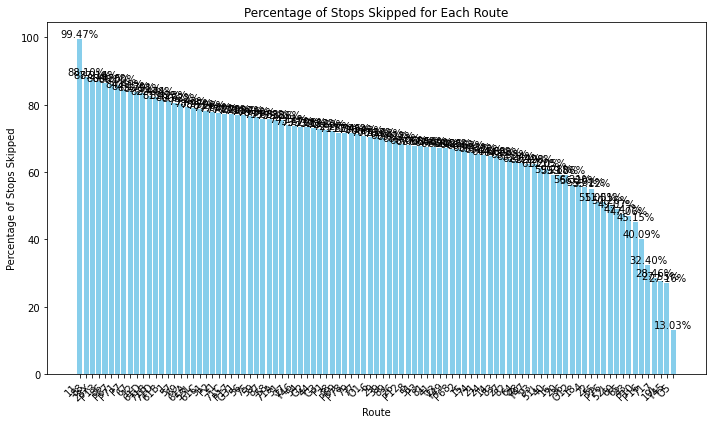

In [247]:
#route
sorted_routes = sorted([(route, 1 - route_result_collection[route].sum() / route_result_collection[route].size) for route in routes], key=lambda x: x[1], reverse=True)
for route, per_skipped in sorted_routes:
    print(f"For route {route:4}, {per_skipped*100:.2f}% stops will be skipped.")


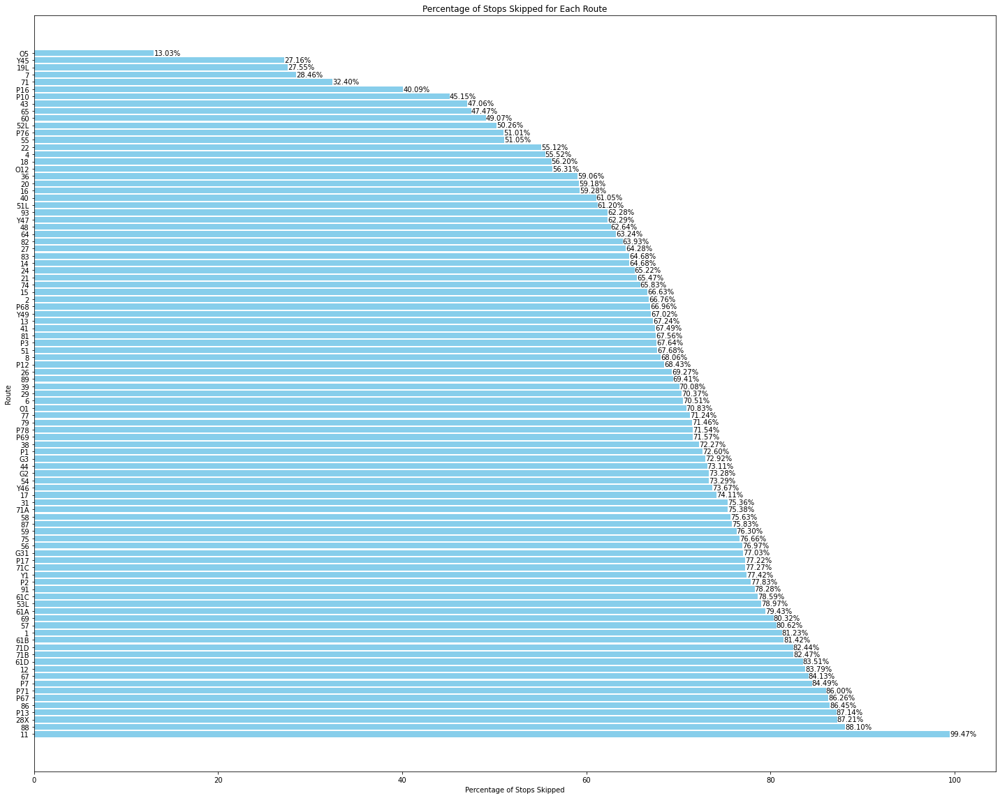

In [250]:

routes = [route for route, _ in sorted_routes]
per_skipped = [per_skipped for _, per_skipped in sorted_routes]

plt.figure(figsize=(20, 16))
plt.barh(routes, [x * 100 for x in per_skipped], color='skyblue')  # Use barh for horizontal bar plot
plt.xlabel('Percentage of Stops Skipped')
plt.ylabel('Route')
plt.title('Percentage of Stops Skipped for Each Route')

# Add values at the end of the bars
for i, value in enumerate(per_skipped):
    plt.text(value * 100, i, f'{value*100:.2f}%', ha='left', va='center')

plt.tight_layout()
plt.show()

Gather results for each stop.

In [196]:
# gather optimization results for each stop 
stop_passes = {}
for stop_id, routes_set in stop_routes_dict.items():
    total_count = 0
    for route in routes_set:
        if route in routes:
            i = routes.index(route)
            # make sure the stop is passed by the route
            if stop_id in R[route].columns:
                j = R[route].columns.get_loc(stop_id)
                for t in range(trips[route]):
                    total_count += int(X[i,j,t].x)
    stop_passes[stop_id] = total_count

In [197]:
count_1 = sum(value == 1 for value in stop_passes.values())
print("Number of stops that are only passed once:", count_1)

Number of stops that are only passed once: 27


In [198]:
count_3 = sum(value <= 3 for value in stop_passes.values())
print("Number of stops that are passed less than three times:", count_3)

Number of stops that are passed less than three times: 103


In [199]:
stop_passes_df = pd.DataFrame(list(stop_passes.items()), columns=['stop_id', 'stop_passes'])

In [200]:
stop_passes_merged = stop_map.merge(stop_passes_df, on = "stop_id")

In [201]:
stop_passes_merged['stop_passes'].describe()

count    3839.000000
mean       32.843970
std        52.743595
min         0.000000
25%        10.000000
50%        13.000000
75%        33.000000
max       755.000000
Name: stop_passes, dtype: float64

In [202]:
stop_passes_merged['log_stop_passes'] = np.log10(stop_passes_merged['stop_passes'] + 1)

Text(0.5, 0.98, 'log(1+stops) for Each Stop')

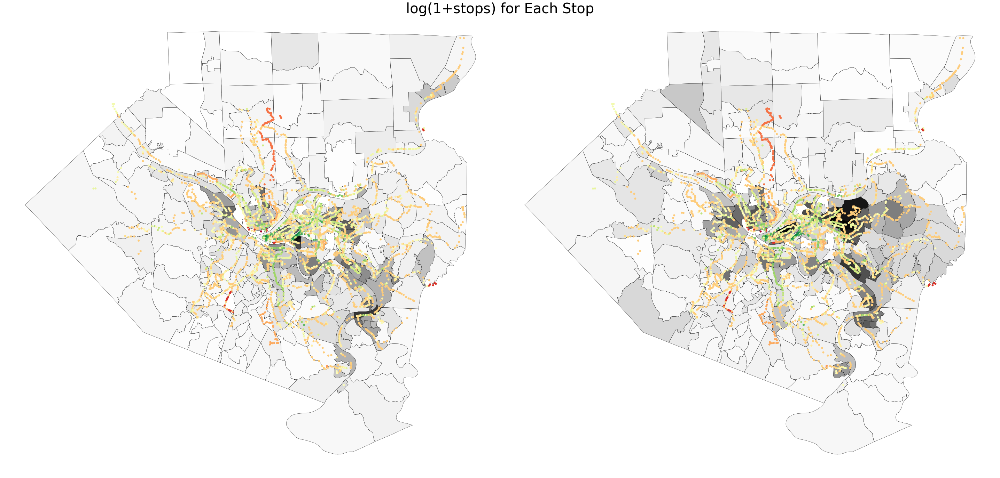

In [203]:
fig, ax = plt.subplots(1, 2, figsize = (40, 20))
#merged_tract.plot(ax = ax[0], alpha = 0.3, edgecolor = "black", linewidth = 0.5)#, edgecolor = "black")
merged_tract.plot(ax = ax[0], column = "poverty_rate", cmap = "Greys", edgecolor = "black", linewidth = 0.5)#, edgecolor = "black")
merged_tract.plot(ax = ax[1], column = "minority_rate", cmap = "Greys", edgecolor = "black", linewidth = 0.5)#, edgecolor = "black")

stop_passes_merged.plot(ax = ax[0],column = "log_stop_passes", cmap = "RdYlGn", markersize = 25)
stop_passes_merged.plot(ax = ax[1],column = "log_stop_passes", cmap = "RdYlGn", markersize = 25)

#ax[0].set_xlim(-80.05, -79.8)
#ax[0].set_ylim( 40.35, 40.46)
#ax[1].set_xlim(-80.05, -79.8)
#ax[1].set_ylim( 40.35, 40.46)
ax[0].set_axis_off()
ax[1].set_axis_off()
fig.tight_layout()
fig.suptitle("log(1+#passes) for Each Stop", fontsize = 40)

Gather and visualize the results for a sample route. You can pick any of the 95 active routes and see the stop probability for this route.

In [230]:
sample_route = '61D'
Rider = R[sample_route].astype(float)
policy = pd.DataFrame(data = route_result_collection[sample_route], 
                      index = Rider.columns, 
                      columns = np.arange(0, trips[sample_route]))

[Text(0.5, 1.0, '61D Policy Matrix: Whether to stop or not at each station over the operating hours'),
 Text(0.5, 69.0, 'The n-th trip over the operating hours'),
 Text(159.0, 0.5, 'Station IDs')]

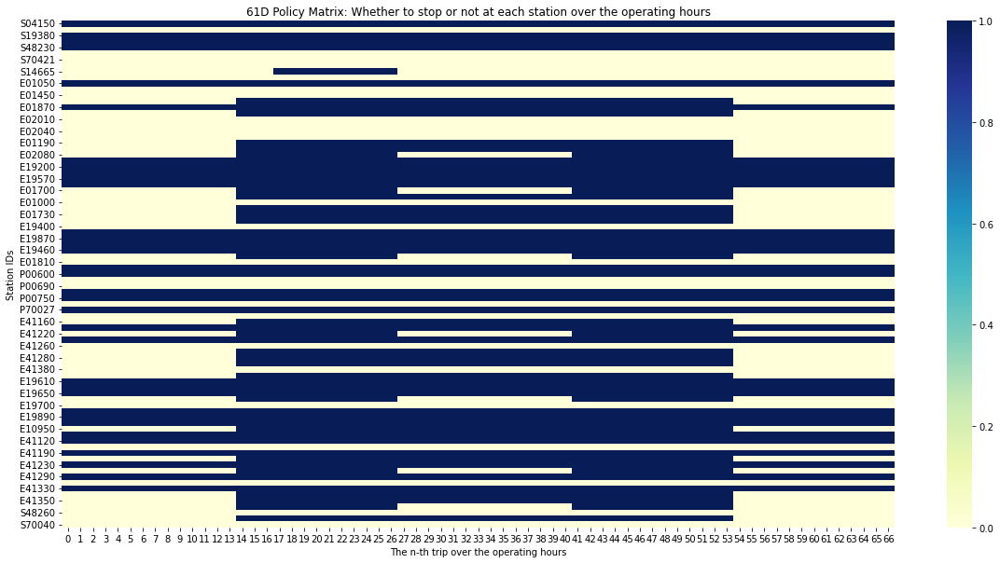

In [231]:
# visualize the policy matrix
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

ax = sns.heatmap(data = policy, cmap="YlGnBu")

ax.set(title = sample_route + " Policy Matrix: Whether to stop or not at each station over the operating hours", 
       xlabel = "The n-th trip over the operating hours", 
       ylabel = "Station IDs")

[Text(0.5, 1.0, 'Imputed average number of riders that get on 61D at each stop over the operating hours'),
 Text(0.5, 69.0, 'The n-th trip over the operating hours'),
 Text(159.0, 0.5, 'Station IDs')]

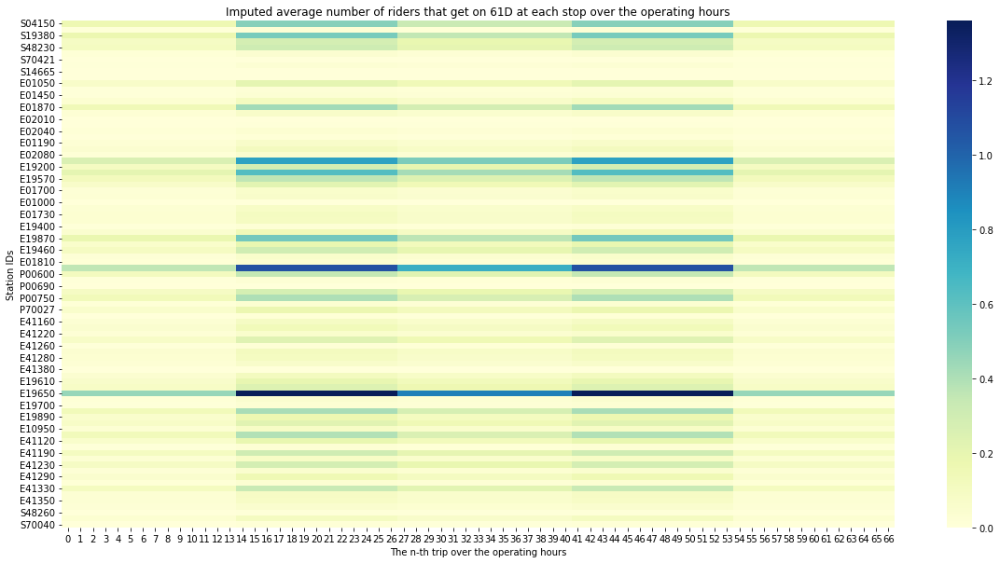

In [232]:
# plot the heatmap of the policy matrix
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

ax = sns.heatmap(data = Rider.T, cmap="YlGnBu")
#'E19650', 'S02910'
ax.set(title = "Imputed average number of riders that get on " + sample_route + " at each stop over the operating hours", 
       xlabel = "The n-th trip over the operating hours", 
       ylabel = "Station IDs")

In [233]:
sample_stop_prob = pd.DataFrame(policy.T.mean()).reset_index()

In [234]:
sample_stop_prob.columns = ['stop_id', 'stop_prob']

In [235]:
stop_map_merged = stop_map.merge(sample_stop_prob, on = "stop_id")

In [236]:
min_lon = min(stop_map_merged["longitude"]) - 0.01
max_lon = max(stop_map_merged["longitude"]) + 0.01
min_lat = min(stop_map_merged["latitude"]) - 0.01
max_lat = max(stop_map_merged["latitude"]) + 0.01

Text(0.5, 1.0, 'Stop Probability for 61D With Constraints')

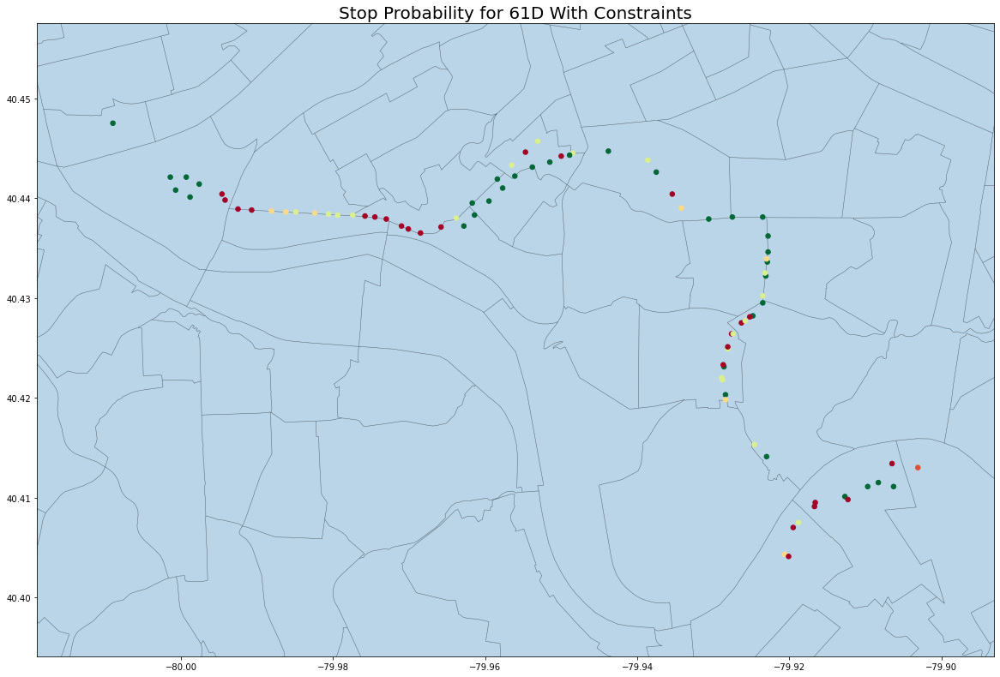

In [237]:
fig, ax = plt.subplots(1, 1, figsize = (20, 20))
merged_tract.plot(ax = ax, alpha = 0.3, edgecolor = "black", linewidth = 0.5)#, edgecolor = "black")
stop_map_merged.plot(ax = ax,column = "stop_prob", cmap = "RdYlGn", markersize = 30)

ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)
ax.set_title("Stop Probability for " + sample_route + " With Constraints", fontsize = 20)

Text(0.5, 0.98, 'Stop Probability for 61D With Constraints')

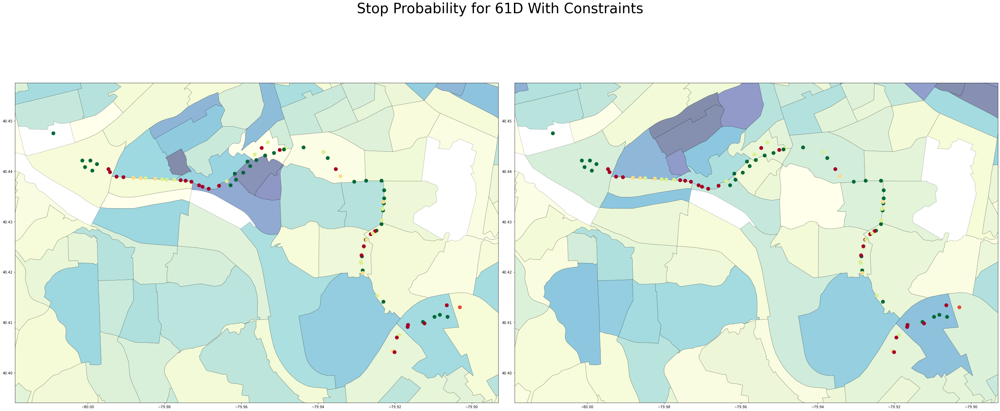

In [238]:
fig, ax = plt.subplots(1, 2, figsize = (40, 20))
#merged_tract.plot(ax = ax[0], alpha = 0.3, edgecolor = "black", linewidth = 0.5)#, edgecolor = "black")
merged_tract.plot(ax = ax[0], column = "poverty_rate", cmap = "YlGnBu",alpha = 0.5, edgecolor = "black", linewidth = 0.5)#, edgecolor = "black")
merged_tract.plot(ax = ax[1], column = "minority_rate", cmap = "YlGnBu", alpha = 0.5, edgecolor = "black", linewidth = 0.5)#, edgecolor = "black")

stop_map_merged.plot(ax = ax[0],column = "stop_prob", cmap = "RdYlGn", markersize = 100)
stop_map_merged.plot(ax = ax[1],column = "stop_prob", cmap = "RdYlGn", markersize = 100)

ax[0].set_xlim(min_lon, max_lon)
ax[0].set_ylim(min_lat, max_lat)
ax[1].set_xlim(min_lon, max_lon)
ax[1].set_ylim(min_lat, max_lat)
fig.tight_layout()
fig.suptitle("Stop Probability for " + sample_route + " With Constraints", fontsize = 40)

#### Limitations
Only included inbound and weekday

Data dictionary not clear, not sure about the meaning of certain columns

Instead of an assumption of 1 3 2 3 1 distribution of riders over the operating hours, we can use a smoother bimodal distribution.
#### Applications
Can be used to design new routes / reroute / merge routes/ remove stops / add shelters at popular stops